## Sección 0 — Grupo de evaluación y universo disponible

**Pregunta analítica:**  
¿Qué corridas componen el grupo de evaluación y qué información está visible en sus `summary.xlsx` y `metadata.json`?

**Criterio:**  
El notebook no valida completitud ni compatibilidad.  
El usuario asegura que el grupo es comparable.  
Si falta un archivo requerido o una columna declarada, la celda falla.

**Salidas principales:**

- `selected_run_dirs`
- `run_file_inventory_df`
- `summary_by_run`
- `metadata_by_run`
- `summary_df`
- `summary_columns_master_df`
- `metadata_master_df`
- `metadata_changed_df`

### 0.1 Imports y estilo gráfico reutilizable

In [18]:
from pathlib import Path
import json
import math
import textwrap
from collections import OrderedDict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown


# ---------------------------------------------------------------------
# Estilo científico base
# ---------------------------------------------------------------------

def set_project_plot_style(
    base_font_size=10,
    title_font_size=12,
    label_font_size=10,
    tick_font_size=8,
    legend_font_size=8,
    dpi=140,
):
    """
    Estilo global reutilizable para el notebook.
    Se mantiene sobrio para que las figuras puedan refinarse luego
    sin reescribir cada celda.
    """
    plt.rcParams.update({
        "figure.dpi": dpi,
        "savefig.dpi": dpi,
        "font.size": base_font_size,
        "axes.titlesize": title_font_size,
        "axes.labelsize": label_font_size,
        "xtick.labelsize": tick_font_size,
        "ytick.labelsize": tick_font_size,
        "legend.fontsize": legend_font_size,
        "axes.grid": True,
        "grid.alpha": 0.25,
        "axes.spines.top": False,
        "axes.spines.right": False,
        "figure.constrained_layout.use": True,
    })


def format_axis(
    ax,
    title=None,
    xlabel=None,
    ylabel=None,
    grid=True,
    zero_line=False,
):
    """
    Formato mínimo y consistente de ejes.
    """
    if title is not None:
        ax.set_title(title)

    if xlabel is not None:
        ax.set_xlabel(xlabel)

    if ylabel is not None:
        ax.set_ylabel(ylabel)

    ax.grid(grid, alpha=0.25)

    if zero_line:
        ax.axhline(0.0, linewidth=0.8, alpha=0.6)

    return ax


def shorten_label(value, max_len=28):
    """
    Acorta etiquetas largas manteniendo legibilidad.
    """
    text = str(value)
    if len(text) <= max_len:
        return text
    return text[:max_len - 1] + "…"


def wrap_label(value, width=36):
    """
    Envuelve texto para títulos o tablas.
    """
    return "\n".join(textwrap.wrap(str(value), width=width))


def add_value_labels(
    ax,
    x_values,
    y_values,
    labels,
    dx=4,
    dy=4,
    fontsize=7,
    max_labels=40,
):
    """
    Agrega etiquetas a puntos. Para evitar ruido, limita el número.
    """
    if len(labels) > max_labels:
        return ax

    for x, y, label in zip(x_values, y_values, labels):
        ax.annotate(
            shorten_label(label),
            (x, y),
            xytext=(dx, dy),
            textcoords="offset points",
            fontsize=fontsize,
            alpha=0.85,
        )

    return ax


def minmax_normalize(series, invert=False):
    """
    Normalización min-max segura para scoring visual.
    """
    values = pd.Series(series).astype(float)
    span = values.max() - values.min()

    if not np.isfinite(span) or span == 0:
        out = pd.Series(np.ones(len(values)), index=values.index)
    else:
        out = (values - values.min()) / span

    if invert:
        out = 1.0 - out

    return out


def save_current_figure(filename=None, output_dir=None):
    """
    Guardado opcional. No guarda nada si filename es None.
    """
    if filename is None:
        return

    output_dir = Path(output_dir or ".")
    output_dir.mkdir(parents=True, exist_ok=True)

    path = output_dir / filename
    plt.savefig(path, bbox_inches="tight")
    print(f"Figura guardada en: {path}")


set_project_plot_style()

pd.set_option("display.max_columns", 180)
pd.set_option("display.max_rows", 250)
pd.set_option("display.max_colwidth", 180)

### 0.2 Configuración local del grupo

In [19]:
# ---------------------------------------------------------------------
# Configuración de grupo
# ---------------------------------------------------------------------
# Esta carpeta debe contener directamente las carpetas de simulación.
# Ejemplo típico:
#   results_history_CartPole/cart_pole/
#     ├── 20260511_1756_POI/
#     ├── 20260512_1046_POI2/
#     └── ...
# ---------------------------------------------------------------------

EVALUATION_GROUP_DIR = Path("results_history_CartPole") / "cart_pole"

SUMMARY_NAME = "summary.xlsx"
METADATA_NAME = "metadata.json"

RUN_SELECTION_MODE = "explicit"      # "all" | "last_n" | "explicit"
N_LAST_RUNS = 8

EXPLICIT_RUN_IDS = [
    "20260511_1756_POI",
    "20260512_1046_POI2",
]

GROUP_LABEL = "grupo_evaluacion_actual"

# Carpeta opcional para guardar figuras del notebook.
FIG_OUTPUT_DIR = Path("notebook_figures") / GROUP_LABEL

### 0.3 Helpers de lectura, columnas y metadata canónica

In [20]:
# ---------------------------------------------------------------------
# Helpers de lectura directa
# ---------------------------------------------------------------------

def discover_run_dirs(group_dir):
    """
    Lista carpetas de corrida dentro del grupo.
    No evalúa completitud.
    """
    group_dir = Path(group_dir).expanduser().resolve()
    return sorted([p for p in group_dir.iterdir() if p.is_dir()], key=lambda p: p.name)


def select_run_dirs(run_dirs, mode="all", n_last=8, explicit_run_ids=None):
    """
    Selección local de corridas.
    """
    explicit_run_ids = explicit_run_ids or []

    if mode == "all":
        return list(run_dirs)

    if mode == "last_n":
        ordered = sorted(run_dirs, key=lambda p: p.stat().st_mtime)
        return ordered[-int(n_last):]

    if mode == "explicit":
        by_name = {p.name: p for p in run_dirs}
        return [by_name[run_id] for run_id in explicit_run_ids]

    raise ValueError('RUN_SELECTION_MODE debe ser "all", "last_n" o "explicit".')


def read_summary(run_dir):
    """
    Lectura directa del summary.
    """
    return pd.read_excel(Path(run_dir) / SUMMARY_NAME)


def read_metadata(run_dir):
    """
    Lectura directa de metadata.
    """
    return json.loads((Path(run_dir) / METADATA_NAME).read_text(encoding="utf-8"))


def flatten_dict(value, parent_key="", sep="."):
    """
    Aplana metadata anidada.
    Listas se expanden por índice para conservar ruta canónica.
    """
    items = {}

    if isinstance(value, dict):
        for key, child in value.items():
            new_key = f"{parent_key}{sep}{key}" if parent_key else str(key)
            items.update(flatten_dict(child, new_key, sep=sep))

    elif isinstance(value, list):
        if len(value) == 0:
            items[parent_key] = []
        else:
            for idx, child in enumerate(value):
                new_key = f"{parent_key}{sep}{idx}" if parent_key else str(idx)
                items.update(flatten_dict(child, new_key, sep=sep))

    else:
        items[parent_key] = value

    return items


def value_to_text(value, max_len=180):
    """
    Representación estable para tablas.
    """
    if isinstance(value, float):
        if np.isfinite(value):
            return f"{value:.12g}"
        return str(value)

    text = json.dumps(value, ensure_ascii=False, sort_keys=True, default=str)

    if len(text) > max_len:
        return text[:max_len] + "..."

    return text


# ---------------------------------------------------------------------
# Clasificación de columnas summary
# ---------------------------------------------------------------------

def classify_summary_column(column_name):
    """
    Clasificación descriptiva de columnas disponibles en summary.
    No decide si una columna se usará analíticamente.
    """
    c = str(column_name).lower()

    if c in ["run_id", "episode_id"]:
        return "identity"

    if "termination" in c or "terminated" in c:
        return "termination"

    if (
        "reward" in c
        or "bonus" in c
        or c.startswith("l_")
        or "lagrangian" in c
        or "principal" in c
        or "extra_" in c
        or "coordination" in c
    ):
        return "reward"

    if (
        "epsilon" in c
        or "learning_rate" in c
        or "q_" in c
        or "td_error" in c
        or "visits" in c
    ):
        return "learning"

    if "pendulum" in c:
        return "pendulum"

    if "cart" in c:
        return "cart"

    if "error" in c:
        return "error"

    if (
        "duration" in c
        or "t_sec" in c
        or "step" in c
        or "interval" in c
        or "decision" in c
    ):
        return "duration_time"

    if (
        "kp_" in c
        or "ki_" in c
        or "kd_" in c
        or "control" in c
        or "u_" in c
        or "satur" in c
    ):
        return "control"

    return "other"


def build_summary_columns_master(summary_by_run):
    """
    Tabla maestra long-format de columnas disponibles en summary.
    """
    rows = []

    for run_id, frame in summary_by_run.items():
        for order, column in enumerate(frame.columns):
            rows.append({
                "run_id": run_id,
                "column_order": order,
                "column": column,
                "summary_family": classify_summary_column(column),
                "dtype": str(frame[column].dtype),
                "non_null": int(frame[column].notna().sum()),
                "n_unique": int(frame[column].nunique(dropna=False)),
            })

    return pd.DataFrame(rows)


def build_run_file_inventory(run_dirs):
    """
    Expone archivos visibles en cada carpeta de corrida.
    No valida si son suficientes.
    """
    rows = []

    for run_dir in run_dirs:
        files = sorted([p.name for p in run_dir.iterdir() if p.is_file()])

        rows.append({
            "run_id": run_dir.name,
            "run_path": str(run_dir),
            "n_files_visible": len(files),
            "files_visible_preview": ", ".join(files[:40]),
            "folder_last_modified": pd.to_datetime(run_dir.stat().st_mtime, unit="s"),
        })

    return pd.DataFrame(rows)


# ---------------------------------------------------------------------
# Metadata canónica
# ---------------------------------------------------------------------

def classify_metadata_path(metadata_path):
    """
    Clasifica paths aplanados de metadata en llaves canónicas útiles.
    Retorna campos estructurados para tabla maestra.
    """
    path = str(metadata_path)

    source = "metadata"
    subsystem = "other"
    block = "other"
    variable_type = "other"
    variable = path

    # Remover prefijos para facilitar lectura.
    if path.startswith("config_main."):
        short = path.replace("config_main.", "", 1)
        source = "config_main"
    elif path.startswith("config_data_summary."):
        short = path.replace("config_data_summary.", "", 1)
        source = "config_data_summary"
    elif path.startswith("config_visualization."):
        short = path.replace("config_visualization.", "", 1)
        source = "config_visualization"
    else:
        short = path

    parts = short.split(".")

    # simulation
    if short.startswith("simulation."):
        subsystem = "simulation"
        block = "simulation"
        variable_type = "simulation_timing"
        variable = short.replace("simulation.", "", 1)

    # dynamic_system
    elif short.startswith("dynamic_system.params."):
        subsystem = "dynamic_system"
        block = "physics_params"
        variable_type = "physical_parameter"
        variable = short.replace("dynamic_system.params.", "", 1)

    elif short.startswith("dynamic_system.initial_conditions."):
        subsystem = "dynamic_system"
        block = "initial_conditions"
        variable_type = "initial_condition"
        variable = short.replace("dynamic_system.initial_conditions.", "", 1)

    elif short.startswith("dynamic_system.state_normalization."):
        subsystem = "dynamic_system"
        block = "state_normalization"
        variable_type = "normalization_parameter"
        variable = short.replace("dynamic_system.state_normalization.", "", 1)

    elif short.startswith("dynamic_system.termination_conditions."):
        subsystem = "dynamic_system"
        block = "termination_conditions"
        variable_type = "termination_parameter"
        variable = short.replace("dynamic_system.termination_conditions.", "", 1)

    elif short.startswith("dynamic_system.reference_system_correction."):
        subsystem = "dynamic_system"
        block = "reference_system_correction"
        variable_type = "reference_correction"
        variable = short.replace("dynamic_system.reference_system_correction.", "", 1)

    elif short.startswith("dynamic_system."):
        subsystem = "dynamic_system"
        block = "dynamic_system_core"
        variable_type = "dynamic_system_parameter"
        variable = short.replace("dynamic_system.", "", 1)

    # controller_base
    elif short.startswith("controller_base.controllers."):
        subsystem = "controller"
        block = "controller_definition"
        variable_type = "controller_parameter"

        controller_tail = short.replace("controller_base.controllers.", "", 1)
        variable = controller_tail

        if ".initial_conditions." in controller_tail:
            block = "controller_initial_conditions"
            variable_type = "pid_initial_gain"

        elif ".params.anti_windup." in controller_tail:
            block = "controller_anti_windup"
            variable_type = "anti_windup_parameter"

        elif ".params." in controller_tail:
            block = "controller_params"
            variable_type = "pid_control_parameter"

    elif short.startswith("controller_base.global_actuator"):
        subsystem = "controller"
        block = "global_actuator"
        variable_type = "actuator_parameter"
        variable = short.replace("controller_base.", "", 1)

    elif short.startswith("controller_base."):
        subsystem = "controller"
        block = "controller_base"
        variable_type = "controller_base_parameter"
        variable = short.replace("controller_base.", "", 1)

    # agent_base
    elif short.startswith("agent_base.params."):
        subsystem = "agent"
        block = "rl_learning_params"
        variable_type = "rl_hyperparameter"
        variable = short.replace("agent_base.params.", "", 1)

    elif short.startswith("agent_base.agent_config.actions."):
        subsystem = "agent"
        block = "action_space"
        variable_type = "action_parameter"
        variable = short.replace("agent_base.agent_config.actions.", "", 1)

    elif short.startswith("agent_base.agent_config.agents."):
        subsystem = "agent"
        block = "agent_definitions"
        variable_type = "agent_parameter"
        variable = short.replace("agent_base.agent_config.agents.", "", 1)

    elif short.startswith("agent_base."):
        subsystem = "agent"
        block = "agent_base"
        variable_type = "agent_base_parameter"
        variable = short.replace("agent_base.", "", 1)

    # reward_base
    elif short.startswith("reward_base.reward_config."):
        subsystem = "reward"
        block = "reward_assignment"
        variable_type = "reward_assignment_parameter"
        variable = short.replace("reward_base.reward_config.", "", 1)

    elif short.startswith("reward_base.reward_calculation.metric_processing."):
        subsystem = "reward"
        block = "metric_processing"
        variable_type = "reward_normalization_parameter"
        variable = short.replace("reward_base.reward_calculation.metric_processing.", "", 1)

    elif short.startswith("reward_base.reward_calculation.principal_reward."):
        subsystem = "reward"
        block = "principal_reward"
        variable_type = "principal_reward_parameter"
        variable = short.replace("reward_base.reward_calculation.principal_reward.", "", 1)

    elif short.startswith("reward_base.reward_calculation.extra_rewards."):
        subsystem = "reward"
        block = "extra_rewards"
        variable_type = "extra_reward_parameter"
        variable = short.replace("reward_base.reward_calculation.extra_rewards.", "", 1)

    elif short.startswith("reward_base.reward_calculation.coordination_reward."):
        subsystem = "reward"
        block = "coordination_reward"
        variable_type = "coordination_reward_parameter"
        variable = short.replace("reward_base.reward_calculation.coordination_reward.", "", 1)

    elif short.startswith("reward_base."):
        subsystem = "reward"
        block = "reward_base"
        variable_type = "reward_base_parameter"
        variable = short.replace("reward_base.", "", 1)

    # data summary / visualization
    elif source == "config_data_summary":
        subsystem = "data_summary"
        block = parts[0] if parts else "data_summary"
        variable_type = "summary_parameter"
        variable = short

    elif source == "config_visualization":
        subsystem = "visualization"
        block = parts[0] if parts else "visualization"
        variable_type = "visualization_parameter"
        variable = short

    canonical_key = f"{source}.{subsystem}.{block}.{variable}"

    return {
        "source": source,
        "subsystem": subsystem,
        "block": block,
        "variable_type": variable_type,
        "variable": variable,
        "canonical_key": canonical_key,
    }


def build_metadata_master(metadata_by_run):
    """
    Construye tabla maestra long-format de metadata.
    Columnas principales:
    run_id, source, subsystem, block, variable_type, variable, value.
    """
    rows = []

    for run_id, metadata in metadata_by_run.items():
        flat = flatten_dict(metadata)

        for metadata_path, value in flat.items():
            cls = classify_metadata_path(metadata_path)

            rows.append({
                "run_id": run_id,
                "metadata_path": metadata_path,
                **cls,
                "value": value,
                "value_text": value_to_text(value),
            })

    return pd.DataFrame(rows)


def build_metadata_change_summary(metadata_master_df):
    """
    Resume cantidad de valores únicos por variable canónica.
    """
    change_df = (
        metadata_master_df
        .groupby(
            [
                "source",
                "subsystem",
                "block",
                "variable_type",
                "variable",
                "metadata_path",
                "canonical_key",
            ],
            as_index=False,
        )
        .agg(
            n_runs_visible=("run_id", "nunique"),
            n_unique_values=("value_text", "nunique"),
            example_value=("value_text", "first"),
        )
        .sort_values(
            [
                "subsystem",
                "block",
                "variable_type",
                "variable",
            ]
        )
        .reset_index(drop=True)
    )

    return change_df


def filter_changed_metadata(metadata_master_df):
    """
    Retorna tabla long-format solo con parámetros que cambian entre corridas.
    """
    change_summary_df = build_metadata_change_summary(metadata_master_df)

    changed_keys = (
        change_summary_df
        .loc[change_summary_df["n_unique_values"] > 1, "metadata_path"]
        .tolist()
    )

    return (
        metadata_master_df
        .loc[metadata_master_df["metadata_path"].isin(changed_keys)]
        .sort_values(
            [
                "subsystem",
                "block",
                "variable_type",
                "variable",
                "run_id",
            ]
        )
        .reset_index(drop=True)
    )


def show_metadata_table(
    metadata_df,
    subsystem=None,
    block=None,
    variable_type=None,
    contains=None,
    only_changed=False,
    max_rows=200,
):
    """
    Vista filtrada de metadata maestra.
    """
    frame = metadata_df.copy()

    if only_changed:
        frame = filter_changed_metadata(frame)

    if subsystem is not None:
        frame = frame.loc[frame["subsystem"].isin(np.atleast_1d(subsystem))]

    if block is not None:
        frame = frame.loc[frame["block"].isin(np.atleast_1d(block))]

    if variable_type is not None:
        frame = frame.loc[frame["variable_type"].isin(np.atleast_1d(variable_type))]

    if contains is not None:
        pattern = str(contains)
        frame = frame.loc[
            frame["metadata_path"].str.contains(pattern, case=False, regex=True)
            | frame["variable"].str.contains(pattern, case=False, regex=True)
        ]

    display_cols = [
        "run_id",
        "subsystem",
        "block",
        "variable_type",
        "variable",
        "value_text",
    ]

    display(frame[display_cols].head(max_rows))
    return frame

### 0.4 Carga directa del grupo y exposición inicial

In [21]:
# ---------------------------------------------------------------------
# Carga directa.
# Si una corrida seleccionada no tiene summary.xlsx o metadata.json,
# esta celda falla.
# ---------------------------------------------------------------------

all_run_dirs = discover_run_dirs(EVALUATION_GROUP_DIR)

selected_run_dirs = select_run_dirs(
    all_run_dirs,
    mode=RUN_SELECTION_MODE,
    n_last=N_LAST_RUNS,
    explicit_run_ids=EXPLICIT_RUN_IDS,
)

run_file_inventory_df = build_run_file_inventory(selected_run_dirs)

summary_by_run = {
    run_dir.name: read_summary(run_dir)
    for run_dir in selected_run_dirs
}

metadata_by_run = {
    run_dir.name: read_metadata(run_dir)
    for run_dir in selected_run_dirs
}

summary_df = pd.concat(
    [
        frame.assign(run_id=run_id)
        for run_id, frame in summary_by_run.items()
    ],
    ignore_index=True,
    sort=False,
)

summary_df = summary_df[
    ["run_id", *[c for c in summary_df.columns if c != "run_id"]]
]

summary_columns_master_df = build_summary_columns_master(summary_by_run)
metadata_master_df = build_metadata_master(metadata_by_run)
metadata_change_summary_df = build_metadata_change_summary(metadata_master_df)
metadata_changed_df = filter_changed_metadata(metadata_master_df)


display(Markdown("### Corridas seleccionadas y archivos visibles"))
display(run_file_inventory_df)

display(Markdown("### Forma de cada summary.xlsx"))
display(
    pd.DataFrame([
        {
            "run_id": run_id,
            "n_summary_rows": frame.shape[0],
            "n_summary_columns": frame.shape[1],
            "episode_min": frame["episode_id"].min(),
            "episode_max": frame["episode_id"].max(),
        }
        for run_id, frame in summary_by_run.items()
    ])
)

display(Markdown("### Columnas disponibles en summary.xlsx, agrupadas por familia"))
display(
    summary_columns_master_df
    .groupby(["summary_family", "column"], as_index=False)
    .agg(
        n_runs_visible=("run_id", "nunique"),
        dtypes=("dtype", lambda s: ", ".join(sorted(set(map(str, s))))),
        non_null_min=("non_null", "min"),
        non_null_max=("non_null", "max"),
        n_unique_min=("n_unique", "min"),
        n_unique_max=("n_unique", "max"),
    )
    .sort_values(["summary_family", "column"])
    .reset_index(drop=True)
)

display(Markdown("### Conteo de metadata por subsistema / bloque / tipo"))
display(
    metadata_master_df
    .groupby(["subsystem", "block", "variable_type"], as_index=False)
    .agg(
        n_variables=("metadata_path", "nunique"),
        n_rows=("metadata_path", "size"),
    )
    .sort_values(["subsystem", "block", "variable_type"])
)

display(Markdown("### Parámetros de metadata que cambian entre corridas — resumen"))
display(
    metadata_change_summary_df
    .loc[metadata_change_summary_df["n_unique_values"] > 1]
    .sort_values(["subsystem", "block", "variable_type", "variable"])
    .reset_index(drop=True)
)

### Corridas seleccionadas y archivos visibles

,run_id,run_path,n_files_visible,files_visible_preview,folder_last_modified
0,20260511_1756_POI,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI,62,"agent_state_ep_1999.xlsx, agent_state_ep_3999.xlsx, data_heatmaps.xlsx, episodes_chunks_0000.json, episodes_chunks_0001.json, episodes_chunks_0002.json, episodes_chunks_0003.js...",2026-05-11 21:01:04.013159513
1,20260512_1046_POI2,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260512_1046_POI2,62,"agent_state_ep_1999.xlsx, agent_state_ep_3999.xlsx, data_heatmaps.xlsx, episodes_chunks_0000.json, episodes_chunks_0001.json, episodes_chunks_0002.json, episodes_chunks_0003.js...",2026-05-14 14:08:53.711384773


### Forma de cada summary.xlsx

,run_id,n_summary_rows,n_summary_columns,episode_min,episode_max
0,20260511_1756_POI,5000,669,0,4999
1,20260512_1046_POI2,5000,669,0,4999


### Columnas disponibles en summary.xlsx, agrupadas por familia

,summary_family,column,n_runs_visible,dtypes,non_null_min,non_null_max,n_unique_min,n_unique_max
0,cart,cart_force_max,2,float64,5000,5000,2412,3009
1,cart,cart_force_mean,2,float64,5000,5000,5000,5000
2,cart,cart_force_min,2,float64,5000,5000,4654,4669
3,cart,cart_force_p25,2,float64,5000,5000,5000,5000
4,cart,cart_force_p50,2,float64,5000,5000,4997,5000
...,...,...,...,...,...,...,...,...
664,reward,reward_kp_pendulum_angle_p50,2,float64,5000,5000,4949,4984
665,reward,reward_kp_pendulum_angle_p75,2,float64,5000,5000,4990,4995
666,reward,reward_kp_pendulum_angle_std,2,float64,5000,5000,5000,5000
667,reward,total_reward,2,float64,5000,5000,5000,5000


### Conteo de metadata por subsistema / bloque / tipo

,subsystem,block,variable_type,n_variables,n_rows
0,agent,action_space,action_parameter,11,22
1,agent,agent_base,agent_base_parameter,3,6
2,agent,agent_definitions,agent_parameter,34,68
3,agent,rl_learning_params,rl_hyperparameter,10,20
4,controller,controller_anti_windup,anti_windup_parameter,6,12
5,controller,controller_base,controller_base_parameter,1,2
6,controller,controller_definition,controller_parameter,6,12
7,controller,controller_initial_conditions,pid_initial_gain,6,12
8,controller,controller_params,pid_control_parameter,6,12
9,controller,global_actuator,actuator_parameter,3,6


### Parámetros de metadata que cambian entre corridas — resumen

,source,subsystem,block,variable_type,variable,metadata_path,canonical_key,n_runs_visible,n_unique_values,example_value
0,metadata,other,other,other,run_id,run_id,metadata.other.other.run_id,2,2,"""run_20260511_1756"""
1,metadata,other,other,other,timestamp,timestamp,metadata.other.other.timestamp,2,2,"""20260511_1756"""
2,config_main,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_e.weight,config_main.reward_base.reward_calculation.principal_reward.weighted_exponential_params.features.L_e.weight,config_main.reward.principal_reward.weighted_exponential_params.features.L_e.weight,2,2,0.6
3,config_main,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_edot.weight,config_main.reward_base.reward_calculation.principal_reward.weighted_exponential_params.features.L_edot.weight,config_main.reward.principal_reward.weighted_exponential_params.features.L_edot.weight,2,2,0.35


### 0.5 Vistas estructuradas de metadata cambiante

In [22]:
# ---------------------------------------------------------------------
# Estas vistas son tablas resumen limpias.
# No reprocesan metadata; solo filtran metadata_master_df.
# ---------------------------------------------------------------------

display(Markdown("### Metadata cambiante — reward"))
reward_changed_metadata_df = show_metadata_table(
    metadata_master_df,
    subsystem="reward",
    only_changed=True,
    max_rows=300,
)

display(Markdown("### Metadata cambiante — normalización"))
normalization_changed_metadata_df = show_metadata_table(
    metadata_master_df,
    contains="normalization|range|output_limits|metric_processing",
    only_changed=True,
    max_rows=300,
)

display(Markdown("### Metadata cambiante — controlador / actuador"))
controller_changed_metadata_df = show_metadata_table(
    metadata_master_df,
    subsystem="controller",
    only_changed=True,
    max_rows=300,
)

display(Markdown("### Metadata cambiante — agente RL"))
agent_changed_metadata_df = show_metadata_table(
    metadata_master_df,
    subsystem="agent",
    only_changed=True,
    max_rows=300,
)

display(Markdown("### Metadata cambiante — sistema dinámico"))
dynamic_system_changed_metadata_df = show_metadata_table(
    metadata_master_df,
    subsystem="dynamic_system",
    only_changed=True,
    max_rows=300,
)

### Metadata cambiante — reward

,run_id,subsystem,block,variable_type,variable,value_text
4,20260511_1756_POI,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_e.weight,0.6
5,20260512_1046_POI2,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_e.weight,0.65
6,20260511_1756_POI,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_edot.weight,0.35
7,20260512_1046_POI2,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_edot.weight,0.3


### Metadata cambiante — normalización

,run_id,subsystem,block,variable_type,variable,value_text


### Metadata cambiante — controlador / actuador

,run_id,subsystem,block,variable_type,variable,value_text


### Metadata cambiante — agente RL

,run_id,subsystem,block,variable_type,variable,value_text


### Metadata cambiante — sistema dinámico

,run_id,subsystem,block,variable_type,variable,value_text


## Sección 1 — Comparación por etapas para seleccionar simulación

**Pregunta analítica general:**  
¿Qué simulaciones merecen investigarse considerando la historia del entrenamiento y no solo un resumen global?

**Criterio:**  
Cada simulación se separa en etapas de entrenamiento definidas por el usuario.  
La comparación principal se realiza sobre `run_id × training_stage`.

**Preguntas que deben responder los gráficos:**

1. ¿Qué corrida mejora, empeora o cambia de régimen entre etapas?
2. ¿La mejora de reward coincide con más duración?
3. ¿La mejora de reward coincide con menor error físico?
4. ¿Qué etapa revela contradicciones entre reward y física?
5. ¿Qué razones de término dominan en cada etapa?
6. ¿Qué parámetros cambiantes de metadata podrían explicar esas diferencias?

### 1.1 Configuración explícita de variables y etapas

In [41]:
# ---------------------------------------------------------------------
# Columnas analíticas.
# Editar mirando summary_columns_master_df.
# Si una columna declarada no existe, el notebook falla.
# ---------------------------------------------------------------------

EPISODE_COL = "episode_id"

REWARD_COL = "total_reward"
DURATION_COL = "total_agent_decisions"
TERMINATION_COL = "end_termination_reason"

PENDULUM_ERROR_COLS = [
    "error_pendulum_angle_rms_mean",
]

CART_ERROR_COLS = [
    "error_cart_position_rms_mean",
]

LEARNING_COLS = [
    "epsilon",
    "learning_rate",
]

# Peso solo para score combinado auxiliar.
# Las figuras importantes siguen mostrando péndulo y carro por separado.
PENDULUM_ERROR_WEIGHT = 1.0
CART_ERROR_WEIGHT = 1.0


# ---------------------------------------------------------------------
# Etapas de entrenamiento definidas por el usuario.
# Usar rangos inclusivos de episode_id.
# Ajustar estos rangos al experimento.
# ---------------------------------------------------------------------

TRAINING_STAGES = [
    {
        "stage_id": "S1_exploration",
        "stage_label": "S1 exploration",
        "episode_min": 0,
        "episode_max": 1999,
    },
    {
        "stage_id": "S2_transition",
        "stage_label": "S2 transition",
        "episode_min": 2000,
        "episode_max": 3999,
    },
    {
        "stage_id": "S3_explotation",
        "stage_label": "S3 explotation",
        "episode_min": 4000,
        "episode_max": 4999,
    }
]


# ---------------------------------------------------------------------
# Métricas disponibles después de build_stage_kpi_df()
# ---------------------------------------------------------------------
# Para reward:
#   reward_mean, reward_median, reward_q10, reward_q25, reward_q75, reward_q90,
#   reward_std, reward_min, reward_max
#
# Para duración:
#   duration_mean, duration_median, duration_q10, duration_q25, duration_q75,
#   duration_q90, duration_max
#
# Para errores:
#   pendulum_error_mean, pendulum_error_median, pendulum_error_q10,
#   pendulum_error_q25, pendulum_error_q75, pendulum_error_q90
#
#   cart_error_mean, cart_error_median, cart_error_q10,
#   cart_error_q25, cart_error_q75, cart_error_q90
#
#   physical_error_mean, physical_error_median, physical_error_q10,
#   physical_error_q25, physical_error_q75, physical_error_q90
#
# Para aprendizaje, si existen en summary:
#   epsilon_first, epsilon_last, epsilon_mean
#   learning_rate_first, learning_rate_last, learning_rate_mean
#
# Sí, puedes usar percentiles.
# Recomendación práctica:
#   - median + q25/q75 para comparar comportamiento típico robusto.
#   - q10/q90 para observar colas o episodios extremos.
#   - mean si quieres sensibilidad a outliers.
#   - max/min solo si buscas eventos extremos explícitos.
# ---------------------------------------------------------------------


# Métricas donde menor significa mejor.
# Se usan solo para scores auxiliares o selección interpretativa.
LOWER_IS_BETTER_STAGE_METRICS = {
    "pendulum_error_mean",
    "pendulum_error_median",
    "pendulum_error_q75",
    "pendulum_error_q90",

    "cart_error_mean",
    "cart_error_median",
    "cart_error_q75",
    "cart_error_q90",

    "physical_error_mean",
    "physical_error_median",
    "physical_error_q75",
    "physical_error_q90",

    # Opcional si luego agregas estas columnas:
    # "reward_std",                 # menor variabilidad puede ser deseable
    # "saturation_ratio_mean",       # menor saturación suele ser mejor
    # "limit_exceeded_ratio",        # menor fallo por límite físico es mejor
}


# Métricas núcleo para comparar por etapa.
# Puedes cambiarlas por q75/q90 si quieres castigar etapas con episodios malos.
CORE_STAGE_METRICS = [
    "reward_median",
    "duration_median",
    "pendulum_error_median",
    "cart_error_median",
    "physical_error_median",
]


# ---------------------------------------------------------------------
# Configuración de la figura principal de historia por etapas.
# Cada entrada genera un panel dentro de UNA sola imagen.
# ---------------------------------------------------------------------

STAGE_PROFILE_SPECS = [
    {
        "value_col": "reward_median",
        "q_low_col": "reward_q25",
        "q_high_col": "reward_q75",
        "title": "Reward por etapa",
        "ylabel": "reward mediana [IQR]",
        "zero_line": True,
    },
    {
        "value_col": "duration_median",
        "q_low_col": "duration_q25",
        "q_high_col": "duration_q75",
        "title": "Duración por etapa",
        "ylabel": "decisiones por episodio, mediana [IQR]",
        "zero_line": False,
    },
    {
        "value_col": "pendulum_error_median",
        "q_low_col": "pendulum_error_q25",
        "q_high_col": "pendulum_error_q75",
        "title": "Error del péndulo por etapa",
        "ylabel": "error péndulo, mediana [IQR]",
        "zero_line": False,
    },
    {
        "value_col": "cart_error_median",
        "q_low_col": "cart_error_q25",
        "q_high_col": "cart_error_q75",
        "title": "Error del carro por etapa",
        "ylabel": "error carro, mediana [IQR]",
        "zero_line": False,
    },
]


# ---------------------------------------------------------------------
# Configuración de la figura compacta de relaciones.
# Cada entrada genera un subplot dentro de UNA sola imagen.
# Color = etapa.
# Tamaño = tercera variable opcional.
# ---------------------------------------------------------------------

RELATIONSHIP_SPECS = [
    {
        "x_col": "duration_median",
        "y_col": "reward_median",
        "size_col": "physical_error_median",
        "title": "Reward vs duración",
        "xlabel": "duración mediana",
        "ylabel": "reward mediana",
        "size_label": "error físico mediano",
        "reference_medians": True,
    },
    {
        "x_col": "physical_error_median",
        "y_col": "reward_median",
        "size_col": "duration_median",
        "title": "Reward vs error físico",
        "xlabel": "error físico mediano",
        "ylabel": "reward mediana",
        "size_label": "duración mediana",
        "reference_medians": True,
    },
    {
        "x_col": "pendulum_error_median",
        "y_col": "cart_error_median",
        "size_col": "reward_median",
        "title": "Trade-off péndulo vs carro",
        "xlabel": "error péndulo mediano",
        "ylabel": "error carro mediano",
        "size_label": "reward mediana",
        "reference_medians": True,
    },
]


# Etiquetado de puntos en scatters.
# Si hay pocos puntos, se etiquetan automáticamente.
# Si hay muchos, solo se etiquetan los run_id indicados aquí.
SCATTER_AUTO_LABEL_LIMIT = 40
SCATTER_ANNOTATE_RUN_IDS = [
    # "run_20260511_1756",
]

### 1.2 Helpers para etapas y agregación

In [42]:
def q10(series):
    return series.quantile(0.10)


def q25(series):
    return series.quantile(0.25)


def q75(series):
    return series.quantile(0.75)


def q90(series):
    return series.quantile(0.90)

def build_stage_kpi_df(episode_analysis_df):
    """
    Agrega métricas por run_id × etapa.

    La comparación entre simulaciones se realiza por etapa, no sobre
    todo el entrenamiento completo.
    """
    grouped = (
        episode_analysis_df
        .groupby(
            [
                "run_id",
                "training_stage",
                "stage_label",
                "stage_order",
                "episode_min",
                "episode_max",
            ],
            observed=True,
        )
    )

    stage_kpi_df = grouped.agg(
        n_episodes=(EPISODE_COL, "count"),

        reward_mean=(REWARD_COL, "mean"),
        reward_median=(REWARD_COL, "median"),
        reward_q10=(REWARD_COL, q10),
        reward_q25=(REWARD_COL, q25),
        reward_q75=(REWARD_COL, q75),
        reward_q90=(REWARD_COL, q90),
        reward_std=(REWARD_COL, "std"),
        reward_min=(REWARD_COL, "min"),
        reward_max=(REWARD_COL, "max"),

        duration_mean=(DURATION_COL, "mean"),
        duration_median=(DURATION_COL, "median"),
        duration_q10=(DURATION_COL, q10),
        duration_q25=(DURATION_COL, q25),
        duration_q75=(DURATION_COL, q75),
        duration_q90=(DURATION_COL, q90),
        duration_max=(DURATION_COL, "max"),

        pendulum_error_mean=("pendulum_error_score", "mean"),
        pendulum_error_median=("pendulum_error_score", "median"),
        pendulum_error_q10=("pendulum_error_score", q10),
        pendulum_error_q25=("pendulum_error_score", q25),
        pendulum_error_q75=("pendulum_error_score", q75),
        pendulum_error_q90=("pendulum_error_score", q90),

        cart_error_mean=("cart_error_score", "mean"),
        cart_error_median=("cart_error_score", "median"),
        cart_error_q10=("cart_error_score", q10),
        cart_error_q25=("cart_error_score", q25),
        cart_error_q75=("cart_error_score", q75),
        cart_error_q90=("cart_error_score", q90),

        physical_error_mean=("physical_error_score", "mean"),
        physical_error_median=("physical_error_score", "median"),
        physical_error_q10=("physical_error_score", q10),
        physical_error_q25=("physical_error_score", q25),
        physical_error_q75=("physical_error_score", q75),
        physical_error_q90=("physical_error_score", q90),

        termination_mode=(TERMINATION_COL, mode_value),
    ).reset_index()

    # Señales de aprendizaje por etapa, si existen.
    for col in LEARNING_COLS:
        if col in episode_analysis_df.columns:
            learning_stage_df = (
                episode_analysis_df
                .groupby(["run_id", "training_stage"], observed=True)[col]
                .agg([("first", "first"), ("last", "last"), ("mean", "mean")])
                .reset_index()
            )

            learning_stage_df = learning_stage_df.rename(columns={
                "first": f"{col}_first",
                "last": f"{col}_last",
                "mean": f"{col}_mean",
            })

            stage_kpi_df = stage_kpi_df.merge(
                learning_stage_df,
                on=["run_id", "training_stage"],
                how="left",
            )

    return (
        stage_kpi_df
        .sort_values(["stage_order", "run_id"])
        .reset_index(drop=True)
    )


def assign_training_stage(episode_id, training_stage_df):
    """
    Asigna etapa según rangos inclusivos.
    """
    for _, row in training_stage_df.iterrows():
        if row["episode_min"] <= episode_id <= row["episode_max"]:
            return row["training_stage"]

    return np.nan


def mode_value(series):
    """
    Moda estable para variables categóricas.
    """
    counts = series.value_counts(dropna=False)

    if len(counts) == 0:
        return np.nan

    return counts.index[0]


def q25(series):
    return series.quantile(0.25)


def q75(series):
    return series.quantile(0.75)


def build_episode_analysis_df(summary_df, training_stage_df):
    """
    Construye tabla por episodio con etapa y scores físicos auxiliares.
    """
    frame = summary_df.copy()

    numeric_cols = [
        REWARD_COL,
        DURATION_COL,
        *PENDULUM_ERROR_COLS,
        *CART_ERROR_COLS,
        *[c for c in LEARNING_COLS if c in frame.columns],
    ]

    for col in numeric_cols:
        frame[col] = frame[col].astype(float)

    frame["pendulum_error_score"] = frame[PENDULUM_ERROR_COLS].mean(axis=1)
    frame["cart_error_score"] = frame[CART_ERROR_COLS].mean(axis=1)

    frame["physical_error_score"] = (
        PENDULUM_ERROR_WEIGHT * frame["pendulum_error_score"]
        + CART_ERROR_WEIGHT * frame["cart_error_score"]
    )

    frame["training_stage"] = frame[EPISODE_COL].apply(
        lambda ep: assign_training_stage(ep, training_stage_df)
    )

    unassigned_count = int(frame["training_stage"].isna().sum())
    if unassigned_count > 0:
        raise ValueError(
            f"{unassigned_count} episodios no quedaron asignados a ninguna etapa. "
            "Ajustar TRAINING_STAGES."
        )

    frame = frame.merge(
        training_stage_df[
            [
                "training_stage",
                "stage_label",
                "stage_order",
                "episode_min",
                "episode_max",
            ]
        ],
        on="training_stage",
        how="left",
    )

    frame["training_stage"] = pd.Categorical(
        frame["training_stage"],
        categories=training_stage_df["training_stage"].tolist(),
        ordered=True,
    )

    return frame.sort_values(["run_id", EPISODE_COL]).reset_index(drop=True)


def build_stage_kpi_df(episode_analysis_df):
    """
    Agrega métricas por run_id × etapa.
    """
    grouped = (
        episode_analysis_df
        .groupby(
            [
                "run_id",
                "training_stage",
                "stage_label",
                "stage_order",
                "episode_min",
                "episode_max",
            ],
            observed=True,
        )
    )

    stage_kpi_df = grouped.agg(
        n_episodes=(EPISODE_COL, "count"),

        reward_mean=(REWARD_COL, "mean"),
        reward_median=(REWARD_COL, "median"),
        reward_q25=(REWARD_COL, q25),
        reward_q75=(REWARD_COL, q75),
        reward_std=(REWARD_COL, "std"),
        reward_min=(REWARD_COL, "min"),
        reward_max=(REWARD_COL, "max"),

        duration_mean=(DURATION_COL, "mean"),
        duration_median=(DURATION_COL, "median"),
        duration_q25=(DURATION_COL, q25),
        duration_q75=(DURATION_COL, q75),
        duration_max=(DURATION_COL, "max"),

        pendulum_error_mean=("pendulum_error_score", "mean"),
        pendulum_error_median=("pendulum_error_score", "median"),
        pendulum_error_q25=("pendulum_error_score", q25),
        pendulum_error_q75=("pendulum_error_score", q75),

        cart_error_mean=("cart_error_score", "mean"),
        cart_error_median=("cart_error_score", "median"),
        cart_error_q25=("cart_error_score", q25),
        cart_error_q75=("cart_error_score", q75),

        physical_error_mean=("physical_error_score", "mean"),
        physical_error_median=("physical_error_score", "median"),
        physical_error_q25=("physical_error_score", q25),
        physical_error_q75=("physical_error_score", q75),

        termination_mode=(TERMINATION_COL, mode_value),
    ).reset_index()

    # Señales de aprendizaje por etapa, si existen.
    for col in LEARNING_COLS:
        if col in episode_analysis_df.columns:
            learning_stage_df = (
                episode_analysis_df
                .groupby(["run_id", "training_stage"], observed=True)[col]
                .agg([("first", "first"), ("last", "last"), ("mean", "mean")])
                .reset_index()
            )

            learning_stage_df = learning_stage_df.rename(columns={
                "first": f"{col}_first",
                "last": f"{col}_last",
                "mean": f"{col}_mean",
            })

            stage_kpi_df = stage_kpi_df.merge(
                learning_stage_df,
                on=["run_id", "training_stage"],
                how="left",
            )

    stage_kpi_df = stage_kpi_df.sort_values(
        ["stage_order", "run_id"]
    ).reset_index(drop=True)

    return stage_kpi_df


def build_termination_stage_ratio_df(episode_analysis_df):
    """
    Proporción de razones de término por run_id × etapa.

    termination_ratio:
        n episodios con esa razón de término
        dividido por
        n episodios totales de esa misma combinación run_id × etapa.

    Ejemplo:
        termination_ratio = 0.70 significa que el 70% de los episodios
        de esa corrida y etapa terminaron por esa razón.
    """
    count_df = (
        episode_analysis_df
        .groupby(
            [
                "run_id",
                "training_stage",
                "stage_label",
                "stage_order",
                TERMINATION_COL,
            ],
            observed=True,
        )
        .size()
        .rename("n_episodes_reason")
        .reset_index()
    )

    count_df["n_episodes_stage"] = (
        count_df
        .groupby(["run_id", "training_stage"], observed=True)["n_episodes_reason"]
        .transform("sum")
    )

    count_df["termination_ratio"] = (
        count_df["n_episodes_reason"] / count_df["n_episodes_stage"]
    )

    count_df["termination_pct"] = 100.0 * count_df["termination_ratio"]

    return (
        count_df
        .sort_values(["stage_order", "run_id", TERMINATION_COL])
        .reset_index(drop=True)
    )

def build_stage_score_df(stage_kpi_df, metric_cols, lower_is_better=None):
    """
    Score normalizado por métrica, calculado sobre todas las filas run×stage.
    Sirve para heatmaps comparativos, no reemplaza los valores reales.
    """
    lower_is_better = lower_is_better or set()

    score_df = stage_kpi_df[
        [
            "run_id",
            "training_stage",
            "stage_label",
            "stage_order",
            *metric_cols,
        ]
    ].copy()

    for col in metric_cols:
        score_df[f"{col}_score"] = minmax_normalize(
            score_df[col],
            invert=col in lower_is_better,
        )

    score_cols = [f"{col}_score" for col in metric_cols]

    score_df["composite_stage_score"] = score_df[score_cols].mean(axis=1)

    return score_df

### 1.3 Construcción de tablas analíticas por etapa

In [43]:
training_stage_df = build_training_stage_df(TRAINING_STAGES)

episode_analysis_df = build_episode_analysis_df(
    summary_df=summary_df,
    training_stage_df=training_stage_df,
)

stage_kpi_df = build_stage_kpi_df(episode_analysis_df)

termination_stage_ratio_df = build_termination_stage_ratio_df(
    episode_analysis_df
)

# Score auxiliar opcional.
# No se grafica por defecto para evitar dashboard redundante.
stage_score_df = build_stage_score_df(
    stage_kpi_df,
    metric_cols=CORE_STAGE_METRICS,
    lower_is_better=LOWER_IS_BETTER_STAGE_METRICS,
)


display(Markdown("### Etapas de entrenamiento definidas por el usuario"))
display(training_stage_df)

display(Markdown("### KPI por simulación × etapa"))
display(stage_kpi_df)

display(Markdown("### Razones de término por simulación × etapa"))
display(
    termination_stage_ratio_df[
        [
            "run_id",
            "training_stage",
            "stage_label",
            TERMINATION_COL,
            "n_episodes_reason",
            "n_episodes_stage",
            "termination_ratio",
            "termination_pct",
        ]
    ]
)

### Etapas de entrenamiento definidas por el usuario

,stage_order,training_stage,stage_label,episode_min,episode_max
0,0,S1_exploration,S1 exploration,0,1999
1,1,S2_transition,S2 transition,2000,3999
2,2,S3_explotation,S3 explotation,4000,4999


### KPI por simulación × etapa

,run_id,training_stage,stage_label,stage_order,episode_min,episode_max,n_episodes,reward_mean,reward_median,reward_q25,reward_q75,reward_std,reward_min,reward_max,duration_mean,duration_median,duration_q25,duration_q75,duration_max,pendulum_error_mean,pendulum_error_median,pendulum_error_q25,pendulum_error_q75,cart_error_mean,cart_error_median,cart_error_q25,cart_error_q75,physical_error_mean,physical_error_median,physical_error_q25,physical_error_q75,termination_mode,epsilon_first,epsilon_last,epsilon_mean,learning_rate_first,learning_rate_last,learning_rate_mean
0,20260511_1756_POI,S1_exploration,S1 exploration,0,0,1999,2000,-107.824739,-109.156669,-117.308981,-98.951649,19.783799,-175.177179,-33.017316,144.9765,142.0,122.0,168.0,250.0,0.196276,0.187299,0.125320,0.251830,0.304857,0.322544,0.272349,0.352738,0.501134,0.497145,0.469703,0.532780,limit_exceeded,1.000000,0.100041,0.390997,0.200000,0.044634,0.103599
1,20260512_1046_POI2,S1_exploration,S1 exploration,0,0,1999,2000,-116.020265,-116.949972,-122.950948,-109.840923,15.344563,-179.305990,-38.072597,150.8520,153.0,132.0,170.0,250.0,0.162620,0.140271,0.090678,0.214352,0.343456,0.357381,0.319732,0.387159,0.506076,0.495791,0.476316,0.530148,limit_exceeded,1.000000,0.100041,0.390997,0.200000,0.044634,0.103599
2,20260511_1756_POI,S2_transition,S2 transition,1,2000,3999,2000,-125.665235,-122.668719,-143.960215,-107.823167,19.411608,-172.364941,-78.087040,191.3040,183.0,165.0,221.0,250.0,0.114421,0.092027,0.080461,0.144933,0.334760,0.329193,0.309775,0.387025,0.449182,0.461465,0.414685,0.478469,limit_exceeded,0.099926,0.010000,0.039071,0.044601,0.010000,0.023103
3,20260512_1046_POI2,S2_transition,S2 transition,1,2000,3999,2000,-129.091527,-125.066599,-143.793991,-118.756702,13.995130,-183.161801,-56.152644,174.4095,173.0,155.0,195.0,250.0,0.122143,0.111466,0.093312,0.132451,0.346470,0.348644,0.314523,0.376749,0.468613,0.472691,0.435209,0.483116,limit_exceeded,0.099926,0.010000,0.039071,0.044601,0.010000,0.023103
4,20260511_1756_POI,S3_explotation,S3 explotation,2,4000,4999,1000,-144.249558,-146.545029,-151.700098,-141.614924,12.092989,-156.011367,-71.251079,222.6680,228.5,211.0,239.0,250.0,0.100639,0.093399,0.090358,0.101358,0.306798,0.310516,0.303813,0.318154,0.407437,0.406863,0.396099,0.418307,limit_exceeded,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000
5,20260512_1046_POI2,S3_explotation,S3 explotation,2,4000,4999,1000,-150.537113,-150.134959,-160.956814,-143.230204,10.109187,-170.857247,-127.833697,225.5800,233.0,203.0,244.0,250.0,0.090724,0.088347,0.081510,0.108352,0.298953,0.307214,0.302334,0.314167,0.389677,0.404449,0.391016,0.421396,limit_exceeded,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000


### Razones de término por simulación × etapa

,run_id,training_stage,stage_label,end_termination_reason,n_episodes_reason,n_episodes_stage,termination_ratio,termination_pct
0,20260511_1756_POI,S1_exploration,S1 exploration,limit_exceeded,1985,2000,0.9925,99.25
1,20260511_1756_POI,S1_exploration,S1 exploration,time_limit,15,2000,0.0075,0.75
2,20260512_1046_POI2,S1_exploration,S1 exploration,limit_exceeded,1994,2000,0.9970,99.70
3,20260512_1046_POI2,S1_exploration,S1 exploration,time_limit,6,2000,0.0030,0.30
4,20260511_1756_POI,S2_transition,S2 transition,limit_exceeded,1888,2000,0.9440,94.40
5,20260511_1756_POI,S2_transition,S2 transition,time_limit,112,2000,0.0560,5.60
6,20260512_1046_POI2,S2_transition,S2 transition,limit_exceeded,1996,2000,0.9980,99.80
7,20260512_1046_POI2,S2_transition,S2 transition,time_limit,4,2000,0.0020,0.20
8,20260511_1756_POI,S3_explotation,S3 explotation,limit_exceeded,960,1000,0.9600,96.00
9,20260511_1756_POI,S3_explotation,S3 explotation,time_limit,40,1000,0.0400,4.00


### 1.4 Helpers gráficos reutilizables para análisis por etapas

In [44]:
def stage_tick_labels(stage_df):
    """
    Etiquetas compactas de etapa para el eje x.
    """
    return [
        f"{row.stage_label}\n[{row.episode_min}, {row.episode_max}]"
        for row in stage_df.itertuples(index=False)
    ]


def plot_training_stage_story(
    stage_kpi_df,
    stage_df,
    profile_specs,
    title="Historia comparativa del entrenamiento por simulación",
    run_order=None,
    save_as=None,
):
    """
    Figura principal de Sección 1.

    Una sola imagen, varios paneles:
    - reward
    - duración
    - errores físicos relevantes

    Cada línea es una simulación.
    Cada punto es una etapa.
    Si existen q_low/q_high, se dibuja IQR como barra de error.
    """
    if run_order is None:
        run_order = sorted(stage_kpi_df["run_id"].unique())

    n_panels = len(profile_specs)

    fig, axes = plt.subplots(
        n_panels,
        1,
        figsize=(13.5, max(3.0 * n_panels, 5.0)),
        sharex=True,
    )

    if n_panels == 1:
        axes = [axes]

    for ax, spec in zip(axes, profile_specs):
        value_col = spec["value_col"]
        q_low_col = spec.get("q_low_col")
        q_high_col = spec.get("q_high_col")

        for run_id in run_order:
            part = (
                stage_kpi_df
                .loc[stage_kpi_df["run_id"].eq(run_id)]
                .sort_values("stage_order")
            )

            x = part["stage_order"].to_numpy(dtype=float)
            y = part[value_col].to_numpy(dtype=float)

            has_iqr = (
                q_low_col in part.columns
                and q_high_col in part.columns
                and part[q_low_col].notna().any()
                and part[q_high_col].notna().any()
            )

            if has_iqr:
                y_low = part[q_low_col].to_numpy(dtype=float)
                y_high = part[q_high_col].to_numpy(dtype=float)

                yerr = np.vstack([
                    np.maximum(0.0, y - y_low),
                    np.maximum(0.0, y_high - y),
                ])

                ax.errorbar(
                    x,
                    y,
                    yerr=yerr,
                    marker="o",
                    linewidth=1.4,
                    markersize=4,
                    capsize=2,
                    alpha=0.9,
                    label=run_id,
                )
            else:
                ax.plot(
                    x,
                    y,
                    marker="o",
                    linewidth=1.4,
                    markersize=4,
                    alpha=0.9,
                    label=run_id,
                )

        format_axis(
            ax,
            title=spec.get("title", value_col),
            ylabel=spec.get("ylabel", value_col),
            zero_line=spec.get("zero_line", False),
        )

    axes[-1].set_xticks(stage_df["stage_order"])
    axes[-1].set_xticklabels(stage_tick_labels(stage_df), rotation=0)
    axes[-1].set_xlabel("etapa de entrenamiento")

    axes[0].legend(
        loc="upper left",
        bbox_to_anchor=(1.01, 1.0),
        frameon=False,
        title="run_id",
    )

    fig.suptitle(title, y=1.01, fontsize=13)

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()


def _should_label_scatter_points(frame, annotate_run_ids, auto_label_limit):
    """
    Decide si etiquetar puntos sin saturar la figura.
    """
    annotate_run_ids = set(annotate_run_ids or [])

    if len(frame) <= auto_label_limit:
        return pd.Series(True, index=frame.index)

    return frame["run_id"].isin(annotate_run_ids)


def plot_stage_relationship_panels(
    stage_kpi_df,
    relationship_specs,
    stage_df,
    title="Relaciones comparativas por etapa",
    annotate_run_ids=None,
    auto_label_limit=40,
    n_cols=2,
    save_as=None,
):
    """
    Una sola imagen con varios subplots de relaciones.

    Cada subplot responde una pregunta distinta.
    Dentro de cada subplot:
    - cada punto es run_id × etapa
    - color automático de matplotlib = etapa
    - tamaño opcional = tercera variable
    - etiquetas solo si no saturan la figura
    """
    annotate_run_ids = annotate_run_ids or []

    n_plots = len(relationship_specs)
    n_cols = min(n_cols, n_plots)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(6.6 * n_cols, 5.3 * n_rows),
        squeeze=False,
    )

    stage_order = stage_df["training_stage"].tolist()
    stage_label_map = dict(zip(stage_df["training_stage"], stage_df["stage_label"]))

    for plot_idx, spec in enumerate(relationship_specs):
        ax = axes[plot_idx // n_cols][plot_idx % n_cols]

        x_col = spec["x_col"]
        y_col = spec["y_col"]
        size_col = spec.get("size_col")

        plot_df = stage_kpi_df.copy()

        if size_col is not None:
            plot_df["_point_size"] = 70 + 260 * minmax_normalize(plot_df[size_col])
        else:
            plot_df["_point_size"] = 120

        for stage_id in stage_order:
            part = plot_df.loc[
                plot_df["training_stage"].astype(str).eq(str(stage_id))
            ].copy()

            if part.empty:
                continue

            ax.scatter(
                part[x_col],
                part[y_col],
                s=part["_point_size"],
                alpha=0.82,
                linewidth=0.5,
                edgecolors="black",
                label=stage_label_map.get(stage_id, stage_id),
            )

            label_mask = _should_label_scatter_points(
                part,
                annotate_run_ids=annotate_run_ids,
                auto_label_limit=auto_label_limit,
            )

            labeled = part.loc[label_mask]

            add_value_labels(
                ax,
                labeled[x_col].to_numpy(),
                labeled[y_col].to_numpy(),
                labeled["run_id"].to_numpy(),
                max_labels=len(labeled) + 1,
            )

        if spec.get("reference_medians", False):
            ax.axvline(
                stage_kpi_df[x_col].median(),
                linestyle="--",
                linewidth=0.8,
                alpha=0.45,
            )
            ax.axhline(
                stage_kpi_df[y_col].median(),
                linestyle="--",
                linewidth=0.8,
                alpha=0.45,
            )

        format_axis(
            ax,
            title=spec.get("title", f"{y_col} vs {x_col}"),
            xlabel=spec.get("xlabel", x_col),
            ylabel=spec.get("ylabel", y_col),
            zero_line=("reward" in y_col),
        )

        if size_col is not None:
            ax.text(
                0.99,
                0.02,
                f"tamaño: {spec.get('size_label', size_col)}",
                transform=ax.transAxes,
                ha="right",
                va="bottom",
                fontsize=7,
                alpha=0.75,
            )

    for empty_idx in range(n_plots, n_rows * n_cols):
        axes[empty_idx // n_cols][empty_idx % n_cols].axis("off")

    handles, labels = axes[0][0].get_legend_handles_labels()
    unique = dict(zip(labels, handles))

    fig.legend(
        unique.values(),
        unique.keys(),
        loc="upper center",
        bbox_to_anchor=(0.5, 1.03),
        ncol=min(len(unique), 4),
        frameon=False,
        title="etapa",
    )

    fig.suptitle(title, y=1.08, fontsize=13)

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()


def abbreviate_reason(value, max_len=24):
    """
    Etiqueta compacta para razones de término.
    """
    text = str(value)
    if len(text) <= max_len:
        return text
    return text[:max_len - 1] + "…"


def plot_dominant_termination_map(
    termination_stage_ratio_df,
    stage_df,
    title="Razón de término dominante por simulación y etapa",
    save_as=None,
):
    """
    Una sola imagen para responder:
    ¿qué razón de término domina en cada run_id × etapa?

    El color representa termination_ratio de la razón dominante.
    La anotación muestra razón dominante + porcentaje.
    """
    idx = (
        termination_stage_ratio_df
        .groupby(["run_id", "training_stage"], observed=True)["termination_ratio"]
        .idxmax()
    )

    dominant_df = (
        termination_stage_ratio_df
        .loc[idx]
        .sort_values(["stage_order", "run_id"])
        .reset_index(drop=True)
    )

    run_order = sorted(dominant_df["run_id"].unique())
    stage_order = stage_df["training_stage"].tolist()

    ratio_matrix_df = (
        dominant_df
        .pivot_table(
            index="run_id",
            columns="training_stage",
            values="termination_ratio",
            aggfunc="first",
            observed=True,
        )
        .reindex(index=run_order, columns=stage_order)
    )

    reason_matrix_df = (
        dominant_df
        .pivot_table(
            index="run_id",
            columns="training_stage",
            values=TERMINATION_COL,
            aggfunc="first",
            observed=True,
        )
        .reindex(index=run_order, columns=stage_order)
    )

    ratio_matrix = ratio_matrix_df.to_numpy(dtype=float)

    fig, ax = plt.subplots(
        figsize=(12.5, max(4.5, 0.45 * len(run_order)))
    )

    image = ax.imshow(
        np.ma.masked_invalid(ratio_matrix),
        aspect="auto",
        vmin=0.0,
        vmax=1.0,
    )

    ax.set_title(title)
    ax.set_xlabel("etapa de entrenamiento")
    ax.set_ylabel("run_id")

    ax.set_xticks(np.arange(len(stage_order)))
    ax.set_xticklabels(stage_order, rotation=35, ha="right")

    ax.set_yticks(np.arange(len(run_order)))
    ax.set_yticklabels(run_order)

    for i, run_id in enumerate(run_order):
        for j, stage_id in enumerate(stage_order):
            ratio = ratio_matrix_df.loc[run_id, stage_id]

            if not np.isfinite(ratio):
                continue

            reason = reason_matrix_df.loc[run_id, stage_id]
            label = f"{abbreviate_reason(reason)}\n{100 * ratio:.0f}%"

            ax.text(
                j,
                i,
                label,
                ha="center",
                va="center",
                fontsize=7,
            )

    fig.colorbar(
        image,
        ax=ax,
        label="termination_ratio de la razón dominante",
    )

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return dominant_df

### 1.5 Figura principal de historia por etapas

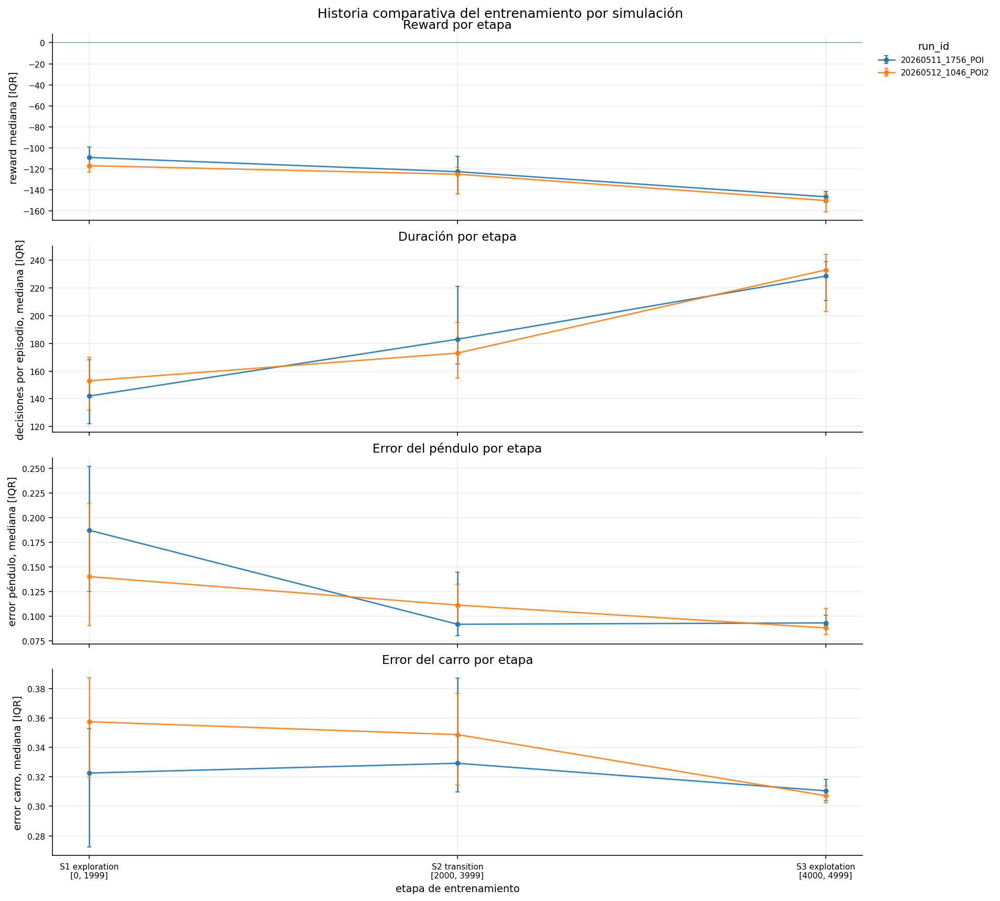

In [45]:
plot_training_stage_story(
    stage_kpi_df=stage_kpi_df,
    stage_df=training_stage_df,
    profile_specs=STAGE_PROFILE_SPECS,
    title="Historia comparativa del entrenamiento por simulación",
    save_as=None,
)

### 1.6 Figura Relaciones críticas en una sola imagen

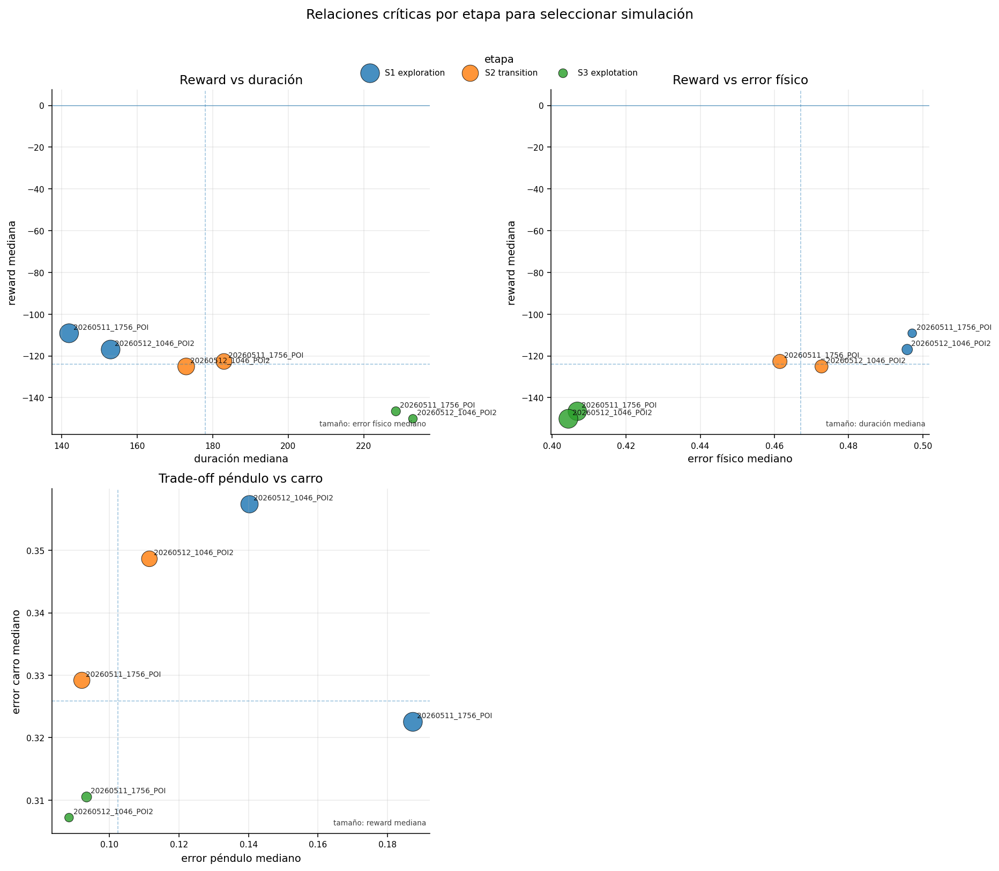

In [46]:
plot_stage_relationship_panels(
    stage_kpi_df=stage_kpi_df,
    relationship_specs=RELATIONSHIP_SPECS,
    stage_df=training_stage_df,
    title="Relaciones críticas por etapa para seleccionar simulación",
    annotate_run_ids=SCATTER_ANNOTATE_RUN_IDS,
    auto_label_limit=SCATTER_AUTO_LABEL_LIMIT,
    n_cols=2,
    save_as=None,
)

### 1.7 Figura Razón de término dominante por run × etapa

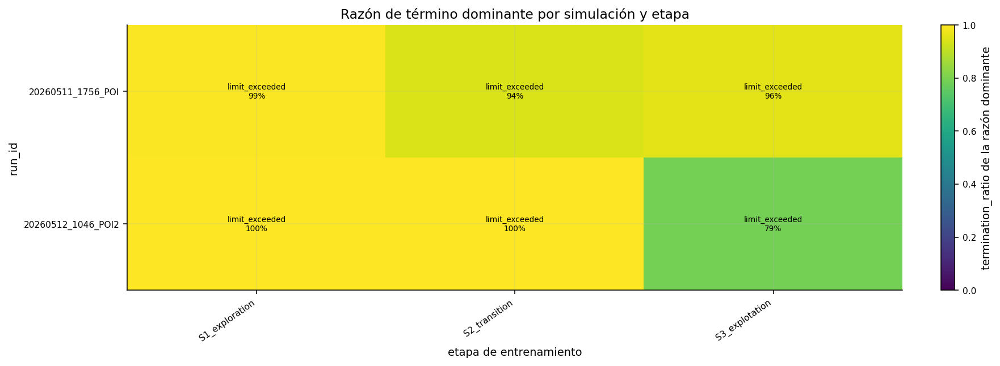

### Razón de término dominante por simulación × etapa

,run_id,training_stage,stage_label,end_termination_reason,n_episodes_reason,n_episodes_stage,termination_ratio,termination_pct
0,20260511_1756_POI,S1_exploration,S1 exploration,limit_exceeded,1985,2000,0.9925,99.25
1,20260512_1046_POI2,S1_exploration,S1 exploration,limit_exceeded,1994,2000,0.9970,99.70
2,20260511_1756_POI,S2_transition,S2 transition,limit_exceeded,1888,2000,0.9440,94.40
3,20260512_1046_POI2,S2_transition,S2 transition,limit_exceeded,1996,2000,0.9980,99.80
4,20260511_1756_POI,S3_explotation,S3 explotation,limit_exceeded,960,1000,0.9600,96.00
5,20260512_1046_POI2,S3_explotation,S3 explotation,limit_exceeded,792,1000,0.7920,79.20


In [47]:
dominant_termination_df = plot_dominant_termination_map(
    termination_stage_ratio_df=termination_stage_ratio_df,
    stage_df=training_stage_df,
    title="Razón de término dominante por simulación y etapa",
    save_as=None,
)

display(Markdown("### Razón de término dominante por simulación × etapa"))
display(
    dominant_termination_df[
        [
            "run_id",
            "training_stage",
            "stage_label",
            TERMINATION_COL,
            "n_episodes_reason",
            "n_episodes_stage",
            "termination_ratio",
            "termination_pct",
        ]
    ]
)

### 1.8 Tabla de contradicciones por etapa

In [48]:
contradiction_df = stage_kpi_df.copy()

reward_q75 = contradiction_df["reward_median"].quantile(0.75)
reward_q50 = contradiction_df["reward_median"].quantile(0.50)

error_q50 = contradiction_df["physical_error_median"].quantile(0.50)
error_q75 = contradiction_df["physical_error_median"].quantile(0.75)

duration_q75 = contradiction_df["duration_median"].quantile(0.75)
duration_q50 = contradiction_df["duration_median"].quantile(0.50)

contradiction_df["analytic_case"] = "caso intermedio: revisar por contexto"

contradiction_df.loc[
    (contradiction_df["reward_median"] >= reward_q75)
    & (contradiction_df["physical_error_median"] <= error_q50)
    & (contradiction_df["duration_median"] >= duration_q50),
    "analytic_case"
] = "candidata fuerte: alto reward, buena física relativa y duración aceptable"

contradiction_df.loc[
    (contradiction_df["reward_median"] >= reward_q75)
    & (contradiction_df["physical_error_median"] > error_q50),
    "analytic_case"
] = "sospechosa positiva: alto reward con error físico relevante"

contradiction_df.loc[
    (contradiction_df["reward_median"] < reward_q50)
    & (contradiction_df["physical_error_median"] <= error_q50)
    & (contradiction_df["duration_median"] >= duration_q50),
    "analytic_case"
] = "sospechosa negativa: buena física relativa pero reward bajo"

contradiction_df.loc[
    (contradiction_df["duration_median"] >= duration_q75)
    & (contradiction_df["reward_median"] < reward_q50),
    "analytic_case"
] = "supervivencia sin recompensa: dura mucho pero no recibe señal suficiente"

contradiction_df.loc[
    (contradiction_df["duration_median"] < duration_q50)
    & (contradiction_df["physical_error_median"] >= error_q75),
    "analytic_case"
] = "fallo físico temprano: baja duración y alto error"


contradiction_sorted_df = (
    contradiction_df
    .sort_values(["analytic_case", "stage_order", "run_id"])
    .reset_index(drop=True)
)

display(Markdown("### Casos analíticos por simulación × etapa"))
display(
    contradiction_sorted_df[
        [
            "run_id",
            "training_stage",
            "stage_label",
            "n_episodes",
            "reward_median",
            "reward_q25",
            "reward_q75",
            "duration_median",
            "pendulum_error_median",
            "cart_error_median",
            "physical_error_median",
            "termination_mode",
            "analytic_case",
        ]
    ]
)

### Casos analíticos por simulación × etapa

,run_id,training_stage,stage_label,n_episodes,reward_median,reward_q25,reward_q75,duration_median,pendulum_error_median,cart_error_median,physical_error_median,termination_mode,analytic_case
0,20260511_1756_POI,S2_transition,S2 transition,2000,-122.668719,-143.960215,-107.823167,183.0,0.092027,0.329193,0.461465,limit_exceeded,caso intermedio: revisar por contexto
1,20260512_1046_POI2,S2_transition,S2 transition,2000,-125.066599,-143.793991,-118.756702,173.0,0.111466,0.348644,0.472691,limit_exceeded,caso intermedio: revisar por contexto
2,20260511_1756_POI,S1_exploration,S1 exploration,2000,-109.156669,-117.308981,-98.951649,142.0,0.187299,0.322544,0.497145,limit_exceeded,fallo físico temprano: baja duración y alto error
3,20260512_1046_POI2,S1_exploration,S1 exploration,2000,-116.949972,-122.950948,-109.840923,153.0,0.140271,0.357381,0.495791,limit_exceeded,fallo físico temprano: baja duración y alto error
4,20260511_1756_POI,S3_explotation,S3 explotation,1000,-146.545029,-151.700098,-141.614924,228.5,0.093399,0.310516,0.406863,limit_exceeded,supervivencia sin recompensa: dura mucho pero no recibe señal suficiente
5,20260512_1046_POI2,S3_explotation,S3 explotation,1000,-150.134959,-160.956814,-143.230204,233.0,0.088347,0.307214,0.404449,limit_exceeded,supervivencia sin recompensa: dura mucho pero no recibe señal suficiente


### 1.9 Tabla compacta de metadata cambiante para interpretar las diferencias

In [39]:
# ---------------------------------------------------------------------
# Filtro principal de parámetros cambiantes que suelen explicar diferencias
# entre corridas.
# La tabla ya viene de metadata_master_df; aquí solo filtramos.
# ---------------------------------------------------------------------

INTERPRETATION_SUBSYSTEMS = [
    "reward",
    "agent",
    "controller",
    "dynamic_system",
    "simulation",
]

interpretation_metadata_changed_df = (
    metadata_changed_df
    .loc[metadata_changed_df["subsystem"].isin(INTERPRETATION_SUBSYSTEMS)]
    .copy()
    .sort_values(
        [
            "subsystem",
            "block",
            "variable_type",
            "variable",
            "run_id",
        ]
    )
    .reset_index(drop=True)
)

display(Markdown("### Metadata cambiante relevante para interpretar las figuras"))
display(
    interpretation_metadata_changed_df[
        [
            "run_id",
            "subsystem",
            "block",
            "variable_type",
            "variable",
            "value_text",
        ]
    ]
)

### Metadata cambiante relevante para interpretar las figuras

,run_id,subsystem,block,variable_type,variable,value_text
0,20260511_1756_POI,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_e.weight,0.6
1,20260512_1046_POI2,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_e.weight,0.65
2,20260511_1756_POI,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_edot.weight,0.35
3,20260512_1046_POI2,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_edot.weight,0.3


### 1.10 Matriz de decisión para seleccionar simulación candidata

In [40]:
# ---------------------------------------------------------------------
# Selección sugerida basada en casos por etapa.
# No elige automáticamente una única corrida; ordena evidencia.
# ---------------------------------------------------------------------

case_priority = OrderedDict({
    "candidata fuerte: alto reward, buena física relativa y duración aceptable": 1,
    "sospechosa positiva: alto reward con error físico relevante": 2,
    "sospechosa negativa: buena física relativa pero reward bajo": 3,
    "supervivencia sin recompensa: dura mucho pero no recibe señal suficiente": 4,
    "fallo físico temprano: baja duración y alto error": 5,
    "caso intermedio: revisar por contexto": 6,
})

selection_stage_df = contradiction_df.copy()
selection_stage_df["case_priority"] = selection_stage_df["analytic_case"].map(case_priority)

selection_stage_df = selection_stage_df.sort_values(
    [
        "case_priority",
        "stage_order",
        "run_id",
    ]
).reset_index(drop=True)

display(Markdown("### Matriz final de decisión — qué simulación y etapa investigar primero"))
display(
    selection_stage_df[
        [
            "run_id",
            "training_stage",
            "stage_label",
            "analytic_case",
            "reward_mean",
            "duration_mean",
            "pendulum_error_median",
            "cart_error_median",
            "physical_error_median",
            "termination_mode",
        ]
    ]
)

# Editar manualmente después de observar tablas y figuras.
SELECTED_RUN_ID = selection_stage_df.iloc[0]["run_id"]
SELECTED_STAGE_ID = selection_stage_df.iloc[0]["training_stage"]

display(Markdown(f"### Selección inicial sugerida"))
display(
    pd.DataFrame([
        {
            "SELECTED_RUN_ID": SELECTED_RUN_ID,
            "SELECTED_STAGE_ID": SELECTED_STAGE_ID,
            "criterio": selection_stage_df.iloc[0]["analytic_case"],
        }
    ])
)

### Matriz final de decisión — qué simulación y etapa investigar primero

,run_id,training_stage,stage_label,analytic_case,reward_mean,duration_mean,pendulum_error_median,cart_error_median,physical_error_median,termination_mode
0,20260511_1756_POI,S3_explotation,S3 explotation,supervivencia sin recompensa: dura mucho pero no recibe señal suficiente,-144.249558,222.6680,0.093399,0.310516,0.406863,limit_exceeded
1,20260512_1046_POI2,S3_explotation,S3 explotation,supervivencia sin recompensa: dura mucho pero no recibe señal suficiente,-150.537113,225.5800,0.088347,0.307214,0.404449,limit_exceeded
2,20260511_1756_POI,S1_exploration,S1 exploration,fallo físico temprano: baja duración y alto error,-107.824739,144.9765,0.187299,0.322544,0.497145,limit_exceeded
3,20260512_1046_POI2,S1_exploration,S1 exploration,fallo físico temprano: baja duración y alto error,-116.020265,150.8520,0.140271,0.357381,0.495791,limit_exceeded
4,20260511_1756_POI,S2_transition,S2 transition,caso intermedio: revisar por contexto,-125.665235,191.3040,0.092027,0.329193,0.461465,limit_exceeded
5,20260512_1046_POI2,S2_transition,S2 transition,caso intermedio: revisar por contexto,-129.091527,174.4095,0.111466,0.348644,0.472691,limit_exceeded


### Selección inicial sugerida

,SELECTED_RUN_ID,SELECTED_STAGE_ID,criterio
0,20260511_1756_POI,S3_explotation,supervivencia sin recompensa: dura mucho pero no recibe señal suficiente


## Sección 2 — Lectura estructurada de configuración y parámetros cambiantes

**Pregunta analítica:**  
¿Qué diferencias de configuración podrían explicar las diferencias observadas entre simulaciones y etapas?

**Criterio:**  
Esta sección no vuelve a graficar desempeño.  
Usa el desempeño por etapa ya calculado en la Sección 1 y lo cruza con los parámetros que cambiaron en `metadata.json`.

**Salidas principales:**

- `parameter_analysis_df`
- `parameter_group_summary_df`
- `parameter_stage_df`
- `parameter_value_table_df`
- `parameter_value_matrix_df`
- `parallel_parameter_scale_df`

**Idea:**  
Primero se ordena la metadata en grupos interpretables.  
Luego se muestran tablas claras.  
Finalmente se genera un parallel plot por grupo de parámetros.

### 2.1 Configuración de la sección

In [49]:
import re

# ---------------------------------------------------------------------
# Etapa usada para interpretar parámetros contra desempeño.
# Por defecto usa la selección sugerida/manual de la Sección 1.
# ---------------------------------------------------------------------

PARAMETER_STAGE_FOCUS = (
    SELECTED_STAGE_ID
    if "SELECTED_STAGE_ID" in globals()
    else training_stage_df.iloc[-1]["training_stage"]
)

# Métrica usada para colorear parallel plots.
# Opciones típicas:
#   reward_median
#   reward_q75
#   reward_q90
#   duration_median
#   physical_error_median
#   pendulum_error_median
#   cart_error_median
#
# Recomendación:
#   - reward_median: lectura robusta de desempeño típico.
#   - reward_q75/q90: destaca potencial alto dentro de la etapa.
#   - physical_error_median: colorea por calidad física.
#   - duration_median: colorea por supervivencia.
PARAMETER_COLOR_METRIC = "reward_median"

PARAMETER_STAGE_METRICS = [
    "reward_median",
    "reward_q25",
    "reward_q75",
    "duration_median",
    "pendulum_error_median",
    "cart_error_median",
    "physical_error_median",
    "termination_mode",
]


# ---------------------------------------------------------------------
# Grupos canónicos de parámetros.
# La asignación se realiza sobre metadata_master_df, que ya contiene:
# run_id, subsystem, block, variable_type, variable, value_text.
# ---------------------------------------------------------------------

PARAMETER_GROUP_SPECS = [
    {
        "parameter_group": "G1_simulation_timing",
        "parameter_group_label": "G1 — Simulación y timing",
        "subsystem": ["simulation"],
        "block_regex": None,
    },
    {
        "parameter_group": "G2_dynamic_system",
        "parameter_group_label": "G2 — Sistema dinámico, normalización y término",
        "subsystem": ["dynamic_system"],
        "block_regex": (
            "physics_params|initial_conditions|state_normalization|"
            "termination_conditions|reference_system_correction|dynamic_system_core"
        ),
    },
    {
        "parameter_group": "G3_controller_actuator",
        "parameter_group_label": "G3 — Controladores PID y actuador",
        "subsystem": ["controller"],
        "block_regex": (
            "controller_definition|controller_initial_conditions|controller_params|"
            "controller_anti_windup|global_actuator|controller_base"
        ),
    },
    {
        "parameter_group": "G4_agent_rl",
        "parameter_group_label": "G4 — Agente RL y espacio de acciones",
        "subsystem": ["agent"],
        "block_regex": (
            "rl_learning_params|action_space|agent_definitions|agent_base"
        ),
    },
    {
        "parameter_group": "G5_reward_metric_processing",
        "parameter_group_label": "G5 — Normalización de métricas para reward",
        "subsystem": ["reward"],
        "block_regex": "metric_processing",
    },
    {
        "parameter_group": "G6_reward_principal",
        "parameter_group_label": "G6 — Recompensa principal y asignación",
        "subsystem": ["reward"],
        "block_regex": "principal_reward|reward_assignment|reward_base",
    },
    {
        "parameter_group": "G7_reward_extras_coordination",
        "parameter_group_label": "G7 — Extras, bonus, penalties y coordinación",
        "subsystem": ["reward"],
        "block_regex": "extra_rewards|coordination_reward",
    },
]


# ---------------------------------------------------------------------
# Tablas.
# ---------------------------------------------------------------------

PARAMETER_GROUPS_TO_SHOW = [
    "G2_dynamic_system",
    "G3_controller_actuator",
    "G4_agent_rl",
    "G5_reward_metric_processing",
    "G6_reward_principal",
    "G7_reward_extras_coordination",
]

PARAMETER_TABLE_MAX_ROWS = 500


# ---------------------------------------------------------------------
# Parallel plots.
# ---------------------------------------------------------------------
# Solo se grafican parámetros que cambiaron.
# Por defecto se usan parámetros numéricos y booleanos.
# Si PARALLEL_INCLUDE_CATEGORICAL_AS_CODES=True,
# variables categóricas se codifican como 0, 1, 2...
# y se reporta la codificación en parallel_parameter_scale_df.
# ---------------------------------------------------------------------

PARALLEL_GROUPS_TO_PLOT = [
    "G2_dynamic_system",
    "G3_controller_actuator",
    "G4_agent_rl",
    "G5_reward_metric_processing",
    "G6_reward_principal",
    "G7_reward_extras_coordination",
]

PARALLEL_MAX_PARAMETERS_PER_GROUP = 14
PARALLEL_INCLUDE_CATEGORICAL_AS_CODES = False
PARALLEL_MAX_CATEGORICAL_LEVELS = 6

PARALLEL_ANNOTATE_RUN_IDS = [
    SELECTED_RUN_ID if "SELECTED_RUN_ID" in globals() else None,
]
PARALLEL_ANNOTATE_RUN_IDS = [x for x in PARALLEL_ANNOTATE_RUN_IDS if x is not None]

PARALLEL_SAVE_FIGURES = False

### 2.2 Helpers de parámetros y parallel plot

In [50]:
def _matches_allowed(value, allowed_values):
    if allowed_values is None:
        return True
    return str(value) in set(map(str, allowed_values))


def _matches_regex(value, pattern):
    if pattern is None:
        return True
    return re.search(pattern, str(value), flags=re.IGNORECASE) is not None


def assign_parameter_group(row, group_specs):
    """
    Asigna cada parámetro de metadata a un grupo canónico interpretable.
    """
    for spec in group_specs:
        if not _matches_allowed(row["subsystem"], spec.get("subsystem")):
            continue

        if not _matches_regex(row["block"], spec.get("block_regex")):
            continue

        return {
            "parameter_group": spec["parameter_group"],
            "parameter_group_label": spec["parameter_group_label"],
        }

    return {
        "parameter_group": "G0_other",
        "parameter_group_label": "G0 — Otros parámetros",
    }


def coerce_parameter_value(value):
    """
    Convierte valores de metadata a una representación útil para análisis.

    value_kind:
        numeric        -> int/float
        boolean        -> bool convertido a 0/1
        numeric_string -> string convertible a float
        categorical    -> string u objeto no numérico
        missing        -> None/NaN
    """
    if value is None:
        return "missing", np.nan

    if isinstance(value, (bool, np.bool_)):
        return "boolean", float(value)

    if isinstance(value, (int, float, np.integer, np.floating)):
        value_float = float(value)
        if np.isfinite(value_float):
            return "numeric", value_float
        return "missing", np.nan

    if isinstance(value, str):
        stripped = value.strip()
        if stripped == "":
            return "missing", np.nan

        try:
            value_float = float(stripped)
            if np.isfinite(value_float):
                return "numeric_string", value_float
        except ValueError:
            pass

        return "categorical", np.nan

    return "categorical", np.nan


def build_parameter_analysis_df(
    metadata_master_df,
    group_specs,
    only_changed=True,
):
    """
    Construye tabla maestra de parámetros para análisis.

    Una fila = run_id × metadata_path.
    """
    change_summary_df = (
        metadata_master_df
        .groupby("metadata_path", as_index=False)
        .agg(
            n_runs_visible=("run_id", "nunique"),
            n_unique_values=("value_text", "nunique"),
        )
    )

    frame = metadata_master_df.merge(
        change_summary_df,
        on="metadata_path",
        how="left",
    )

    if only_changed:
        frame = frame.loc[frame["n_unique_values"] > 1].copy()

    group_info_df = frame.apply(
        lambda row: pd.Series(assign_parameter_group(row, group_specs)),
        axis=1,
    )

    frame = pd.concat(
        [frame.reset_index(drop=True), group_info_df.reset_index(drop=True)],
        axis=1,
    )

    value_info = frame["value"].apply(coerce_parameter_value)
    frame["value_kind"] = value_info.apply(lambda x: x[0])
    frame["value_numeric"] = value_info.apply(lambda x: x[1])

    frame["parameter_label"] = (
        frame["block"].astype(str)
        + " | "
        + frame["variable"].astype(str)
    )

    frame["parameter_label_short"] = frame["parameter_label"].apply(
        lambda x: shorten_label(x, max_len=72)
    )

    return (
        frame
        .sort_values(
            [
                "parameter_group",
                "subsystem",
                "block",
                "variable_type",
                "variable",
                "run_id",
            ]
        )
        .reset_index(drop=True)
    )


def build_parameter_group_summary(parameter_analysis_df):
    """
    Resumen compacto de cuántos parámetros cambiaron por grupo.
    """
    parameter_level_df = (
        parameter_analysis_df
        .drop_duplicates(["parameter_group", "metadata_path"])
        .copy()
    )

    out = (
        parameter_level_df
        .groupby(["parameter_group", "parameter_group_label"], as_index=False)
        .agg(
            n_changed_parameters=("metadata_path", "nunique"),
            n_numeric=("value_kind", lambda s: int(np.isin(s, ["numeric", "numeric_string"]).sum())),
            n_boolean=("value_kind", lambda s: int((s == "boolean").sum())),
            n_categorical=("value_kind", lambda s: int((s == "categorical").sum())),
            n_blocks=("block", "nunique"),
            blocks=("block", lambda s: ", ".join(sorted(set(map(str, s))))),
        )
        .sort_values("parameter_group")
        .reset_index(drop=True)
    )

    return out


def build_parameter_value_table(parameter_analysis_df, group_ids=None):
    """
    Tabla long-format clara:
    run_id, grupo, tipo de variable, variable, valor.
    """
    frame = parameter_analysis_df.copy()

    if group_ids is not None:
        frame = frame.loc[frame["parameter_group"].isin(group_ids)].copy()

    display_cols = [
        "run_id",
        "parameter_group_label",
        "subsystem",
        "block",
        "variable_type",
        "variable",
        "value_text",
        "value_kind",
        "n_unique_values",
    ]

    return (
        frame[display_cols]
        .sort_values(
            [
                "parameter_group_label",
                "block",
                "variable_type",
                "variable",
                "run_id",
            ]
        )
        .reset_index(drop=True)
    )


def build_parameter_value_matrix(parameter_analysis_df, group_ids=None):
    """
    Tabla wide-format:
    filas = parámetros
    columnas = run_id

    Sirve para comparar rápidamente valores entre corridas.
    """
    frame = parameter_analysis_df.copy()

    if group_ids is not None:
        frame = frame.loc[frame["parameter_group"].isin(group_ids)].copy()

    matrix_df = (
        frame
        .pivot_table(
            index=[
                "parameter_group_label",
                "subsystem",
                "block",
                "variable_type",
                "variable",
            ],
            columns="run_id",
            values="value_text",
            aggfunc="first",
            observed=True,
        )
        .reset_index()
    )

    return matrix_df


def make_unique_labels(labels):
    """
    Evita etiquetas duplicadas en parallel plots.
    """
    seen = {}
    out = []

    for label in labels:
        label = str(label)

        if label not in seen:
            seen[label] = 0
            out.append(label)
        else:
            seen[label] += 1
            out.append(f"{label} [{seen[label]}]")

    return out


def build_stage_focus_performance_df(stage_kpi_df, stage_focus):
    """
    Extrae desempeño por run_id para una etapa específica.
    """
    frame = (
        stage_kpi_df
        .loc[stage_kpi_df["training_stage"].astype(str).eq(str(stage_focus))]
        .copy()
    )

    if frame.empty:
        raise ValueError(
            f"No hay métricas para PARAMETER_STAGE_FOCUS={stage_focus}. "
            "Revisar TRAINING_STAGES o PARAMETER_STAGE_FOCUS."
        )

    return frame.reset_index(drop=True)


def build_parameter_stage_df(parameter_analysis_df, stage_focus_performance_df, stage_metrics):
    """
    Cruza parámetros con desempeño de la etapa foco.
    """
    metrics_cols = [
        "run_id",
        "training_stage",
        "stage_label",
        *[c for c in stage_metrics if c in stage_focus_performance_df.columns],
    ]

    return parameter_analysis_df.merge(
        stage_focus_performance_df[metrics_cols],
        on="run_id",
        how="left",
    )


def _prepare_parallel_parameter_data(
    parameter_analysis_df,
    group_id,
    include_categorical_as_codes=False,
    max_categorical_levels=6,
):
    """
    Prepara valores numéricos para parallel plot.

    Numéricos y booleanos se usan directamente.
    Categóricos se codifican solo si include_categorical_as_codes=True.
    """
    group_df = (
        parameter_analysis_df
        .loc[parameter_analysis_df["parameter_group"].eq(group_id)]
        .copy()
    )

    if group_df.empty:
        return pd.DataFrame(), pd.DataFrame()

    plot_rows = []
    scale_rows = []

    parameter_info_df = (
        group_df
        .drop_duplicates("metadata_path")
        .sort_values(["block", "variable_type", "variable", "metadata_path"])
        .copy()
    )

    parameter_info_df["plot_label"] = make_unique_labels(
        parameter_info_df["parameter_label_short"].tolist()
    )

    label_by_path = dict(
        zip(parameter_info_df["metadata_path"], parameter_info_df["plot_label"])
    )

    for metadata_path, part_df in group_df.groupby("metadata_path", observed=True):
        value_kind = part_df["value_kind"].iloc[0]
        plot_label = label_by_path[metadata_path]

        is_numeric_like = value_kind in ["numeric", "numeric_string", "boolean"]

        if is_numeric_like:
            encoded = part_df[["run_id", "value_numeric"]].copy()
            encoded = encoded.rename(columns={"value_numeric": "plot_value"})
            encoding_text = ""

        elif include_categorical_as_codes and value_kind == "categorical":
            categories = sorted(part_df["value_text"].dropna().unique().tolist())

            if len(categories) > max_categorical_levels:
                continue

            mapping = {category: idx for idx, category in enumerate(categories)}

            encoded = part_df[["run_id", "value_text"]].copy()
            encoded["plot_value"] = encoded["value_text"].map(mapping).astype(float)
            encoded = encoded[["run_id", "plot_value"]]

            encoding_text = "; ".join([
                f"{code}={category}"
                for category, code in mapping.items()
            ])

        else:
            continue

        for _, row in encoded.iterrows():
            plot_rows.append({
                "run_id": row["run_id"],
                "metadata_path": metadata_path,
                "plot_label": plot_label,
                "plot_value": row["plot_value"],
            })

        raw_values = part_df["value_text"].dropna().unique().tolist()

        scale_rows.append({
            "parameter_group": part_df["parameter_group"].iloc[0],
            "parameter_group_label": part_df["parameter_group_label"].iloc[0],
            "metadata_path": metadata_path,
            "block": part_df["block"].iloc[0],
            "variable_type": part_df["variable_type"].iloc[0],
            "variable": part_df["variable"].iloc[0],
            "plot_label": plot_label,
            "value_kind": value_kind,
            "raw_min": (
                part_df["value_numeric"].min()
                if is_numeric_like
                else np.nan
            ),
            "raw_max": (
                part_df["value_numeric"].max()
                if is_numeric_like
                else np.nan
            ),
            "unique_values": ", ".join(map(str, raw_values[:8])),
            "categorical_encoding": encoding_text,
        })

    plot_df = pd.DataFrame(plot_rows)
    scale_df = pd.DataFrame(scale_rows)

    return plot_df, scale_df


def plot_parallel_parameter_group(
    parameter_analysis_df,
    stage_focus_performance_df,
    group_id,
    color_metric,
    max_parameters=14,
    include_categorical_as_codes=False,
    max_categorical_levels=6,
    annotate_run_ids=None,
    save_as=None,
):
    """
    Parallel plot para un grupo de parámetros.

    Cada línea = una simulación.
    Cada eje vertical = un parámetro que cambió.
    Valor = parámetro normalizado min-max dentro del grupo.
    Color = métrica de desempeño en la etapa foco.
    """
    annotate_run_ids = set(annotate_run_ids or [])

    group_label_map = (
        parameter_analysis_df
        .drop_duplicates("parameter_group")
        .set_index("parameter_group")["parameter_group_label"]
        .to_dict()
    )

    group_label = group_label_map.get(group_id, group_id)

    plot_df, scale_df = _prepare_parallel_parameter_data(
        parameter_analysis_df=parameter_analysis_df,
        group_id=group_id,
        include_categorical_as_codes=include_categorical_as_codes,
        max_categorical_levels=max_categorical_levels,
    )

    if plot_df.empty:
        display(Markdown(f"### {group_label}"))
        display(Markdown("No hay parámetros numéricos/booleanos suficientes para parallel plot."))
        return pd.DataFrame()

    wide_df = (
        plot_df
        .pivot_table(
            index="run_id",
            columns="plot_label",
            values="plot_value",
            aggfunc="first",
            observed=True,
        )
    )

    # Eliminar columnas sin variación o con datos insuficientes.
    useful_cols = []
    for col in wide_df.columns:
        col_values = wide_df[col].dropna()
        if col_values.nunique() > 1:
            useful_cols.append(col)

    wide_df = wide_df[useful_cols]

    if wide_df.empty:
        display(Markdown(f"### {group_label}"))
        display(Markdown("Los parámetros del grupo no presentan variación numérica útil para graficar."))
        return pd.DataFrame()

    # Normalizar cada parámetro a [0, 1].
    norm_df = pd.DataFrame(index=wide_df.index)

    for col in wide_df.columns:
        values = wide_df[col].astype(float)
        span = values.max() - values.min()

        if not np.isfinite(span) or span == 0:
            continue

        norm_df[col] = (values - values.min()) / span

    if norm_df.empty:
        display(Markdown(f"### {group_label}"))
        display(Markdown("No quedaron columnas normalizables para parallel plot."))
        return pd.DataFrame()

    # Selección de parámetros más informativos por varianza normalizada.
    selected_cols = (
        norm_df
        .var(axis=0, skipna=True)
        .sort_values(ascending=False)
        .head(max_parameters)
        .index
        .tolist()
    )

    # Recuperar orden estructural original, no solo orden por varianza.
    original_order = scale_df["plot_label"].tolist()
    selected_cols = [col for col in original_order if col in selected_cols]

    norm_df = norm_df[selected_cols]
    wide_df = wide_df[selected_cols]

    performance_df = (
        stage_focus_performance_df
        .set_index("run_id")
        .copy()
    )

    run_order = [
        run_id
        for run_id in norm_df.index.tolist()
        if run_id in performance_df.index
    ]

    if color_metric not in performance_df.columns:
        raise ValueError(f"PARAMETER_COLOR_METRIC={color_metric} no existe en stage_focus_performance_df.")

    color_values = performance_df.loc[run_order, color_metric].astype(float)
    color_min = color_values.min()
    color_max = color_values.max()

    if color_max == color_min:
        color_norm = pd.Series(0.5, index=color_values.index)
    else:
        color_norm = (color_values - color_min) / (color_max - color_min)

    cmap = plt.get_cmap("viridis")

    fig, ax = plt.subplots(
        figsize=(max(10.5, 0.85 * len(selected_cols)), 5.8)
    )

    x = np.arange(len(selected_cols))

    for run_id in run_order:
        y = norm_df.loc[run_id].to_numpy(dtype=float)
        line_color = cmap(float(color_norm.loc[run_id]))

        is_annotated = run_id in annotate_run_ids

        ax.plot(
            x,
            y,
            marker="o",
            linewidth=2.4 if is_annotated else 1.2,
            markersize=4.5 if is_annotated else 3.2,
            alpha=0.95 if is_annotated else 0.55,
            color=line_color,
            zorder=3 if is_annotated else 2,
        )

        if is_annotated and len(y) > 0:
            ax.annotate(
                shorten_label(run_id, max_len=28),
                (x[-1], y[-1]),
                xytext=(6, 0),
                textcoords="offset points",
                va="center",
                fontsize=8,
            )

    ax.set_xticks(x)
    ax.set_xticklabels(
        [wrap_label(shorten_label(col, max_len=42), width=18) for col in selected_cols],
        rotation=35,
        ha="right",
    )

    format_axis(
        ax,
        title=(
            f"{group_label}\n"
            f"Parallel plot de parámetros cambiantes | color = {color_metric} | etapa = {PARAMETER_STAGE_FOCUS}"
        ),
        xlabel="parámetro de metadata",
        ylabel="valor normalizado min-max por parámetro",
    )

    sm = plt.cm.ScalarMappable(
        cmap=cmap,
        norm=plt.Normalize(vmin=color_min, vmax=color_max),
    )
    sm.set_array([])

    fig.colorbar(sm, ax=ax, label=color_metric)

    if save_as is not None:
        save_current_figure(save_as, FIG_OUTPUT_DIR)

    plt.show()

    selected_scale_df = (
        scale_df
        .loc[scale_df["plot_label"].isin(selected_cols)]
        .copy()
    )

    selected_scale_df["stage_focus"] = PARAMETER_STAGE_FOCUS
    selected_scale_df["color_metric"] = color_metric

    return selected_scale_df.reset_index(drop=True)

### 2.3 Construcción de tablas de parámetros

In [51]:
stage_focus_performance_df = build_stage_focus_performance_df(
    stage_kpi_df=stage_kpi_df,
    stage_focus=PARAMETER_STAGE_FOCUS,
)

parameter_analysis_df = build_parameter_analysis_df(
    metadata_master_df=metadata_master_df,
    group_specs=PARAMETER_GROUP_SPECS,
    only_changed=True,
)

parameter_group_summary_df = build_parameter_group_summary(
    parameter_analysis_df
)

parameter_stage_df = build_parameter_stage_df(
    parameter_analysis_df=parameter_analysis_df,
    stage_focus_performance_df=stage_focus_performance_df,
    stage_metrics=PARAMETER_STAGE_METRICS,
)

parameter_value_table_df = build_parameter_value_table(
    parameter_analysis_df=parameter_analysis_df,
    group_ids=PARAMETER_GROUPS_TO_SHOW,
)

parameter_value_matrix_df = build_parameter_value_matrix(
    parameter_analysis_df=parameter_analysis_df,
    group_ids=PARAMETER_GROUPS_TO_SHOW,
)


display(Markdown(f"### Etapa usada para interpretar parámetros: `{PARAMETER_STAGE_FOCUS}`"))
display(
    stage_focus_performance_df[
        [
            "run_id",
            "training_stage",
            "stage_label",
            *[c for c in PARAMETER_STAGE_METRICS if c in stage_focus_performance_df.columns],
        ]
    ]
    .sort_values(PARAMETER_COLOR_METRIC, ascending=False)
    .reset_index(drop=True)
)

display(Markdown("### Resumen de parámetros cambiantes por grupo"))
display(parameter_group_summary_df)

display(Markdown("### Tabla maestra filtrada de parámetros cambiantes"))
display(parameter_value_table_df.head(PARAMETER_TABLE_MAX_ROWS))

### Etapa usada para interpretar parámetros: `S3_explotation`

,run_id,training_stage,stage_label,reward_median,reward_q25,reward_q75,duration_median,pendulum_error_median,cart_error_median,physical_error_median,termination_mode
0,20260511_1756_POI,S3_explotation,S3 explotation,-146.545029,-151.700098,-141.614924,228.5,0.093399,0.310516,0.406863,limit_exceeded
1,20260512_1046_POI2,S3_explotation,S3 explotation,-150.134959,-160.956814,-143.230204,233.0,0.088347,0.307214,0.404449,limit_exceeded


### Resumen de parámetros cambiantes por grupo

,parameter_group,parameter_group_label,n_changed_parameters,n_numeric,n_boolean,n_categorical,n_blocks,blocks
0,G0_other,G0 — Otros parámetros,2,1,0,1,1,other
1,G6_reward_principal,G6 — Recompensa principal y asignación,2,2,0,0,1,principal_reward


### Tabla maestra filtrada de parámetros cambiantes

,run_id,parameter_group_label,subsystem,block,variable_type,variable,value_text,value_kind,n_unique_values
0,20260511_1756_POI,G6 — Recompensa principal y asignación,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_e.weight,0.6,numeric,2
1,20260512_1046_POI2,G6 — Recompensa principal y asignación,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_e.weight,0.65,numeric,2
2,20260511_1756_POI,G6 — Recompensa principal y asignación,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_edot.weight,0.35,numeric,2
3,20260512_1046_POI2,G6 — Recompensa principal y asignación,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_edot.weight,0.3,numeric,2


### 2.4 Vista comparativa compacta por parámetro

In [52]:
display(Markdown("### Matriz de valores por parámetro y corrida"))

display(
    parameter_value_matrix_df
    .head(PARAMETER_TABLE_MAX_ROWS)
)

### Matriz de valores por parámetro y corrida

run_id,parameter_group_label,subsystem,block,variable_type,variable,20260511_1756_POI,20260512_1046_POI2
0,G6 — Recompensa principal y asignación,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_e.weight,0.6,0.65
1,G6 — Recompensa principal y asignación,reward,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_edot.weight,0.35,0.3


### 2.5 Tabla cruzada parámetro × desempeño de la etapa foco

In [53]:
parameter_stage_display_cols = [
    "run_id",
    "parameter_group_label",
    "block",
    "variable_type",
    "variable",
    "value_text",
    "stage_label",
    *[c for c in PARAMETER_STAGE_METRICS if c in parameter_stage_df.columns],
]

display(Markdown("### Parámetros cambiantes cruzados con desempeño por etapa"))

display(
    parameter_stage_df[
        parameter_stage_display_cols
    ]
    .loc[parameter_stage_df["parameter_group"].isin(PARAMETER_GROUPS_TO_SHOW)]
    .sort_values(
        [
            "parameter_group_label",
            "block",
            "variable_type",
            "variable",
            "run_id",
        ]
    )
    .head(PARAMETER_TABLE_MAX_ROWS)
    .reset_index(drop=True)
)

### Parámetros cambiantes cruzados con desempeño por etapa

,run_id,parameter_group_label,block,variable_type,variable,value_text,stage_label,reward_median,reward_q25,reward_q75,duration_median,pendulum_error_median,cart_error_median,physical_error_median,termination_mode
0,20260511_1756_POI,G6 — Recompensa principal y asignación,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_e.weight,0.6,S3 explotation,-146.545029,-151.700098,-141.614924,228.5,0.093399,0.310516,0.406863,limit_exceeded
1,20260512_1046_POI2,G6 — Recompensa principal y asignación,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_e.weight,0.65,S3 explotation,-150.134959,-160.956814,-143.230204,233.0,0.088347,0.307214,0.404449,limit_exceeded
2,20260511_1756_POI,G6 — Recompensa principal y asignación,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_edot.weight,0.35,S3 explotation,-146.545029,-151.700098,-141.614924,228.5,0.093399,0.310516,0.406863,limit_exceeded
3,20260512_1046_POI2,G6 — Recompensa principal y asignación,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_edot.weight,0.3,S3 explotation,-150.134959,-160.956814,-143.230204,233.0,0.088347,0.307214,0.404449,limit_exceeded


### 2.6 Parallel plots por grupo de parámetros

### G2_dynamic_system

No hay parámetros numéricos/booleanos suficientes para parallel plot.

### G3_controller_actuator

No hay parámetros numéricos/booleanos suficientes para parallel plot.

### G4_agent_rl

No hay parámetros numéricos/booleanos suficientes para parallel plot.

### G5_reward_metric_processing

No hay parámetros numéricos/booleanos suficientes para parallel plot.

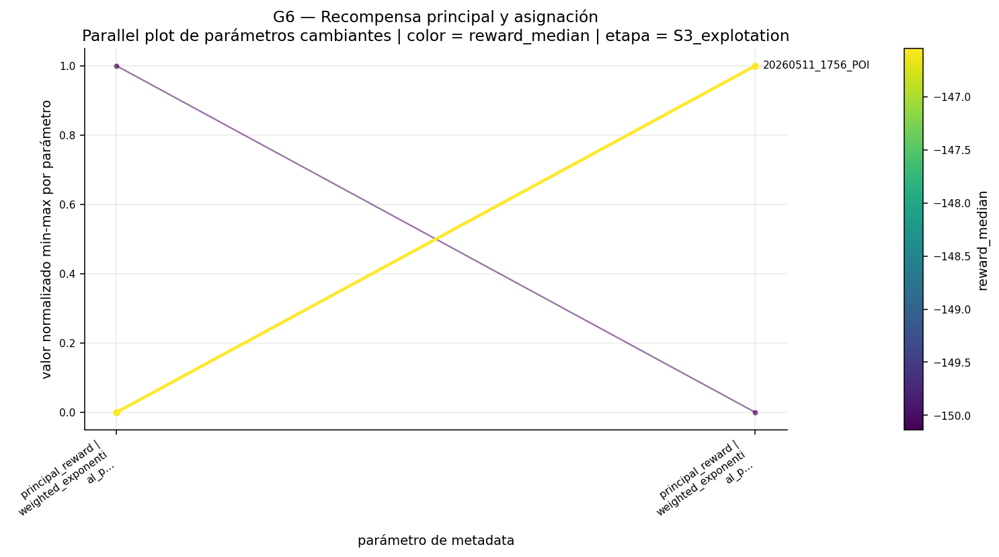

### G7_reward_extras_coordination

No hay parámetros numéricos/booleanos suficientes para parallel plot.

### Escalas usadas en los parallel plots

,parameter_group_label,block,variable_type,variable,plot_label,value_kind,raw_min,raw_max,unique_values,categorical_encoding,stage_focus,color_metric
0,G6 — Recompensa principal y asignación,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_e.weight,principal_reward | weighted_exponential_params.features.L_e.weight,numeric,0.6,0.65,"0.6, 0.65",,S3_explotation,reward_median
1,G6 — Recompensa principal y asignación,principal_reward,principal_reward_parameter,weighted_exponential_params.features.L_edot.weight,principal_reward | weighted_exponential_params.features.L_edot.weight,numeric,0.3,0.35,"0.35, 0.3",,S3_explotation,reward_median


In [54]:
parallel_scale_tables = []

for group_id in PARALLEL_GROUPS_TO_PLOT:
    save_as = None

    if PARALLEL_SAVE_FIGURES:
        save_as = f"section_2_parallel_{group_id}.png"

    scale_df = plot_parallel_parameter_group(
        parameter_analysis_df=parameter_analysis_df,
        stage_focus_performance_df=stage_focus_performance_df,
        group_id=group_id,
        color_metric=PARAMETER_COLOR_METRIC,
        max_parameters=PARALLEL_MAX_PARAMETERS_PER_GROUP,
        include_categorical_as_codes=PARALLEL_INCLUDE_CATEGORICAL_AS_CODES,
        max_categorical_levels=PARALLEL_MAX_CATEGORICAL_LEVELS,
        annotate_run_ids=PARALLEL_ANNOTATE_RUN_IDS,
        save_as=save_as,
    )

    if not scale_df.empty:
        parallel_scale_tables.append(scale_df)

if parallel_scale_tables:
    parallel_parameter_scale_df = pd.concat(
        parallel_scale_tables,
        ignore_index=True,
        sort=False,
    )
else:
    parallel_parameter_scale_df = pd.DataFrame()

display(Markdown("### Escalas usadas en los parallel plots"))

display(
    parallel_parameter_scale_df[
        [
            "parameter_group_label",
            "block",
            "variable_type",
            "variable",
            "plot_label",
            "value_kind",
            "raw_min",
            "raw_max",
            "unique_values",
            "categorical_encoding",
            "stage_focus",
            "color_metric",
        ]
    ]
    if not parallel_parameter_scale_df.empty
    else parallel_parameter_scale_df
)

## Sección 3 — Historia interna de la simulación seleccionada

**Pregunta analítica general:**  
Dentro de la simulación seleccionada, ¿qué episodios explican mejor la evolución del entrenamiento y cuáles deben abrirse en profundidad?

**Objetivo específico:**  
Pasar de `run_id × training_stage` a `episode_id`, usando `summary.xlsx` para:

1. observar la evolución por episodio;
2. detectar cambios de régimen entre etapas;
3. identificar contradicciones entre reward, duración y física;
4. observar señales de reward shaping disponibles en summary;
5. proponer un conjunto reducido de episodios representativos.

**Criterio visual:**  
No se generan gráficos redundantes.  
Cada figura debe condensar varias señales relevantes en una sola imagen.

### 3.1 Selección de corrida y exposición de columnas disponibles

In [56]:
# ---------------------------------------------------------------------
# Simulación seleccionada.
# Por defecto usa SELECTED_RUN_ID de la Sección 1.
# Puedes sobrescribir manualmente:
#
#   SELECTED_RUN_ID = "run_YYYYMMDD_HHMM"
#
# ---------------------------------------------------------------------

SELECTED_RUN_ID = SELECTED_RUN_ID

selected_run_dir = {
    run_dir.name: run_dir
    for run_dir in selected_run_dirs
}[SELECTED_RUN_ID]

selected_summary_raw_df = summary_by_run[SELECTED_RUN_ID].copy()
selected_summary_raw_df["run_id"] = SELECTED_RUN_ID

selected_summary_columns_df = (
    summary_columns_master_df
    .loc[summary_columns_master_df["run_id"].eq(SELECTED_RUN_ID)]
    .sort_values(["summary_family", "column_order"])
    .reset_index(drop=True)
)

display(Markdown(f"### Simulación seleccionada: `{SELECTED_RUN_ID}`"))
display(pd.DataFrame([{
    "selected_run_id": SELECTED_RUN_ID,
    "selected_run_dir": str(selected_run_dir),
    "n_summary_rows": selected_summary_raw_df.shape[0],
    "n_summary_columns": selected_summary_raw_df.shape[1],
    "episode_min": selected_summary_raw_df[EPISODE_COL].min(),
    "episode_max": selected_summary_raw_df[EPISODE_COL].max(),
}]))

display(Markdown("### Columnas disponibles en el summary de la simulación seleccionada"))
display(
    selected_summary_columns_df[
        [
            "column_order",
            "column",
            "summary_family",
            "dtype",
            "non_null",
            "n_unique",
        ]
    ]
)

### Simulación seleccionada: `20260511_1756_POI`

,selected_run_id,selected_run_dir,n_summary_rows,n_summary_columns,episode_min,episode_max
0,20260511_1756_POI,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI,5000,670,0,4999


### Columnas disponibles en el summary de la simulación seleccionada

,column_order,column,summary_family,dtype,non_null,n_unique
0,11,final_kp_cart_position,cart,float64,5000,41
1,12,final_ki_cart_position,cart,float64,5000,41
2,13,final_kd_cart_position,cart,float64,5000,41
3,16,final_cart_position_raw,cart,float64,5000,5000
4,17,final_cart_velocity_raw,cart,float64,5000,5000
...,...,...,...,...,...,...
664,581,reward_kd_cart_position_p25,reward,float64,5000,731
665,582,reward_kd_cart_position_p50,reward,float64,5000,4506
666,583,reward_kd_cart_position_p75,reward,float64,5000,4983
667,584,reward_kd_cart_position_max,reward,float64,5000,526


### 3.2 Configuración de análisis por episodio

In [70]:
# ---------------------------------------------------------------------
# Configuración central de la Sección 3.
# Las columnas núcleo deben existir.
# Si no existen, la construcción de selected_episode_df fallará.
# ---------------------------------------------------------------------

SECTION3_ROLLING_WINDOW = 25

SECTION3_FOCUS_STAGE_ID = (
    SELECTED_STAGE_ID
    if "SELECTED_STAGE_ID" in globals()
    else training_stage_df.iloc[-1]["training_stage"]
)

# Métricas base del relato por episodio.
SECTION3_CORE_REQUIRED_COLS = [
    EPISODE_COL,
    REWARD_COL,
    DURATION_COL,
    TERMINATION_COL,
    *PENDULUM_ERROR_COLS,
    *CART_ERROR_COLS,
]

# Señales de aprendizaje visibles en summary.
# Si no existen, simplemente no se grafican como panel opcional.
SECTION3_LEARNING_COLS = [
    col for col in LEARNING_COLS
    if col in selected_summary_raw_df.columns
]


# ---------------------------------------------------------------------
# Opciones útiles de métricas por episodio
# ---------------------------------------------------------------------
# Puedes reemplazar columnas en los gráficos usando:
#
# Reward:
#   total_reward
#   goal_bonus
#   accumulated_band_bonus
#   accumulated_band_bonus_<var_obj>
#
# Duración:
#   total_agent_decisions
#
# Errores:
#   error_pendulum_angle_rms_mean
#   error_pendulum_angle_mean_squared_mean
#   error_cart_position_rms_mean
#   error_cart_position_mean_squared_mean
#
# Aprendizaje:
#   epsilon
#   learning_rate
#
# Componentes de reward, si summary los incluye:
#   principal_reward*
#   principal_feature*
#   principal_contribution*
#   extra_total*
#   extra_bonus*
#   extra_penalty*
#   coordination_reward_total*
#   coordination_task*
# ---------------------------------------------------------------------


# ---------------------------------------------------------------------
# Grupos de componentes disponibles en summary.
# Estos grupos se resuelven dinámicamente por patrón sobre columnas visibles.
# No reemplazan el análisis profundo de interval_data; solo dan una lectura
# episode-level desde summary.
# ---------------------------------------------------------------------

SECTION3_COMPONENT_GROUP_RULES = [
    {
        "group_id": "principal",
        "group_label": "principal reward",
        "pattern": r"principal_reward|principal_feature_reward|principal_contribution|lagrangian_total",
        "mode": "sum",
    },
    {
        "group_id": "extra",
        "group_label": "extra rewards",
        "pattern": r"extra_total|extra_bonus|extra_penalty|extra_conditional_dynamic",
        "mode": "sum",
    },
    {
        "group_id": "coordination",
        "group_label": "coordination reward",
        "pattern": r"coordination_reward_total|coordination_task|coordination_credit|extra_conditional_coordination",
        "mode": "sum",
    },
    {
        "group_id": "episode_bonus",
        "group_label": "episode bonus",
        "pattern": r"^goal_bonus$|^accumulated_band_bonus$|^accumulated_band_bonus_",
        "mode": "sum",
    },
]

# Excluir columnas que no deberían entrar como componentes.
SECTION3_COMPONENT_EXCLUDE_PATTERN = (
    r"^total_reward$|^reward_mean$|^reward_median$|"
    r"epsilon|learning_rate|td_error|q_value|q_mean|q_std|q_max|q_min|visits"
)


# ---------------------------------------------------------------------
# Paneles de la figura principal.
# Cada panel puede tener una o más series.
# Se grafica señal cruda suave + mediana móvil.
# ---------------------------------------------------------------------

SECTION3_EPISODE_STORY_PANELS = [
    {
        "panel_id": "reward",
        "title": "Reward por episodio",
        "ylabel": "reward",
        "zero_line": True,
        "series": [
            {
                "col": REWARD_COL,
                "label": "total reward",
                "show_raw": True,
                "show_rolling": True,
                "show_iqr": True,
            },
        ],
    },
    {
        "panel_id": "duration",
        "title": "Duración por episodio",
        "ylabel": "decisiones del agente",
        "zero_line": False,
        "series": [
            {
                "col": DURATION_COL,
                "label": "duración",
                "show_raw": True,
                "show_rolling": True,
                "show_iqr": True,
            },
        ],
    },
    {
        "panel_id": "physical_error",
        "title": "Error físico por episodio",
        "ylabel": "error",
        "zero_line": False,
        "series": [
            {
                "col": "pendulum_error_score",
                "label": "péndulo",
                "show_raw": False,
                "show_rolling": True,
                "show_iqr": False,
            },
            {
                "col": "cart_error_score",
                "label": "carro",
                "show_raw": False,
                "show_rolling": True,
                "show_iqr": False,
            },
            {
                "col": "physical_error_score",
                "label": "físico combinado",
                "show_raw": True,
                "show_rolling": True,
                "show_iqr": True,
            },
        ],
    },
    {
        "panel_id": "components",
        "title": "Señales de reward shaping visibles en summary",
        "ylabel": "valor agregado por episodio",
        "zero_line": True,
        "series": [
            # Estas columnas se crean dinámicamente en 3.4 si existen grupos.
            {
                "col": "component_principal",
                "label": "principal",
                "show_raw": False,
                "show_rolling": True,
                "show_iqr": False,
            },
            {
                "col": "component_extra",
                "label": "extras",
                "show_raw": False,
                "show_rolling": True,
                "show_iqr": False,
            },
            {
                "col": "component_coordination",
                "label": "coordinación",
                "show_raw": False,
                "show_rolling": True,
                "show_iqr": False,
            },
            {
                "col": "component_episode_bonus",
                "label": "bonus episodio",
                "show_raw": False,
                "show_rolling": True,
                "show_iqr": False,
            },
        ],
    },
]


# ---------------------------------------------------------------------
# Relaciones críticas en una sola figura.
# Cada entrada genera un subplot.
# Si alguna columna opcional no existe, ese subplot se omite.
# ---------------------------------------------------------------------

SECTION3_RELATIONSHIP_SPECS = [
    {
        "x_col": DURATION_COL,
        "y_col": REWARD_COL,
        "size_col": "physical_error_score",
        "title": "Reward vs duración",
        "xlabel": "duración",
        "ylabel": "reward",
        "size_label": "error físico",
        "reference_medians": True,
    },
    {
        "x_col": "physical_error_score",
        "y_col": REWARD_COL,
        "size_col": DURATION_COL,
        "title": "Reward vs error físico",
        "xlabel": "error físico combinado",
        "ylabel": "reward",
        "size_label": "duración",
        "reference_medians": True,
    },
    {
        "x_col": "pendulum_error_score",
        "y_col": "cart_error_score",
        "size_col": REWARD_COL,
        "title": "Trade-off péndulo vs carro",
        "xlabel": "error péndulo",
        "ylabel": "error carro",
        "size_label": "reward",
        "reference_medians": True,
    },
    {
        "x_col": "component_shaping_score",
        "y_col": REWARD_COL,
        "size_col": DURATION_COL,
        "title": "Reward vs shaping visible",
        "xlabel": "señal agregada de shaping",
        "ylabel": "reward",
        "size_label": "duración",
        "reference_medians": True,
    },
    {
        "x_col": "epsilon",
        "y_col": REWARD_COL,
        "size_col": "physical_error_score",
        "title": "Reward vs exploración",
        "xlabel": "epsilon",
        "ylabel": "reward",
        "size_label": "error físico",
        "reference_medians": True,
    },
    {
        "x_col": "learning_rate",
        "y_col": REWARD_COL,
        "size_col": "physical_error_score",
        "title": "Reward vs learning rate",
        "xlabel": "learning rate",
        "ylabel": "reward",
        "size_label": "error físico",
        "reference_medians": True,
    },
]


# ---------------------------------------------------------------------
# Selección automática de episodios representativos.
# Ajustar para reducir o ampliar el conjunto final.
# ---------------------------------------------------------------------

SECTION3_REPRESENTATIVE_CRITERIA = [
    "stage_typical",
    "stage_best_reward",
    "stage_best_physics",
    "stage_failure",
    "positive_contradiction",
    "negative_contradiction",
]

SECTION3_MAX_REPRESENTATIVE_EPISODES = 16

### 3.3 Helpers de construcción y selección de episodios

In [ ]:
def require_columns(frame, columns, context="frame"):
    """
    Exige columnas núcleo.
    """
    missing = [col for col in columns if col not in frame.columns]

    if missing:
        raise KeyError(
            f"Faltan columnas requeridas en {context}: {missing}"
        )


def assign_stage_from_table(episode_id, training_stage_df):
    """
    Asigna etapa según rangos inclusivos.
    """
    for _, row in training_stage_df.iterrows():
        if row["episode_min"] <= episode_id <= row["episode_max"]:
            return row["training_stage"]

    return np.nan


def build_selected_episode_df(
    selected_summary_df,
    selected_run_id,
    training_stage_df,
):
    """
    Construye tabla episode-level para una sola corrida.
    """
    require_columns(
        selected_summary_df,
        SECTION3_CORE_REQUIRED_COLS,
        context=f"summary de {selected_run_id}",
    )

    frame = selected_summary_df.copy()
    frame["run_id"] = selected_run_id

    numeric_cols = [
        REWARD_COL,
        DURATION_COL,
        *PENDULUM_ERROR_COLS,
        *CART_ERROR_COLS,
        *SECTION3_LEARNING_COLS,
    ]

    for col in numeric_cols:
        frame[col] = frame[col].astype(float)

    frame["pendulum_error_score"] = frame[PENDULUM_ERROR_COLS].mean(axis=1)
    frame["cart_error_score"] = frame[CART_ERROR_COLS].mean(axis=1)

    frame["physical_error_score"] = (
        PENDULUM_ERROR_WEIGHT * frame["pendulum_error_score"]
        + CART_ERROR_WEIGHT * frame["cart_error_score"]
    )

    frame["training_stage"] = frame[EPISODE_COL].apply(
        lambda ep: assign_stage_from_table(ep, training_stage_df)
    )

    unassigned_count = int(frame["training_stage"].isna().sum())
    if unassigned_count > 0:
        raise ValueError(
            f"{unassigned_count} episodios no quedaron asignados a ninguna etapa. "
            "Ajustar TRAINING_STAGES."
        )

    frame = frame.merge(
        training_stage_df[
            [
                "training_stage",
                "stage_label",
                "stage_order",
                "episode_min",
                "episode_max",
            ]
        ],
        on="training_stage",
        how="left",
    )

    return (
        frame
        .sort_values(EPISODE_COL)
        .reset_index(drop=True)
    )


def resolve_component_groups(
    frame,
    group_rules,
    exclude_pattern=None,
):
    """
    Resuelve grupos de columnas de componentes disponibles en summary.

    Cada grupo crea luego una columna:
        component_<group_id>
    """
    rows = []
    groups = []

    for rule in group_rules:
        pattern = rule["pattern"]
        exclude = exclude_pattern

        cols = []
        for col in frame.columns:
            if re.search(pattern, str(col), flags=re.IGNORECASE):
                if exclude and re.search(exclude, str(col), flags=re.IGNORECASE):
                    continue
                cols.append(col)

        cols = sorted(set(cols))

        if not cols:
            continue

        group_id = rule["group_id"]
        group_label = rule["group_label"]
        mode = rule.get("mode", "sum")

        groups.append({
            "group_id": group_id,
            "group_label": group_label,
            "mode": mode,
            "columns": cols,
            "derived_col": f"component_{group_id}",
        })

        for col in cols:
            rows.append({
                "group_id": group_id,
                "group_label": group_label,
                "mode": mode,
                "derived_col": f"component_{group_id}",
                "source_column": col,
            })

    return groups, pd.DataFrame(rows)


def add_component_group_scores(frame, component_groups):
    """
    Agrega columnas component_<group_id> al dataframe por episodio.
    """
    out = frame.copy()
    shaping_cols = []

    for group in component_groups:
        cols = group["columns"]
        mode = group.get("mode", "sum")
        derived_col = group["derived_col"]

        for col in cols:
            out[col] = out[col].astype(float)

        if mode == "sum":
            out[derived_col] = out[cols].sum(axis=1)
        elif mode == "mean":
            out[derived_col] = out[cols].mean(axis=1)
        elif mode == "mean_abs":
            out[derived_col] = out[cols].abs().mean(axis=1)
        else:
            raise ValueError(f"Modo de agregación no soportado: {mode}")

        if group["group_id"] in ["extra", "coordination", "episode_bonus"]:
            shaping_cols.append(derived_col)

    if shaping_cols:
        out["component_shaping_score"] = out[shaping_cols].sum(axis=1)

    if "component_principal" in out.columns:
        out["component_main_score"] = out["component_principal"]

    return out


def build_selected_stage_summary(selected_episode_df):
    """
    Resumen compacto por etapa dentro de la corrida seleccionada.
    """
    out = (
        selected_episode_df
        .groupby(["training_stage", "stage_label", "stage_order"], observed=True)
        .agg(
            n_episodes=(EPISODE_COL, "count"),

            reward_median=(REWARD_COL, "median"),
            reward_q25=(REWARD_COL, lambda s: s.quantile(0.25)),
            reward_q75=(REWARD_COL, lambda s: s.quantile(0.75)),
            reward_max=(REWARD_COL, "max"),

            duration_median=(DURATION_COL, "median"),
            duration_q25=(DURATION_COL, lambda s: s.quantile(0.25)),
            duration_q75=(DURATION_COL, lambda s: s.quantile(0.75)),
            duration_max=(DURATION_COL, "max"),

            pendulum_error_median=("pendulum_error_score", "median"),
            cart_error_median=("cart_error_score", "median"),
            physical_error_median=("physical_error_score", "median"),

            termination_mode=(TERMINATION_COL, mode_value),
        )
        .reset_index()
        .sort_values("stage_order")
    )

    return out.reset_index(drop=True)


def normalized_distance_to_center(part_df, cols):
    """
    Distancia normalizada al centro robusto de una etapa.
    """
    work = part_df[cols].astype(float).copy()
    norm = pd.DataFrame(index=work.index)

    for col in cols:
        values = work[col]
        span = values.max() - values.min()

        if not np.isfinite(span) or span == 0:
            norm[col] = 0.0
        else:
            norm[col] = (values - values.min()) / span

    center = norm.median(axis=0)

    return (norm - center).abs().sum(axis=1)


def pick_one_episode(part_df, criterion_id):
    """
    Selecciona un episodio de una etapa según criterio.
    """
    if part_df.empty:
        return None

    if criterion_id == "stage_typical":
        cols = [REWARD_COL, DURATION_COL, "physical_error_score"]
        distance = normalized_distance_to_center(part_df, cols)
        idx = distance.idxmin()
        return idx, float(distance.loc[idx]), "episodio típico de la etapa"

    if criterion_id == "stage_best_reward":
        idx = part_df[REWARD_COL].idxmax()
        return idx, float(part_df.loc[idx, REWARD_COL]), "mayor reward de la etapa"

    if criterion_id == "stage_best_physics":
        duration_floor = part_df[DURATION_COL].median()
        candidates = part_df.loc[part_df[DURATION_COL] >= duration_floor]

        if candidates.empty:
            candidates = part_df

        idx = candidates["physical_error_score"].idxmin()
        return idx, float(candidates.loc[idx, "physical_error_score"]), "mejor física con duración suficiente"

    if criterion_id == "stage_failure":
        duration_q25 = part_df[DURATION_COL].quantile(0.25)
        error_q75 = part_df["physical_error_score"].quantile(0.75)

        failure_candidates = part_df.loc[
            (part_df[DURATION_COL] <= duration_q25)
            | (part_df["physical_error_score"] >= error_q75)
            | (part_df[TERMINATION_COL].astype(str).str.contains("limit|fail|exceeded", case=False, regex=True))
        ]

        if failure_candidates.empty:
            return None

        score = (
            minmax_normalize(failure_candidates["physical_error_score"])
            + minmax_normalize(-failure_candidates[DURATION_COL])
        )

        idx = score.idxmax()
        return idx, float(score.loc[idx]), "fallo o episodio físicamente crítico"

    if criterion_id == "positive_contradiction":
        reward_q75 = part_df[REWARD_COL].quantile(0.75)
        error_q75 = part_df["physical_error_score"].quantile(0.75)

        candidates = part_df.loc[
            (part_df[REWARD_COL] >= reward_q75)
            & (part_df["physical_error_score"] >= error_q75)
        ]

        if candidates.empty:
            return None

        score = (
            minmax_normalize(candidates[REWARD_COL])
            + minmax_normalize(candidates["physical_error_score"])
        )

        idx = score.idxmax()
        return idx, float(score.loc[idx]), "alto reward con error físico alto"

    if criterion_id == "negative_contradiction":
        reward_q25 = part_df[REWARD_COL].quantile(0.25)
        error_q25 = part_df["physical_error_score"].quantile(0.25)
        duration_q50 = part_df[DURATION_COL].quantile(0.50)

        candidates = part_df.loc[
            (part_df[REWARD_COL] <= reward_q25)
            & (part_df["physical_error_score"] <= error_q25)
            & (part_df[DURATION_COL] >= duration_q50)
        ]

        if candidates.empty:
            return None

        score = (
            minmax_normalize(-candidates[REWARD_COL])
            + minmax_normalize(-candidates["physical_error_score"])
            + minmax_normalize(candidates[DURATION_COL])
        )

        idx = score.idxmax()
        return idx, float(score.loc[idx]), "buen comportamiento físico relativo con reward bajo"

    raise ValueError(f"Criterio no soportado: {criterion_id}")


def select_representative_episodes(
    selected_episode_df,
    criteria,
    max_episodes=16,
):
    """
    Selecciona episodios representativos por etapa.

    Una fila final puede acumular varios criterios si el mismo episodio
    cumple más de una condición.
    """
    priority_map = {
        "stage_typical": 1,
        "stage_best_reward": 2,
        "stage_best_physics": 3,
        "stage_failure": 4,
        "positive_contradiction": 5,
        "negative_contradiction": 6,
    }

    rows = []

    for stage_id, part_df in selected_episode_df.groupby("training_stage", observed=True):
        part_df = part_df.sort_values(EPISODE_COL)

        for criterion_id in criteria:
            picked = pick_one_episode(part_df, criterion_id)

            if picked is None:
                continue

            idx, criterion_score, criterion_label = picked
            row = part_df.loc[idx]

            rows.append({
                "run_id": row["run_id"],
                "episode_id": int(row[EPISODE_COL]),
                "training_stage": row["training_stage"],
                "stage_label": row["stage_label"],
                "stage_order": int(row["stage_order"]),
                "criterion_id": criterion_id,
                "criterion_label": criterion_label,
                "criterion_priority": priority_map[criterion_id],
                "criterion_score": criterion_score,

                REWARD_COL: row[REWARD_COL],
                DURATION_COL: row[DURATION_COL],
                "pendulum_error_score": row["pendulum_error_score"],
                "cart_error_score": row["cart_error_score"],
                "physical_error_score": row["physical_error_score"],
                TERMINATION_COL: row[TERMINATION_COL],
            })

    candidate_df = pd.DataFrame(rows)

    if candidate_df.empty:
        return candidate_df

    grouped_df = (
        candidate_df
        .groupby(
            [
                "run_id",
                "episode_id",
                "training_stage",
                "stage_label",
                "stage_order",
            ],
            as_index=False,
        )
        .agg(
            criterion_id=("criterion_id", lambda s: " | ".join(sorted(set(s)))),
            criterion_label=("criterion_label", lambda s: " | ".join(sorted(set(s)))),
            criterion_priority=("criterion_priority", "min"),
            criterion_score=("criterion_score", "max"),

            **{
                REWARD_COL: (REWARD_COL, "first"),
                DURATION_COL: (DURATION_COL, "first"),
                "pendulum_error_score": ("pendulum_error_score", "first"),
                "cart_error_score": ("cart_error_score", "first"),
                "physical_error_score": ("physical_error_score", "first"),
                TERMINATION_COL: (TERMINATION_COL, "first"),
            }
        )
    )

    grouped_df = (
        grouped_df
        .sort_values(["stage_order", "criterion_priority", "episode_id"])
        .head(max_episodes)
        .reset_index(drop=True)
    )

    grouped_df["episode_label"] = grouped_df.apply(
        lambda row: f"E{row['episode_id']} | {row['criterion_id']}",
        axis=1,
    )

    return grouped_df

### 3.4 Construcción de tablas de la simulación seleccionada

In [65]:
representative_episodes_df.columns

Index(['run_id', 'episode_id', 'training_stage', 'stage_label', 'stage_order',
       'criterion_id', 'criterion_label', 'criterion_priority',
       'criterion_score', 'total_reward', 'total_agent_decisions',
       'pendulum_error_score', 'cart_error_score', 'physical_error_score',
       'end_termination_reason', 'episode_label'],
      dtype='object')

In [59]:
selected_episode_df = build_selected_episode_df(
    selected_summary_df=selected_summary_raw_df,
    selected_run_id=SELECTED_RUN_ID,
    training_stage_df=training_stage_df,
)

section3_component_groups, section3_component_columns_df = resolve_component_groups(
    frame=selected_episode_df,
    group_rules=SECTION3_COMPONENT_GROUP_RULES,
    exclude_pattern=SECTION3_COMPONENT_EXCLUDE_PATTERN,
)

selected_episode_df = add_component_group_scores(
    frame=selected_episode_df,
    component_groups=section3_component_groups,
)

selected_stage_summary_df = build_selected_stage_summary(
    selected_episode_df
)

representative_episodes_df = select_representative_episodes(
    selected_episode_df=selected_episode_df,
    criteria=SECTION3_REPRESENTATIVE_CRITERIA,
    max_episodes=SECTION3_MAX_REPRESENTATIVE_EPISODES,
)

SELECTED_EPISODE_IDS = (
    representative_episodes_df["episode_id"].astype(int).tolist()
    if not representative_episodes_df.empty
    else []
)

display(Markdown("### Resumen por etapa dentro de la simulación seleccionada"))
display(selected_stage_summary_df)

display(Markdown("### Grupos de componentes visibles en summary"))
display(section3_component_columns_df)

display(Markdown("### Episodios representativos propuestos"))
display(representative_episodes_df)

display(Markdown("### Lista final de episodios para abrir en profundidad"))
display(pd.DataFrame({"selected_episode_id": SELECTED_EPISODE_IDS}))

C:\Users\davor\AppData\Local\Temp\ipykernel_16920\3339576829.py:162: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  out[derived_col] = out[cols].sum(axis=1)
C:\Users\davor\AppData\Local\Temp\ipykernel_16920\3339576829.py:174: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  out["component_shaping_score"] = out[shaping_cols].sum(axis=1)
C:\Users\davor\AppData\Local\Temp\ipykernel_16920\3339576829.py:177: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poo

### Resumen por etapa dentro de la simulación seleccionada

,training_stage,stage_label,stage_order,n_episodes,reward_median,reward_q25,reward_q75,reward_max,duration_median,duration_q25,duration_q75,duration_max,pendulum_error_median,cart_error_median,physical_error_median,termination_mode
0,S1_exploration,S1 exploration,0,2000,-109.156669,-117.308981,-98.951649,-33.017316,142.0,122.0,168.0,250.0,0.187299,0.322544,0.497145,limit_exceeded
1,S2_transition,S2 transition,1,2000,-122.668719,-143.960215,-107.823167,-78.087040,183.0,165.0,221.0,250.0,0.092027,0.329193,0.461465,limit_exceeded
2,S3_explotation,S3 explotation,2,1000,-146.545029,-151.700098,-141.614924,-71.251079,228.5,211.0,239.0,250.0,0.093399,0.310516,0.406863,limit_exceeded


### Grupos de componentes visibles en summary

,group_id,group_label,mode,derived_col,source_column
0,principal,principal reward,sum,component_principal,principal_contribution_L_e_cart_position_max
1,principal,principal reward,sum,component_principal,principal_contribution_L_e_cart_position_mean
2,principal,principal reward,sum,component_principal,principal_contribution_L_e_cart_position_min
3,principal,principal reward,sum,component_principal,principal_contribution_L_e_cart_position_p25
4,principal,principal reward,sum,component_principal,principal_contribution_L_e_cart_position_p50
5,principal,principal reward,sum,component_principal,principal_contribution_L_e_cart_position_p75
6,principal,principal reward,sum,component_principal,principal_contribution_L_e_cart_position_std
7,principal,principal reward,sum,component_principal,principal_contribution_L_e_pendulum_angle_max
8,principal,principal reward,sum,component_principal,principal_contribution_L_e_pendulum_angle_mean
9,principal,principal reward,sum,component_principal,principal_contribution_L_e_pendulum_angle_min


### Episodios representativos propuestos

,run_id,episode_id,training_stage,stage_label,stage_order,criterion_id,criterion_label,criterion_priority,criterion_score,total_reward,total_agent_decisions,pendulum_error_score,cart_error_score,physical_error_score,end_termination_reason,episode_label
0,20260511_1756_POI,681,S1_exploration,S1 exploration,0,stage_typical,episodio típico de la etapa,1,0.008952,-108.932053,142.0,0.152966,0.347381,0.500347,limit_exceeded,E681 | stage_typical
1,20260511_1756_POI,195,S1_exploration,S1 exploration,0,stage_best_reward,mayor reward de la etapa,2,-33.017316,-33.017316,52.0,0.390116,0.027250,0.417367,limit_exceeded,E195 | stage_best_reward
2,20260511_1756_POI,1949,S1_exploration,S1 exploration,0,stage_best_physics,mejor física con duración suficiente,3,0.235859,-142.992666,250.0,0.074834,0.161025,0.235859,time_limit,E1949 | stage_best_physics
3,20260511_1756_POI,19,S1_exploration,S1 exploration,0,stage_failure,fallo o episodio físicamente crítico,4,1.759717,-89.870466,99.0,0.405445,0.263548,0.668993,limit_exceeded,E19 | stage_failure
4,20260511_1756_POI,221,S1_exploration,S1 exploration,0,positive_contradiction,alto reward con error físico alto,5,1.295013,-57.633409,71.0,0.452660,0.120492,0.573152,limit_exceeded,E221 | positive_contradiction
5,20260511_1756_POI,820,S1_exploration,S1 exploration,0,negative_contradiction,buen comportamiento físico relativo con reward bajo,6,2.541559,-149.695465,250.0,0.118632,0.121400,0.240032,time_limit,E820 | negative_contradiction
6,20260511_1756_POI,2337,S2_transition,S2 transition,1,stage_typical,episodio típico de la etapa,1,0.041191,-123.412447,178.0,0.207044,0.254249,0.461293,limit_exceeded,E2337 | stage_typical
7,20260511_1756_POI,2714,S2_transition,S2 transition,1,stage_best_reward,mayor reward de la etapa,2,-78.087040,-78.087040,101.0,0.298387,0.172278,0.470665,limit_exceeded,E2714 | stage_best_reward
8,20260511_1756_POI,2942,S2_transition,S2 transition,1,stage_best_physics,mejor física con duración suficiente,3,0.184017,-108.410349,250.0,0.055596,0.128421,0.184017,time_limit,E2942 | stage_best_physics
9,20260511_1756_POI,2658,S2_transition,S2 transition,1,positive_contradiction | stage_failure,alto reward con error físico alto | fallo o episodio físicamente crítico,4,1.921053,-97.847963,110.0,0.331067,0.274713,0.605780,limit_exceeded,E2658 | positive_contradiction | stage_failure


### Lista final de episodios para abrir en profundidad

,selected_episode_id
0,681
1,195
2,1949
3,19
4,221
5,820
6,2337
7,2714
8,2942
9,2658


### 3.5 Helpers gráficos de la Sección 3

In [60]:
def add_training_stage_context(
    ax,
    stage_df,
    episode_min,
    episode_max,
    label_stages=False,
):
    """
    Agrega bandas verticales por etapa sin expandir el eje hasta episode_max=999999.
    """
    for _, row in stage_df.sort_values("stage_order").iterrows():
        lo = max(float(row["episode_min"]), float(episode_min))
        hi = min(float(row["episode_max"]), float(episode_max))

        if hi < lo:
            continue

        ax.axvspan(lo, hi, alpha=0.045)

        if label_stages:
            mid = lo + 0.5 * (hi - lo)
            ax.text(
                mid,
                1.02,
                str(row["stage_label"]),
                transform=ax.get_xaxis_transform(),
                ha="center",
                va="bottom",
                fontsize=8,
                alpha=0.75,
            )

    return ax


def rolling_series(series, window, stat="median"):
    """
    Serie móvil robusta.
    """
    roller = series.rolling(window, min_periods=max(3, window // 5), center=True)

    if stat == "median":
        return roller.median()

    if stat == "q25":
        return roller.quantile(0.25)

    if stat == "q75":
        return roller.quantile(0.75)

    if stat == "mean":
        return roller.mean()

    raise ValueError(f"stat no soportado: {stat}")


def build_active_story_panels(frame, panel_specs):
    """
    Elimina series opcionales no disponibles.
    Un panel queda activo si al menos una serie existe.
    """
    active_panels = []

    for panel in panel_specs:
        active_series = []

        for serie in panel["series"]:
            if serie["col"] in frame.columns:
                active_series.append(serie)

        if active_series:
            panel_copy = dict(panel)
            panel_copy["series"] = active_series
            active_panels.append(panel_copy)

    return active_panels


def plot_selected_run_episode_story(
    selected_episode_df,
    stage_df,
    panel_specs,
    representative_episodes_df=None,
    rolling_window=25,
    title="Historia interna de la simulación seleccionada",
    save_as=None,
):
    """
    Figura principal de la Sección 3.

    Una sola imagen:
    - reward;
    - duración;
    - errores físicos;
    - componentes visibles de reward;
    - tira categórica de razón de término.
    """
    frame = selected_episode_df.sort_values(EPISODE_COL).copy()
    active_panels = build_active_story_panels(frame, panel_specs)

    include_termination_strip = TERMINATION_COL in frame.columns

    n_numeric_panels = len(active_panels)
    n_panels = n_numeric_panels + int(include_termination_strip)

    height = max(4.0, 2.45 * n_panels)

    fig, axes = plt.subplots(
        n_panels,
        1,
        figsize=(14.0, height),
        sharex=True,
        gridspec_kw={
            "height_ratios": [1.0] * n_numeric_panels + ([0.42] if include_termination_strip else [])
        },
    )

    if n_panels == 1:
        axes = [axes]

    x = frame[EPISODE_COL].to_numpy(dtype=float)
    ep_min = float(frame[EPISODE_COL].min())
    ep_max = float(frame[EPISODE_COL].max())

    selected_episode_ids = set()
    selected_label_by_episode = {}

    if representative_episodes_df is not None and not representative_episodes_df.empty:
        selected_episode_ids = set(representative_episodes_df["episode_id"].astype(int))
        selected_label_by_episode = (
            representative_episodes_df
            .set_index("episode_id")["criterion_id"]
            .to_dict()
        )

    for panel_idx, panel in enumerate(active_panels):
        ax = axes[panel_idx]

        add_training_stage_context(
            ax,
            stage_df=stage_df,
            episode_min=ep_min,
            episode_max=ep_max,
            label_stages=(panel_idx == 0),
        )

        for serie in panel["series"]:
            col = serie["col"]
            y = frame[col].astype(float)

            if serie.get("show_raw", False):
                ax.scatter(
                    x,
                    y,
                    s=9,
                    alpha=0.22,
                    label=f"{serie['label']} raw",
                )

            if serie.get("show_iqr", False):
                y_low = rolling_series(y, rolling_window, stat="q25")
                y_high = rolling_series(y, rolling_window, stat="q75")

                ax.fill_between(
                    x,
                    y_low,
                    y_high,
                    alpha=0.12,
                    linewidth=0,
                )

            if serie.get("show_rolling", True):
                y_roll = rolling_series(y, rolling_window, stat="median")

                ax.plot(
                    x,
                    y_roll,
                    linewidth=1.6,
                    label=f"{serie['label']} rolling median",
                )

        for ep_id in selected_episode_ids:
            if ep_min <= ep_id <= ep_max:
                ax.axvline(
                    ep_id,
                    linestyle=":",
                    linewidth=0.85,
                    alpha=0.45,
                )

        if panel_idx == 0 and selected_episode_ids:
            y_top = ax.get_ylim()[1]

            for ep_id in sorted(selected_episode_ids):
                if ep_min <= ep_id <= ep_max:
                    ax.text(
                        ep_id,
                        y_top,
                        f"E{ep_id}",
                        rotation=90,
                        va="top",
                        ha="center",
                        fontsize=7,
                        alpha=0.8,
                    )

        format_axis(
            ax,
            title=panel["title"],
            ylabel=panel["ylabel"],
            zero_line=panel.get("zero_line", False),
        )

        ax.legend(loc="upper left", bbox_to_anchor=(1.01, 1.0), frameon=False)

    if include_termination_strip:
        ax = axes[-1]

        add_training_stage_context(
            ax,
            stage_df=stage_df,
            episode_min=ep_min,
            episode_max=ep_max,
            label_stages=False,
        )

        reasons = sorted(frame[TERMINATION_COL].astype(str).unique())
        reason_to_code = {reason: idx for idx, reason in enumerate(reasons)}

        y_codes = frame[TERMINATION_COL].astype(str).map(reason_to_code)

        ax.scatter(
            x,
            y_codes,
            s=14,
            alpha=0.75,
        )

        selected_mask = frame[EPISODE_COL].astype(int).isin(selected_episode_ids)

        if selected_mask.any():
            ax.scatter(
                frame.loc[selected_mask, EPISODE_COL],
                y_codes.loc[selected_mask],
                s=85,
                marker="*",
                linewidth=0.8,
                edgecolors="black",
                label="episodios seleccionados",
            )

        ax.set_yticks(list(reason_to_code.values()))
        ax.set_yticklabels([shorten_label(reason, max_len=34) for reason in reasons])

        for ep_id in selected_episode_ids:
            if ep_min <= ep_id <= ep_max:
                ax.axvline(
                    ep_id,
                    linestyle=":",
                    linewidth=0.85,
                    alpha=0.45,
                )

        format_axis(
            ax,
            title="Razón de término por episodio",
            xlabel="episode_id",
            ylabel="termination",
        )

    fig.suptitle(
        f"{title}\nrun_id = {SELECTED_RUN_ID} | rolling window = {rolling_window}",
        y=1.01,
        fontsize=13,
    )

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()


def build_active_relationship_specs(frame, specs):
    """
    Activa solo relaciones cuyas columnas existan.
    """
    active = []

    for spec in specs:
        required = [spec["x_col"], spec["y_col"]]
        size_col = spec.get("size_col")

        if size_col is not None:
            required.append(size_col)

        if all(col in frame.columns for col in required):
            active.append(spec)

    return active


def plot_selected_run_relationships(
    selected_episode_df,
    stage_df,
    relationship_specs,
    representative_episodes_df=None,
    title="Relaciones críticas por episodio",
    n_cols=2,
    save_as=None,
):
    """
    Una sola imagen con relaciones críticas.
    Cada punto = episodio.
    Color por etapa.
    Tamaño por tercera variable.
    Estrella = episodio representativo seleccionado.
    """
    frame = selected_episode_df.copy()
    active_specs = build_active_relationship_specs(frame, relationship_specs)

    if not active_specs:
        display(Markdown("No hay relaciones activas para graficar con las columnas disponibles."))
        return

    selected_episode_ids = set()

    if representative_episodes_df is not None and not representative_episodes_df.empty:
        selected_episode_ids = set(representative_episodes_df["episode_id"].astype(int))

    n_plots = len(active_specs)
    n_cols = min(n_cols, n_plots)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(6.7 * n_cols, 5.25 * n_rows),
        squeeze=False,
    )

    stage_order = stage_df["training_stage"].tolist()
    stage_label_map = dict(zip(stage_df["training_stage"], stage_df["stage_label"]))

    for plot_idx, spec in enumerate(active_specs):
        ax = axes[plot_idx // n_cols][plot_idx % n_cols]

        x_col = spec["x_col"]
        y_col = spec["y_col"]
        size_col = spec.get("size_col")

        if size_col is not None:
            frame["_point_size"] = 40 + 240 * minmax_normalize(frame[size_col])
        else:
            frame["_point_size"] = 90

        for stage_id in stage_order:
            part = frame.loc[
                frame["training_stage"].astype(str).eq(str(stage_id))
            ].copy()

            if part.empty:
                continue

            ax.scatter(
                part[x_col],
                part[y_col],
                s=part["_point_size"],
                alpha=0.65,
                linewidth=0.35,
                edgecolors="black",
                label=stage_label_map.get(stage_id, stage_id),
            )

        selected_part = frame.loc[
            frame[EPISODE_COL].astype(int).isin(selected_episode_ids)
        ].copy()

        if not selected_part.empty:
            ax.scatter(
                selected_part[x_col],
                selected_part[y_col],
                s=170,
                marker="*",
                linewidth=0.85,
                edgecolors="black",
                label="episodios seleccionados",
            )

            for _, row in selected_part.iterrows():
                ax.annotate(
                    f"E{int(row[EPISODE_COL])}",
                    (row[x_col], row[y_col]),
                    xytext=(5, 4),
                    textcoords="offset points",
                    fontsize=7,
                    alpha=0.9,
                )

        if spec.get("reference_medians", False):
            ax.axvline(
                frame[x_col].median(),
                linestyle="--",
                linewidth=0.8,
                alpha=0.45,
            )
            ax.axhline(
                frame[y_col].median(),
                linestyle="--",
                linewidth=0.8,
                alpha=0.45,
            )

        format_axis(
            ax,
            title=spec.get("title", f"{y_col} vs {x_col}"),
            xlabel=spec.get("xlabel", x_col),
            ylabel=spec.get("ylabel", y_col),
            zero_line=("reward" in y_col),
        )

        if size_col is not None:
            ax.text(
                0.99,
                0.02,
                f"tamaño: {spec.get('size_label', size_col)}",
                transform=ax.transAxes,
                ha="right",
                va="bottom",
                fontsize=7,
                alpha=0.75,
            )

    for empty_idx in range(n_plots, n_rows * n_cols):
        axes[empty_idx // n_cols][empty_idx % n_cols].axis("off")

    handles, labels = axes[0][0].get_legend_handles_labels()
    unique = dict(zip(labels, handles))

    fig.legend(
        unique.values(),
        unique.keys(),
        loc="upper center",
        bbox_to_anchor=(0.5, 1.03),
        ncol=min(len(unique), 4),
        frameon=False,
    )

    fig.suptitle(
        f"{title}\nrun_id = {SELECTED_RUN_ID}",
        y=1.08,
        fontsize=13,
    )

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

### 3.6 Figura principal: historia interna por episodio

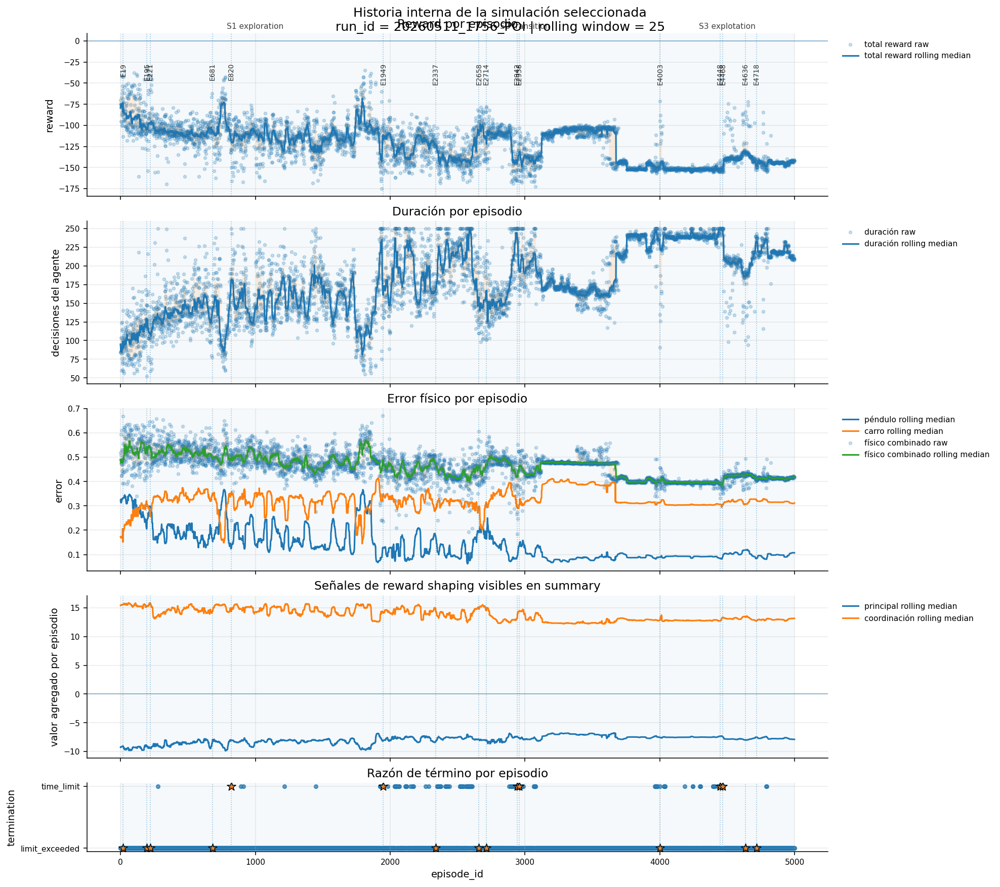

In [61]:
plot_selected_run_episode_story(
    selected_episode_df=selected_episode_df,
    stage_df=training_stage_df,
    panel_specs=SECTION3_EPISODE_STORY_PANELS,
    representative_episodes_df=representative_episodes_df,
    rolling_window=SECTION3_ROLLING_WINDOW,
    title="Historia interna de la simulación seleccionada",
    save_as=None,
)

### 3.7 Figura compacta: relaciones críticas por episodio

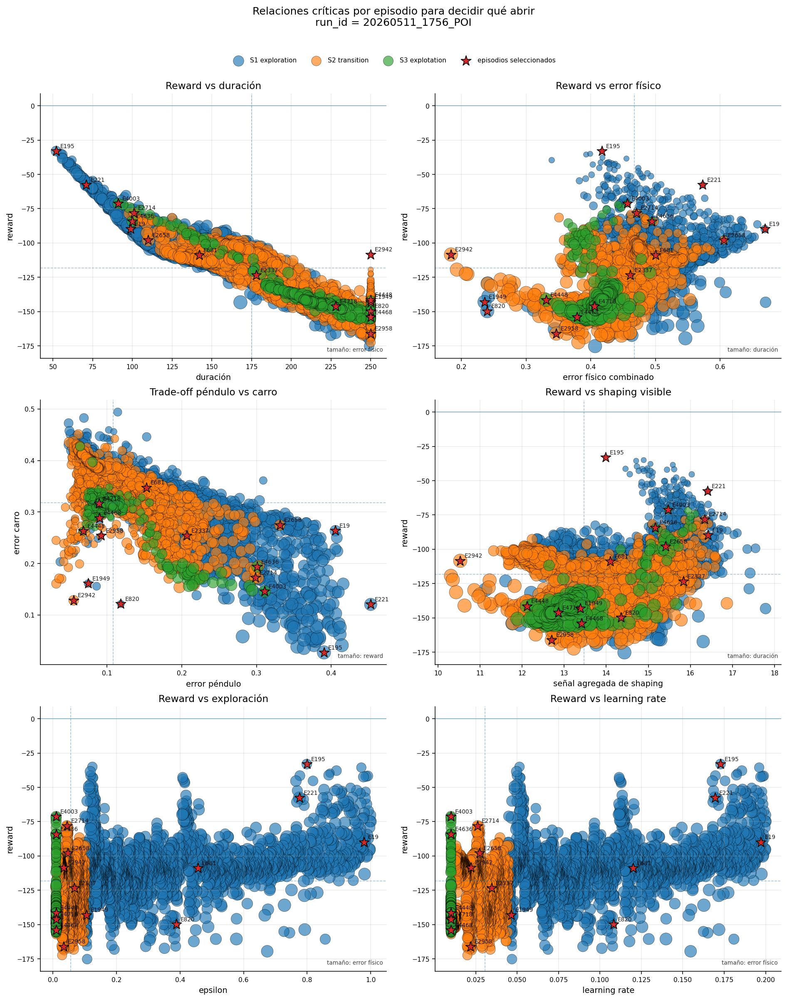

In [62]:
plot_selected_run_relationships(
    selected_episode_df=selected_episode_df,
    stage_df=training_stage_df,
    relationship_specs=SECTION3_RELATIONSHIP_SPECS,
    representative_episodes_df=representative_episodes_df,
    title="Relaciones críticas por episodio para decidir qué abrir",
    n_cols=2,
    save_as=None,
)

### 3.8 Tabla final de episodios representativos

In [67]:
representative_display_cols = [
    "episode_id",
    "training_stage",
    "stage_label",
    "criterion_id",
    "criterion_label",
    REWARD_COL,
    DURATION_COL,
    "pendulum_error_score",
    "cart_error_score",
    "physical_error_score",
    TERMINATION_COL,
]

display(Markdown("### Episodios seleccionados para análisis profundo"))

display(
    representative_episodes_df[
        representative_display_cols
    ]
    .sort_values(["training_stage", "criterion_label", "episode_id"])
    .reset_index(drop=True)
)

SELECTED_EPISODE_IDS = (
    representative_episodes_df["episode_id"].astype(int).tolist()
    if not representative_episodes_df.empty
    else []
)

display(Markdown("### Variable de trabajo para las próximas secciones"))

display(pd.DataFrame({
    "SELECTED_RUN_ID": [SELECTED_RUN_ID],
    "SELECTED_STAGE_ID": [SECTION3_FOCUS_STAGE_ID],
    "SELECTED_EPISODE_IDS": [SELECTED_EPISODE_IDS],
}))

### Episodios seleccionados para análisis profundo

,episode_id,training_stage,stage_label,criterion_id,criterion_label,total_reward,total_agent_decisions,pendulum_error_score,cart_error_score,physical_error_score,end_termination_reason
0,221,S1_exploration,S1 exploration,positive_contradiction,alto reward con error físico alto,-57.633409,71.0,0.452660,0.120492,0.573152,limit_exceeded
1,820,S1_exploration,S1 exploration,negative_contradiction,buen comportamiento físico relativo con reward bajo,-149.695465,250.0,0.118632,0.121400,0.240032,time_limit
2,681,S1_exploration,S1 exploration,stage_typical,episodio típico de la etapa,-108.932053,142.0,0.152966,0.347381,0.500347,limit_exceeded
3,19,S1_exploration,S1 exploration,stage_failure,fallo o episodio físicamente crítico,-89.870466,99.0,0.405445,0.263548,0.668993,limit_exceeded
4,195,S1_exploration,S1 exploration,stage_best_reward,mayor reward de la etapa,-33.017316,52.0,0.390116,0.027250,0.417367,limit_exceeded
5,1949,S1_exploration,S1 exploration,stage_best_physics,mejor física con duración suficiente,-142.992666,250.0,0.074834,0.161025,0.235859,time_limit
6,2658,S2_transition,S2 transition,positive_contradiction | stage_failure,alto reward con error físico alto | fallo o episodio físicamente crítico,-97.847963,110.0,0.331067,0.274713,0.605780,limit_exceeded
7,2958,S2_transition,S2 transition,negative_contradiction,buen comportamiento físico relativo con reward bajo,-166.055061,250.0,0.092493,0.254385,0.346878,time_limit
8,2337,S2_transition,S2 transition,stage_typical,episodio típico de la etapa,-123.412447,178.0,0.207044,0.254249,0.461293,limit_exceeded
9,2714,S2_transition,S2 transition,stage_best_reward,mayor reward de la etapa,-78.087040,101.0,0.298387,0.172278,0.470665,limit_exceeded


### Variable de trabajo para las próximas secciones

,SELECTED_RUN_ID,SELECTED_STAGE_ID,SELECTED_EPISODE_IDS
0,20260511_1756_POI,S3_explotation,"[681, 195, 1949, 19, 221, 820, 2337, 2714, 2942, 2658, 2958, 4718, 4003, 4448, 4636, 4468]"


### 3.9 Vista ligera desde JSON de episodios seleccionados

In [93]:
# ---------------------------------------------------------------------
# Control explícito de episodios a cargar desde JSON
# ---------------------------------------------------------------------
# No modificar SELECTED_EPISODE_IDS directamente para debug.
# SELECTED_EPISODE_IDS debe representar el conjunto analítico completo.
#
# Si quieres cargar menos episodios para pruebas, usa:
#   MAX_EPISODES_TO_LOAD_FOR_SECTION4 = 4
#
# El episodio foco SIEMPRE se agrega aunque no esté dentro del subconjunto.
# ---------------------------------------------------------------------

def unique_int_sequence(values):
    """
    Mantiene orden y elimina duplicados.
    """
    out = []
    seen = set()

    for value in values:
        if value is None:
            continue

        value = int(value)

        if value in seen:
            continue

        seen.add(value)
        out.append(value)

    return out


SELECTED_EPISODE_IDS_ALL = (
    representative_episodes_df["episode_id"].astype(int).tolist()
    if not representative_episodes_df.empty
    else []
)

# ---------------------------------------------------------------------
# Episodio foco.
# ---------------------------------------------------------------------
# Sobrescribir manualmente si quieres forzar uno:
#
#   MANUAL_FOCUS_EPISODE_ID = 4718
#
# Si queda en None, se toma el primer episodio representativo de la etapa foco.
# ---------------------------------------------------------------------

MANUAL_FOCUS_EPISODE_ID = None

if MANUAL_FOCUS_EPISODE_ID is not None:
    FOCUS_EPISODE_ID = int(MANUAL_FOCUS_EPISODE_ID)

else:
    focus_candidates_df = representative_episodes_df.copy()

    if "SECTION3_FOCUS_STAGE_ID" in globals():
        focus_candidates_df = focus_candidates_df.loc[
            focus_candidates_df["training_stage"].astype(str).eq(str(SECTION3_FOCUS_STAGE_ID))
        ]

    if focus_candidates_df.empty:
        focus_candidates_df = representative_episodes_df.copy()

    FOCUS_EPISODE_ID = int(focus_candidates_df.iloc[0]["episode_id"])


# ---------------------------------------------------------------------
# Subconjunto real a cargar desde JSON.
# ---------------------------------------------------------------------
# None = cargar todos los episodios representativos.
# Entero = cargar solo los primeros N, más FOCUS_EPISODE_ID.
# ---------------------------------------------------------------------

MAX_EPISODES_TO_LOAD_FOR_SECTION4 = None
# MAX_EPISODES_TO_LOAD_FOR_SECTION4 = 4

if MAX_EPISODES_TO_LOAD_FOR_SECTION4 is None:
    base_episode_ids_to_load = SELECTED_EPISODE_IDS_ALL
else:
    base_episode_ids_to_load = SELECTED_EPISODE_IDS_ALL[:int(MAX_EPISODES_TO_LOAD_FOR_SECTION4)]

EPISODES_TO_LOAD_IDS = unique_int_sequence([
    *base_episode_ids_to_load,
    FOCUS_EPISODE_ID,
])

SELECTED_EPISODE_IDS = SELECTED_EPISODE_IDS_ALL


display(Markdown("### Episodios representativos completos"))
display(pd.DataFrame({"SELECTED_EPISODE_IDS_ALL": [SELECTED_EPISODE_IDS_ALL]}))

display(Markdown("### Episodio foco"))
display(pd.DataFrame({"FOCUS_EPISODE_ID": [FOCUS_EPISODE_ID]}))

display(Markdown("### Episodios que serán cargados desde JSON"))
display(pd.DataFrame({"EPISODES_TO_LOAD_IDS": [EPISODES_TO_LOAD_IDS]}))

### Episodios representativos completos

,SELECTED_EPISODE_IDS_ALL
0,"[681, 195, 1949, 19, 221, 820, 2337, 2714, 2942, 2658, 2958, 4718, 4003, 4448, 4636, 4468]"


### Episodio foco

,FOCUS_EPISODE_ID
0,4718


### Episodios que serán cargados desde JSON

,EPISODES_TO_LOAD_IDS
0,"[681, 195, 1949, 19, 221, 820, 2337, 2714, 2942, 2658, 2958, 4718, 4003, 4448, 4636, 4468]"


In [94]:
# ---------------------------------------------------------------------
# Celda 3.9 corregida — mapa eficiente episode_id → archivo de chunk
# ---------------------------------------------------------------------
# No recorre todos los JSON/chunks.
# 1. Descubre archivos tipo episodes_chunks_0000, con o sin extensión visible.
# 2. Busca el tamaño de chunk en metadata, especialmente en data_handling.
# 3. Si no encuentra un valor inequívoco, infiere chunk_size desde summary y n_chunks.
# 4. Carga solo los chunks necesarios para SELECTED_EPISODE_IDS.
# ---------------------------------------------------------------------

import json
import re
from pathlib import Path

try:
    import ijson
    IJSON_AVAILABLE = True
except ImportError:
    ijson = None
    IJSON_AVAILABLE = False


# ---------------------------------------------------------------------
# Configuración local
# ---------------------------------------------------------------------

EPISODE_CHUNK_SIZE_OVERRIDE = None
# Ejemplo:
# EPISODE_CHUNK_SIZE_OVERRIDE = 100

EPISODE_CHUNK_SIZE_METADATA_PATH_OVERRIDE = None
# Ejemplo:
# EPISODE_CHUNK_SIZE_METADATA_PATH_OVERRIDE = "config_data_summary.data_handling.episodes_per_chunk"

ALLOW_INFERRED_CHUNK_SIZE = True
# True porque algunas corridas antiguas pueden no tener una llave explícita
# o pueden usar nombres distintos para el parámetro de chunk.

USE_STREAMING_JSON_IF_AVAILABLE = True
EPISODE_CHUNK_NEIGHBOR_SEARCH = True

EPISODE_CHUNK_FILENAME_REGEX = r"episodes?_chunks?_(\d+)"


# ---------------------------------------------------------------------
# Helpers generales
# ---------------------------------------------------------------------

def get_nested_value(obj, dotted_path, default=None):
    current = obj

    for part in str(dotted_path).split("."):
        if not isinstance(current, dict) or part not in current:
            return default
        current = current[part]

    return current


def iter_nested_items(obj, parent_key=""):
    if isinstance(obj, dict):
        for key, value in obj.items():
            path = f"{parent_key}.{key}" if parent_key else str(key)
            yield from iter_nested_items(value, path)
    else:
        yield parent_key, obj


def natural_sort_key(path):
    text = Path(path).name
    parts = re.split(r"(\d+)", text)
    return [int(p) if p.isdigit() else p.lower() for p in parts]


def as_positive_int(value):
    if isinstance(value, bool):
        return None

    try:
        number = int(value)
    except Exception:
        return None

    if number <= 0:
        return None

    return number


def extract_chunk_index_from_filename(path):
    match = re.search(
        EPISODE_CHUNK_FILENAME_REGEX,
        Path(path).name.lower(),
        flags=re.IGNORECASE,
    )

    if match is None:
        return None

    return int(match.group(1))


# ---------------------------------------------------------------------
# Descubrimiento robusto de chunks
# ---------------------------------------------------------------------

def discover_episode_chunk_files(run_dir):
    """
    Descubre archivos de episodios tipo:
        episodes_chunks_0000
        episodes_chunks_0000.json
        episode_chunks_0000
        episode_chunks_0000.json

    No exige extensión .json porque Windows puede ocultarla y algunas
    corridas pueden haber guardado los chunks sin extensión.
    """
    run_dir = Path(run_dir)

    direct_files = [path for path in run_dir.iterdir() if path.is_file()]
    matched = []

    for path in direct_files:
        name = path.name.lower()

        if re.search(EPISODE_CHUNK_FILENAME_REGEX, name, flags=re.IGNORECASE):
            matched.append(path.resolve())

    if not matched:
        # Fallback recursivo, pero solo por nombre de chunk.
        for path in run_dir.rglob("*"):
            if not path.is_file():
                continue

            name = path.name.lower()

            if re.search(EPISODE_CHUNK_FILENAME_REGEX, name, flags=re.IGNORECASE):
                matched.append(path.resolve())

    matched = sorted(set(matched), key=natural_sort_key)

    if not matched:
        raise FileNotFoundError(
            f"No se encontraron archivos tipo episodes_chunks_XXXX en: {run_dir}"
        )

    rows = []

    for fallback_order, path in enumerate(matched):
        parsed_index = extract_chunk_index_from_filename(path)

        rows.append({
            "chunk_path": str(path),
            "chunk_file": path.name,
            "parsed_chunk_index": parsed_index,
            "fallback_order": fallback_order,
        })

    chunk_files_df = pd.DataFrame(rows)

    if chunk_files_df["parsed_chunk_index"].notna().all():
        chunk_files_df["chunk_file_index"] = chunk_files_df["parsed_chunk_index"].astype(int)
    else:
        chunk_files_df["chunk_file_index"] = chunk_files_df["fallback_order"].astype(int)

    chunk_files_df = (
        chunk_files_df
        .sort_values("chunk_file_index")
        .reset_index(drop=True)
    )

    chunk_files = [Path(path) for path in chunk_files_df["chunk_path"]]

    return chunk_files, chunk_files_df


# ---------------------------------------------------------------------
# Resolución de tamaño de chunk desde metadata
# ---------------------------------------------------------------------

def find_episode_chunk_size_candidates(metadata):
    """
    Busca candidatos de tamaño de chunk dentro de metadata.

    Prioriza rutas con:
    - data_handling
    - episode / episodes
    - chunk / file / json
    """
    exact_leaf_names = {
        "episodes_per_chunk",
        "episodes_per_file",
        "episodes_per_json",
        "episode_chunk_size",
        "episodes_chunk_size",
        "chunk_episode_size",
        "chunk_size_episodes",
        "max_episodes_per_chunk",
        "max_episodes_per_file",
        "episode_batch_size",
        "chunk_size",
    }

    excluded_leaf_names = {
        "agent_state_save_frequency",
        "save_frequency",
        "plot_save_frequency",
        "n_episodes",
        "episode_duration_sec",
        "decision_interval_sec",
    }

    rows = []

    for path, value in iter_nested_items(metadata):
        leaf = path.split(".")[-1].lower()

        if leaf in excluded_leaf_names:
            continue

        numeric_value = as_positive_int(value)

        if numeric_value is None:
            continue

        path_lower = path.lower()

        score = 0

        if leaf in exact_leaf_names:
            score += 100

        if "data_handling" in path_lower:
            score += 40

        if "episode" in path_lower or "episodes" in path_lower:
            score += 25

        if "chunk" in path_lower or "file" in path_lower or "json" in path_lower:
            score += 25

        # Evitar candidatos genéricos que no hablan de chunk/file/json/episode.
        if score < 60:
            continue

        rows.append({
            "metadata_path": path,
            "candidate_value": int(numeric_value),
            "score": int(score),
        })

    if not rows:
        return pd.DataFrame(
            columns=[
                "metadata_path",
                "candidate_value",
                "score",
                "expected_n_chunks",
                "chunk_count_abs_error",
            ]
        )

    return (
        pd.DataFrame(rows)
        .sort_values(["score", "metadata_path"], ascending=[False, True])
        .reset_index(drop=True)
    )


def enrich_chunk_size_candidates_with_consistency(
    candidates_df,
    selected_summary_df,
    n_chunk_files,
):
    """
    Evalúa consistencia del candidato con:
        n_episodes observados en summary
        número de archivos chunk encontrados
    """
    if candidates_df.empty:
        return candidates_df

    episode_min = int(selected_summary_df[EPISODE_COL].min())
    episode_max = int(selected_summary_df[EPISODE_COL].max())

    # En el sistema actual episode_id viene de range(n_episodes), por tanto usualmente es 0-based.
    if episode_min == 0:
        n_episodes_observed = episode_max + 1
    else:
        n_episodes_observed = episode_max - episode_min + 1

    out = candidates_df.copy()

    out["n_episodes_observed"] = n_episodes_observed
    out["n_chunk_files"] = int(n_chunk_files)
    out["expected_n_chunks"] = np.ceil(
        out["n_episodes_observed"] / out["candidate_value"]
    ).astype(int)

    out["chunk_count_abs_error"] = (
        out["expected_n_chunks"] - out["n_chunk_files"]
    ).abs()

    out = out.sort_values(
        [
            "chunk_count_abs_error",
            "score",
            "candidate_value",
            "metadata_path",
        ],
        ascending=[True, False, True, True],
    ).reset_index(drop=True)

    return out


def infer_chunk_size_from_summary_and_files(selected_summary_df, n_chunk_files):
    """
    Fallback controlado:
    Si hay summary y archivos chunk, se infiere tamaño promedio de chunk.
    """
    episode_min = int(selected_summary_df[EPISODE_COL].min())
    episode_max = int(selected_summary_df[EPISODE_COL].max())

    if episode_min == 0:
        n_episodes_observed = episode_max + 1
    else:
        n_episodes_observed = episode_max - episode_min + 1

    return int(np.ceil(n_episodes_observed / max(int(n_chunk_files), 1)))


def resolve_episode_chunk_size(
    metadata,
    selected_summary_df,
    chunk_files_df,
    override=None,
    metadata_path_override=None,
    allow_inferred=True,
):
    """
    Resuelve episodes_per_chunk.

    Prioridad:
    1. override manual.
    2. ruta exacta manual de metadata.
    3. mejor candidato encontrado en metadata, ponderado por consistencia.
    4. inferencia desde summary y número de chunks.
    """
    if override is not None:
        value = as_positive_int(override)

        if value is None:
            raise ValueError("EPISODE_CHUNK_SIZE_OVERRIDE debe ser entero positivo.")

        return value, "manual_override", pd.DataFrame([{
            "metadata_path": "manual_override",
            "candidate_value": value,
            "score": 999,
        }])

    if metadata_path_override is not None:
        raw_value = get_nested_value(metadata, metadata_path_override)
        value = as_positive_int(raw_value)

        if value is None:
            raise ValueError(
                f"No se pudo leer un entero positivo desde "
                f"{metadata_path_override}"
            )

        return value, metadata_path_override, pd.DataFrame([{
            "metadata_path": metadata_path_override,
            "candidate_value": value,
            "score": 999,
        }])

    candidates_df = find_episode_chunk_size_candidates(metadata)

    candidates_df = enrich_chunk_size_candidates_with_consistency(
        candidates_df=candidates_df,
        selected_summary_df=selected_summary_df,
        n_chunk_files=chunk_files_df.shape[0],
    )

    if not candidates_df.empty:
        best = candidates_df.iloc[0]

        # Si hay un candidato perfectamente consistente, usarlo.
        if int(best["chunk_count_abs_error"]) == 0:
            return (
                int(best["candidate_value"]),
                str(best["metadata_path"]),
                candidates_df,
            )

        # Si no es perfecto, igual se permite usar el mejor solo si es claramente cercano.
        if int(best["chunk_count_abs_error"]) <= 1:
            return (
                int(best["candidate_value"]),
                str(best["metadata_path"]),
                candidates_df,
            )

    if allow_inferred:
        inferred = infer_chunk_size_from_summary_and_files(
            selected_summary_df=selected_summary_df,
            n_chunk_files=chunk_files_df.shape[0],
        )

        inferred_row = pd.DataFrame([{
            "metadata_path": "inferred_from_summary_and_chunk_count",
            "candidate_value": inferred,
            "score": 0,
            "expected_n_chunks": chunk_files_df.shape[0],
            "chunk_count_abs_error": 0,
        }])

        if candidates_df.empty:
            candidates_df = inferred_row
        else:
            candidates_df = pd.concat(
                [candidates_df, inferred_row],
                ignore_index=True,
                sort=False,
            )

        return inferred, "inferred_from_summary_and_chunk_count", candidates_df

    raise ValueError(
        "No se pudo resolver episodes_per_chunk. "
        "Define EPISODE_CHUNK_SIZE_OVERRIDE manualmente."
    )


# ---------------------------------------------------------------------
# Construcción del mapa episode_id → chunk_path
# ---------------------------------------------------------------------

def build_episode_chunk_map_df(
    selected_episode_ids,
    run_dir,
    metadata,
    selected_summary_df,
):
    selected_episode_ids = list(dict.fromkeys(map(int, selected_episode_ids)))

    if len(selected_episode_ids) == 0:
        raise ValueError("SELECTED_EPISODE_IDS está vacío. Revisar Sección 3.")

    chunk_files, chunk_files_df = discover_episode_chunk_files(run_dir)

    episodes_per_chunk, chunk_size_source, candidates_df = resolve_episode_chunk_size(
        metadata=metadata,
        selected_summary_df=selected_summary_df,
        chunk_files_df=chunk_files_df,
        override=EPISODE_CHUNK_SIZE_OVERRIDE,
        metadata_path_override=EPISODE_CHUNK_SIZE_METADATA_PATH_OVERRIDE,
        allow_inferred=ALLOW_INFERRED_CHUNK_SIZE,
    )

    available_file_indexes = set(chunk_files_df["chunk_file_index"].astype(int))
    min_file_index = int(chunk_files_df["chunk_file_index"].min())

    # En la captura los chunks parten en 0000. Si una corrida partiera en 0001,
    # este offset lo corrige sin tocar la lógica de episode_id.
    file_index_offset = 0 if min_file_index == 0 else min_file_index

    path_by_file_index = (
        chunk_files_df
        .set_index("chunk_file_index")["chunk_path"]
        .to_dict()
    )

    rows = []

    for order, episode_id in enumerate(selected_episode_ids):
        logical_chunk_index = int(episode_id) // int(episodes_per_chunk)
        episode_index_in_chunk = int(episode_id) % int(episodes_per_chunk)

        file_chunk_index = logical_chunk_index + file_index_offset

        if file_chunk_index not in available_file_indexes:
            raise IndexError(
                f"episode_id={episode_id} apunta a logical_chunk_index={logical_chunk_index} "
                f"y file_chunk_index={file_chunk_index}, pero ese chunk no existe. "
                f"Revisar episodes_per_chunk={episodes_per_chunk} o los nombres de archivo."
            )

        chunk_path = Path(path_by_file_index[file_chunk_index])

        rows.append({
            "selection_order": order,
            "episode_id": int(episode_id),
            "episodes_per_chunk": int(episodes_per_chunk),
            "episode_chunk_size_source": chunk_size_source,
            "logical_chunk_index": int(logical_chunk_index),
            "file_chunk_index": int(file_chunk_index),
            "episode_index_in_chunk": int(episode_index_in_chunk),
            "chunk_path": str(chunk_path),
            "chunk_file": chunk_path.name,
        })

    return pd.DataFrame(rows), candidates_df, chunk_files, chunk_files_df


# ---------------------------------------------------------------------
# Lectura eficiente de episodios dentro de chunks concretos
# ---------------------------------------------------------------------

def unwrap_episode_record(record):
    """
    Normaliza registros que puedan venir directos o envueltos.
    """
    if isinstance(record, dict) and {"episode_id", "step_data", "interval_data", "end_episode_data"}.issubset(record.keys()):
        return record

    if isinstance(record, dict):
        for key in ["episode_data", "episode", "record", "data"]:
            value = record.get(key)

            if isinstance(value, dict) and {"episode_id", "step_data", "interval_data", "end_episode_data"}.issubset(value.keys()):
                return value

    return record


def extract_episode_id_from_record(record):
    record = unwrap_episode_record(record)

    if isinstance(record, dict) and "episode_id" in record:
        return int(record["episode_id"])

    return None


def extract_episode_sequence_from_json_object(obj):
    """
    Soporta formatos frecuentes:
    - lista directa de episodios;
    - dict con key episodes / records / data / etc.;
    - dict mapping episode_id → episode_record;
    - episodio único.
    """
    if isinstance(obj, list):
        return obj

    if isinstance(obj, dict):
        if {"episode_id", "step_data", "interval_data", "end_episode_data"}.issubset(obj.keys()):
            return [obj]

        candidate_keys = [
            "episodes",
            "episode_data",
            "episodes_data",
            "episode_records",
            "records",
            "data",
            "chunk",
            "items",
        ]

        for key in candidate_keys:
            value = obj.get(key)

            if isinstance(value, list):
                return value

            if isinstance(value, dict):
                nested = extract_episode_sequence_from_json_object(value)

                if nested:
                    return nested

        # Caso: {"0": {...episode...}, "1": {...episode...}}
        values = list(obj.values())

        if values and all(isinstance(v, dict) for v in values):
            has_episode_like_values = any(
                extract_episode_id_from_record(v) is not None
                for v in values[: min(len(values), 5)]
            )

            if has_episode_like_values:
                return values

    raise TypeError("No se pudo interpretar el chunk como secuencia de episodios.")


def stream_episode_records_from_chunk(chunk_path, target_episode_ids):
    """
    Streaming opcional con ijson.
    Si ijson no existe o el formato no coincide, retorna lo encontrado.
    """
    if not IJSON_AVAILABLE:
        return {}

    target_episode_ids = set(map(int, target_episode_ids))
    found = {}

    prefixes = [
        "item",
        "episodes.item",
        "episode_data.item",
        "episodes_data.item",
        "episode_records.item",
        "records.item",
        "data.item",
        "chunk.item",
        "items.item",
    ]

    for prefix in prefixes:
        try:
            with open(chunk_path, "rb") as f:
                for raw_record in ijson.items(f, prefix):
                    record = unwrap_episode_record(raw_record)
                    episode_id = extract_episode_id_from_record(record)

                    if episode_id in target_episode_ids:
                        found[int(episode_id)] = record

                    if len(found) == len(target_episode_ids):
                        return found

        except Exception:
            continue

    return found


def load_episode_records_from_chunk(
    chunk_path,
    target_episode_ids,
    expected_index_by_episode=None,
):
    """
    Abre un solo chunk y extrae solo los episodios target.

    1. Intenta streaming con ijson.
    2. Si no, carga el chunk directo.
    3. Usa episode_index_in_chunk para acceso O(1) cuando el formato es lista.
    4. Si no coincide, hace búsqueda acotada dentro de ese chunk.
    """
    target_episode_ids = set(map(int, target_episode_ids))
    expected_index_by_episode = expected_index_by_episode or {}

    if USE_STREAMING_JSON_IF_AVAILABLE and IJSON_AVAILABLE:
        found = stream_episode_records_from_chunk(
            chunk_path=chunk_path,
            target_episode_ids=target_episode_ids,
        )

        if len(found) == len(target_episode_ids):
            return found

    with open(chunk_path, "r", encoding="utf-8") as f:
        obj = json.load(f)

    episodes = extract_episode_sequence_from_json_object(obj)
    found = {}

    # Acceso directo por índice esperado.
    for episode_id in target_episode_ids:
        expected_idx = expected_index_by_episode.get(int(episode_id))

        if expected_idx is None:
            continue

        if 0 <= expected_idx < len(episodes):
            candidate = unwrap_episode_record(episodes[expected_idx])
            candidate_id = extract_episode_id_from_record(candidate)

            if candidate_id == int(episode_id):
                found[int(episode_id)] = candidate

    # Búsqueda acotada dentro de este chunk para faltantes.
    missing = target_episode_ids - set(found.keys())

    if missing:
        for raw_record in episodes:
            record = unwrap_episode_record(raw_record)
            episode_id = extract_episode_id_from_record(record)

            if episode_id in missing:
                found[int(episode_id)] = record

            if len(found) == len(target_episode_ids):
                break

    return found


def load_selected_episode_records_from_map(
    episode_chunk_map_df,
    chunk_files=None,
    neighbor_search=True,
):
    """
    Carga episodios seleccionados abriendo solo los chunks necesarios.
    """
    records_by_episode = {}
    load_rows = []

    for chunk_path, part_df in episode_chunk_map_df.groupby("chunk_path", sort=False):
        chunk_path = Path(chunk_path)

        target_ids = part_df["episode_id"].astype(int).tolist()

        expected_index_by_episode = dict(
            zip(
                part_df["episode_id"].astype(int),
                part_df["episode_index_in_chunk"].astype(int),
            )
        )

        found = load_episode_records_from_chunk(
            chunk_path=chunk_path,
            target_episode_ids=target_ids,
            expected_index_by_episode=expected_index_by_episode,
        )

        for episode_id in target_ids:
            loaded = episode_id in found

            if loaded:
                records_by_episode[int(episode_id)] = found[int(episode_id)]

            load_rows.append({
                "episode_id": int(episode_id),
                "loaded": bool(loaded),
                "chunk_path": str(chunk_path),
                "load_note": "direct_chunk" if loaded else "not_found_in_direct_chunk",
            })

    # Recuperación en chunks vecinos por si hay offset histórico.
    if neighbor_search and chunk_files is not None:
        still_missing = [
            int(eid)
            for eid in episode_chunk_map_df["episode_id"].astype(int)
            if int(eid) not in records_by_episode
        ]

        chunk_files = [Path(path) for path in chunk_files]

        for episode_id in still_missing:
            row = episode_chunk_map_df.loc[
                episode_chunk_map_df["episode_id"].astype(int).eq(int(episode_id))
            ].iloc[0]

            logical_chunk_index = int(row["logical_chunk_index"])
            neighbor_indexes = [
                idx for idx in [logical_chunk_index - 1, logical_chunk_index + 1]
                if 0 <= idx < len(chunk_files)
            ]

            for neighbor_index in neighbor_indexes:
                neighbor_path = chunk_files[neighbor_index]

                found = load_episode_records_from_chunk(
                    chunk_path=neighbor_path,
                    target_episode_ids=[episode_id],
                    expected_index_by_episode={},
                )

                if episode_id in found:
                    records_by_episode[int(episode_id)] = found[int(episode_id)]

                    load_rows.append({
                        "episode_id": int(episode_id),
                        "loaded": True,
                        "chunk_path": str(neighbor_path),
                        "load_note": "neighbor_chunk_recovery",
                    })
                    break

    load_log_df = pd.DataFrame(load_rows)

    missing_final = [
        int(eid)
        for eid in episode_chunk_map_df["episode_id"].astype(int)
        if int(eid) not in records_by_episode
    ]

    if missing_final:
        raise KeyError(
            f"No se pudieron cargar los episodios {missing_final}. "
            "Revisar episodes_per_chunk, nombres de chunks o estructura interna del JSON."
        )

    return records_by_episode, load_log_df


def build_selected_episode_json_preview_from_records(records_by_episode, chunk_map_df):
    source_by_episode = (
        chunk_map_df
        .set_index("episode_id")["chunk_path"]
        .to_dict()
    )

    rows = []

    for episode_id, episode_record in records_by_episode.items():
        record = unwrap_episode_record(episode_record)

        step_data = record.get("step_data", {})
        interval_data = record.get("interval_data", {})
        end_data = record.get("end_episode_data", {})

        rows.append({
            "episode_id": int(episode_id),
            "chunk_path": source_by_episode.get(int(episode_id), ""),
            "json_n_step": step_data.get("n_step", np.nan),
            "json_n_interval": interval_data.get("n_interval", np.nan),
            "json_total_reward": end_data.get("total_reward", np.nan),
            "json_total_agent_decisions": end_data.get("total_agent_decisions", np.nan),
            "json_end_termination_reason": end_data.get("end_termination_reason", np.nan),
        })

    return (
        pd.DataFrame(rows)
        .sort_values("episode_id")
        .reset_index(drop=True)
    )


# ---------------------------------------------------------------------
# Ejecución de la celda 3.9
# ---------------------------------------------------------------------
# Usa EPISODES_TO_LOAD_IDS, no SELECTED_EPISODE_IDS recortado.
# Esto evita que el episodio foco quede fuera de los JSON cargados.
# ---------------------------------------------------------------------

selected_run_metadata = metadata_by_run[SELECTED_RUN_ID]

if "EPISODES_TO_LOAD_IDS" not in globals():
    EPISODES_TO_LOAD_IDS = unique_int_sequence([
        *SELECTED_EPISODE_IDS,
        FOCUS_EPISODE_ID if "FOCUS_EPISODE_ID" in globals() else None,
    ])


chunk_map_result = build_episode_chunk_map_df(
    selected_episode_ids=EPISODES_TO_LOAD_IDS,
    run_dir=selected_run_dir,
    metadata=selected_run_metadata,
    selected_summary_df=selected_summary_raw_df,
)

# Compatibilidad con versiones anteriores de build_episode_chunk_map_df:
# algunas devuelven 3 objetos y otras devuelven 4.
if len(chunk_map_result) == 4:
    (
        episode_chunk_map_df,
        data_handling_chunk_size_candidates_df,
        selected_chunk_files,
        selected_chunk_files_df,
    ) = chunk_map_result
elif len(chunk_map_result) == 3:
    (
        episode_chunk_map_df,
        data_handling_chunk_size_candidates_df,
        selected_chunk_files,
    ) = chunk_map_result

    selected_chunk_files_df = pd.DataFrame({
        "chunk_path": [str(path) for path in selected_chunk_files],
        "chunk_file": [Path(path).name for path in selected_chunk_files],
        "chunk_file_index": list(range(len(selected_chunk_files))),
    })
else:
    raise ValueError(
        "build_episode_chunk_map_df debe retornar 3 o 4 objetos."
    )


selected_episode_records_by_id, selected_episode_load_log_df = load_selected_episode_records_from_map(
    episode_chunk_map_df=episode_chunk_map_df,
    chunk_files=selected_chunk_files,
    neighbor_search=EPISODE_CHUNK_NEIGHBOR_SEARCH,
)

selected_episode_json_preview_df = build_selected_episode_json_preview_from_records(
    records_by_episode=selected_episode_records_by_id,
    chunk_map_df=episode_chunk_map_df,
)


display(Markdown("### Episodios solicitados para carga"))
display(pd.DataFrame({"EPISODES_TO_LOAD_IDS": [EPISODES_TO_LOAD_IDS]}))

display(Markdown("### Archivos de chunk detectados"))
display(selected_chunk_files_df)

display(Markdown("### Candidatos de tamaño de chunk encontrados en metadata"))
display(data_handling_chunk_size_candidates_df)

display(Markdown("### Mapa eficiente episode_id → archivo de chunk"))
display(episode_chunk_map_df)

display(Markdown("### Log de carga de episodios seleccionados"))
display(selected_episode_load_log_df)

display(Markdown("### Vista ligera desde JSON de episodios seleccionados"))
display(selected_episode_json_preview_df)

display(Markdown(f"### ijson disponible: `{IJSON_AVAILABLE}`"))

### Episodios solicitados para carga

,EPISODES_TO_LOAD_IDS
0,"[681, 195, 1949, 19, 221, 820, 2337, 2714, 2942, 2658, 2958, 4718, 4003, 4448, 4636, 4468]"


### Archivos de chunk detectados

,chunk_path,chunk_file,parsed_chunk_index,fallback_order,chunk_file_index
0,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0000.json,episodes_chunks_0000.json,0,0,0
1,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0001.json,episodes_chunks_0001.json,1,1,1
2,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0002.json,episodes_chunks_0002.json,2,2,2
3,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0003.json,episodes_chunks_0003.json,3,3,3
4,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0004.json,episodes_chunks_0004.json,4,4,4
5,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0005.json,episodes_chunks_0005.json,5,5,5
6,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0006.json,episodes_chunks_0006.json,6,6,6
7,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0007.json,episodes_chunks_0007.json,7,7,7
8,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0008.json,episodes_chunks_0008.json,8,8,8
9,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0009.json,episodes_chunks_0009.json,9,9,9


### Candidatos de tamaño de chunk encontrados en metadata

,metadata_path,candidate_value,score,n_episodes_observed,n_chunk_files,expected_n_chunks,chunk_count_abs_error
0,config_main.data_handling.episodes_per_dataset_chunk,250,90,5000.0,50.0,20,30
1,inferred_from_summary_and_chunk_count,100,0,NaN,NaN,50,0


### Mapa eficiente episode_id → archivo de chunk

,selection_order,episode_id,episodes_per_chunk,episode_chunk_size_source,logical_chunk_index,file_chunk_index,episode_index_in_chunk,chunk_path,chunk_file
0,0,681,100,inferred_from_summary_and_chunk_count,6,6,81,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0006.json,episodes_chunks_0006.json
1,1,195,100,inferred_from_summary_and_chunk_count,1,1,95,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0001.json,episodes_chunks_0001.json
2,2,1949,100,inferred_from_summary_and_chunk_count,19,19,49,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0019.json,episodes_chunks_0019.json
3,3,19,100,inferred_from_summary_and_chunk_count,0,0,19,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0000.json,episodes_chunks_0000.json
4,4,221,100,inferred_from_summary_and_chunk_count,2,2,21,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0002.json,episodes_chunks_0002.json
5,5,820,100,inferred_from_summary_and_chunk_count,8,8,20,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0008.json,episodes_chunks_0008.json
6,6,2337,100,inferred_from_summary_and_chunk_count,23,23,37,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0023.json,episodes_chunks_0023.json
7,7,2714,100,inferred_from_summary_and_chunk_count,27,27,14,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0027.json,episodes_chunks_0027.json
8,8,2942,100,inferred_from_summary_and_chunk_count,29,29,42,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0029.json,episodes_chunks_0029.json
9,9,2658,100,inferred_from_summary_and_chunk_count,26,26,58,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0026.json,episodes_chunks_0026.json


### Log de carga de episodios seleccionados

,episode_id,loaded,chunk_path,load_note
0,681,True,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0006.json,direct_chunk
1,195,True,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0001.json,direct_chunk
2,1949,True,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0019.json,direct_chunk
3,19,True,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0000.json,direct_chunk
4,221,True,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0002.json,direct_chunk
5,820,True,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0008.json,direct_chunk
6,2337,True,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0023.json,direct_chunk
7,2714,True,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0027.json,direct_chunk
8,2942,True,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0029.json,direct_chunk
9,2958,True,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0029.json,direct_chunk


### Vista ligera desde JSON de episodios seleccionados

,episode_id,chunk_path,json_n_step,json_n_interval,json_total_reward,json_total_agent_decisions,json_end_termination_reason
0,19,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0000.json,1974,99,-89.87046638126749,99,limit_exceeded
1,195,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0001.json,1027,52,-33.01731641549218,52,limit_exceeded
2,221,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0002.json,1417,71,-57.63340908832907,71,limit_exceeded
3,681,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0006.json,2839,142,-108.93205325973864,142,limit_exceeded
4,820,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0008.json,5001,250,-149.6954651832601,250,time_limit
5,1949,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0019.json,5001,250,-142.9926659778502,250,time_limit
6,2337,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0023.json,3552,178,-123.41244735402655,178,limit_exceeded
7,2658,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0026.json,2195,110,-97.84796319689838,110,limit_exceeded
8,2714,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0027.json,2018,101,-78.08703958076201,101,limit_exceeded
9,2942,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0029.json,5001,250,-108.41034876787802,250,time_limit


### ijson disponible: `True`

## Sección 4 — Apertura eficiente y radiografía comparativa de episodios seleccionados

**Pregunta analítica general:**  
Una vez seleccionados los episodios representativos, ¿qué ocurrió realmente dentro de ellos a nivel de trayectoria física, control aplicado y recompensa por intervalo?

**Objetivo específico:**  
Abrir solo los JSON necesarios y construir una primera radiografía multiepisodio que permita decidir qué episodio merece análisis causal fino.

**Criterio:**  
Esta sección no vuelve a recorrer todos los chunks.  
Usa el mapa `episode_chunk_map_df` y carga solo los chunks donde viven los episodios seleccionados.

**Salidas principales:**

- `episode_chunk_map_df`
- `selected_episode_records_by_id`
- `episode_frames_by_id`
- `selected_step_long_df`
- `selected_interval_long_df`
- `selected_end_df`
- `section4_episode_profile_df`
- `FOCUS_EPISODE_ID`
- `focus_step_df`
- `focus_interval_df`
- `focus_end_data`

### 4.1 Configuración de la sección

In [100]:
# ---------------------------------------------------------------------
# Selección de episodios para visualización multiepisodio.
# ---------------------------------------------------------------------

SECTION4_MAX_EPISODES_IN_SIGNATURE = 12
SECTION4_SIGNATURE_BINS = 220

if "EPISODES_TO_LOAD_IDS" not in globals():
    EPISODES_TO_LOAD_IDS = unique_int_sequence([
        *SELECTED_EPISODE_IDS,
        FOCUS_EPISODE_ID if "FOCUS_EPISODE_ID" in globals() else None,
    ])

SECTION4_EPISODE_IDS_FOR_SIGNATURE = EPISODES_TO_LOAD_IDS[:SECTION4_MAX_EPISODES_IN_SIGNATURE]


# ---------------------------------------------------------------------
# Episodio foco.
# ---------------------------------------------------------------------
# FOCUS_EPISODE_ID debería venir de la celda reemplazada de Sección 3.
# Si no existe, se define aquí como respaldo.
# ---------------------------------------------------------------------

if "FOCUS_EPISODE_ID" not in globals():
    focus_candidates_df = representative_episodes_df.copy()

    if "SECTION3_FOCUS_STAGE_ID" in globals():
        focus_candidates_df = focus_candidates_df.loc[
            focus_candidates_df["training_stage"].astype(str).eq(str(SECTION3_FOCUS_STAGE_ID))
        ]

    if focus_candidates_df.empty:
        focus_candidates_df = representative_episodes_df.copy()

    FOCUS_EPISODE_ID = int(focus_candidates_df.iloc[0]["episode_id"])


# Asegurar que el foco esté dentro de los episodios cargables.
EPISODES_TO_LOAD_IDS = unique_int_sequence([
    *EPISODES_TO_LOAD_IDS,
    FOCUS_EPISODE_ID,
])


# ---------------------------------------------------------------------
# Variables físicas foco.
# ---------------------------------------------------------------------

SECTION4_FOCUS_STATE_VARS = [
    "pendulum_angle",
    "cart_position",
]

SECTION4_ADDITIONAL_STATE_VARS = [
    "pendulum_velocity",
    "cart_velocity",
]


# ---------------------------------------------------------------------
# Señales para matriz temporal comparativa.
# source:
#   step     → step_data
#   interval → interval_data
# ---------------------------------------------------------------------

SECTION4_SIGNATURE_SIGNAL_SPECS = [
    {
        "source": "step",
        "value_col": "pendulum_angle_norm",
        "title": "Ángulo del péndulo",
        "label": "pendulum_angle_norm",
    },
    {
        "source": "step",
        "value_col": "cart_position_norm",
        "title": "Posición del carro",
        "label": "cart_position_norm",
    },
    {
        "source": "step",
        "value_col": "u_total",
        "title": "Control total aplicado",
        "label": "u_total",
    },
    {
        "source": "step",
        "value_col": "is_saturated_global",
        "title": "Saturación global",
        "label": "is_saturated_global",
    },
    {
        "source": "interval",
        "value_col": "global_interval_reward",
        "title": "Reward global por intervalo",
        "label": "global_interval_reward",
    },
]


# ---------------------------------------------------------------------
# Control global y reward para radiografía del episodio foco.
# ---------------------------------------------------------------------

SECTION4_GLOBAL_CONTROL_COLS = [
    "u_total_norm",
    "u_total_saturated",
    "u_total",
    "cart_force",
]

SECTION4_REWARD_INTERVAL_COLS = [
    "global_interval_reward",
    "principal_reward",
    "component_extra_total",
    "coordination_reward_total",
]

SECTION4_AGENT_ACTION_PREFIX = "action_"


display(Markdown("### Configuración de carga para Sección 4"))
display(pd.DataFrame([{
    "FOCUS_EPISODE_ID": int(FOCUS_EPISODE_ID),
    "EPISODES_TO_LOAD_IDS": EPISODES_TO_LOAD_IDS,
    "SECTION4_EPISODE_IDS_FOR_SIGNATURE": SECTION4_EPISODE_IDS_FOR_SIGNATURE,
}]))

### Configuración de carga para Sección 4

,FOCUS_EPISODE_ID,EPISODES_TO_LOAD_IDS,SECTION4_EPISODE_IDS_FOR_SIGNATURE
0,4718,"[681, 195, 1949, 19, 221, 820, 2337, 2714, 2942, 2658, 2958, 4718, 4003, 4448, 4636, 4468]","[681, 195, 1949, 19, 221, 820, 2337, 2714, 2942, 2658, 2958, 4718]"


### 4.2 Helpers para frames, metadata y perfiles de episodio

In [86]:
# ---------------------------------------------------------------------
# Conversión segura de dict-de-listas a DataFrame
# ---------------------------------------------------------------------

SECTION4_FRAME_AUDIT_LOG = []


def sequence_like(value):
    return isinstance(value, (list, tuple, np.ndarray, pd.Series))


def records_dict_to_frame(record_dict, scalar_keys=None, record_name="record"):
    """
    Convierte step_data o interval_data a DataFrame.

    Ignora llaves escalares como n_step / n_interval.
    Si hay columnas de longitudes distintas, rellena con NaN y registra auditoría.
    """
    scalar_keys = set(scalar_keys or [])

    target_len = 0

    for key, value in record_dict.items():
        if key in scalar_keys or not sequence_like(value):
            continue

        target_len = max(target_len, len(value))

    if target_len == 0:
        return pd.DataFrame()

    normalized = {}

    for key, value in record_dict.items():
        if key in scalar_keys or not sequence_like(value):
            continue

        values = list(value)
        original_len = len(values)

        if original_len == 0:
            values = [np.nan] * target_len
        elif original_len == 1 and target_len > 1:
            values = values * target_len
        elif original_len < target_len:
            values = values + [np.nan] * (target_len - original_len)
        elif original_len > target_len:
            values = values[:target_len]

        if original_len != target_len:
            SECTION4_FRAME_AUDIT_LOG.append({
                "record_name": record_name,
                "column": key,
                "original_len": original_len,
                "normalized_len": target_len,
            })

        normalized[key] = values

    return pd.DataFrame(normalized)


def get_config_main_from_metadata(metadata):
    """
    Devuelve config_main desde metadata.
    """
    return metadata["config_main"]


def extract_controller_var_objs(config_main):
    """
    Extrae variables objetivo desde controller_base.controllers.
    """
    controllers_cfg = config_main["controller_base"]["controllers"]

    var_objs = []

    for controller_name, cfg in controllers_cfg.items():
        var_obj = cfg["params"]["name_objective_var"]
        var_objs.append(var_obj)

    return list(dict.fromkeys(var_objs))


def extract_state_vars(config_main):
    """
    Extrae variables de estado desde dynamic_system.initial_conditions.
    """
    return list(config_main["dynamic_system"]["initial_conditions"].keys())


def extract_boundary_limits(config_main):
    """
    Límites de término físico.
    """
    return (
        config_main
        .get("dynamic_system", {})
        .get("termination_conditions", {})
        .get("boundary_constraint", {})
    )


def extract_stabilization_limits(config_main):
    """
    Límites de estabilización.
    """
    return (
        config_main
        .get("dynamic_system", {})
        .get("termination_conditions", {})
        .get("stabilization_criteria", {})
    )


def extract_state_normalization_config(config_main):
    """
    Configuración de normalización del estado físico.
    """
    return (
        config_main
        .get("dynamic_system", {})
        .get("state_normalization", {})
    )


def extract_setpoints_by_var_obj(config_main):
    """
    Setpoints declarados por controlador.
    """
    controllers_cfg = config_main["controller_base"]["controllers"]

    out = {}

    for controller_name, cfg in controllers_cfg.items():
        var_obj = cfg["params"]["name_objective_var"]
        out[var_obj] = cfg["params"].get("setpoint", np.nan)

    return out


def normalize_setpoint_if_possible(var_name, setpoint_raw, config_main):
    """
    Normaliza setpoint usando dynamic_system.state_normalization si aplica.
    """
    norm_cfg = extract_state_normalization_config(config_main)

    if not norm_cfg.get("enabled", False):
        return setpoint_raw

    ranges = norm_cfg.get("ranges_params", {})
    output_limits = norm_cfg.get("output_limits", [-1.0, 1.0])

    if var_name not in ranges:
        return setpoint_raw

    in_min, in_max = ranges[var_name]
    out_min, out_max = output_limits

    if in_max == in_min:
        return np.nan

    return out_min + (setpoint_raw - in_min) * (out_max - out_min) / (in_max - in_min)


def add_interval_reward_derived_columns(interval_df):
    """
    Agrega columnas derivadas para lectura compacta de reward.
    """
    frame = interval_df.copy()

    extra_total_cols = [
        col for col in frame.columns
        if str(col).startswith("extra_total_")
    ]

    if extra_total_cols:
        frame["component_extra_total"] = (
            frame[extra_total_cols]
            .apply(pd.to_numeric, errors="coerce")
            .fillna(0.0)
            .sum(axis=1)
        )

    assigned_reward_cols = [
        col for col in frame.columns
        if str(col).startswith("reward_")
    ]

    if assigned_reward_cols:
        frame["component_assigned_agent_reward_total"] = (
            frame[assigned_reward_cols]
            .apply(pd.to_numeric, errors="coerce")
            .fillna(0.0)
            .sum(axis=1)
        )

    return frame


def build_episode_frames_by_id(records_by_episode, episode_chunk_map_df):
    """
    Construye DataFrames step/interval/end por episode_id.
    """
    chunk_by_episode = (
        episode_chunk_map_df
        .set_index("episode_id")["chunk_path"]
        .to_dict()
    )

    frames_by_id = {}

    for episode_id, episode_record in records_by_episode.items():
        step_data = episode_record.get("step_data", {})
        interval_data = episode_record.get("interval_data", {})
        end_data = episode_record.get("end_episode_data", {})

        step_df = records_dict_to_frame(
            step_data,
            scalar_keys={"n_step"},
            record_name=f"episode_{episode_id}.step_data",
        )

        interval_df = records_dict_to_frame(
            interval_data,
            scalar_keys={"n_interval"},
            record_name=f"episode_{episode_id}.interval_data",
        )

        interval_df = add_interval_reward_derived_columns(interval_df)

        step_df.insert(0, "episode_id", int(episode_id))
        step_df.insert(1, "source_chunk", chunk_by_episode.get(int(episode_id), ""))

        interval_df.insert(0, "episode_id", int(episode_id))
        interval_df.insert(1, "source_chunk", chunk_by_episode.get(int(episode_id), ""))

        frames_by_id[int(episode_id)] = {
            "episode_record": episode_record,
            "step_df": step_df,
            "interval_df": interval_df,
            "end_data": dict(end_data),
            "source_chunk": chunk_by_episode.get(int(episode_id), ""),
        }

    return frames_by_id


def build_selected_long_frames(episode_frames_by_id):
    """
    Construye frames long concatenados de los episodios seleccionados.
    """
    step_frames = []
    interval_frames = []
    end_rows = []

    for episode_id, bundle in episode_frames_by_id.items():
        step_frames.append(bundle["step_df"])
        interval_frames.append(bundle["interval_df"])

        end_row = {
            "episode_id": int(episode_id),
            "source_chunk": bundle["source_chunk"],
        }
        end_row.update(bundle["end_data"])
        end_rows.append(end_row)

    step_long_df = pd.concat(step_frames, ignore_index=True, sort=False) if step_frames else pd.DataFrame()
    interval_long_df = pd.concat(interval_frames, ignore_index=True, sort=False) if interval_frames else pd.DataFrame()
    end_df = pd.DataFrame(end_rows).sort_values("episode_id").reset_index(drop=True)

    return step_long_df, interval_long_df, end_df


def build_section4_episode_profile_df(episode_frames_by_id, config_main):
    """
    Perfil liviano por episodio cargado.
    """
    state_vars = extract_state_vars(config_main)

    rows = []

    for episode_id, bundle in episode_frames_by_id.items():
        step_df = bundle["step_df"]
        interval_df = bundle["interval_df"]
        end_data = bundle["end_data"]

        row = {
            "episode_id": int(episode_id),
            "source_chunk": bundle["source_chunk"],
            "n_step_loaded": int(step_df.shape[0]),
            "n_interval_loaded": int(interval_df.shape[0]),
            "end_termination_reason": end_data.get("end_termination_reason", np.nan),
            "end_terminated": end_data.get("end_terminated", np.nan),
            "total_reward_end": end_data.get("total_reward", np.nan),
            "total_agent_decisions_end": end_data.get("total_agent_decisions", np.nan),
        }

        if "t_sec" in step_df.columns:
            row["t_end_sec"] = pd.to_numeric(step_df["t_sec"], errors="coerce").max()

        if "is_saturated_global" in step_df.columns:
            row["saturation_ratio_step"] = (
                pd.to_numeric(step_df["is_saturated_global"], errors="coerce")
                .fillna(0.0)
                .astype(float)
                .mean()
            )

        if "u_total" in step_df.columns:
            row["u_total_abs_mean"] = (
                pd.to_numeric(step_df["u_total"], errors="coerce")
                .abs()
                .mean()
            )

        if "global_interval_reward" in interval_df.columns:
            row["global_interval_reward_sum"] = (
                pd.to_numeric(interval_df["global_interval_reward"], errors="coerce")
                .fillna(0.0)
                .sum()
            )

            if "total_reward_end" in row and pd.notna(row["total_reward_end"]):
                row["reward_gap_end_vs_intervals"] = (
                    float(row["total_reward_end"]) - float(row["global_interval_reward_sum"])
                )

        for var_name in state_vars:
            raw_col = f"{var_name}_raw"

            if raw_col in step_df.columns:
                values = pd.to_numeric(step_df[raw_col], errors="coerce")
                row[f"{var_name}_raw_abs_max"] = values.abs().max()
                row[f"{var_name}_raw_final"] = values.iloc[-1]

        rows.append(row)

    return (
        pd.DataFrame(rows)
        .sort_values("episode_id")
        .reset_index(drop=True)
    )


def classify_section4_column(column_name, level):
    """
    Clasificación funcional para inventario de columnas cargadas.
    """
    c = str(column_name).lower()

    if c in ["episode_id", "source_chunk"]:
        return "identity"

    if level == "step":
        if c == "t_sec":
            return "time"

        if c.endswith("_raw"):
            return "dynamic_raw"

        if c.endswith("_norm"):
            return "dynamic_norm"

        if c in ["u_total", "u_total_raw", "u_total_saturated", "is_saturated_global", "cart_force"]:
            return "control_global"

        if c.startswith(("error_", "derivative_error_", "integral_error_", "delta_error_")):
            return "control_error"

        if c.startswith(("control_action_", "delta_control_action_", "u_alloc_", "u_conflict_", "u_eff_")):
            return "control_action"

        if c.startswith(("kp_", "ki_", "kd_")):
            return "pid_gain"

    if level == "interval":
        if c.startswith("l_"):
            return "metric_L"

        if "reward" in c or "bonus" in c or "penalty" in c or "principal" in c or "coordination" in c:
            return "reward"

        if c.startswith("action_"):
            return "agent_action"

        if c.startswith(("td_error_", "q_value_", "q_mean_", "q_std_", "q_max_", "q_min_", "visits_")):
            return "learning"

        if c.startswith("interval_") or c in ["terminated", "termination_reason"]:
            return "interval_metadata"

    return "other"


def build_section4_column_inventory(step_long_df, interval_long_df):
    """
    Inventario de columnas cargadas por nivel.
    """
    rows = []

    for level, frame in [("step", step_long_df), ("interval", interval_long_df)]:
        for col in frame.columns:
            rows.append({
                "level": level,
                "column": col,
                "family": classify_section4_column(col, level),
                "dtype": str(frame[col].dtype),
                "non_null": int(frame[col].notna().sum()),
                "n_unique": int(frame[col].nunique(dropna=False)),
            })

    return (
        pd.DataFrame(rows)
        .sort_values(["level", "family", "column"])
        .reset_index(drop=True)
    )

### 4.3 Construcción de frames de episodios cargados

In [101]:
# ---------------------------------------------------------------------
# Construcción de frames de episodios cargados
# ---------------------------------------------------------------------
# Esta celda ya no confía ciegamente en objetos globales previos.
# Si los episodios cargados no cubren EPISODES_TO_LOAD_IDS + FOCUS_EPISODE_ID,
# reconstruye el mapa y vuelve a cargar solo los chunks necesarios.
# ---------------------------------------------------------------------

required_episode_ids = unique_int_sequence([
    *EPISODES_TO_LOAD_IDS,
    FOCUS_EPISODE_ID,
])

loaded_episode_ids = set()

if "selected_episode_records_by_id" in globals() and isinstance(selected_episode_records_by_id, dict):
    loaded_episode_ids = set(map(int, selected_episode_records_by_id.keys()))

missing_episode_ids = [
    episode_id
    for episode_id in required_episode_ids
    if int(episode_id) not in loaded_episode_ids
]

needs_reload = (
    "episode_chunk_map_df" not in globals()
    or "selected_episode_records_by_id" not in globals()
    or len(missing_episode_ids) > 0
)

if needs_reload:
    selected_run_metadata = metadata_by_run[SELECTED_RUN_ID]

    chunk_map_result = build_episode_chunk_map_df(
        selected_episode_ids=required_episode_ids,
        run_dir=selected_run_dir,
        metadata=selected_run_metadata,
        selected_summary_df=selected_summary_raw_df,
    )

    if len(chunk_map_result) == 4:
        (
            episode_chunk_map_df,
            data_handling_chunk_size_candidates_df,
            selected_chunk_files,
            selected_chunk_files_df,
        ) = chunk_map_result

    elif len(chunk_map_result) == 3:
        (
            episode_chunk_map_df,
            data_handling_chunk_size_candidates_df,
            selected_chunk_files,
        ) = chunk_map_result

        selected_chunk_files_df = pd.DataFrame({
            "chunk_path": [str(path) for path in selected_chunk_files],
            "chunk_file": [Path(path).name for path in selected_chunk_files],
            "chunk_file_index": list(range(len(selected_chunk_files))),
        })

    else:
        raise ValueError(
            "build_episode_chunk_map_df debe retornar 3 o 4 objetos."
        )

    selected_episode_records_by_id, selected_episode_load_log_df = load_selected_episode_records_from_map(
        episode_chunk_map_df=episode_chunk_map_df,
        chunk_files=selected_chunk_files,
        neighbor_search=EPISODE_CHUNK_NEIGHBOR_SEARCH,
    )

else:
    selected_episode_load_log_df = pd.DataFrame([
        {
            "episode_id": int(episode_id),
            "loaded": True,
            "chunk_path": "",
            "load_note": "reused_existing_loaded_record",
        }
        for episode_id in required_episode_ids
    ])


# Verificación dura antes de construir frames.
loaded_episode_ids = set(map(int, selected_episode_records_by_id.keys()))

missing_after_reload = [
    episode_id
    for episode_id in required_episode_ids
    if int(episode_id) not in loaded_episode_ids
]

if missing_after_reload:
    raise KeyError(
        f"No se cargaron los episodios requeridos: {missing_after_reload}. "
        f"Episodios cargados: {sorted(loaded_episode_ids)}"
    )


selected_run_metadata = metadata_by_run[SELECTED_RUN_ID]
selected_config_main = get_config_main_from_metadata(selected_run_metadata)

section4_state_vars = extract_state_vars(selected_config_main)
section4_target_var_objs = extract_controller_var_objs(selected_config_main)

section4_boundary_limits = extract_boundary_limits(selected_config_main)
section4_stabilization_limits = extract_stabilization_limits(selected_config_main)
section4_setpoints_by_var_obj = extract_setpoints_by_var_obj(selected_config_main)
section4_state_normalization_cfg = extract_state_normalization_config(selected_config_main)

episode_frames_by_id = build_episode_frames_by_id(
    records_by_episode=selected_episode_records_by_id,
    episode_chunk_map_df=episode_chunk_map_df,
)

selected_step_long_df, selected_interval_long_df, selected_end_df = build_selected_long_frames(
    episode_frames_by_id=episode_frames_by_id,
)

section4_episode_profile_df = build_section4_episode_profile_df(
    episode_frames_by_id=episode_frames_by_id,
    config_main=selected_config_main,
)

section4_column_inventory_df = build_section4_column_inventory(
    step_long_df=selected_step_long_df,
    interval_long_df=selected_interval_long_df,
)

focus_bundle = episode_frames_by_id[int(FOCUS_EPISODE_ID)]
focus_step_df = focus_bundle["step_df"]
focus_interval_df = focus_bundle["interval_df"]
focus_end_data = focus_bundle["end_data"]


display(Markdown("### Episodios requeridos vs cargados"))
display(pd.DataFrame([{
    "required_episode_ids": required_episode_ids,
    "loaded_episode_ids": sorted(loaded_episode_ids),
    "missing_episode_ids": missing_after_reload,
    "needs_reload": needs_reload,
}]))

display(Markdown("### Log de carga"))
display(selected_episode_load_log_df)

display(Markdown("### Episodios cargados desde JSON"))
display(section4_episode_profile_df)

display(Markdown("### Inventario de columnas cargadas"))
display(
    section4_column_inventory_df
    .groupby(["level", "family"], as_index=False)
    .agg(
        n_columns=("column", "count"),
        columns=("column", lambda s: ", ".join(map(str, s[:24]))),
    )
    .sort_values(["level", "family"])
)

display(Markdown(f"### Episodio foco: `{FOCUS_EPISODE_ID}`"))
display(pd.DataFrame([{
    "FOCUS_EPISODE_ID": FOCUS_EPISODE_ID,
    "n_step": focus_step_df.shape[0],
    "n_interval": focus_interval_df.shape[0],
    "termination": focus_end_data.get("end_termination_reason", np.nan),
    "total_reward": focus_end_data.get("total_reward", np.nan),
    "source_chunk": focus_bundle["source_chunk"],
}]))

### Episodios requeridos vs cargados

,required_episode_ids,loaded_episode_ids,missing_episode_ids,needs_reload
0,"[681, 195, 1949, 19, 221, 820, 2337, 2714, 2942, 2658, 2958, 4718, 4003, 4448, 4636, 4468]","[19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4003, 4448, 4468, 4636, 4718]",[],False


### Log de carga

,episode_id,loaded,chunk_path,load_note
0,681,True,,reused_existing_loaded_record
1,195,True,,reused_existing_loaded_record
2,1949,True,,reused_existing_loaded_record
3,19,True,,reused_existing_loaded_record
4,221,True,,reused_existing_loaded_record
5,820,True,,reused_existing_loaded_record
6,2337,True,,reused_existing_loaded_record
7,2714,True,,reused_existing_loaded_record
8,2942,True,,reused_existing_loaded_record
9,2658,True,,reused_existing_loaded_record


### Episodios cargados desde JSON

,episode_id,source_chunk,n_step_loaded,n_interval_loaded,end_termination_reason,end_terminated,total_reward_end,total_agent_decisions_end,t_end_sec,saturation_ratio_step,u_total_abs_mean,global_interval_reward_sum,reward_gap_end_vs_intervals,cart_position_raw_abs_max,cart_position_raw_final,cart_velocity_raw_abs_max,cart_velocity_raw_final,pendulum_angle_raw_abs_max,pendulum_angle_raw_final,pendulum_velocity_raw_abs_max,pendulum_velocity_raw_final
0,19,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0000.json,1974,99,limit_exceeded,True,-89.87046638126749,99,1.973,0.239615,0.567730,-89.870466,-2.842171e-14,5.005907,5.005907,7.332196,7.332196,1.016331,1.016331,1.585665,1.585665
1,195,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0001.json,1027,52,limit_exceeded,True,-33.01731641549218,52,1.026,0.008763,0.214523,-33.017316,-7.105427e-15,0.481850,0.481850,1.179739,1.179739,1.047569,1.047569,2.746778,2.746778
2,221,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0002.json,1417,71,limit_exceeded,True,-57.63340908832907,71,1.416,0.362738,0.579458,-57.633409,0.000000e+00,2.566992,2.566992,5.321246,5.321246,1.047578,1.047578,1.833676,1.833676
3,681,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0006.json,2839,142,limit_exceeded,True,-108.93205325973864,142,2.838,0.000000,0.228451,-108.932053,4.263256e-14,5.001419,5.001419,4.031414,4.031414,0.419564,0.419564,0.519261,0.490324
4,820,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0008.json,5001,250,time_limit,False,-149.6954651832601,250,5.000,0.053989,0.536696,-149.695465,5.684342e-14,1.147015,1.147015,1.873361,1.440547,0.269795,0.198618,1.213323,-0.095842
5,1949,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0019.json,5001,250,time_limit,False,-142.9926659778502,250,5.000,0.062587,0.456004,-142.992666,2.842171e-14,1.457689,1.457689,1.434380,0.397395,0.224614,0.087000,1.149782,0.249647
6,2337,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0023.json,3552,178,limit_exceeded,True,-123.41244735402655,178,3.551,0.156813,0.349367,-123.412447,-7.105427e-14,4.544225,4.544225,6.210187,6.210187,1.048009,1.048009,1.674893,1.674893
7,2658,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0026.json,2195,110,limit_exceeded,True,-97.84796319689838,110,2.194,0.104328,0.469622,-97.847963,-2.842171e-14,5.004228,5.004228,6.740604,6.740604,0.877860,0.877860,1.224031,1.224031
8,2714,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0027.json,2018,101,limit_exceeded,True,-78.08703958076201,101,2.017,0.056987,0.368390,-78.087040,0.000000e+00,2.910119,2.910119,4.470474,4.470474,1.048263,1.048263,2.041198,2.041198
9,2942,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0029.json,5001,250,time_limit,False,-108.41034876787802,250,5.000,0.000000,0.108988,-108.410349,0.000000e+00,1.231096,1.231096,1.054442,1.020675,0.157299,0.062594,0.384734,-0.019016


### Inventario de columnas cargadas

,level,family,n_columns,columns
0,interval,agent_action,6,"action_kd_cart_position, action_kd_pendulum_angle, action_ki_cart_position, action_ki_pendulum_angle, action_kp_cart_position, action_kp_pendulum_angle"
1,interval,identity,2,"episode_id, source_chunk"
2,interval,interval_metadata,5,"interval_end_step_idx, interval_id, interval_n_steps, interval_start_step_idx, interval_t_start_sec"
3,interval,learning,12,"q_value_kd_cart_position, q_value_kd_pendulum_angle, q_value_ki_cart_position, q_value_ki_pendulum_angle, q_value_kp_cart_position, q_value_kp_pendulum_angle, td_error_kd_cart_..."
4,interval,metric_L,10,"L_cart_position, L_delta_u_cart_position, L_delta_u_pendulum_angle, L_e_cart_position, L_e_pendulum_angle, L_edot_cart_position, L_edot_pendulum_angle, L_pendulum_angle, L_u_ca..."
5,interval,other,11,"component_extra_total, derivative_error_cart_position_rms, derivative_error_pendulum_angle_rms, error_cart_position_rms, error_pendulum_angle_rms, extra_total_cart_position, ex..."
6,interval,reward,31,"component_assigned_agent_reward_total, coordination_credit_raw_cart_position, coordination_credit_raw_pendulum_angle, coordination_credit_share_cart_position, coordination_cred..."
7,step,control_action,14,"control_action_cart_position, control_action_eff_cart_position, control_action_eff_pendulum_angle, control_action_pendulum_angle, delta_control_action_cart_position, delta_cont..."
8,step,control_error,8,"delta_error_cart_position, delta_error_pendulum_angle, derivative_error_cart_position, derivative_error_pendulum_angle, error_cart_position, error_pendulum_angle, integral_erro..."
9,step,control_global,3,"cart_force, is_saturated_global, u_total"


### Episodio foco: `4718`

,FOCUS_EPISODE_ID,n_step,n_interval,termination,total_reward,source_chunk
0,4718,4553,228,limit_exceeded,-146.12800665697935,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0047.json


In [106]:
# ---------------------------------------------------------------------
# 4.3b — Catálogo local de columnas disponibles
# ---------------------------------------------------------------------
# Esta celda solo expone columnas.
# La selección de variables se hace directamente en cada celda de figura.
# ---------------------------------------------------------------------

def show_section4_available_columns(
    column_inventory_df,
    level=None,
    family=None,
    contains=None,
    max_rows=300,
):
    frame = column_inventory_df.copy()

    if level is not None:
        frame = frame.loc[frame["level"].isin(np.atleast_1d(level))]

    if family is not None:
        frame = frame.loc[frame["family"].isin(np.atleast_1d(family))]

    if contains is not None:
        frame = frame.loc[
            frame["column"].astype(str).str.contains(
                str(contains),
                case=False,
                regex=True,
            )
        ]

    display(
        frame[
            [
                "level",
                "family",
                "column",
                "dtype",
                "non_null",
                "n_unique",
            ]
        ]
        .sort_values(["level", "family", "column"])
        .head(max_rows)
        .reset_index(drop=True)
    )

    return frame


display(Markdown("### Columnas step-level disponibles"))
_ = show_section4_available_columns(
    section4_column_inventory_df,
    level="step",
)

display(Markdown("### Columnas interval-level disponibles"))
_ = show_section4_available_columns(
    section4_column_inventory_df,
    level="interval",
)

### Columnas step-level disponibles

,level,family,column,dtype,non_null,n_unique
0,step,control_action,control_action_cart_position,object,53398,53326
1,step,control_action,control_action_eff_cart_position,object,53398,53326
2,step,control_action,control_action_eff_pendulum_angle,object,53398,53322
3,step,control_action,control_action_pendulum_angle,object,53398,53341
4,step,control_action,delta_control_action_cart_position,object,53398,53327
5,step,control_action,delta_control_action_eff_cart_position,object,53398,53327
6,step,control_action,delta_control_action_eff_pendulum_angle,object,53398,53322
7,step,control_action,delta_control_action_pendulum_angle,object,53398,53341
8,step,control_action,u_alloc_cart_position,object,53398,15321
9,step,control_action,u_alloc_pendulum_angle,object,53398,39351


### Columnas interval-level disponibles

,level,family,column,dtype,non_null,n_unique
0,interval,agent_action,action_kd_cart_position,int64,2672,3
1,interval,agent_action,action_kd_pendulum_angle,int64,2672,3
2,interval,agent_action,action_ki_cart_position,int64,2672,3
3,interval,agent_action,action_ki_pendulum_angle,int64,2672,3
4,interval,agent_action,action_kp_cart_position,int64,2672,3
5,interval,agent_action,action_kp_pendulum_angle,int64,2672,3
6,interval,identity,episode_id,int64,2672,16
7,interval,identity,source_chunk,object,2672,14
8,interval,interval_metadata,interval_end_step_idx,int64,2672,260
9,interval,interval_metadata,interval_id,int64,2672,250


### 4.4 Helpers gráficos de la Sección 4

In [109]:
# ---------------------------------------------------------------------
# 4.4b — Helper local para radiografía configurable
# ---------------------------------------------------------------------
# Pegar esta celda justo antes de la celda 4.6.
#
# La selección de variables queda en la celda 4.6.
# Este helper solo interpreta esa selección y grafica.
# ---------------------------------------------------------------------

import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown


# ---------------------------------------------------------------------
# Fallbacks mínimos por si alguna función global no está cargada
# ---------------------------------------------------------------------

if "shorten_label" not in globals():
    def shorten_label(value, max_len=40):
        text = str(value)
        return text if len(text) <= max_len else text[:max_len - 1] + "…"


if "format_axis" not in globals():
    def format_axis(ax, title=None, xlabel=None, ylabel=None, grid=True, zero_line=False):
        if title is not None:
            ax.set_title(title)
        if xlabel is not None:
            ax.set_xlabel(xlabel)
        if ylabel is not None:
            ax.set_ylabel(ylabel)
        ax.grid(grid, alpha=0.25)
        if zero_line:
            ax.axhline(0.0, linewidth=0.8, alpha=0.6)
        return ax


if "save_current_figure" not in globals():
    def save_current_figure(filename=None, output_dir=None):
        if filename is None:
            return
        output_dir = Path(output_dir or ".")
        output_dir.mkdir(parents=True, exist_ok=True)
        path = output_dir / filename
        plt.savefig(path, bbox_inches="tight")
        print(f"Figura guardada en: {path}")


# ---------------------------------------------------------------------
# Acceso a metadata física
# ---------------------------------------------------------------------

def _section4_boundary_limits(config_main):
    return (
        config_main
        .get("dynamic_system", {})
        .get("termination_conditions", {})
        .get("boundary_constraint", {})
    )


def _section4_stabilization_limits(config_main):
    return (
        config_main
        .get("dynamic_system", {})
        .get("termination_conditions", {})
        .get("stabilization_criteria", {})
    )


def _section4_state_normalization_config(config_main):
    return (
        config_main
        .get("dynamic_system", {})
        .get("state_normalization", {})
    )


def _section4_setpoints_by_var_obj(config_main):
    controllers_cfg = (
        config_main
        .get("controller_base", {})
        .get("controllers", {})
    )

    out = {}

    for _, cfg in controllers_cfg.items():
        params = cfg.get("params", {})
        var_obj = params.get("name_objective_var", None)

        if var_obj is None:
            continue

        out[var_obj] = params.get("setpoint", np.nan)

    return out


# ---------------------------------------------------------------------
# Resolución de columnas y ejes
# ---------------------------------------------------------------------

def _section4_get_frame(bundle, source):
    if source == "step":
        return bundle["step_df"]

    if source == "interval":
        return bundle["interval_df"]

    raise ValueError('source debe ser "step" o "interval".')


def _section4_get_time_axis(frame, source):
    if source == "step":
        preferred_cols = ["t_sec"]
    else:
        preferred_cols = ["interval_t_start_sec", "interval_id", "decision_id"]

    for col in preferred_cols:
        if col in frame.columns:
            values = pd.to_numeric(frame[col], errors="coerce")

            if values.notna().sum() > 1:
                return values.to_numpy(dtype=float), col

    return np.arange(len(frame), dtype=float), "index"


def _section4_unique_preserve_order(values):
    out = []
    seen = set()

    for value in values:
        if value in seen:
            continue

        seen.add(value)
        out.append(value)

    return out


def _section4_resolve_columns(
    frame,
    spec,
    column_inventory_df=None,
    level=None,
    prefix="",
):
    """
    Resuelve columnas exactas + regex + familias.

    prefix:
        ""           -> columns, columns_regex, families
        "secondary_" -> secondary_columns, secondary_columns_regex, secondary_families
    """
    exact_key = f"{prefix}columns"
    regex_key = f"{prefix}columns_regex"
    families_key = f"{prefix}families"
    exclude_key = f"{prefix}exclude_regex"
    max_key = f"{prefix}max_columns"

    resolved = []

    exact_cols = spec.get(exact_key, [])
    if isinstance(exact_cols, str):
        exact_cols = [exact_cols]

    for col in exact_cols:
        if col in frame.columns:
            resolved.append(col)

    regex_list = spec.get(regex_key, [])
    if isinstance(regex_list, str):
        regex_list = [regex_list]

    for pattern in regex_list:
        matched = [
            col for col in frame.columns
            if re.search(pattern, str(col), flags=re.IGNORECASE)
        ]
        resolved.extend(matched)

    families = spec.get(families_key, [])
    if isinstance(families, str):
        families = [families]

    if families and column_inventory_df is not None and level is not None:
        family_cols = (
            column_inventory_df
            .loc[
                column_inventory_df["level"].eq(level)
                & column_inventory_df["family"].isin(families),
                "column",
            ]
            .tolist()
        )

        resolved.extend([
            col for col in family_cols
            if col in frame.columns
        ])

    exclude_pattern = spec.get(exclude_key, None)
    if exclude_pattern is None:
        exclude_pattern = spec.get("exclude_regex", None)

    if exclude_pattern:
        resolved = [
            col for col in resolved
            if not re.search(exclude_pattern, str(col), flags=re.IGNORECASE)
        ]

    resolved = _section4_unique_preserve_order(resolved)

    max_columns = spec.get(max_key, spec.get("max_columns", None))
    if max_columns is not None:
        resolved = resolved[:int(max_columns)]

    return resolved


def _section4_infer_state_var_from_column(column):
    text = str(column)

    for suffix in ["_raw", "_norm"]:
        if text.endswith(suffix):
            return text[: -len(suffix)]

    return text


# ---------------------------------------------------------------------
# Transformaciones y referencias
# ---------------------------------------------------------------------

def _section4_transform_series(values, transform="raw"):
    series = pd.to_numeric(values, errors="coerce").astype(float)

    if transform is None or transform == "raw":
        return series

    if transform == "abs":
        return series.abs()

    if transform == "minmax":
        span = series.max() - series.min()

        if not np.isfinite(span) or span == 0:
            return pd.Series(0.0, index=series.index)

        return (series - series.min()) / span

    if transform == "zscore":
        std = series.std()

        if not np.isfinite(std) or std == 0:
            return pd.Series(0.0, index=series.index)

        return (series - series.mean()) / std

    raise ValueError(f"transform no soportado: {transform}")


def _section4_add_raw_reference_lines(ax, var_name, config_main):
    boundary_limits = _section4_boundary_limits(config_main)
    stabilization_limits = _section4_stabilization_limits(config_main)
    setpoints = _section4_setpoints_by_var_obj(config_main)

    if var_name in boundary_limits:
        lo, hi = boundary_limits[var_name]
        ax.axhline(lo, linestyle="--", linewidth=0.85, alpha=0.60)
        ax.axhline(hi, linestyle="--", linewidth=0.85, alpha=0.60)

    if var_name in stabilization_limits:
        lo, hi = stabilization_limits[var_name]
        ax.axhline(lo, linestyle=":", linewidth=0.95, alpha=0.70)
        ax.axhline(hi, linestyle=":", linewidth=0.95, alpha=0.70)

    if var_name in setpoints:
        setpoint = setpoints[var_name]

        if pd.notna(setpoint):
            ax.axhline(float(setpoint), linewidth=1.0, alpha=0.75)

    return ax


def _section4_add_norm_reference_lines(ax, config_main):
    norm_cfg = _section4_state_normalization_config(config_main)
    output_limits = norm_cfg.get("output_limits", None)

    if output_limits is not None and len(output_limits) == 2:
        ax.axhline(output_limits[0], linestyle="--", linewidth=0.85, alpha=0.55)
        ax.axhline(output_limits[1], linestyle="--", linewidth=0.85, alpha=0.55)
        ax.axhline(0.0, linewidth=0.85, alpha=0.55)

    return ax


def _section4_add_reference_lines(ax, spec, columns, config_main):
    reference = spec.get("reference", None)
    transform = spec.get("transform", "raw")

    # Las referencias físicas solo tienen sentido en escala original.
    if transform not in [None, "raw"]:
        return ax

    if reference == "raw_limits":
        for col in columns:
            var_name = _section4_infer_state_var_from_column(col)
            _section4_add_raw_reference_lines(ax, var_name, config_main)

    elif reference == "norm_limits":
        _section4_add_norm_reference_lines(ax, config_main)

    return ax


# ---------------------------------------------------------------------
# Plot helpers
# ---------------------------------------------------------------------

def _section4_should_step(column_name, spec):
    if spec.get("plot_kind", None) == "step":
        return True

    c = str(column_name).lower()

    if c.startswith("is_"):
        return True

    if "saturat" in c:
        return True

    if c.startswith("action_"):
        return True

    return False


def _section4_plot_series(
    ax,
    x,
    y,
    label,
    column_name,
    spec,
    source,
    linewidth=1.2,
    alpha=0.88,
):
    if _section4_should_step(column_name, spec):
        ax.step(
            x,
            y,
            where="post",
            linewidth=linewidth,
            alpha=alpha,
            label=label,
        )
    else:
        marker = "o" if source == "interval" and len(y) <= 300 else None
        markersize = 3 if marker else None

        ax.plot(
            x,
            y,
            linewidth=linewidth,
            alpha=alpha,
            marker=marker,
            markersize=markersize,
            label=label,
        )

    return ax


def _section4_add_interval_termination_marker(ax, interval_df, x):
    if "terminated" not in interval_df.columns:
        return ax

    terminated = (
        pd.to_numeric(interval_df["terminated"], errors="coerce")
        .fillna(0.0)
    )

    if terminated.max() <= 0:
        return ax

    term_idx = int(terminated.idxmax())

    if term_idx >= len(x):
        return ax

    ax.axvline(
        x[term_idx],
        linestyle=":",
        linewidth=1.0,
        alpha=0.75,
    )

    return ax


def _section4_build_active_panel_specs(
    episode_bundle,
    panel_specs,
    column_inventory_df=None,
):
    active_panels = []

    for spec in panel_specs:
        source = spec.get("source", "step")
        frame = _section4_get_frame(episode_bundle, source)

        primary_cols = _section4_resolve_columns(
            frame=frame,
            spec=spec,
            column_inventory_df=column_inventory_df,
            level=source,
            prefix="",
        )

        secondary_cols = _section4_resolve_columns(
            frame=frame,
            spec=spec,
            column_inventory_df=column_inventory_df,
            level=source,
            prefix="secondary_",
        )

        if not primary_cols and not secondary_cols:
            continue

        if spec.get("expand_by_column", False) and len(primary_cols) > 1:
            for col in primary_cols:
                panel_copy = dict(spec)
                panel_copy["_primary_columns"] = [col]
                panel_copy["_secondary_columns"] = (
                    secondary_cols
                    if spec.get("secondary_on_each_expanded", False)
                    else []
                )
                panel_copy["_resolved_title"] = (
                    f"{spec.get('title', spec.get('panel_id'))} — {col}"
                )
                active_panels.append(panel_copy)
        else:
            panel_copy = dict(spec)
            panel_copy["_primary_columns"] = primary_cols
            panel_copy["_secondary_columns"] = secondary_cols
            panel_copy["_resolved_title"] = spec.get(
                "title",
                spec.get("panel_id", "panel"),
            )
            active_panels.append(panel_copy)

    return active_panels


def _section4_summarize_active_panels(active_panel_specs):
    return pd.DataFrame([
        {
            "panel_id": spec.get("panel_id"),
            "title": spec.get("_resolved_title", spec.get("title")),
            "source": spec.get("source"),
            "primary_columns": spec.get("_primary_columns", []),
            "secondary_columns": spec.get("_secondary_columns", []),
            "reference": spec.get("reference"),
            "transform": spec.get("transform", "raw"),
        }
        for spec in active_panel_specs
    ])


# ---------------------------------------------------------------------
# Función principal que faltaba
# ---------------------------------------------------------------------

def plot_configurable_episode_panels(
    episode_id,
    episode_frames_by_id,
    config_main,
    panel_specs,
    column_inventory_df=None,
    title="Radiografía configurable del episodio foco",
    save_as=None,
):
    """
    Figura configurable para un episodio.

    La selección de variables se hace en la celda de llamada, no aquí.
    """
    episode_id = int(episode_id)

    if episode_id not in episode_frames_by_id:
        raise KeyError(
            f"episode_id={episode_id} no está cargado en episode_frames_by_id. "
            f"Episodios disponibles: {sorted(map(int, episode_frames_by_id.keys()))}"
        )

    bundle = episode_frames_by_id[episode_id]

    active_panels = _section4_build_active_panel_specs(
        episode_bundle=bundle,
        panel_specs=panel_specs,
        column_inventory_df=column_inventory_df,
    )

    if not active_panels:
        display(Markdown("No hay paneles activos con las columnas configuradas."))
        return pd.DataFrame()

    n_panels = len(active_panels)

    fig, axes = plt.subplots(
        n_panels,
        1,
        figsize=(14.0, max(3.0 * n_panels, 5.5)),
        sharex=False,
    )

    if n_panels == 1:
        axes = [axes]

    for ax, spec in zip(axes, active_panels):
        source = spec.get("source", "step")
        frame = _section4_get_frame(bundle, source)

        x, x_label = _section4_get_time_axis(frame, source)

        primary_cols = spec.get("_primary_columns", [])
        secondary_cols = spec.get("_secondary_columns", [])

        transform = spec.get("transform", "raw")

        for col in primary_cols:
            y = _section4_transform_series(frame[col], transform=transform)
            label = col if transform in [None, "raw"] else f"{col} [{transform}]"

            _section4_plot_series(
                ax=ax,
                x=x,
                y=y,
                label=label,
                column_name=col,
                spec=spec,
                source=source,
                linewidth=1.25,
                alpha=0.90,
            )

        _section4_add_reference_lines(
            ax=ax,
            spec=spec,
            columns=primary_cols,
            config_main=config_main,
        )

        if spec.get("mark_termination", False) and source == "interval":
            _section4_add_interval_termination_marker(ax, frame, x)

        ax2 = None

        if secondary_cols:
            ax2 = ax.twinx()
            secondary_transform = spec.get("secondary_transform", "raw")

            for col in secondary_cols:
                y2 = _section4_transform_series(
                    frame[col],
                    transform=secondary_transform,
                )

                label2 = (
                    col
                    if secondary_transform in [None, "raw"]
                    else f"{col} [{secondary_transform}]"
                )

                _section4_plot_series(
                    ax=ax2,
                    x=x,
                    y=y2,
                    label=label2,
                    column_name=col,
                    spec={
                        **spec,
                        "plot_kind": spec.get("secondary_plot_kind", "step"),
                    },
                    source=source,
                    linewidth=1.05,
                    alpha=0.42,
                )

            ax2.set_ylabel(spec.get("secondary_ylabel", "secondary axis"))
            ax2.grid(False)

            if all(
                str(col).startswith("is_") or "saturat" in str(col).lower()
                for col in secondary_cols
            ):
                ax2.set_ylim(-0.05, 1.05)

        format_axis(
            ax,
            title=spec.get(
                "_resolved_title",
                spec.get("title", spec.get("panel_id", "panel")),
            ),
            xlabel=x_label,
            ylabel=spec.get("ylabel", "value"),
            zero_line=spec.get("zero_line", False),
        )

        handles, labels = ax.get_legend_handles_labels()

        if ax2 is not None:
            handles2, labels2 = ax2.get_legend_handles_labels()
            handles = handles + handles2
            labels = labels + labels2

        if handles:
            ax.legend(
                handles,
                labels,
                loc="upper left",
                bbox_to_anchor=(1.01, 1.0),
                frameon=False,
                ncol=spec.get("legend_ncols", 1),
            )

    end_data = bundle.get("end_data", {})

    fig.suptitle(
        (
            f"{title}\n"
            f"run_id = {SELECTED_RUN_ID} | episode_id = {episode_id} | "
            f"termination = {end_data.get('end_termination_reason', 'unknown')} | "
            f"total_reward = {end_data.get('total_reward', np.nan)}"
        ),
        y=1.01,
        fontsize=13,
    )

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return _section4_summarize_active_panels(active_panels)


display(Markdown("### Helper cargado correctamente"))
display(pd.DataFrame([{
    "function_defined": "plot_configurable_episode_panels",
    "status": "ready",
}]))

### Helper cargado correctamente

,function_defined,status
0,plot_configurable_episode_panels,ready


### 4.5 Figura 1: matriz temporal comparativa de episodios

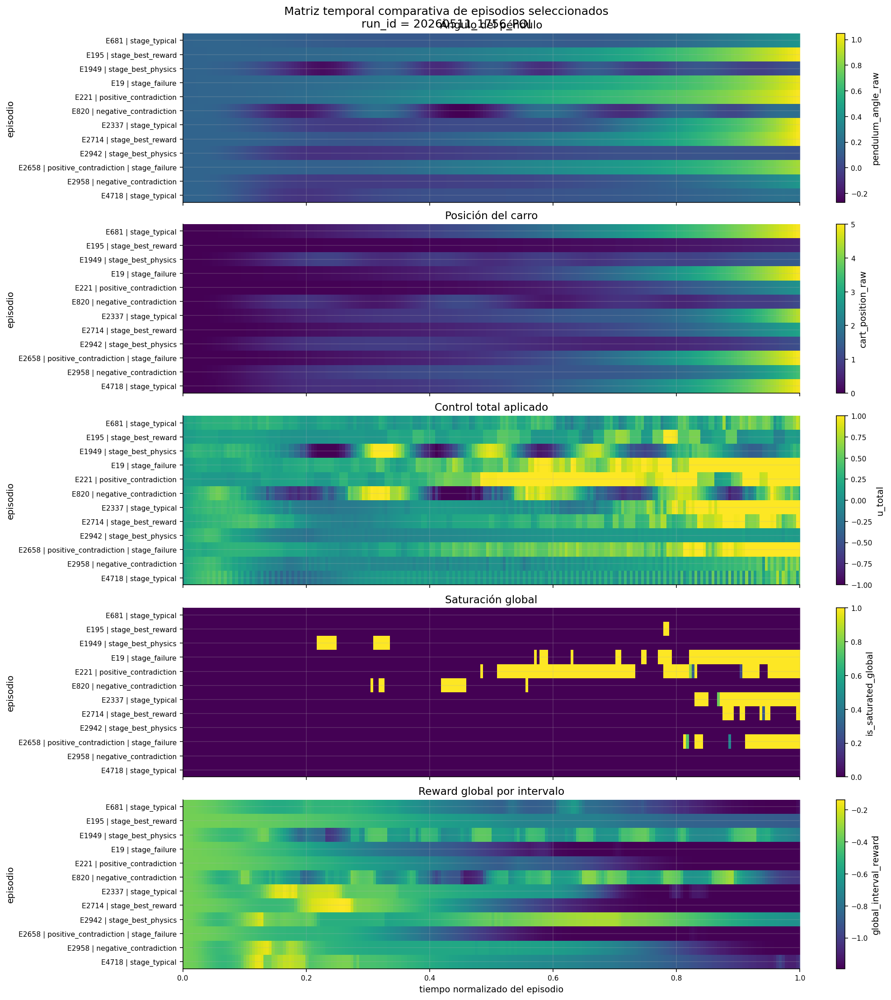

### Señales efectivamente graficadas

None

In [107]:
# ---------------------------------------------------------------------
# 4.5 — Figura configurable: matriz temporal multiepisodio
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar qué se observa en esta figura.
#
# source:
#   "step"     -> columna en step_data
#   "interval" -> columna en interval_data
#
# Cada tupla:
#   (source, value_col, title, colorbar_label)
# ---------------------------------------------------------------------

SIGNATURE_EPISODE_IDS = EPISODES_TO_LOAD_IDS[:12]
SIGNATURE_N_BINS = 220

SIGNATURE_SIGNALS = [
    ("step", "pendulum_angle_raw", "Ángulo del péndulo", "pendulum_angle_raw"),
    ("step", "cart_position_raw", "Posición del carro", "cart_position_raw"),
    ("step", "u_total", "Control total aplicado", "u_total"),
    ("step", "is_saturated_global", "Saturación global", "is_saturated_global"),
    ("interval", "global_interval_reward", "Reward global por intervalo", "global_interval_reward"),

    # Activar o reemplazar según objetivo:
    # ("interval", "principal_reward", "Reward principal", "principal_reward"),
    # ("interval", "component_extra_total", "Extras agregados", "component_extra_total"),
    # ("interval", "coordination_reward_total", "Reward coordinativo", "coordination_reward_total"),
    # ("interval", "L_e_pendulum_angle", "L_e péndulo", "L_e_pendulum_angle"),
    # ("interval", "L_e_cart_position", "L_e carro", "L_e_cart_position"),
    # ("step", "control_action_pendulum_angle", "Control action péndulo", "control_action_pendulum_angle"),
    # ("step", "control_action_cart_position", "Control action carro", "control_action_cart_position"),
]


signature_signal_specs = [
    {
        "source": source,
        "value_col": value_col,
        "title": title,
        "label": label,
    }
    for source, value_col, title, label in SIGNATURE_SIGNALS
]


section4_active_signature_df = plot_episode_signature_matrix(
    episode_frames_by_id=episode_frames_by_id,
    episode_ids=SIGNATURE_EPISODE_IDS,
    signal_specs=signature_signal_specs,
    representative_episodes_df=representative_episodes_df,
    n_bins=SIGNATURE_N_BINS,
    title="Matriz temporal comparativa de episodios seleccionados",
    save_as=None,
)

display(Markdown("### Señales efectivamente graficadas"))
display(section4_active_signature_df)

### 4.6 Figura 2: radiografía causal compacta del episodio foco

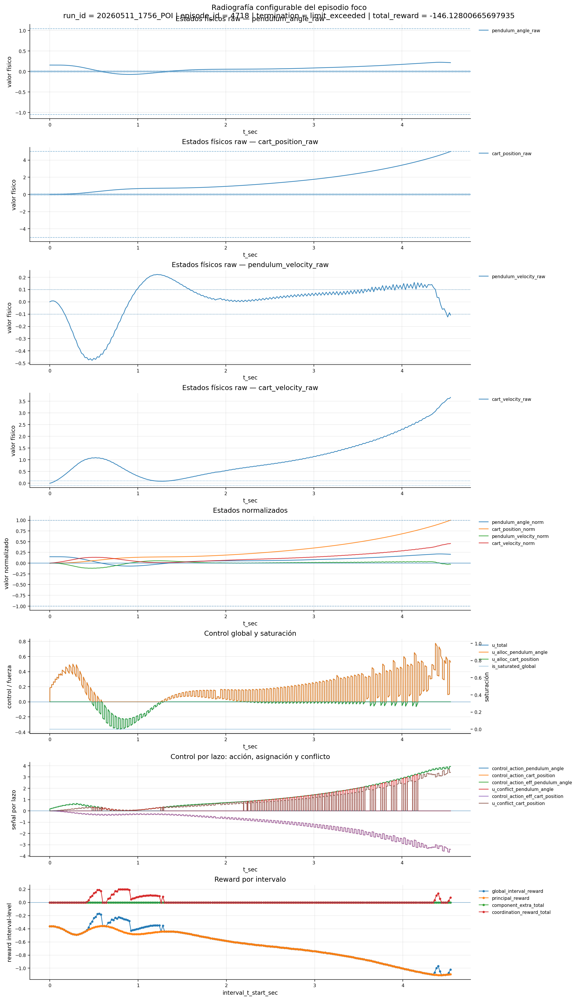

### Paneles efectivamente graficados

,panel_id,title,source,primary_columns,secondary_columns,reference,transform
0,raw_physical_states,Estados físicos raw — pendulum_angle_raw,step,[pendulum_angle_raw],[],raw_limits,raw
1,raw_physical_states,Estados físicos raw — cart_position_raw,step,[cart_position_raw],[],raw_limits,raw
2,raw_physical_states,Estados físicos raw — pendulum_velocity_raw,step,[pendulum_velocity_raw],[],raw_limits,raw
3,raw_physical_states,Estados físicos raw — cart_velocity_raw,step,[cart_velocity_raw],[],raw_limits,raw
4,normalized_states,Estados normalizados,step,"[pendulum_angle_norm, cart_position_norm, pendulum_velocity_norm, cart_velocity_norm]",[],norm_limits,raw
5,global_control,Control global y saturación,step,"[u_total, u_alloc_pendulum_angle, u_alloc_cart_position]",[is_saturated_global],None,raw
6,loop_control,"Control por lazo: acción, asignación y conflicto",step,"[control_action_pendulum_angle, control_action_cart_position, control_action_eff_pendulum_angle, u_conflict_pendulum_angle, control_action_eff_cart_position, u_conflict_cart_po...",[],None,raw
7,interval_reward,Reward por intervalo,interval,"[global_interval_reward, principal_reward, component_extra_total, coordination_reward_total]",[],None,raw


In [113]:
# ---------------------------------------------------------------------
# 4.6 — Figura configurable: radiografía del episodio foco
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar qué se observa en esta figura.
#
# Cada panel se construye aquí mismo, justo antes de llamar al helper.
#
# Reglas:
# - columns: columnas exactas.
# - columns_regex: patrones para seleccionar familias de columnas.
# - secondary_columns: columnas al eje derecho.
# - expand_by_column=True: una columna por panel.
# - reference:
#       "raw_limits"  -> setpoint + límites físicos desde metadata.
#       "norm_limits" -> límites de normalización.
#       None          -> sin referencias.
# - transform:
#       "raw", "abs", "minmax", "zscore".
# ---------------------------------------------------------------------

EPISODE_TO_PLOT = FOCUS_EPISODE_ID

# ---------------------------------------------------------------------
# Panel 1 — Estados físicos raw
# ---------------------------------------------------------------------

PLOT_RAW_STATE_COLS = [
    "pendulum_angle_raw",
    "cart_position_raw",

    # Activar si se quiere:
    "pendulum_velocity_raw",
    "cart_velocity_raw",
]

RAW_STATE_EXPAND_BY_COLUMN = True


# ---------------------------------------------------------------------
# Panel 2 — Estados normalizados
# ---------------------------------------------------------------------

PLOT_NORM_STATE_COLS = [
    "pendulum_angle_norm",
    "cart_position_norm",
    "pendulum_velocity_norm",
    "cart_velocity_norm",
]


# ---------------------------------------------------------------------
# Panel 3 — Control global
# ---------------------------------------------------------------------

PLOT_GLOBAL_CONTROL_COLS = [
    #"u_total_raw",
    #"u_total_saturated",
    "u_total",
    #"cart_force",
    "u_alloc_pendulum_angle",
    "u_alloc_cart_position",
]

PLOT_GLOBAL_CONTROL_SECONDARY_COLS = [
    "is_saturated_global",
]


# ---------------------------------------------------------------------
# Panel 4 — Control por lazo
# ---------------------------------------------------------------------
# Puedes usar columnas exactas o regex.
# Si usas regex, el helper selecciona las columnas que existan.
# ---------------------------------------------------------------------

PLOT_LOOP_CONTROL_COLS = [
    # "control_action_pendulum_angle",
    # "control_action_cart_position",
    # "control_action_eff_pendulum_angle",
    # "control_action_eff_cart_position",
    # "u_alloc_pendulum_angle",
    # "u_alloc_cart_position",
    # "u_conflict_pendulum_angle",
    # "u_conflict_cart_position",
]

PLOT_LOOP_CONTROL_REGEX = [
    r"^(control_action|control_action_eff|u_conflict)_(pendulum_angle|cart_position)$",
]

PLOT_LOOP_CONTROL_MAX_COLUMNS = 12


# ---------------------------------------------------------------------
# Panel 5 — Reward por intervalo
# ---------------------------------------------------------------------

PLOT_REWARD_INTERVAL_COLS = [
    "global_interval_reward",
    "principal_reward",
    "component_extra_total",
    "coordination_reward_total",
]

PLOT_REWARD_INTERVAL_REGEX = [
    # Activar si se quiere abrir detalle:
    # r"^L_(e|edot|I|u|delta_u)_(pendulum_angle|cart_position)$",
    # r"^principal_contribution_",
    # r"^principal_gate_",
    # r"^extra_total_",
    # r"^extra_bonus_",
    # r"^extra_penalty_",
    # r"^coordination_",
]

PLOT_REWARD_INTERVAL_MAX_COLUMNS = 14


# ---------------------------------------------------------------------
# Panel opcional — Aprendizaje RL
# ---------------------------------------------------------------------

INCLUDE_LEARNING_PANEL = False

PLOT_LEARNING_COLS = [
    # "td_error_kp_pendulum_angle",
    # "q_value_kp_pendulum_angle",
]

PLOT_LEARNING_REGEX = [
    # r"^action_",
    # r"^reward_",
    # r"^td_error_",
    # r"^q_value_",
    # r"^q_mean_",
    # r"^q_std_",
    # r"^visits_",
]

PLOT_LEARNING_MAX_COLUMNS = 12


# ---------------------------------------------------------------------
# Construcción local de paneles para ESTA figura
# ---------------------------------------------------------------------

focus_panel_specs = [
    {
        "panel_id": "raw_physical_states",
        "title": "Estados físicos raw",
        "source": "step",
        "columns": PLOT_RAW_STATE_COLS,
        "columns_regex": [],
        "expand_by_column": RAW_STATE_EXPAND_BY_COLUMN,
        "reference": "raw_limits",
        "transform": "raw",
        "ylabel": "valor físico",
        "zero_line": False,
    },
    {
        "panel_id": "normalized_states",
        "title": "Estados normalizados",
        "source": "step",
        "columns": PLOT_NORM_STATE_COLS,
        "columns_regex": [],
        "expand_by_column": False,
        "reference": "norm_limits",
        "transform": "raw",
        "ylabel": "valor normalizado",
        "zero_line": True,
    },
    {
        "panel_id": "global_control",
        "title": "Control global y saturación",
        "source": "step",
        "columns": PLOT_GLOBAL_CONTROL_COLS,
        "columns_regex": [],
        "secondary_columns": PLOT_GLOBAL_CONTROL_SECONDARY_COLS,
        "secondary_columns_regex": [],
        "expand_by_column": False,
        "reference": None,
        "transform": "raw",
        "ylabel": "control / fuerza",
        "secondary_ylabel": "saturación",
        "zero_line": True,
    },
    {
        "panel_id": "loop_control",
        "title": "Control por lazo: acción, asignación y conflicto",
        "source": "step",
        "columns": PLOT_LOOP_CONTROL_COLS,
        "columns_regex": PLOT_LOOP_CONTROL_REGEX,
        "max_columns": PLOT_LOOP_CONTROL_MAX_COLUMNS,
        "expand_by_column": False,
        "reference": None,
        "transform": "raw",
        "ylabel": "señal por lazo",
        "zero_line": True,
    },
    {
        "panel_id": "interval_reward",
        "title": "Reward por intervalo",
        "source": "interval",
        "columns": PLOT_REWARD_INTERVAL_COLS,
        "columns_regex": PLOT_REWARD_INTERVAL_REGEX,
        "max_columns": PLOT_REWARD_INTERVAL_MAX_COLUMNS,
        "expand_by_column": False,
        "reference": None,
        "transform": "raw",
        "ylabel": "reward interval-level",
        "zero_line": True,
        "mark_termination": True,
    },
]

if INCLUDE_LEARNING_PANEL:
    focus_panel_specs.append(
        {
            "panel_id": "learning_signals",
            "title": "Señales de aprendizaje",
            "source": "interval",
            "columns": PLOT_LEARNING_COLS,
            "columns_regex": PLOT_LEARNING_REGEX,
            "max_columns": PLOT_LEARNING_MAX_COLUMNS,
            "expand_by_column": False,
            "reference": None,
            "transform": "raw",
            "ylabel": "learning signal",
            "zero_line": True,
        }
    )


section4_active_focus_panels_df = plot_configurable_episode_panels(
    episode_id=EPISODE_TO_PLOT,
    episode_frames_by_id=episode_frames_by_id,
    config_main=selected_config_main,
    panel_specs=focus_panel_specs,
    column_inventory_df=section4_column_inventory_df,
    title="Radiografía configurable del episodio foco",
    save_as=None,
)

display(Markdown("### Paneles efectivamente graficados"))
display(section4_active_focus_panels_df)

### 4.7 Cierre de sección y variables para análisis profundo

In [115]:
focus_bundle = episode_frames_by_id[int(FOCUS_EPISODE_ID)]

focus_step_df = focus_bundle["step_df"]
focus_interval_df = focus_bundle["interval_df"]
focus_end_data = focus_bundle["end_data"]

section4_outputs_df = pd.DataFrame([{
    "SELECTED_RUN_ID": SELECTED_RUN_ID,
    "FOCUS_EPISODE_ID": int(FOCUS_EPISODE_ID),
    "n_selected_episodes_loaded": len(episode_frames_by_id),
    "n_step_focus": focus_step_df.shape[0],
    "n_interval_focus": focus_interval_df.shape[0],
    "focus_termination_reason": focus_end_data.get("end_termination_reason", np.nan),
    "focus_total_reward": focus_end_data.get("total_reward", np.nan),
    "focus_source_chunk": focus_bundle["source_chunk"],
}])

display(Markdown("### Variables listas para próximas secciones"))
display(section4_outputs_df)

display(Markdown("### Auditoría de normalización de longitudes al construir DataFrames"))
display(pd.DataFrame(SECTION4_FRAME_AUDIT_LOG))

### Variables listas para próximas secciones

,SELECTED_RUN_ID,FOCUS_EPISODE_ID,n_selected_episodes_loaded,n_step_focus,n_interval_focus,focus_termination_reason,focus_total_reward,focus_source_chunk
0,20260511_1756_POI,4718,16,4553,228,limit_exceeded,-146.12800665697935,C:\Users\davor\Escritorio\DOCTORADO\Tesis\RL_5_SimpleSystemSimulator\results_history_CartPole\cart_pole\20260511_1756_POI\episodes_chunks_0047.json


### Auditoría de normalización de longitudes al construir DataFrames

,record_name,column,original_len,normalized_len
0,episode_681.interval_data,u_eff_pendulum_angle_rms,0,142
1,episode_681.interval_data,u_eff_cart_position_rms,0,142
2,episode_681.interval_data,extra_total_pendulum_angle,0,142
3,episode_681.interval_data,extra_total_cart_position,0,142
4,episode_195.interval_data,u_eff_pendulum_angle_rms,0,52
5,episode_195.interval_data,u_eff_cart_position_rms,0,52
6,episode_195.interval_data,extra_total_pendulum_angle,0,52
7,episode_195.interval_data,extra_total_cart_position,0,52
8,episode_681.interval_data,u_eff_pendulum_angle_rms,0,142
9,episode_681.interval_data,u_eff_cart_position_rms,0,142


## Sección 5 — Física, límites y normalización del episodio foco

**Pregunta analítica:**  
¿La trayectoria física observada y la normalización usada por control/reward son coherentes con los límites, setpoints y rangos declarados en metadata?

**Objetivo específico:**  
A partir de los episodios ya cargados en la Sección 4, esta sección permite:

1. observar estados físicos raw contra límites de término, estabilización y setpoints;
2. comparar estados normalizados observados contra la normalización esperada desde metadata;
3. detectar clipping, saturación de representación o rangos de normalización mal elegidos;
4. comparar si el episodio foco es representativo o extremo respecto de otros episodios seleccionados;
5. preparar hipótesis para las siguientes secciones sobre reward, control o normalización.

**Criterio de uso:**  
Cada celda de figura contiene su propia caja editable de variables.  
El usuario no debe modificar helpers para cambiar qué se grafica.

In [116]:
# ---------------------------------------------------------------------
# 5.1 — Helpers generales de física y normalización
# ---------------------------------------------------------------------
# No editar para cambiar variables.
# Las variables se seleccionan directamente en cada celda de figura.
# ---------------------------------------------------------------------

import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown
from pathlib import Path


# ---------------------------------------------------------------------
# Fallbacks mínimos
# ---------------------------------------------------------------------

if "shorten_label" not in globals():
    def shorten_label(value, max_len=40):
        text = str(value)
        return text if len(text) <= max_len else text[:max_len - 1] + "…"


if "format_axis" not in globals():
    def format_axis(ax, title=None, xlabel=None, ylabel=None, grid=True, zero_line=False):
        if title is not None:
            ax.set_title(title)
        if xlabel is not None:
            ax.set_xlabel(xlabel)
        if ylabel is not None:
            ax.set_ylabel(ylabel)
        ax.grid(grid, alpha=0.25)
        if zero_line:
            ax.axhline(0.0, linewidth=0.8, alpha=0.6)
        return ax


if "save_current_figure" not in globals():
    def save_current_figure(filename=None, output_dir=None):
        if filename is None:
            return
        output_dir = Path(output_dir or ".")
        output_dir.mkdir(parents=True, exist_ok=True)
        path = output_dir / filename
        plt.savefig(path, bbox_inches="tight")
        print(f"Figura guardada en: {path}")


# ---------------------------------------------------------------------
# Metadata física
# ---------------------------------------------------------------------

def s5_get_dynamic_system_config(config_main):
    return config_main.get("dynamic_system", {})


def s5_get_boundary_limits(config_main):
    return (
        s5_get_dynamic_system_config(config_main)
        .get("termination_conditions", {})
        .get("boundary_constraint", {})
    )


def s5_get_stabilization_limits(config_main):
    return (
        s5_get_dynamic_system_config(config_main)
        .get("termination_conditions", {})
        .get("stabilization_criteria", {})
    )


def s5_get_state_normalization_config(config_main):
    return (
        s5_get_dynamic_system_config(config_main)
        .get("state_normalization", {})
    )


def s5_get_controller_setpoints(config_main):
    controllers_cfg = (
        config_main
        .get("controller_base", {})
        .get("controllers", {})
    )

    out = {}

    for _, cfg in controllers_cfg.items():
        params = cfg.get("params", {})
        var_obj = params.get("name_objective_var", None)

        if var_obj is None:
            continue

        out[var_obj] = params.get("setpoint", np.nan)

    return out


def s5_get_state_var_reference(config_main, var_name):
    boundary_limits = s5_get_boundary_limits(config_main)
    stabilization_limits = s5_get_stabilization_limits(config_main)
    normalization_cfg = s5_get_state_normalization_config(config_main)
    setpoints = s5_get_controller_setpoints(config_main)

    ranges_params = normalization_cfg.get("ranges_params", {})
    output_limits = normalization_cfg.get("output_limits", None)

    return {
        "state_var": var_name,
        "boundary_limits": boundary_limits.get(var_name, None),
        "stabilization_limits": stabilization_limits.get(var_name, None),
        "normalization_enabled": normalization_cfg.get("enabled", False),
        "normalization_range": ranges_params.get(var_name, None),
        "normalization_output_limits": output_limits,
        "setpoint_raw": setpoints.get(var_name, np.nan),
    }


def s5_raw_to_norm(values, config_main, var_name):
    """
    Normalización esperada según metadata dinámica.
    Replica la lógica lineal + clipping del sistema dinámico.
    """
    values = pd.to_numeric(pd.Series(values), errors="coerce").astype(float)

    ref = s5_get_state_var_reference(config_main, var_name)

    if not ref["normalization_enabled"]:
        return values

    norm_range = ref["normalization_range"]
    output_limits = ref["normalization_output_limits"]

    if norm_range is None or output_limits is None:
        return values

    in_min, in_max = norm_range
    out_min, out_max = output_limits

    if in_max == in_min:
        return pd.Series(np.nan, index=values.index)

    norm = out_min + (values - in_min) * (out_max - out_min) / (in_max - in_min)

    return norm.clip(out_min, out_max)


def s5_norm_setpoint(config_main, var_name):
    ref = s5_get_state_var_reference(config_main, var_name)

    if pd.isna(ref["setpoint_raw"]):
        return np.nan

    return float(s5_raw_to_norm([ref["setpoint_raw"]], config_main, var_name).iloc[0])


# ---------------------------------------------------------------------
# Catálogos y auditorías
# ---------------------------------------------------------------------

def s5_infer_state_vars_from_step_df(step_df):
    raw_vars = [
        str(col)[:-4]
        for col in step_df.columns
        if str(col).endswith("_raw")
    ]

    norm_vars = [
        str(col)[:-5]
        for col in step_df.columns
        if str(col).endswith("_norm")
    ]

    return sorted(set(raw_vars + norm_vars))


def s5_build_state_catalog(config_main, step_df):
    state_vars = s5_infer_state_vars_from_step_df(step_df)

    rows = []

    for var_name in state_vars:
        ref = s5_get_state_var_reference(config_main, var_name)

        rows.append({
            "state_var": var_name,
            "has_raw": f"{var_name}_raw" in step_df.columns,
            "has_norm": f"{var_name}_norm" in step_df.columns,
            "boundary_limits": ref["boundary_limits"],
            "stabilization_limits": ref["stabilization_limits"],
            "normalization_enabled": ref["normalization_enabled"],
            "normalization_range": ref["normalization_range"],
            "normalization_output_limits": ref["normalization_output_limits"],
            "setpoint_raw": ref["setpoint_raw"],
            "setpoint_norm": s5_norm_setpoint(config_main, var_name),
        })

    return pd.DataFrame(rows).sort_values("state_var").reset_index(drop=True)


def s5_safe_numeric(series):
    return pd.to_numeric(series, errors="coerce").astype(float)


def s5_ratio_within_limits(values, limits):
    values = s5_safe_numeric(values)

    if limits is None:
        return np.nan

    lo, hi = limits

    if len(values) == 0:
        return np.nan

    return float(((values >= lo) & (values <= hi)).mean())


def s5_ratio_outside_limits(values, limits):
    values = s5_safe_numeric(values)

    if limits is None:
        return np.nan

    lo, hi = limits

    if len(values) == 0:
        return np.nan

    return float(((values < lo) | (values > hi)).mean())


def s5_norm_clip_ratio(values, output_limits, atol=1e-9):
    values = s5_safe_numeric(values)

    if output_limits is None or len(values) == 0:
        return np.nan

    out_min, out_max = output_limits

    clipped = (
        np.isclose(values, out_min, atol=atol, rtol=0.0)
        | np.isclose(values, out_max, atol=atol, rtol=0.0)
    )

    return float(clipped.mean())


def s5_boundary_usage(values, limits):
    """
    Uso relativo del límite físico.
    Para límites aproximadamente simétricos usa max(abs(value)) / max(abs(limit)).
    Para límites generales usa ocupación de rango.
    """
    values = s5_safe_numeric(values).dropna()

    if limits is None or values.empty:
        return np.nan

    lo, hi = limits

    if max(abs(lo), abs(hi)) > 0:
        return float(values.abs().max() / max(abs(lo), abs(hi)))

    span = hi - lo

    if span == 0:
        return np.nan

    return float((values.max() - values.min()) / span)


def s5_compute_state_audit_for_episode(
    episode_id,
    episode_frames_by_id,
    config_main,
    state_vars,
):
    bundle = episode_frames_by_id[int(episode_id)]
    step_df = bundle["step_df"]

    rows = []

    for var_name in state_vars:
        raw_col = f"{var_name}_raw"
        norm_col = f"{var_name}_norm"

        if raw_col not in step_df.columns and norm_col not in step_df.columns:
            continue

        ref = s5_get_state_var_reference(config_main, var_name)

        row = {
            "episode_id": int(episode_id),
            "state_var": var_name,
            "n_step": int(step_df.shape[0]),
            "boundary_limits": ref["boundary_limits"],
            "stabilization_limits": ref["stabilization_limits"],
            "normalization_range": ref["normalization_range"],
            "normalization_output_limits": ref["normalization_output_limits"],
            "setpoint_raw": ref["setpoint_raw"],
            "setpoint_norm": s5_norm_setpoint(config_main, var_name),
        }

        if raw_col in step_df.columns:
            raw = s5_safe_numeric(step_df[raw_col])

            row.update({
                "raw_min": float(raw.min()),
                "raw_q05": float(raw.quantile(0.05)),
                "raw_median": float(raw.median()),
                "raw_q95": float(raw.quantile(0.95)),
                "raw_max": float(raw.max()),
                "raw_abs_max": float(raw.abs().max()),
                "raw_final": float(raw.iloc[-1]),
                "boundary_violation_ratio": s5_ratio_outside_limits(raw, ref["boundary_limits"]),
                "boundary_usage_max": s5_boundary_usage(raw, ref["boundary_limits"]),
                "stabilization_ratio": s5_ratio_within_limits(raw, ref["stabilization_limits"]),
            })

            if pd.notna(ref["setpoint_raw"]):
                row["setpoint_abs_error_median"] = float((raw - ref["setpoint_raw"]).abs().median())
                row["setpoint_abs_error_final"] = float(abs(raw.iloc[-1] - ref["setpoint_raw"]))
            else:
                row["setpoint_abs_error_median"] = np.nan
                row["setpoint_abs_error_final"] = np.nan

        if norm_col in step_df.columns:
            norm = s5_safe_numeric(step_df[norm_col])

            row.update({
                "norm_min": float(norm.min()),
                "norm_q05": float(norm.quantile(0.05)),
                "norm_median": float(norm.median()),
                "norm_q95": float(norm.quantile(0.95)),
                "norm_max": float(norm.max()),
                "norm_abs_max": float(norm.abs().max()),
                "norm_final": float(norm.iloc[-1]),
                "norm_clip_ratio": s5_norm_clip_ratio(norm, ref["normalization_output_limits"]),
            })

        if raw_col in step_df.columns and norm_col in step_df.columns:
            expected_norm = s5_raw_to_norm(step_df[raw_col], config_main, var_name)
            observed_norm = s5_safe_numeric(step_df[norm_col])

            diff = (observed_norm - expected_norm).abs()

            row["norm_expected_mae"] = float(diff.mean())
            row["norm_expected_max_abs_error"] = float(diff.max())

        rows.append(row)

    return pd.DataFrame(rows)


def s5_compute_state_audit_for_episodes(
    episode_ids,
    episode_frames_by_id,
    config_main,
    state_vars,
):
    frames = []

    for episode_id in episode_ids:
        if int(episode_id) not in episode_frames_by_id:
            continue

        frames.append(
            s5_compute_state_audit_for_episode(
                episode_id=episode_id,
                episode_frames_by_id=episode_frames_by_id,
                config_main=config_main,
                state_vars=state_vars,
            )
        )

    if not frames:
        return pd.DataFrame()

    return (
        pd.concat(frames, ignore_index=True, sort=False)
        .sort_values(["episode_id", "state_var"])
        .reset_index(drop=True)
    )


def s5_build_findings_from_audit(audit_df):
    rows = []

    for _, row in audit_df.iterrows():
        findings = []

        if pd.notna(row.get("boundary_violation_ratio", np.nan)) and row["boundary_violation_ratio"] > 0:
            findings.append("viola límites físicos")

        if pd.notna(row.get("boundary_usage_max", np.nan)) and row["boundary_usage_max"] >= 0.85:
            findings.append("opera cerca del límite físico")

        if pd.notna(row.get("norm_clip_ratio", np.nan)) and row["norm_clip_ratio"] >= 0.05:
            findings.append("normalización clippea de forma relevante")

        if pd.notna(row.get("norm_expected_mae", np.nan)) and row["norm_expected_mae"] > 1e-6:
            findings.append("norm observado no coincide con normalización esperada")

        if pd.notna(row.get("stabilization_ratio", np.nan)) and row["stabilization_ratio"] < 0.25:
            findings.append("pasa poco tiempo en región de estabilización")

        if not findings:
            findings.append("sin alerta fuerte en esta lectura")

        rows.append({
            "episode_id": row["episode_id"],
            "state_var": row["state_var"],
            "finding": " | ".join(findings),
            "boundary_violation_ratio": row.get("boundary_violation_ratio", np.nan),
            "boundary_usage_max": row.get("boundary_usage_max", np.nan),
            "norm_clip_ratio": row.get("norm_clip_ratio", np.nan),
            "stabilization_ratio": row.get("stabilization_ratio", np.nan),
            "norm_expected_mae": row.get("norm_expected_mae", np.nan),
        })

    return pd.DataFrame(rows)

### 5.2 Catálogo físico y tabla de auditoría del episodio foco

In [117]:
# ---------------------------------------------------------------------
# 5.2 — Catálogo físico y auditoría tabular
# ---------------------------------------------------------------------
# Editar SOLO esta caja para decidir qué variables auditar en tablas.
# ---------------------------------------------------------------------

STATE_VARS_FOR_AUDIT_TABLE = [
    "pendulum_angle",
    "cart_position",
    "pendulum_velocity",
    "cart_velocity",
]

AUDIT_EPISODE_IDS_FOR_TABLE = [
    FOCUS_EPISODE_ID,
]

# Para comparar varios episodios seleccionados en tabla:
# AUDIT_EPISODE_IDS_FOR_TABLE = EPISODES_TO_LOAD_IDS


section5_state_catalog_df = s5_build_state_catalog(
    config_main=selected_config_main,
    step_df=focus_step_df,
)

section5_focus_state_audit_df = s5_compute_state_audit_for_episodes(
    episode_ids=AUDIT_EPISODE_IDS_FOR_TABLE,
    episode_frames_by_id=episode_frames_by_id,
    config_main=selected_config_main,
    state_vars=STATE_VARS_FOR_AUDIT_TABLE,
)

section5_focus_findings_df = s5_build_findings_from_audit(
    section5_focus_state_audit_df
)


display(Markdown("### Catálogo físico disponible desde step_data + metadata"))
display(section5_state_catalog_df)

display(Markdown("### Auditoría física y de normalización"))
display(section5_focus_state_audit_df)

display(Markdown("### Lectura automática de alertas"))
display(section5_focus_findings_df)

### Catálogo físico disponible desde step_data + metadata

,state_var,has_raw,has_norm,boundary_limits,stabilization_limits,normalization_enabled,normalization_range,normalization_output_limits,setpoint_raw,setpoint_norm
0,cart_position,True,True,"[-5.0, 5.0]","[-0.1, 0.1]",True,"[-5.0, 5.0]","[-1.0, 1.0]",0.0,0.0
1,cart_velocity,True,True,None,"[-0.1, 0.1]",True,"[-8.0, 8.0]","[-1.0, 1.0]",NaN,NaN
2,pendulum_angle,True,True,"[-1.0472, 1.0472]","[-0.02, 0.02]",True,"[-1.0472, 1.0472]","[-1.0, 1.0]",0.0,0.0
3,pendulum_velocity,True,True,None,"[-0.1, 0.1]",True,"[-4.0, 4.0]","[-1.0, 1.0]",NaN,NaN
4,u_total,True,False,None,None,True,None,"[-1.0, 1.0]",NaN,NaN


### Auditoría física y de normalización

,episode_id,state_var,n_step,boundary_limits,stabilization_limits,normalization_range,normalization_output_limits,setpoint_raw,setpoint_norm,raw_min,raw_q05,raw_median,raw_q95,raw_max,raw_abs_max,raw_final,boundary_violation_ratio,boundary_usage_max,stabilization_ratio,setpoint_abs_error_median,setpoint_abs_error_final,norm_min,norm_q05,norm_median,norm_q95,norm_max,norm_abs_max,norm_final,norm_clip_ratio,norm_expected_mae,norm_expected_max_abs_error
0,4718,cart_position,4553,"[-5.0, 5.0]","[-0.1, 0.1]","[-5.0, 5.0]","[-1.0, 1.0]",0.0,0.0,0.00000,0.052751,1.111773,4.250330,5.000967,5.000967,5.000967,0.00022,1.000193,0.065891,1.111773,5.000967,0.000000,0.010550,0.222355,0.850066,1.000000,1.000000,1.000000,0.00022,0.0,0.0
1,4718,cart_velocity,4553,None,"[-0.1, 0.1]","[-8.0, 8.0]","[-1.0, 1.0]",NaN,NaN,0.00000,0.103638,0.894434,2.905862,3.660955,3.660955,3.660955,NaN,NaN,0.045684,NaN,NaN,0.000000,0.012955,0.111804,0.363233,0.457619,0.457619,0.457619,0.00000,0.0,0.0
2,4718,pendulum_angle,4553,"[-1.0472, 1.0472]","[-0.02, 0.02]","[-1.0472, 1.0472]","[-1.0, 1.0]",0.0,0.0,-0.07168,-0.063303,0.070137,0.215631,0.224741,0.224741,0.215769,0.00000,0.214611,0.065671,0.071514,0.215769,-0.068449,-0.060450,0.066976,0.205912,0.214611,0.214611,0.206043,0.00000,0.0,0.0
3,4718,pendulum_velocity,4553,None,"[-0.1, 0.1]","[-4.0, 4.0]","[-1.0, 1.0]",NaN,NaN,-0.47672,-0.425050,0.054239,0.198175,0.222648,0.476720,-0.108507,NaN,NaN,0.562486,NaN,NaN,-0.119180,-0.106263,0.013560,0.049544,0.055662,0.119180,-0.027127,0.00000,0.0,0.0


### Lectura automática de alertas

,episode_id,state_var,finding,boundary_violation_ratio,boundary_usage_max,norm_clip_ratio,stabilization_ratio,norm_expected_mae
0,4718,cart_position,viola límites físicos | opera cerca del límite físico | pasa poco tiempo en región de estabilización,0.00022,1.000193,0.00022,0.065891,0.0
1,4718,cart_velocity,pasa poco tiempo en región de estabilización,NaN,NaN,0.00000,0.045684,0.0
2,4718,pendulum_angle,pasa poco tiempo en región de estabilización,0.00000,0.214611,0.00000,0.065671,0.0
3,4718,pendulum_velocity,sin alerta fuerte en esta lectura,NaN,NaN,0.00000,0.562486,0.0


### 5.3 Helper de figura raw/norm

In [118]:
# ---------------------------------------------------------------------
# 5.3 — Helper de figura raw/norm
# ---------------------------------------------------------------------
# No editar para cambiar variables.
# La selección está en la celda 5.4.
# ---------------------------------------------------------------------

def s5_get_time_axis_for_step(step_df):
    if "t_sec" in step_df.columns:
        t = s5_safe_numeric(step_df["t_sec"])

        if t.notna().sum() > 1:
            return t.to_numpy(dtype=float), "t_sec"

    return np.arange(len(step_df), dtype=float), "step_index"


def s5_normalized_time_from_axis(x):
    x = np.asarray(x, dtype=float)

    if len(x) == 0:
        return x

    valid = np.isfinite(x)

    if valid.sum() < 2:
        return np.linspace(0.0, 1.0, len(x))

    x_min = np.nanmin(x[valid])
    x_max = np.nanmax(x[valid])

    if x_max == x_min:
        return np.linspace(0.0, 1.0, len(x))

    return (x - x_min) / (x_max - x_min)


def s5_add_raw_references(ax, config_main, var_name):
    ref = s5_get_state_var_reference(config_main, var_name)

    boundary = ref["boundary_limits"]
    stabilization = ref["stabilization_limits"]
    setpoint = ref["setpoint_raw"]

    if boundary is not None:
        ax.axhline(boundary[0], linestyle="--", linewidth=0.85, alpha=0.60)
        ax.axhline(boundary[1], linestyle="--", linewidth=0.85, alpha=0.60)

    if stabilization is not None:
        ax.axhline(stabilization[0], linestyle=":", linewidth=0.95, alpha=0.70)
        ax.axhline(stabilization[1], linestyle=":", linewidth=0.95, alpha=0.70)

    if pd.notna(setpoint):
        ax.axhline(float(setpoint), linewidth=1.0, alpha=0.75)

    return ax


def s5_add_norm_references(ax, config_main, var_name):
    ref = s5_get_state_var_reference(config_main, var_name)

    output_limits = ref["normalization_output_limits"]
    setpoint_norm = s5_norm_setpoint(config_main, var_name)

    if output_limits is not None:
        ax.axhline(output_limits[0], linestyle="--", linewidth=0.85, alpha=0.55)
        ax.axhline(output_limits[1], linestyle="--", linewidth=0.85, alpha=0.55)
        ax.axhline(0.0, linewidth=0.85, alpha=0.45)

    if pd.notna(setpoint_norm):
        ax.axhline(float(setpoint_norm), linewidth=1.0, alpha=0.70)

    return ax


def s5_plot_physical_normalization_audit(
    episode_id,
    episode_frames_by_id,
    config_main,
    state_vars,
    sample_every=1,
    show_expected_norm=True,
    title="Auditoría física y de normalización",
    save_as=None,
):
    """
    Figura densa por variable física.

    Por cada variable:
    1. trayectoria raw contra límites físicos;
    2. trayectoria norm contra límites de normalización;
    3. transferencia raw → norm observada vs esperada.
    """
    bundle = episode_frames_by_id[int(episode_id)]
    step_df = bundle["step_df"].copy()
    end_data = bundle.get("end_data", {})

    t, t_label = s5_get_time_axis_for_step(step_df)
    t_norm = s5_normalized_time_from_axis(t)

    available_vars = [
        var for var in state_vars
        if f"{var}_raw" in step_df.columns or f"{var}_norm" in step_df.columns
    ]

    if not available_vars:
        display(Markdown("No hay variables disponibles para la auditoría raw/norm."))
        return pd.DataFrame()

    n_rows = len(available_vars)
    n_cols = 3

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(15.5, max(3.4 * n_rows, 5.0)),
        squeeze=False,
    )

    audit_rows = []

    for row_idx, var_name in enumerate(available_vars):
        raw_col = f"{var_name}_raw"
        norm_col = f"{var_name}_norm"

        ref = s5_get_state_var_reference(config_main, var_name)

        # -------------------------------------------------------------
        # Raw timeline
        # -------------------------------------------------------------
        ax = axes[row_idx][0]

        if raw_col in step_df.columns:
            raw = s5_safe_numeric(step_df[raw_col])
            ax.plot(t[::sample_every], raw.iloc[::sample_every], linewidth=1.2, label=raw_col)
            s5_add_raw_references(ax, config_main, var_name)

        format_axis(
            ax,
            title=f"{var_name} — raw",
            xlabel=t_label,
            ylabel="raw",
            zero_line=False,
        )
        ax.legend(loc="best", frameon=False)

        # -------------------------------------------------------------
        # Norm timeline
        # -------------------------------------------------------------
        ax = axes[row_idx][1]

        if norm_col in step_df.columns:
            norm = s5_safe_numeric(step_df[norm_col])
            ax.plot(t[::sample_every], norm.iloc[::sample_every], linewidth=1.2, label=f"{norm_col} observado")

        if show_expected_norm and raw_col in step_df.columns:
            expected_norm = s5_raw_to_norm(step_df[raw_col], config_main, var_name)
            ax.plot(
                t[::sample_every],
                expected_norm.iloc[::sample_every],
                linestyle="--",
                linewidth=1.0,
                alpha=0.75,
                label="norm esperado",
            )

        s5_add_norm_references(ax, config_main, var_name)

        format_axis(
            ax,
            title=f"{var_name} — normalizado",
            xlabel=t_label,
            ylabel="norm",
            zero_line=True,
        )
        ax.legend(loc="best", frameon=False)

        # -------------------------------------------------------------
        # Raw → norm transfer
        # -------------------------------------------------------------
        ax = axes[row_idx][2]

        if raw_col in step_df.columns and norm_col in step_df.columns:
            raw = s5_safe_numeric(step_df[raw_col])
            norm = s5_safe_numeric(step_df[norm_col])

            valid = raw.notna() & norm.notna()

            sc = ax.scatter(
                raw.loc[valid].iloc[::sample_every],
                norm.loc[valid].iloc[::sample_every],
                c=t_norm[valid.to_numpy()][::sample_every],
                s=10,
                alpha=0.65,
            )

            norm_range = ref["normalization_range"]

            if norm_range is not None:
                x_curve = np.linspace(norm_range[0], norm_range[1], 200)
            else:
                x_curve = np.linspace(raw.min(), raw.max(), 200)

            y_curve = s5_raw_to_norm(x_curve, config_main, var_name)

            ax.plot(
                x_curve,
                y_curve,
                linestyle="--",
                linewidth=1.1,
                alpha=0.85,
                label="transferencia esperada",
            )

            fig.colorbar(sc, ax=ax, label="tiempo normalizado")

        if pd.notna(ref["setpoint_raw"]):
            ax.axvline(float(ref["setpoint_raw"]), linewidth=1.0, alpha=0.55)

        format_axis(
            ax,
            title=f"{var_name} — raw → norm",
            xlabel="raw",
            ylabel="norm",
            zero_line=True,
        )
        ax.legend(loc="best", frameon=False)

        audit_rows.append({
            "episode_id": int(episode_id),
            "state_var": var_name,
            "raw_col": raw_col if raw_col in step_df.columns else None,
            "norm_col": norm_col if norm_col in step_df.columns else None,
            "boundary_limits": ref["boundary_limits"],
            "stabilization_limits": ref["stabilization_limits"],
            "normalization_range": ref["normalization_range"],
            "normalization_output_limits": ref["normalization_output_limits"],
        })

    fig.suptitle(
        (
            f"{title}\n"
            f"run_id = {SELECTED_RUN_ID} | episode_id = {episode_id} | "
            f"termination = {end_data.get('end_termination_reason', 'unknown')}"
        ),
        y=1.01,
        fontsize=13,
    )

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return pd.DataFrame(audit_rows)

### 5.4 Figura 1: auditoría física raw/norm

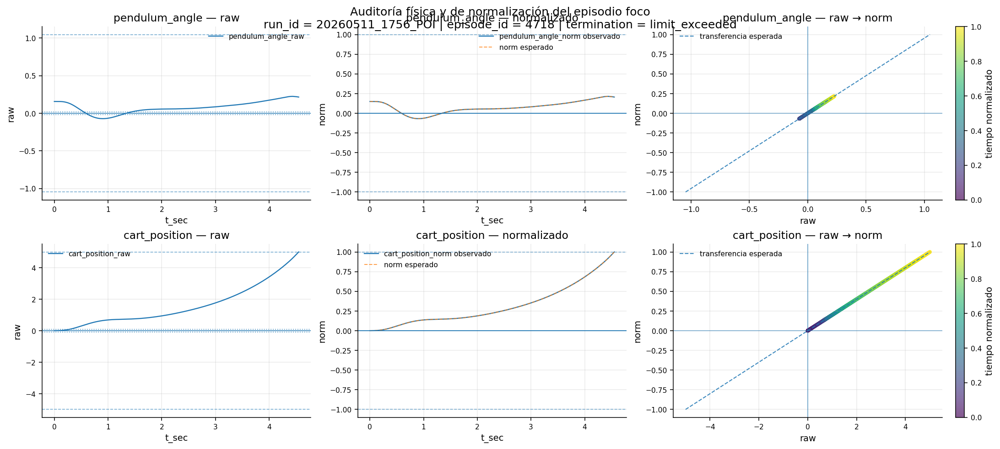

### Variables efectivamente graficadas

,episode_id,state_var,raw_col,norm_col,boundary_limits,stabilization_limits,normalization_range,normalization_output_limits
0,4718,pendulum_angle,pendulum_angle_raw,pendulum_angle_norm,"[-1.0472, 1.0472]","[-0.02, 0.02]","[-1.0472, 1.0472]","[-1.0, 1.0]"
1,4718,cart_position,cart_position_raw,cart_position_norm,"[-5.0, 5.0]","[-0.1, 0.1]","[-5.0, 5.0]","[-1.0, 1.0]"


In [119]:
# ---------------------------------------------------------------------
# 5.4 — Figura 1: auditoría física raw/norm
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar qué se observa en esta figura.
# ---------------------------------------------------------------------

PHYS_NORM_EPISODE_ID = FOCUS_EPISODE_ID

PHYS_NORM_STATE_VARS = [
    "pendulum_angle",
    "cart_position",

    # Activar si se quiere:
    # "pendulum_velocity",
    # "cart_velocity",
]

PHYS_NORM_SAMPLE_EVERY = 1
PHYS_NORM_SHOW_EXPECTED_NORM = True


section5_phys_norm_plot_df = s5_plot_physical_normalization_audit(
    episode_id=PHYS_NORM_EPISODE_ID,
    episode_frames_by_id=episode_frames_by_id,
    config_main=selected_config_main,
    state_vars=PHYS_NORM_STATE_VARS,
    sample_every=PHYS_NORM_SAMPLE_EVERY,
    show_expected_norm=PHYS_NORM_SHOW_EXPECTED_NORM,
    title="Auditoría física y de normalización del episodio foco",
    save_as=None,
)

display(Markdown("### Variables efectivamente graficadas"))
display(section5_phys_norm_plot_df)

### 5.5 Helper de relaciones físicas y control

In [120]:
# ---------------------------------------------------------------------
# 5.5 — Helper de relaciones físicas/control
# ---------------------------------------------------------------------
# No editar para cambiar variables.
# La selección está en la celda 5.6.
# ---------------------------------------------------------------------

def s5_get_frame_by_source(bundle, source):
    if source == "step":
        return bundle["step_df"]
    if source == "interval":
        return bundle["interval_df"]
    raise ValueError('source debe ser "step" o "interval".')


def s5_get_time_axis_by_source(frame, source):
    if source == "step":
        preferred = ["t_sec"]
    else:
        preferred = ["interval_t_start_sec", "interval_id", "decision_id"]

    for col in preferred:
        if col in frame.columns:
            values = s5_safe_numeric(frame[col])

            if values.notna().sum() > 1:
                return values.to_numpy(dtype=float), col

    return np.arange(len(frame), dtype=float), "index"


def s5_plot_phase_relationships(
    episode_id,
    episode_frames_by_id,
    relationship_specs,
    title="Relaciones físicas y de control",
    save_as=None,
):
    """
    Una sola figura con relaciones seleccionadas por el usuario.

    Cada panel:
    - x_col vs y_col;
    - color = tiempo normalizado;
    - línea tenue = trayectoria;
    - marcador inicial/final.
    """
    bundle = episode_frames_by_id[int(episode_id)]
    end_data = bundle.get("end_data", {})

    active_specs = []

    for spec in relationship_specs:
        source = spec.get("source", "step")
        frame = s5_get_frame_by_source(bundle, source)

        x_col = spec["x_col"]
        y_col = spec["y_col"]

        if x_col in frame.columns and y_col in frame.columns:
            active_specs.append(spec)

    if not active_specs:
        display(Markdown("No hay relaciones activas con las columnas seleccionadas."))
        return pd.DataFrame()

    n_plots = len(active_specs)
    n_cols = min(2, n_plots)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(7.2 * n_cols, 5.4 * n_rows),
        squeeze=False,
    )

    active_rows = []

    for idx, spec in enumerate(active_specs):
        ax = axes[idx // n_cols][idx % n_cols]

        source = spec.get("source", "step")
        frame = s5_get_frame_by_source(bundle, source)

        x_col = spec["x_col"]
        y_col = spec["y_col"]

        x = s5_safe_numeric(frame[x_col])
        y = s5_safe_numeric(frame[y_col])

        time_values, time_label = s5_get_time_axis_by_source(frame, source)
        time_norm = s5_normalized_time_from_axis(time_values)

        valid = x.notna() & y.notna()

        x_valid = x.loc[valid].to_numpy(dtype=float)
        y_valid = y.loc[valid].to_numpy(dtype=float)
        time_valid = time_norm[valid.to_numpy()]

        if spec.get("draw_path", True):
            ax.plot(
                x_valid,
                y_valid,
                linewidth=0.75,
                alpha=0.25,
            )

        sc = ax.scatter(
            x_valid,
            y_valid,
            c=time_valid,
            s=18,
            alpha=0.75,
        )

        if len(x_valid) > 0:
            ax.scatter(
                x_valid[0],
                y_valid[0],
                marker="o",
                s=80,
                edgecolors="black",
                linewidth=0.8,
                label="inicio",
            )
            ax.scatter(
                x_valid[-1],
                y_valid[-1],
                marker="X",
                s=90,
                edgecolors="black",
                linewidth=0.8,
                label="fin",
            )

        if spec.get("x_ref", None) is not None:
            ax.axvline(
                float(spec["x_ref"]),
                linestyle="--",
                linewidth=0.85,
                alpha=0.55,
            )

        if spec.get("y_ref", None) is not None:
            ax.axhline(
                float(spec["y_ref"]),
                linestyle="--",
                linewidth=0.85,
                alpha=0.55,
            )

        format_axis(
            ax,
            title=spec.get("title", f"{y_col} vs {x_col}"),
            xlabel=spec.get("xlabel", x_col),
            ylabel=spec.get("ylabel", y_col),
            zero_line=spec.get("zero_line", False),
        )

        ax.legend(loc="best", frameon=False)

        fig.colorbar(sc, ax=ax, label=f"{time_label} normalizado")

        active_rows.append({
            "source": source,
            "x_col": x_col,
            "y_col": y_col,
            "title": spec.get("title", f"{y_col} vs {x_col}"),
            "n_points": int(valid.sum()),
        })

    for empty_idx in range(n_plots, n_rows * n_cols):
        axes[empty_idx // n_cols][empty_idx % n_cols].axis("off")

    fig.suptitle(
        (
            f"{title}\n"
            f"run_id = {SELECTED_RUN_ID} | episode_id = {episode_id} | "
            f"termination = {end_data.get('end_termination_reason', 'unknown')}"
        ),
        y=1.02,
        fontsize=13,
    )

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return pd.DataFrame(active_rows)

### 5.6 Figura 2: relaciones físicas y control

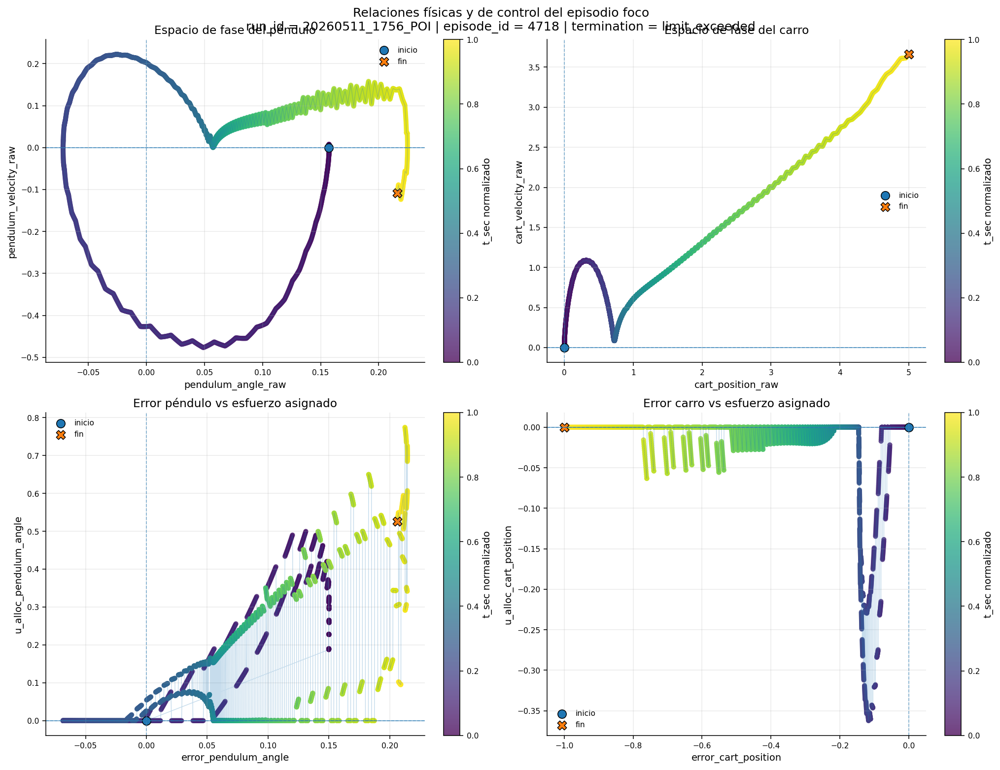

### Relaciones efectivamente graficadas

,source,x_col,y_col,title,n_points
0,step,pendulum_angle_raw,pendulum_velocity_raw,Espacio de fase del péndulo,4553
1,step,cart_position_raw,cart_velocity_raw,Espacio de fase del carro,4553
2,step,error_pendulum_angle,u_alloc_pendulum_angle,Error péndulo vs esfuerzo asignado,4553
3,step,error_cart_position,u_alloc_cart_position,Error carro vs esfuerzo asignado,4553


In [121]:
# ---------------------------------------------------------------------
# 5.6 — Figura 2: relaciones físicas y control
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar qué relaciones se observan.
#
# Cada dict define un panel:
#   source: "step" o "interval"
#   x_col, y_col: columnas exactas
#   x_ref, y_ref: líneas de referencia opcionales
# ---------------------------------------------------------------------

PHASE_EPISODE_ID = FOCUS_EPISODE_ID

PHASE_RELATION_SPECS = [
    {
        "source": "step",
        "x_col": "pendulum_angle_raw",
        "y_col": "pendulum_velocity_raw",
        "title": "Espacio de fase del péndulo",
        "xlabel": "pendulum_angle_raw",
        "ylabel": "pendulum_velocity_raw",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "source": "step",
        "x_col": "cart_position_raw",
        "y_col": "cart_velocity_raw",
        "title": "Espacio de fase del carro",
        "xlabel": "cart_position_raw",
        "ylabel": "cart_velocity_raw",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "source": "step",
        "x_col": "error_pendulum_angle",
        "y_col": "u_alloc_pendulum_angle",
        "title": "Error péndulo vs esfuerzo asignado",
        "xlabel": "error_pendulum_angle",
        "ylabel": "u_alloc_pendulum_angle",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "source": "step",
        "x_col": "error_cart_position",
        "y_col": "u_alloc_cart_position",
        "title": "Error carro vs esfuerzo asignado",
        "xlabel": "error_cart_position",
        "ylabel": "u_alloc_cart_position",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },

    # Activar si se quiere mirar conflicto o acción cruda:
    # {
    #     "source": "step",
    #     "x_col": "control_action_pendulum_angle",
    #     "y_col": "u_conflict_pendulum_angle",
    #     "title": "Acción péndulo vs conflicto",
    #     "xlabel": "control_action_pendulum_angle",
    #     "ylabel": "u_conflict_pendulum_angle",
    #     "x_ref": 0.0,
    #     "y_ref": 0.0,
    #     "zero_line": True,
    # },
]


section5_phase_relationships_df = s5_plot_phase_relationships(
    episode_id=PHASE_EPISODE_ID,
    episode_frames_by_id=episode_frames_by_id,
    relationship_specs=PHASE_RELATION_SPECS,
    title="Relaciones físicas y de control del episodio foco",
    save_as=None,
)

display(Markdown("### Relaciones efectivamente graficadas"))
display(section5_phase_relationships_df)

### 5.7 Helper de mapa multiepisodio de límites y clipping

In [122]:
# ---------------------------------------------------------------------
# 5.7 — Helper de mapa multiepisodio
# ---------------------------------------------------------------------
# No editar para cambiar variables.
# La selección está en la celda 5.8.
# ---------------------------------------------------------------------

def s5_episode_label_map(representative_episodes_df):
    if representative_episodes_df is None or representative_episodes_df.empty:
        return {}

    return {
        int(row.episode_id): f"E{int(row.episode_id)} | {row.criterion_id}"
        for row in representative_episodes_df.itertuples(index=False)
    }


def s5_format_metric_value(value, metric_name):
    if pd.isna(value):
        return ""

    if "ratio" in metric_name or metric_name in ["stabilization_ratio"]:
        return f"{100 * value:.0f}%"

    if "usage" in metric_name:
        return f"{value:.2f}"

    if "mae" in metric_name or "error" in metric_name:
        return f"{value:.2g}"

    return f"{value:.3g}"


def s5_build_multiepisode_audit_matrix(
    audit_df,
    metrics,
):
    rows = []

    for episode_id in sorted(audit_df["episode_id"].unique()):
        ep_df = audit_df.loc[audit_df["episode_id"].eq(episode_id)]

        row = {"episode_id": int(episode_id)}

        for _, item in ep_df.iterrows():
            var_name = item["state_var"]

            for metric in metrics:
                col_name = f"{var_name} | {metric}"
                row[col_name] = item.get(metric, np.nan)

        rows.append(row)

    return pd.DataFrame(rows)


def s5_normalize_matrix_by_column(matrix_df, value_cols):
    norm_df = matrix_df.copy()

    for col in value_cols:
        values = pd.to_numeric(norm_df[col], errors="coerce")
        span = values.max() - values.min()

        if not np.isfinite(span) or span == 0:
            norm_df[col] = 0.5
        else:
            norm_df[col] = (values - values.min()) / span

    return norm_df


def s5_plot_multiepisode_state_audit_heatmap(
    audit_df,
    metrics,
    representative_episodes_df=None,
    normalize_per_column=True,
    title="Mapa multiepisodio de límites y normalización",
    save_as=None,
):
    """
    Heatmap compacto:
    filas = episodios;
    columnas = variable física × métrica;
    color = valor normalizado por columna;
    texto = valor real.
    """
    if audit_df.empty:
        display(Markdown("audit_df está vacío."))
        return pd.DataFrame()

    matrix_df = s5_build_multiepisode_audit_matrix(
        audit_df=audit_df,
        metrics=metrics,
    )

    value_cols = [col for col in matrix_df.columns if col != "episode_id"]

    if not value_cols:
        display(Markdown("No hay métricas disponibles para graficar."))
        return matrix_df

    if normalize_per_column:
        color_df = s5_normalize_matrix_by_column(matrix_df, value_cols)
    else:
        color_df = matrix_df.copy()

    color_matrix = (
        color_df[value_cols]
        .apply(pd.to_numeric, errors="coerce")
        .to_numpy(dtype=float)
    )

    raw_matrix = (
        matrix_df[value_cols]
        .apply(pd.to_numeric, errors="coerce")
        .to_numpy(dtype=float)
    )

    episode_labels = s5_episode_label_map(representative_episodes_df)

    y_labels = [
        shorten_label(
            episode_labels.get(int(ep), f"E{int(ep)}"),
            max_len=52,
        )
        for ep in matrix_df["episode_id"]
    ]

    fig, ax = plt.subplots(
        figsize=(max(12.5, 0.42 * len(value_cols)), max(4.5, 0.45 * len(matrix_df)))
    )

    image = ax.imshow(
        np.ma.masked_invalid(color_matrix),
        aspect="auto",
        interpolation="nearest",
    )

    ax.set_title(title)
    ax.set_xlabel("variable | métrica")
    ax.set_ylabel("episodio")

    ax.set_xticks(np.arange(len(value_cols)))
    ax.set_xticklabels(
        [shorten_label(col, max_len=34) for col in value_cols],
        rotation=35,
        ha="right",
    )

    ax.set_yticks(np.arange(len(y_labels)))
    ax.set_yticklabels(y_labels)

    for i in range(raw_matrix.shape[0]):
        for j in range(raw_matrix.shape[1]):
            metric_name = value_cols[j].split(" | ")[-1]
            value = raw_matrix[i, j]

            label = s5_format_metric_value(value, metric_name)

            ax.text(
                j,
                i,
                label,
                ha="center",
                va="center",
                fontsize=7,
            )

    colorbar_label = (
        "score visual normalizado por columna"
        if normalize_per_column
        else "valor métrico"
    )

    fig.colorbar(image, ax=ax, label=colorbar_label)

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return matrix_df

### 5.8 Figura 3: mapa multiepisodio de límites y clipping

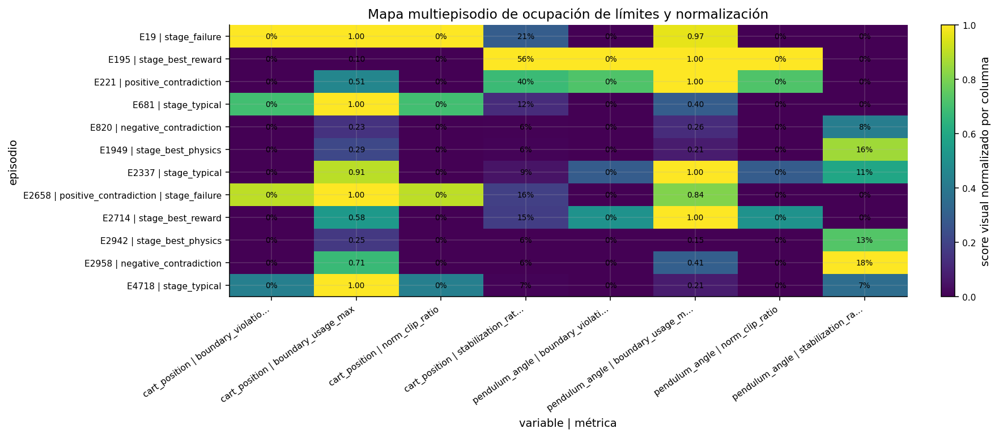

### Auditoría multiepisodio completa

,episode_id,state_var,n_step,boundary_limits,stabilization_limits,normalization_range,normalization_output_limits,setpoint_raw,setpoint_norm,raw_min,raw_q05,raw_median,raw_q95,raw_max,raw_abs_max,raw_final,boundary_violation_ratio,boundary_usage_max,stabilization_ratio,setpoint_abs_error_median,setpoint_abs_error_final,norm_min,norm_q05,norm_median,norm_q95,norm_max,norm_abs_max,norm_final,norm_clip_ratio,norm_expected_mae,norm_expected_max_abs_error
0,19,cart_position,1974,"[-5.0, 5.0]","[-0.1, 0.1]","[-5.0, 5.0]","[-1.0, 1.0]",0.0,0.0,0.000000,0.005092,0.710146,4.314414,5.005907,5.005907,5.005907,0.000507,1.001181,0.207700,0.710146,5.005907,0.000000,0.001018,0.142029,0.862883,1.000000,1.000000,1.000000,0.000507,0.0,0.0
1,19,pendulum_angle,1974,"[-1.0472, 1.0472]","[-0.02, 0.02]","[-1.0472, 1.0472]","[-1.0, 1.0]",0.0,0.0,0.157000,0.159461,0.370503,0.881166,1.016331,1.016331,1.016331,0.000000,0.970522,0.000000,0.370503,1.016331,0.149924,0.152274,0.353804,0.841450,0.970522,0.970522,0.970522,0.000000,0.0,0.0
2,195,cart_position,1027,"[-5.0, 5.0]","[-0.1, 0.1]","[-5.0, 5.0]","[-1.0, 1.0]",0.0,0.0,0.000000,0.001034,0.075152,0.422081,0.481850,0.481850,0.481850,0.000000,0.096370,0.556962,0.075152,0.481850,0.000000,0.000207,0.015030,0.084416,0.096370,0.096370,0.096370,0.000000,0.0,0.0
3,195,pendulum_angle,1027,"[-1.0472, 1.0472]","[-0.02, 0.02]","[-1.0472, 1.0472]","[-1.0, 1.0]",0.0,0.0,0.157000,0.158000,0.311921,0.917149,1.047569,1.047569,1.047569,0.000974,1.000353,0.000000,0.311921,1.047569,0.149924,0.150879,0.297861,0.875811,1.000000,1.000000,1.000000,0.000974,0.0,0.0
4,221,cart_position,1417,"[-5.0, 5.0]","[-0.1, 0.1]","[-5.0, 5.0]","[-1.0, 1.0]",0.0,0.0,0.000000,0.001509,0.205923,2.206951,2.566992,2.566992,2.566992,0.000000,0.513398,0.398024,0.205923,2.566992,0.000000,0.000302,0.041185,0.441390,0.513398,0.513398,0.513398,0.000000,0.0,0.0
5,221,pendulum_angle,1417,"[-1.0472, 1.0472]","[-0.02, 0.02]","[-1.0472, 1.0472]","[-1.0, 1.0]",0.0,0.0,0.157000,0.159363,0.458865,0.929587,1.047578,1.047578,1.047578,0.000706,1.000361,0.000000,0.458865,1.047578,0.149924,0.152180,0.438182,0.887688,1.000000,1.000000,1.000000,0.000706,0.0,0.0
6,681,cart_position,2839,"[-5.0, 5.0]","[-0.1, 0.1]","[-5.0, 5.0]","[-1.0, 1.0]",0.0,0.0,0.000000,0.013391,1.377879,4.467666,5.001419,5.001419,5.001419,0.000352,1.000284,0.123283,1.377879,5.001419,0.000000,0.002678,0.275576,0.893533,1.000000,1.000000,1.000000,0.000352,0.0,0.0
7,681,pendulum_angle,2839,"[-1.0472, 1.0472]","[-0.02, 0.02]","[-1.0472, 1.0472]","[-1.0, 1.0]",0.0,0.0,0.093893,0.094756,0.129898,0.352807,0.419564,0.419564,0.419564,0.000000,0.400654,0.000000,0.129898,0.419564,0.089661,0.090485,0.124043,0.336905,0.400654,0.400654,0.400654,0.000000,0.0,0.0
8,820,cart_position,5001,"[-5.0, 5.0]","[-0.1, 0.1]","[-5.0, 5.0]","[-1.0, 1.0]",0.0,0.0,0.000000,0.055809,0.621051,1.073479,1.147015,1.147015,1.147015,0.000000,0.229403,0.062787,0.621051,1.147015,0.000000,0.011162,0.124210,0.214696,0.229403,0.229403,0.229403,0.000000,0.0,0.0
9,820,pendulum_angle,5001,"[-1.0472, 1.0472]","[-0.02, 0.02]","[-1.0472, 1.0472]","[-1.0, 1.0]",0.0,0.0,-0.269795,-0.234363,0.050186,0.205201,0.213026,0.269795,0.198618,0.000000,0.257635,0.077784,0.129567,0.198618,-0.257635,-0.223800,0.047924,0.195952,0.203425,0.257635,0.189665,0.000000,0.0,0.0


### Matriz usada en el mapa

,episode_id,cart_position | boundary_violation_ratio,cart_position | boundary_usage_max,cart_position | norm_clip_ratio,cart_position | stabilization_ratio,pendulum_angle | boundary_violation_ratio,pendulum_angle | boundary_usage_max,pendulum_angle | norm_clip_ratio,pendulum_angle | stabilization_ratio
0,19,0.000507,1.001181,0.000507,0.207700,0.000000,0.970522,0.000000,0.000000
1,195,0.000000,0.096370,0.000000,0.556962,0.000974,1.000353,0.000974,0.000000
2,221,0.000000,0.513398,0.000000,0.398024,0.000706,1.000361,0.000706,0.000000
3,681,0.000352,1.000284,0.000352,0.123283,0.000000,0.400654,0.000000,0.000000
4,820,0.000000,0.229403,0.000000,0.062787,0.000000,0.257635,0.000000,0.077784
5,1949,0.000000,0.291538,0.000000,0.064987,0.000000,0.214490,0.000000,0.157369
6,2337,0.000000,0.908845,0.000000,0.086149,0.000282,1.000772,0.000282,0.108671
7,2658,0.000456,1.000846,0.000456,0.155353,0.000000,0.838292,0.000000,0.000000
8,2714,0.000000,0.582024,0.000000,0.151140,0.000496,1.001015,0.000496,0.000000
9,2942,0.000000,0.246219,0.000000,0.060588,0.000000,0.150209,0.000000,0.134173


In [123]:
# ---------------------------------------------------------------------
# 5.8 — Figura 3: mapa multiepisodio de límites y clipping
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar qué episodios, variables y métricas
# se observan.
# ---------------------------------------------------------------------

MULTI_AUDIT_EPISODE_IDS = EPISODES_TO_LOAD_IDS[:12]

MULTI_AUDIT_STATE_VARS = [
    "pendulum_angle",
    "cart_position",

    # Activar si se quiere:
    # "pendulum_velocity",
    # "cart_velocity",
]

MULTI_AUDIT_METRICS = [
    "boundary_violation_ratio",
    "boundary_usage_max",
    "norm_clip_ratio",
    "stabilization_ratio",

    # Activar si interesa validar consistencia matemática de normalización:
    # "norm_expected_mae",
]

MULTI_AUDIT_NORMALIZE_PER_COLUMN = True


section5_multi_episode_audit_df = s5_compute_state_audit_for_episodes(
    episode_ids=MULTI_AUDIT_EPISODE_IDS,
    episode_frames_by_id=episode_frames_by_id,
    config_main=selected_config_main,
    state_vars=MULTI_AUDIT_STATE_VARS,
)

section5_multi_episode_matrix_df = s5_plot_multiepisode_state_audit_heatmap(
    audit_df=section5_multi_episode_audit_df,
    metrics=MULTI_AUDIT_METRICS,
    representative_episodes_df=representative_episodes_df,
    normalize_per_column=MULTI_AUDIT_NORMALIZE_PER_COLUMN,
    title="Mapa multiepisodio de ocupación de límites y normalización",
    save_as=None,
)

display(Markdown("### Auditoría multiepisodio completa"))
display(section5_multi_episode_audit_df)

display(Markdown("### Matriz usada en el mapa"))
display(section5_multi_episode_matrix_df)

### 5.9 Cierre de sección

In [124]:
# ---------------------------------------------------------------------
# 5.9 — Cierre de Sección 5
# ---------------------------------------------------------------------

SECTION5_OUTPUTS = {
    "section5_state_catalog_df": "catálogo de variables físicas, límites, setpoints y normalización",
    "section5_focus_state_audit_df": "auditoría del episodio foco o episodios indicados",
    "section5_focus_findings_df": "alertas interpretativas sobre límites y normalización",
    "section5_multi_episode_audit_df": "auditoría física/normalización multiepisodio",
    "section5_multi_episode_matrix_df": "matriz usada en el heatmap multiepisodio",
}

display(Markdown("### Salidas listas de la Sección 5"))
display(
    pd.DataFrame([
        {"object": key, "description": value}
        for key, value in SECTION5_OUTPUTS.items()
    ])
)

display(Markdown("### Lectura recomendada antes de pasar a recompensa/control"))
display(section5_focus_findings_df)

### Salidas listas de la Sección 5

,object,description
0,section5_state_catalog_df,"catálogo de variables físicas, límites, setpoints y normalización"
1,section5_focus_state_audit_df,auditoría del episodio foco o episodios indicados
2,section5_focus_findings_df,alertas interpretativas sobre límites y normalización
3,section5_multi_episode_audit_df,auditoría física/normalización multiepisodio
4,section5_multi_episode_matrix_df,matriz usada en el heatmap multiepisodio


### Lectura recomendada antes de pasar a recompensa/control

,episode_id,state_var,finding,boundary_violation_ratio,boundary_usage_max,norm_clip_ratio,stabilization_ratio,norm_expected_mae
0,4718,cart_position,viola límites físicos | opera cerca del límite físico | pasa poco tiempo en región de estabilización,0.00022,1.000193,0.00022,0.065891,0.0
1,4718,cart_velocity,pasa poco tiempo en región de estabilización,NaN,NaN,0.00000,0.045684,0.0
2,4718,pendulum_angle,pasa poco tiempo en región de estabilización,0.00000,0.214611,0.00000,0.065671,0.0
3,4718,pendulum_velocity,sin alerta fuerte en esta lectura,NaN,NaN,0.00000,0.562486,0.0


## Sección 6 — Control aplicado, saturación y coherencia PID

**Pregunta analítica:**  
¿El controlador está corrigiendo el sistema o está generando saturación, conflicto entre lazos, acumulación integral o acciones que no llegan al actuador?

**Objetivo específico:**  
A partir de los episodios ya cargados, esta sección permite:

1. observar la anatomía del control aplicado en el episodio foco;
2. separar demanda cruda, acción saturada, acción efectiva, asignación y conflicto;
3. mirar errores PID, derivada, integral y ganancias;
4. detectar si la saturación global está impidiendo que las acciones locales lleguen al sistema;
5. comparar episodios representativos según estrés de control.

**Criterio de uso:**  
Cada celda de figura contiene su propia caja editable de variables.  
El usuario no modifica helpers para cambiar qué se grafica.

### 6.1 Helpers generales de control

In [125]:
# ---------------------------------------------------------------------
# 6.1 — Helpers generales de control
# ---------------------------------------------------------------------
# No editar para cambiar variables.
# Las variables se seleccionan directamente en cada celda de figura.
# ---------------------------------------------------------------------

import re
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, Markdown


# ---------------------------------------------------------------------
# Fallbacks mínimos
# ---------------------------------------------------------------------

if "shorten_label" not in globals():
    def shorten_label(value, max_len=40):
        text = str(value)
        return text if len(text) <= max_len else text[:max_len - 1] + "…"


if "format_axis" not in globals():
    def format_axis(ax, title=None, xlabel=None, ylabel=None, grid=True, zero_line=False):
        if title is not None:
            ax.set_title(title)
        if xlabel is not None:
            ax.set_xlabel(xlabel)
        if ylabel is not None:
            ax.set_ylabel(ylabel)
        ax.grid(grid, alpha=0.25)
        if zero_line:
            ax.axhline(0.0, linewidth=0.8, alpha=0.6)
        return ax


if "save_current_figure" not in globals():
    def save_current_figure(filename=None, output_dir=None):
        if filename is None:
            return
        output_dir = Path(output_dir or ".")
        output_dir.mkdir(parents=True, exist_ok=True)
        path = output_dir / filename
        plt.savefig(path, bbox_inches="tight")
        print(f"Figura guardada en: {path}")


# ---------------------------------------------------------------------
# Utilidades base
# ---------------------------------------------------------------------

def s6_safe_numeric(values):
    return pd.to_numeric(pd.Series(values), errors="coerce").astype(float)


def s6_get_frame_from_bundle(bundle, source):
    if source == "step":
        return bundle["step_df"]

    if source == "interval":
        return bundle["interval_df"]

    raise ValueError('source debe ser "step" o "interval".')


def s6_get_time_axis(frame, source):
    if source == "step":
        preferred_cols = ["t_sec"]
    else:
        preferred_cols = ["interval_t_start_sec", "interval_id", "decision_id"]

    for col in preferred_cols:
        if col in frame.columns:
            values = s6_safe_numeric(frame[col])

            if values.notna().sum() > 1:
                return values.to_numpy(dtype=float), col

    return np.arange(len(frame), dtype=float), "index"


def s6_normalized_time(x):
    x = np.asarray(x, dtype=float)

    if len(x) == 0:
        return x

    valid = np.isfinite(x)

    if valid.sum() < 2:
        return np.linspace(0.0, 1.0, len(x))

    x_min = np.nanmin(x[valid])
    x_max = np.nanmax(x[valid])

    if x_max == x_min:
        return np.linspace(0.0, 1.0, len(x))

    return (x - x_min) / (x_max - x_min)


def s6_unique_preserve_order(values):
    out = []
    seen = set()

    for value in values:
        if value in seen:
            continue
        seen.add(value)
        out.append(value)

    return out


def s6_transform_series(values, transform="raw"):
    series = s6_safe_numeric(values)

    if transform is None or transform == "raw":
        return series

    if transform == "abs":
        return series.abs()

    if transform == "minmax":
        span = series.max() - series.min()

        if not np.isfinite(span) or span == 0:
            return pd.Series(0.0, index=series.index)

        return (series - series.min()) / span

    if transform == "zscore":
        std = series.std()

        if not np.isfinite(std) or std == 0:
            return pd.Series(0.0, index=series.index)

        return (series - series.mean()) / std

    raise ValueError(f"transform no soportado: {transform}")


def s6_minmax(values):
    values = s6_safe_numeric(values)
    span = values.max() - values.min()

    if not np.isfinite(span) or span == 0:
        return pd.Series(0.5, index=values.index)

    return (values - values.min()) / span


# ---------------------------------------------------------------------
# Metadata de control
# ---------------------------------------------------------------------

def s6_get_controller_configs(config_main):
    return (
        config_main
        .get("controller_base", {})
        .get("controllers", {})
    )


def s6_get_control_var_objs(config_main, step_df=None):
    controllers_cfg = s6_get_controller_configs(config_main)

    var_objs = []

    for _, cfg in controllers_cfg.items():
        params = cfg.get("params", {})
        var_obj = params.get("name_objective_var", None)

        if var_obj is not None:
            var_objs.append(var_obj)

    if var_objs:
        return s6_unique_preserve_order(var_objs)

    if step_df is not None:
        candidates = []

        prefixes = [
            "error_",
            "control_action_",
            "control_action_eff_",
            "u_alloc_",
            "u_conflict_",
            "kp_",
            "ki_",
            "kd_",
        ]

        for col in step_df.columns:
            for prefix in prefixes:
                if str(col).startswith(prefix):
                    candidates.append(str(col).replace(prefix, "", 1))

        return sorted(set(candidates))

    return []


def s6_get_global_actuator_info(config_main):
    controller_base_cfg = config_main.get("controller_base", {})

    limits = controller_base_cfg.get("global_actuator_limits", None)

    return {
        "global_actuator_enabled": controller_base_cfg.get("global_actuator_enabled", np.nan),
        "global_actuator_limits": limits,
        "u_min_global": limits[0] if isinstance(limits, (list, tuple)) and len(limits) == 2 else np.nan,
        "u_max_global": limits[1] if isinstance(limits, (list, tuple)) and len(limits) == 2 else np.nan,
    }


def s6_build_controller_catalog(config_main, step_df, interval_df=None):
    rows = []
    controllers_cfg = s6_get_controller_configs(config_main)
    actuator_info = s6_get_global_actuator_info(config_main)

    for controller_name, cfg in controllers_cfg.items():
        params = cfg.get("params", {})
        initial = cfg.get("initial_conditions", {})
        anti = params.get("anti_windup", {})

        var_obj = params.get("name_objective_var", controller_name)

        expected_step_cols = [
            f"error_{var_obj}",
            f"derivative_error_{var_obj}",
            f"integral_error_{var_obj}",
            f"control_action_{var_obj}",
            f"control_action_eff_{var_obj}",
            f"u_alloc_{var_obj}",
            f"u_conflict_{var_obj}",
            f"delta_u_alloc_{var_obj}",
            f"is_saturated_{var_obj}",
            f"kp_{var_obj}",
            f"ki_{var_obj}",
            f"kd_{var_obj}",
        ]

        rows.append({
            "controller_name": controller_name,
            "var_obj": var_obj,
            "setpoint_raw": params.get("setpoint", np.nan),
            "error_is_setpoint_minus_pv": params.get("error_is_setpoint_minus_pv", np.nan),
            "kp_initial": initial.get("kp", np.nan),
            "ki_initial": initial.get("ki", np.nan),
            "kd_initial": initial.get("kd", np.nan),
            "anti_windup_enabled": anti.get("enabled", np.nan),
            "anti_windup_method": anti.get("method", np.nan),
            "global_actuator_enabled": actuator_info["global_actuator_enabled"],
            "global_actuator_limits": actuator_info["global_actuator_limits"],
            "available_step_cols": [
                col for col in expected_step_cols
                if col in step_df.columns
            ],
            "missing_step_cols": [
                col for col in expected_step_cols
                if col not in step_df.columns
            ],
        })

    return pd.DataFrame(rows)


def s6_get_existing_columns(frame, columns):
    return [col for col in columns if col in frame.columns]


def s6_resolve_columns(frame, columns=None, columns_regex=None, max_columns=None, exclude_regex=None):
    resolved = []

    columns = columns or []
    columns_regex = columns_regex or []

    if isinstance(columns, str):
        columns = [columns]

    if isinstance(columns_regex, str):
        columns_regex = [columns_regex]

    for col in columns:
        if col in frame.columns:
            resolved.append(col)

    for pattern in columns_regex:
        matched = [
            col for col in frame.columns
            if re.search(pattern, str(col), flags=re.IGNORECASE)
        ]
        resolved.extend(matched)

    if exclude_regex is not None:
        resolved = [
            col for col in resolved
            if not re.search(exclude_regex, str(col), flags=re.IGNORECASE)
        ]

    resolved = s6_unique_preserve_order(resolved)

    if max_columns is not None:
        resolved = resolved[:int(max_columns)]

    return resolved


# ---------------------------------------------------------------------
# Referencias visuales
# ---------------------------------------------------------------------

def s6_add_actuator_reference_lines(ax, config_main):
    info = s6_get_global_actuator_info(config_main)
    limits = info["global_actuator_limits"]

    if isinstance(limits, (list, tuple)) and len(limits) == 2:
        ax.axhline(limits[0], linestyle="--", linewidth=0.9, alpha=0.60)
        ax.axhline(limits[1], linestyle="--", linewidth=0.9, alpha=0.60)

    ax.axhline(0.0, linewidth=0.8, alpha=0.50)
    return ax


def s6_should_step_plot(column_name, spec):
    if spec.get("plot_kind", None) == "step":
        return True

    c = str(column_name).lower()

    if c.startswith("is_"):
        return True

    if "saturat" in c:
        return True

    if c.startswith("action_"):
        return True

    return False


def s6_plot_series(ax, x, y, label, column_name, spec, source, linewidth=1.2, alpha=0.88):
    if s6_should_step_plot(column_name, spec):
        ax.step(
            x,
            y,
            where="post",
            linewidth=linewidth,
            alpha=alpha,
            label=label,
        )
    else:
        marker = "o" if source == "interval" and len(y) <= 300 else None
        markersize = 3 if marker else None

        ax.plot(
            x,
            y,
            linewidth=linewidth,
            alpha=alpha,
            marker=marker,
            markersize=markersize,
            label=label,
        )

    return ax


def s6_boolean_spans(ax, x, bool_values, alpha=0.08):
    """
    Sombrea regiones donde bool_values es verdadero.
    """
    if len(x) == 0:
        return ax

    values = pd.Series(bool_values).fillna(False).astype(bool).to_numpy()

    if len(values) != len(x):
        return ax

    starts = []
    ends = []
    in_region = False
    start = None

    for idx, value in enumerate(values):
        if value and not in_region:
            start = idx
            in_region = True

        if in_region and ((not value) or idx == len(values) - 1):
            end = idx if not value else idx
            starts.append(start)
            ends.append(end)
            in_region = False

    for start_idx, end_idx in zip(starts, ends):
        ax.axvspan(
            x[start_idx],
            x[end_idx],
            alpha=alpha,
            linewidth=0,
        )

    return ax


# ---------------------------------------------------------------------
# Figura 1: paneles temporales configurables
# ---------------------------------------------------------------------

def s6_build_active_time_panels(episode_bundle, panel_specs):
    active = []

    for spec in panel_specs:
        source = spec.get("source", "step")
        frame = s6_get_frame_from_bundle(episode_bundle, source)

        primary_cols = s6_resolve_columns(
            frame=frame,
            columns=spec.get("columns", []),
            columns_regex=spec.get("columns_regex", []),
            max_columns=spec.get("max_columns", None),
            exclude_regex=spec.get("exclude_regex", None),
        )

        secondary_cols = s6_resolve_columns(
            frame=frame,
            columns=spec.get("secondary_columns", []),
            columns_regex=spec.get("secondary_columns_regex", []),
            max_columns=spec.get("secondary_max_columns", None),
            exclude_regex=spec.get("secondary_exclude_regex", None),
        )

        if not primary_cols and not secondary_cols:
            continue

        if spec.get("expand_by_column", False) and len(primary_cols) > 1:
            for col in primary_cols:
                panel_copy = dict(spec)
                panel_copy["_primary_columns"] = [col]
                panel_copy["_secondary_columns"] = (
                    secondary_cols
                    if spec.get("secondary_on_each_expanded", False)
                    else []
                )
                panel_copy["_resolved_title"] = f"{spec.get('title', spec.get('panel_id'))} — {col}"
                active.append(panel_copy)
        else:
            panel_copy = dict(spec)
            panel_copy["_primary_columns"] = primary_cols
            panel_copy["_secondary_columns"] = secondary_cols
            panel_copy["_resolved_title"] = spec.get("title", spec.get("panel_id", "panel"))
            active.append(panel_copy)

    return active


def s6_summarize_time_panels(active_panel_specs):
    return pd.DataFrame([
        {
            "panel_id": spec.get("panel_id"),
            "title": spec.get("_resolved_title", spec.get("title")),
            "source": spec.get("source"),
            "primary_columns": spec.get("_primary_columns", []),
            "secondary_columns": spec.get("_secondary_columns", []),
            "reference": spec.get("reference"),
            "transform": spec.get("transform", "raw"),
        }
        for spec in active_panel_specs
    ])


def s6_plot_control_time_panels(
    episode_id,
    episode_frames_by_id,
    config_main,
    panel_specs,
    title="Anatomía temporal del control",
    save_as=None,
):
    episode_id = int(episode_id)

    if episode_id not in episode_frames_by_id:
        raise KeyError(
            f"episode_id={episode_id} no está cargado. "
            f"Episodios disponibles: {sorted(map(int, episode_frames_by_id.keys()))}"
        )

    bundle = episode_frames_by_id[episode_id]
    active_panels = s6_build_active_time_panels(bundle, panel_specs)

    if not active_panels:
        display(Markdown("No hay paneles activos con las columnas seleccionadas."))
        return pd.DataFrame()

    n_panels = len(active_panels)

    fig, axes = plt.subplots(
        n_panels,
        1,
        figsize=(14.0, max(3.0 * n_panels, 5.5)),
        sharex=False,
    )

    if n_panels == 1:
        axes = [axes]

    for ax, spec in zip(axes, active_panels):
        source = spec.get("source", "step")
        frame = s6_get_frame_from_bundle(bundle, source)

        x, x_label = s6_get_time_axis(frame, source)

        if spec.get("shade_saturation", False) and "is_saturated_global" in frame.columns:
            s6_boolean_spans(
                ax,
                x=x,
                bool_values=frame["is_saturated_global"],
                alpha=spec.get("shade_alpha", 0.08),
            )

        primary_cols = spec.get("_primary_columns", [])
        secondary_cols = spec.get("_secondary_columns", [])

        transform = spec.get("transform", "raw")

        for col in primary_cols:
            y = s6_transform_series(frame[col], transform=transform)
            label = col if transform in [None, "raw"] else f"{col} [{transform}]"

            s6_plot_series(
                ax=ax,
                x=x,
                y=y,
                label=label,
                column_name=col,
                spec=spec,
                source=source,
                linewidth=1.22,
                alpha=0.90,
            )

        if spec.get("reference", None) == "global_actuator_limits":
            s6_add_actuator_reference_lines(ax, config_main)

        ax2 = None

        if secondary_cols:
            ax2 = ax.twinx()
            secondary_transform = spec.get("secondary_transform", "raw")

            for col in secondary_cols:
                y2 = s6_transform_series(frame[col], transform=secondary_transform)
                label2 = col if secondary_transform in [None, "raw"] else f"{col} [{secondary_transform}]"

                s6_plot_series(
                    ax=ax2,
                    x=x,
                    y=y2,
                    label=label2,
                    column_name=col,
                    spec={**spec, "plot_kind": spec.get("secondary_plot_kind", "step")},
                    source=source,
                    linewidth=1.05,
                    alpha=0.42,
                )

            ax2.set_ylabel(spec.get("secondary_ylabel", "secondary"))
            ax2.grid(False)

            if all(
                str(col).startswith("is_") or "saturat" in str(col).lower()
                for col in secondary_cols
            ):
                ax2.set_ylim(-0.05, 1.05)

        format_axis(
            ax,
            title=spec.get("_resolved_title", spec.get("title", spec.get("panel_id"))),
            xlabel=x_label,
            ylabel=spec.get("ylabel", "value"),
            zero_line=spec.get("zero_line", False),
        )

        handles, labels = ax.get_legend_handles_labels()

        if ax2 is not None:
            handles2, labels2 = ax2.get_legend_handles_labels()
            handles = handles + handles2
            labels = labels + labels2

        if handles:
            ax.legend(
                handles,
                labels,
                loc="upper left",
                bbox_to_anchor=(1.01, 1.0),
                frameon=False,
                ncol=spec.get("legend_ncols", 1),
            )

    end_data = bundle.get("end_data", {})

    fig.suptitle(
        (
            f"{title}\n"
            f"run_id = {SELECTED_RUN_ID} | episode_id = {episode_id} | "
            f"termination = {end_data.get('end_termination_reason', 'unknown')} | "
            f"total_reward = {end_data.get('total_reward', np.nan)}"
        ),
        y=1.01,
        fontsize=13,
    )

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return s6_summarize_time_panels(active_panels)


# ---------------------------------------------------------------------
# Figura 2: relaciones de control
# ---------------------------------------------------------------------

def s6_plot_control_relationships(
    episode_id,
    episode_frames_by_id,
    relationship_specs,
    title="Relaciones de control",
    save_as=None,
):
    episode_id = int(episode_id)

    if episode_id not in episode_frames_by_id:
        raise KeyError(
            f"episode_id={episode_id} no está cargado. "
            f"Episodios disponibles: {sorted(map(int, episode_frames_by_id.keys()))}"
        )

    bundle = episode_frames_by_id[episode_id]
    end_data = bundle.get("end_data", {})

    active_specs = []

    for spec in relationship_specs:
        source = spec.get("source", "step")
        frame = s6_get_frame_from_bundle(bundle, source)

        x_col = spec["x_col"]
        y_col = spec["y_col"]

        required = [x_col, y_col]

        if spec.get("size_col", None) is not None:
            required.append(spec["size_col"])

        if all(col in frame.columns for col in required):
            active_specs.append(spec)

    if not active_specs:
        display(Markdown("No hay relaciones activas con las columnas seleccionadas."))
        return pd.DataFrame()

    n_plots = len(active_specs)
    n_cols = min(2, n_plots)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(7.2 * n_cols, 5.4 * n_rows),
        squeeze=False,
    )

    active_rows = []

    for idx, spec in enumerate(active_specs):
        ax = axes[idx // n_cols][idx % n_cols]

        source = spec.get("source", "step")
        frame = s6_get_frame_from_bundle(bundle, source)

        x_col = spec["x_col"]
        y_col = spec["y_col"]

        x = s6_safe_numeric(frame[x_col])
        y = s6_safe_numeric(frame[y_col])

        time_values, time_label = s6_get_time_axis(frame, source)
        time_norm = s6_normalized_time(time_values)

        valid = x.notna() & y.notna()

        if spec.get("size_col", None) is not None:
            size = 25 + 180 * s6_minmax(frame[spec["size_col"]])
            size_values = size.loc[valid].to_numpy(dtype=float)
        else:
            size_values = 22

        x_valid = x.loc[valid].to_numpy(dtype=float)
        y_valid = y.loc[valid].to_numpy(dtype=float)
        time_valid = time_norm[valid.to_numpy()]

        if spec.get("draw_path", True):
            ax.plot(
                x_valid,
                y_valid,
                linewidth=0.75,
                alpha=0.22,
            )

        sc = ax.scatter(
            x_valid,
            y_valid,
            c=time_valid,
            s=size_values,
            alpha=0.72,
        )

        if len(x_valid) > 0:
            ax.scatter(
                x_valid[0],
                y_valid[0],
                marker="o",
                s=90,
                edgecolors="black",
                linewidth=0.8,
                label="inicio",
            )
            ax.scatter(
                x_valid[-1],
                y_valid[-1],
                marker="X",
                s=95,
                edgecolors="black",
                linewidth=0.8,
                label="fin",
            )

        if spec.get("x_ref", None) is not None:
            ax.axvline(float(spec["x_ref"]), linestyle="--", linewidth=0.85, alpha=0.55)

        if spec.get("y_ref", None) is not None:
            ax.axhline(float(spec["y_ref"]), linestyle="--", linewidth=0.85, alpha=0.55)

        format_axis(
            ax,
            title=spec.get("title", f"{y_col} vs {x_col}"),
            xlabel=spec.get("xlabel", x_col),
            ylabel=spec.get("ylabel", y_col),
            zero_line=spec.get("zero_line", False),
        )

        if spec.get("size_col", None) is not None:
            ax.text(
                0.99,
                0.02,
                f"tamaño: {spec.get('size_label', spec['size_col'])}",
                transform=ax.transAxes,
                ha="right",
                va="bottom",
                fontsize=7,
                alpha=0.75,
            )

        ax.legend(loc="best", frameon=False)
        fig.colorbar(sc, ax=ax, label=f"{time_label} normalizado")

        active_rows.append({
            "source": source,
            "x_col": x_col,
            "y_col": y_col,
            "size_col": spec.get("size_col", None),
            "title": spec.get("title", f"{y_col} vs {x_col}"),
            "n_points": int(valid.sum()),
        })

    for empty_idx in range(n_plots, n_rows * n_cols):
        axes[empty_idx // n_cols][empty_idx % n_cols].axis("off")

    fig.suptitle(
        (
            f"{title}\n"
            f"run_id = {SELECTED_RUN_ID} | episode_id = {episode_id} | "
            f"termination = {end_data.get('end_termination_reason', 'unknown')}"
        ),
        y=1.02,
        fontsize=13,
    )

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return pd.DataFrame(active_rows)


# ---------------------------------------------------------------------
# Auditoría tabular y mapa multiepisodio
# ---------------------------------------------------------------------

def s6_ratio_true(values):
    series = pd.Series(values)

    if series.empty:
        return np.nan

    return float(series.fillna(False).astype(bool).mean())


def s6_ratio_abs_greater(values, threshold=1e-9):
    values = s6_safe_numeric(values)

    if values.empty:
        return np.nan

    return float((values.abs() > threshold).mean())


def s6_mean_abs(values):
    values = s6_safe_numeric(values)
    return float(values.abs().mean()) if not values.empty else np.nan


def s6_max_abs(values):
    values = s6_safe_numeric(values)
    return float(values.abs().max()) if not values.empty else np.nan


def s6_q_abs(values, q=0.95):
    values = s6_safe_numeric(values)
    return float(values.abs().quantile(q)) if not values.empty else np.nan


def s6_first_last_delta(frame, col):
    if col not in frame.columns or frame.empty:
        return np.nan, np.nan, np.nan

    values = s6_safe_numeric(frame[col]).dropna()

    if values.empty:
        return np.nan, np.nan, np.nan

    first = float(values.iloc[0])
    last = float(values.iloc[-1])
    return first, last, last - first


def s6_compute_control_audit_for_episode(
    episode_id,
    episode_frames_by_id,
    config_main,
    var_objs,
    conflict_threshold=1e-9,
):
    episode_id = int(episode_id)
    bundle = episode_frames_by_id[episode_id]
    step_df = bundle["step_df"]
    end_data = bundle.get("end_data", {})

    actuator_info = s6_get_global_actuator_info(config_main)
    actuator_limits = actuator_info["global_actuator_limits"]

    global_metrics = {
        "episode_id": episode_id,
        "n_step": int(step_df.shape[0]),
        "end_termination_reason": end_data.get("end_termination_reason", np.nan),
        "total_reward": end_data.get("total_reward", np.nan),
        "total_agent_decisions": end_data.get("total_agent_decisions", np.nan),
        "global_actuator_limits": actuator_limits,
    }

    if "is_saturated_global" in step_df.columns:
        global_metrics["saturation_ratio_global"] = s6_ratio_true(step_df["is_saturated_global"])

    if "u_total_raw" in step_df.columns:
        raw = s6_safe_numeric(step_df["u_total_raw"])
        global_metrics["u_total_raw_abs_mean"] = float(raw.abs().mean())
        global_metrics["u_total_raw_abs_max"] = float(raw.abs().max())

        if isinstance(actuator_limits, (list, tuple)) and len(actuator_limits) == 2:
            max_limit = max(abs(actuator_limits[0]), abs(actuator_limits[1]))
            global_metrics["u_total_raw_limit_usage_max"] = (
                float(raw.abs().max() / max_limit)
                if max_limit > 0
                else np.nan
            )

    if "u_total" in step_df.columns:
        u = s6_safe_numeric(step_df["u_total"])
        global_metrics["u_total_abs_mean"] = float(u.abs().mean())
        global_metrics["u_total_abs_max"] = float(u.abs().max())

    rows = []

    for var_obj in var_objs:
        row = dict(global_metrics)
        row["var_obj"] = var_obj

        columns = {
            "error": f"error_{var_obj}",
            "derivative_error": f"derivative_error_{var_obj}",
            "integral_error": f"integral_error_{var_obj}",
            "control_action": f"control_action_{var_obj}",
            "control_action_eff": f"control_action_eff_{var_obj}",
            "u_alloc": f"u_alloc_{var_obj}",
            "u_conflict": f"u_conflict_{var_obj}",
            "delta_control_action": f"delta_control_action_{var_obj}",
            "delta_control_action_eff": f"delta_control_action_eff_{var_obj}",
            "delta_u_alloc": f"delta_u_alloc_{var_obj}",
            "is_saturated_local": f"is_saturated_{var_obj}",
            "kp": f"kp_{var_obj}",
            "ki": f"ki_{var_obj}",
            "kd": f"kd_{var_obj}",
        }

        for metric_name, col in columns.items():
            if col not in step_df.columns:
                continue

            values = s6_safe_numeric(step_df[col])

            if metric_name in ["is_saturated_local"]:
                row[f"{metric_name}_ratio"] = s6_ratio_true(values)
                continue

            row[f"{metric_name}_abs_mean"] = float(values.abs().mean())
            row[f"{metric_name}_abs_max"] = float(values.abs().max())
            row[f"{metric_name}_final"] = float(values.iloc[-1]) if len(values) else np.nan

        if columns["u_conflict"] in step_df.columns:
            row["conflict_ratio"] = s6_ratio_abs_greater(
                step_df[columns["u_conflict"]],
                threshold=conflict_threshold,
            )

        if columns["control_action"] in step_df.columns and columns["control_action_eff"] in step_df.columns:
            action = s6_safe_numeric(step_df[columns["control_action"]]).abs()
            eff = s6_safe_numeric(step_df[columns["control_action_eff"]]).abs()

            valid = action > conflict_threshold

            if valid.any():
                ratio = (eff.loc[valid] / action.loc[valid]).clip(0, 10)
                row["action_eff_to_raw_ratio_median"] = float(ratio.median())
            else:
                row["action_eff_to_raw_ratio_median"] = np.nan

        if columns["u_alloc"] in step_df.columns and columns["control_action"] in step_df.columns:
            alloc = s6_safe_numeric(step_df[columns["u_alloc"]]).abs()
            action = s6_safe_numeric(step_df[columns["control_action"]]).abs()

            valid = action > conflict_threshold

            if valid.any():
                ratio = (alloc.loc[valid] / action.loc[valid]).clip(0, 10)
                row["u_alloc_to_action_ratio_median"] = float(ratio.median())
            else:
                row["u_alloc_to_action_ratio_median"] = np.nan

        for gain in ["kp", "ki", "kd"]:
            col = columns[gain]
            first, last, delta = s6_first_last_delta(step_df, col)
            row[f"{gain}_first"] = first
            row[f"{gain}_last"] = last
            row[f"{gain}_delta"] = delta
            row[f"{gain}_delta_abs"] = abs(delta) if pd.notna(delta) else np.nan

        rows.append(row)

    return pd.DataFrame(rows)


def s6_compute_control_audit_for_episodes(
    episode_ids,
    episode_frames_by_id,
    config_main,
    var_objs,
    conflict_threshold=1e-9,
):
    frames = []

    for episode_id in episode_ids:
        if int(episode_id) not in episode_frames_by_id:
            continue

        frames.append(
            s6_compute_control_audit_for_episode(
                episode_id=episode_id,
                episode_frames_by_id=episode_frames_by_id,
                config_main=config_main,
                var_objs=var_objs,
                conflict_threshold=conflict_threshold,
            )
        )

    if not frames:
        return pd.DataFrame()

    return (
        pd.concat(frames, ignore_index=True, sort=False)
        .sort_values(["episode_id", "var_obj"])
        .reset_index(drop=True)
    )


def s6_build_control_findings(audit_df, thresholds):
    rows = []

    for _, row in audit_df.iterrows():
        findings = []

        sat = row.get("saturation_ratio_global", np.nan)
        conflict = row.get("conflict_ratio", np.nan)
        eff_ratio = row.get("action_eff_to_raw_ratio_median", np.nan)
        alloc_ratio = row.get("u_alloc_to_action_ratio_median", np.nan)
        integral_max = row.get("integral_error_abs_max", np.nan)
        u_usage = row.get("u_total_raw_limit_usage_max", np.nan)

        if pd.notna(sat) and sat >= thresholds["high_saturation_ratio"]:
            findings.append("alta saturación global")

        if pd.notna(u_usage) and u_usage >= thresholds["high_actuator_usage"]:
            findings.append("demanda cruda cerca/sobre límite de actuador")

        if pd.notna(conflict) and conflict >= thresholds["high_conflict_ratio"]:
            findings.append("conflicto relevante entre lazos")

        if pd.notna(eff_ratio) and eff_ratio <= thresholds["low_effective_action_ratio"]:
            findings.append("acción local muy reducida por saturación global")

        if pd.notna(alloc_ratio) and alloc_ratio <= thresholds["low_alloc_action_ratio"]:
            findings.append("poca asignación efectiva respecto a la acción pedida")

        if pd.notna(integral_max) and integral_max >= thresholds["high_integral_abs"]:
            findings.append("integral acumulada alta")

        gain_deltas = [
            row.get("kp_delta_abs", np.nan),
            row.get("ki_delta_abs", np.nan),
            row.get("kd_delta_abs", np.nan),
        ]

        if any(pd.notna(v) and v > thresholds["gain_change_tol"] for v in gain_deltas):
            findings.append("ganancias modificadas durante el episodio")

        if not findings:
            findings.append("sin alerta fuerte en esta lectura")

        rows.append({
            "episode_id": row["episode_id"],
            "var_obj": row["var_obj"],
            "finding": " | ".join(findings),
            "saturation_ratio_global": sat,
            "u_total_raw_limit_usage_max": u_usage,
            "conflict_ratio": conflict,
            "action_eff_to_raw_ratio_median": eff_ratio,
            "u_alloc_to_action_ratio_median": alloc_ratio,
            "integral_error_abs_max": integral_max,
            "kp_delta": row.get("kp_delta", np.nan),
            "ki_delta": row.get("ki_delta", np.nan),
            "kd_delta": row.get("kd_delta", np.nan),
        })

    return pd.DataFrame(rows)


def s6_episode_label_map(representative_episodes_df):
    if representative_episodes_df is None or representative_episodes_df.empty:
        return {}

    return {
        int(row.episode_id): f"E{int(row.episode_id)} | {row.criterion_id}"
        for row in representative_episodes_df.itertuples(index=False)
    }


def s6_format_metric_value(value, metric_name):
    if pd.isna(value):
        return ""

    if "ratio" in metric_name:
        return f"{100 * value:.0f}%"

    if "usage" in metric_name:
        return f"{value:.2f}"

    if "delta" in metric_name:
        return f"{value:.2g}"

    return f"{value:.3g}"


def s6_build_multiepisode_control_matrix(audit_df, metrics):
    rows = []

    for episode_id in sorted(audit_df["episode_id"].unique()):
        ep_df = audit_df.loc[audit_df["episode_id"].eq(episode_id)]
        row = {"episode_id": int(episode_id)}

        for _, item in ep_df.iterrows():
            var_obj = item["var_obj"]

            for metric in metrics:
                col_name = f"{var_obj} | {metric}"
                row[col_name] = item.get(metric, np.nan)

        rows.append(row)

    return pd.DataFrame(rows)


def s6_normalize_matrix_by_column(matrix_df, value_cols):
    norm_df = matrix_df.copy()

    for col in value_cols:
        values = pd.to_numeric(norm_df[col], errors="coerce")
        span = values.max() - values.min()

        if not np.isfinite(span) or span == 0:
            norm_df[col] = 0.5
        else:
            norm_df[col] = (values - values.min()) / span

    return norm_df


def s6_plot_multiepisode_control_heatmap(
    audit_df,
    metrics,
    representative_episodes_df=None,
    normalize_per_column=True,
    title="Mapa multiepisodio de estrés de control",
    save_as=None,
):
    if audit_df.empty:
        display(Markdown("audit_df está vacío."))
        return pd.DataFrame()

    matrix_df = s6_build_multiepisode_control_matrix(
        audit_df=audit_df,
        metrics=metrics,
    )

    value_cols = [col for col in matrix_df.columns if col != "episode_id"]

    if not value_cols:
        display(Markdown("No hay métricas disponibles para graficar."))
        return matrix_df

    if normalize_per_column:
        color_df = s6_normalize_matrix_by_column(matrix_df, value_cols)
    else:
        color_df = matrix_df.copy()

    color_matrix = (
        color_df[value_cols]
        .apply(pd.to_numeric, errors="coerce")
        .to_numpy(dtype=float)
    )

    raw_matrix = (
        matrix_df[value_cols]
        .apply(pd.to_numeric, errors="coerce")
        .to_numpy(dtype=float)
    )

    episode_labels = s6_episode_label_map(representative_episodes_df)

    y_labels = [
        shorten_label(
            episode_labels.get(int(ep), f"E{int(ep)}"),
            max_len=52,
        )
        for ep in matrix_df["episode_id"]
    ]

    fig, ax = plt.subplots(
        figsize=(max(12.5, 0.42 * len(value_cols)), max(4.5, 0.45 * len(matrix_df)))
    )

    image = ax.imshow(
        np.ma.masked_invalid(color_matrix),
        aspect="auto",
        interpolation="nearest",
    )

    ax.set_title(title)
    ax.set_xlabel("lazo | métrica")
    ax.set_ylabel("episodio")

    ax.set_xticks(np.arange(len(value_cols)))
    ax.set_xticklabels(
        [shorten_label(col, max_len=34) for col in value_cols],
        rotation=35,
        ha="right",
    )

    ax.set_yticks(np.arange(len(y_labels)))
    ax.set_yticklabels(y_labels)

    for i in range(raw_matrix.shape[0]):
        for j in range(raw_matrix.shape[1]):
            metric_name = value_cols[j].split(" | ")[-1]
            value = raw_matrix[i, j]

            ax.text(
                j,
                i,
                s6_format_metric_value(value, metric_name),
                ha="center",
                va="center",
                fontsize=7,
            )

    colorbar_label = (
        "score visual normalizado por columna"
        if normalize_per_column
        else "valor métrico"
    )

    fig.colorbar(image, ax=ax, label=colorbar_label)

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return matrix_df

### 6.2 Catálogo y auditoría tabular de control

In [126]:
# ---------------------------------------------------------------------
# 6.2 — Catálogo y auditoría tabular de control
# ---------------------------------------------------------------------
# Editar SOLO esta caja para decidir qué episodios y lazos auditar.
# ---------------------------------------------------------------------

CONTROL_AUDIT_EPISODE_IDS = [
    FOCUS_EPISODE_ID,
]

# Para comparar todos los episodios cargados:
# CONTROL_AUDIT_EPISODE_IDS = EPISODES_TO_LOAD_IDS

CONTROL_AUDIT_VAR_OBJS = [
    "pendulum_angle",
    "cart_position",
]

CONTROL_CONFLICT_THRESHOLD = 1e-9

CONTROL_FINDING_THRESHOLDS = {
    "high_saturation_ratio": 0.10,
    "high_actuator_usage": 0.85,
    "high_conflict_ratio": 0.05,
    "low_effective_action_ratio": 0.75,
    "low_alloc_action_ratio": 0.50,
    "high_integral_abs": 0.50,
    "gain_change_tol": 1e-9,
}


section6_controller_catalog_df = s6_build_controller_catalog(
    config_main=selected_config_main,
    step_df=focus_step_df,
    interval_df=focus_interval_df,
)

section6_control_audit_df = s6_compute_control_audit_for_episodes(
    episode_ids=CONTROL_AUDIT_EPISODE_IDS,
    episode_frames_by_id=episode_frames_by_id,
    config_main=selected_config_main,
    var_objs=CONTROL_AUDIT_VAR_OBJS,
    conflict_threshold=CONTROL_CONFLICT_THRESHOLD,
)

section6_control_findings_df = s6_build_control_findings(
    audit_df=section6_control_audit_df,
    thresholds=CONTROL_FINDING_THRESHOLDS,
)


display(Markdown("### Catálogo de controladores desde metadata + columnas disponibles"))
display(section6_controller_catalog_df)

display(Markdown("### Auditoría de control"))
display(section6_control_audit_df)

display(Markdown("### Lectura automática de alertas de control"))
display(section6_control_findings_df)

### Catálogo de controladores desde metadata + columnas disponibles

,controller_name,var_obj,setpoint_raw,error_is_setpoint_minus_pv,kp_initial,ki_initial,kd_initial,anti_windup_enabled,anti_windup_method,global_actuator_enabled,global_actuator_limits,available_step_cols,missing_step_cols
0,controller_pendulum_angle,pendulum_angle,0.0,False,1.0,1.0,1.0,True,conditional,True,"[-1.0, 1.0]","[error_pendulum_angle, derivative_error_pendulum_angle, integral_error_pendulum_angle, control_action_pendulum_angle, control_action_eff_pendulum_angle, u_alloc_pendulum_angle,...",[]
1,controller_cart_position,cart_position,0.0,True,1.0,1.0,1.0,True,conditional,True,"[-1.0, 1.0]","[error_cart_position, derivative_error_cart_position, integral_error_cart_position, control_action_cart_position, control_action_eff_cart_position, u_alloc_cart_position, u_con...",[]


### Auditoría de control

,episode_id,n_step,end_termination_reason,total_reward,total_agent_decisions,global_actuator_limits,saturation_ratio_global,u_total_raw_abs_mean,u_total_raw_abs_max,u_total_raw_limit_usage_max,u_total_abs_mean,u_total_abs_max,var_obj,error_abs_mean,error_abs_max,error_final,derivative_error_abs_mean,derivative_error_abs_max,derivative_error_final,integral_error_abs_mean,integral_error_abs_max,integral_error_final,control_action_abs_mean,control_action_abs_max,control_action_final,control_action_eff_abs_mean,control_action_eff_abs_max,control_action_eff_final,u_alloc_abs_mean,u_alloc_abs_max,u_alloc_final,u_conflict_abs_mean,u_conflict_abs_max,u_conflict_final,delta_control_action_abs_mean,delta_control_action_abs_max,delta_control_action_final,delta_control_action_eff_abs_mean,delta_control_action_eff_abs_max,delta_control_action_eff_final,delta_u_alloc_abs_mean,delta_u_alloc_abs_max,delta_u_alloc_final,is_saturated_local_ratio,kp_abs_mean,kp_abs_max,kp_final,ki_abs_mean,ki_abs_max,ki_final,kd_abs_mean,kd_abs_max,kd_final,conflict_ratio,action_eff_to_raw_ratio_median,u_alloc_to_action_ratio_median,kp_first,kp_last,kp_delta,kp_delta_abs,ki_first,ki_last,ki_delta,ki_delta_abs,kd_first,kd_last,kd_delta,kd_delta_abs
0,4718,4553,limit_exceeded,-146.12800665697935,228,"[-1.0, 1.0]",0.0,0.185909,0.774585,0.774585,0.185909,0.774585,cart_position,0.314854,0.999462,-0.999462,0.219517,0.731065,-0.731065,0.405346,1.433532,-1.433532,1.13870,3.671227,-3.413924,1.13870,3.671227,-3.413924,0.032940,0.362241,0.000000,0.766867,3.671227,3.413924,0.009954,0.595897,-0.002672,0.009954,0.595897,-0.002672,0.001526,0.197867,0.000000,0.0,1.126949,1.50,1.25,1.124094,1.25,1.0,1.494180,1.75,1.0,0.650560,1.0,0.000000,1.0,1.25,0.25,0.25,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0
1,4718,4553,limit_exceeded,-146.12800665697935,228,"[-1.0, 1.0]",0.0,0.185909,0.774585,0.774585,0.185909,0.774585,pendulum_angle,0.089345,0.214611,0.206146,0.112132,0.454984,-0.101358,0.107322,0.342206,0.342206,1.25873,3.940335,3.940335,1.25873,3.940335,3.940335,0.152969,0.774585,0.526411,0.338894,3.237780,0.000000,0.003079,0.187592,0.000455,0.003079,0.187592,0.000455,0.009649,0.649926,-0.002217,0.0,4.984406,5.25,5.25,7.911926,8.50,8.5,0.627498,1.00,0.5,0.349001,1.0,0.113466,1.0,5.25,4.25,4.25,1.0,8.5,7.5,7.5,1.0,0.5,-0.5,0.5


### Lectura automática de alertas de control

,episode_id,var_obj,finding,saturation_ratio_global,u_total_raw_limit_usage_max,conflict_ratio,action_eff_to_raw_ratio_median,u_alloc_to_action_ratio_median,integral_error_abs_max,kp_delta,ki_delta,kd_delta
0,4718,cart_position,conflicto relevante entre lazos | poca asignación efectiva respecto a la acción pedida | integral acumulada alta | ganancias modificadas durante el episodio,0.0,0.774585,0.650560,1.0,0.000000,1.433532,0.25,0.0,0.0
1,4718,pendulum_angle,conflicto relevante entre lazos | poca asignación efectiva respecto a la acción pedida | ganancias modificadas durante el episodio,0.0,0.774585,0.349001,1.0,0.113466,0.342206,4.25,7.5,-0.5


### 6.3 Figura 1: anatomía temporal del control

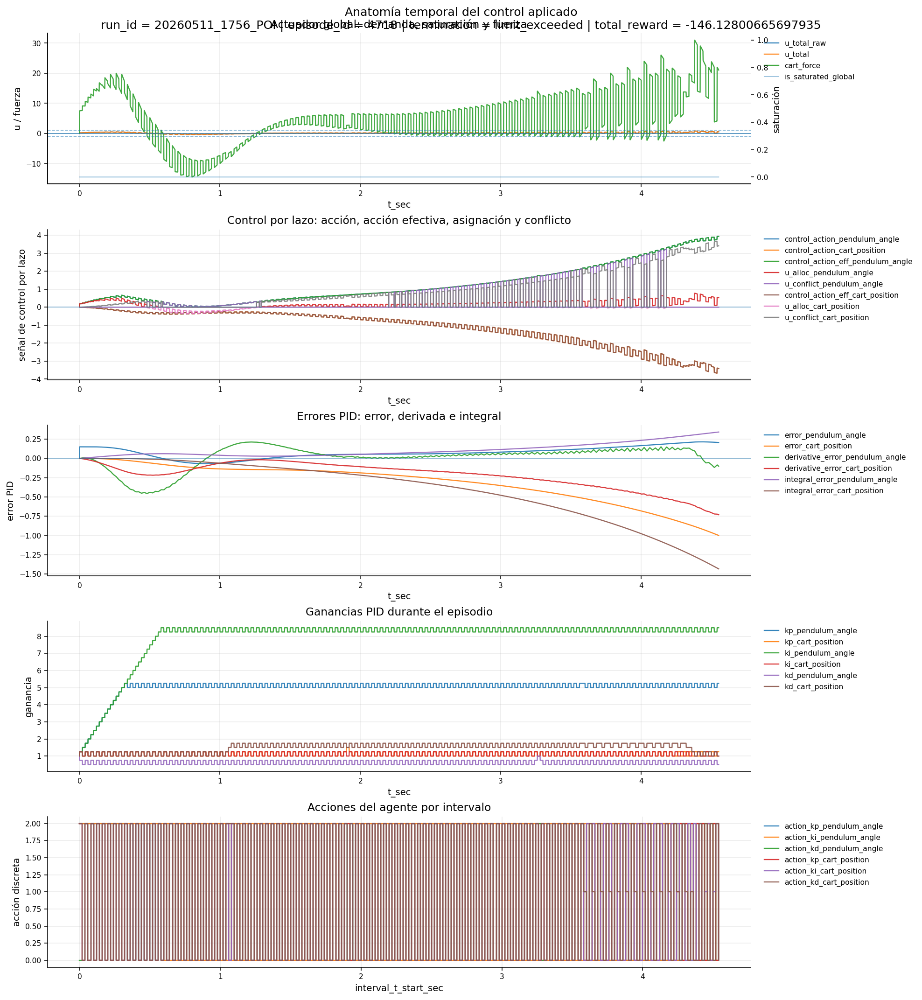

### Paneles efectivamente graficados

,panel_id,title,source,primary_columns,secondary_columns,reference,transform
0,global_actuator,"Actuador global: demanda, saturación y fuerza",step,"[u_total_raw, u_total, cart_force]",[is_saturated_global],global_actuator_limits,raw
1,loop_control,"Control por lazo: acción, acción efectiva, asignación y conflicto",step,"[control_action_pendulum_angle, control_action_cart_position, control_action_eff_pendulum_angle, u_alloc_pendulum_angle, u_conflict_pendulum_angle, control_action_eff_cart_posi...",[],None,raw
2,pid_errors,"Errores PID: error, derivada e integral",step,"[error_pendulum_angle, error_cart_position, derivative_error_pendulum_angle, derivative_error_cart_position, integral_error_pendulum_angle, integral_error_cart_position]",[],None,raw
3,pid_gains,Ganancias PID durante el episodio,step,"[kp_pendulum_angle, kp_cart_position, ki_pendulum_angle, ki_cart_position, kd_pendulum_angle, kd_cart_position]",[],None,raw
4,rl_actions,Acciones del agente por intervalo,interval,"[action_kp_pendulum_angle, action_ki_pendulum_angle, action_kd_pendulum_angle, action_kp_cart_position, action_ki_cart_position, action_kd_cart_position]",[],None,raw


In [127]:
# ---------------------------------------------------------------------
# 6.3 — Figura 1: anatomía temporal del control
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar qué se observa.
#
# source:
#   "step"     -> step_data
#   "interval" -> interval_data
#
# reference:
#   "global_actuator_limits" -> agrega límites de actuador global.
#   None                     -> sin referencia.
#
# transform:
#   "raw", "abs", "minmax", "zscore".
# ---------------------------------------------------------------------

CONTROL_TIME_EPISODE_ID = FOCUS_EPISODE_ID

# Panel 1 — actuador global
PLOT_GLOBAL_ACTUATOR_COLS = [
    "u_total_raw",
    "u_total_saturated",
    "u_total",
    "cart_force",
]

PLOT_GLOBAL_ACTUATOR_SECONDARY_COLS = [
    "is_saturated_global",
]

# Panel 2 — acciones por lazo
PLOT_LOOP_CONTROL_COLS = [
    # Exactas opcionales:
    # "control_action_pendulum_angle",
    # "control_action_cart_position",
    # "control_action_eff_pendulum_angle",
    # "control_action_eff_cart_position",
    # "u_alloc_pendulum_angle",
    # "u_alloc_cart_position",
    # "u_conflict_pendulum_angle",
    # "u_conflict_cart_position",
]

PLOT_LOOP_CONTROL_REGEX = [
    r"^(control_action|control_action_eff|u_alloc|u_conflict)_(pendulum_angle|cart_position)$",
]

PLOT_LOOP_CONTROL_MAX_COLUMNS = 12

# Panel 3 — errores PID
PLOT_PID_ERROR_COLS = [
    # Exactas opcionales:
    # "error_pendulum_angle",
    # "derivative_error_pendulum_angle",
    # "integral_error_pendulum_angle",
]

PLOT_PID_ERROR_REGEX = [
    r"^(error|derivative_error|integral_error)_(pendulum_angle|cart_position)$",
]

PLOT_PID_ERROR_MAX_COLUMNS = 12

# Panel 4 — ganancias PID
PLOT_PID_GAIN_COLS = [
    # Exactas opcionales:
    # "kp_pendulum_angle",
    # "ki_pendulum_angle",
    # "kd_pendulum_angle",
]

PLOT_PID_GAIN_REGEX = [
    r"^(kp|ki|kd)_(pendulum_angle|cart_position)$",
]

PLOT_PID_GAIN_MAX_COLUMNS = 12

# Panel 5 opcional — acciones RL por intervalo
INCLUDE_RL_ACTION_PANEL = True

PLOT_RL_ACTION_COLS = [
    # "action_kp_pendulum_angle",
    # "action_ki_pendulum_angle",
    # "action_kd_pendulum_angle",
]

PLOT_RL_ACTION_REGEX = [
    r"^action_(kp|ki|kd)_(pendulum_angle|cart_position)$",
]

PLOT_RL_ACTION_MAX_COLUMNS = 12


control_time_panel_specs = [
    {
        "panel_id": "global_actuator",
        "title": "Actuador global: demanda, saturación y fuerza",
        "source": "step",
        "columns": PLOT_GLOBAL_ACTUATOR_COLS,
        "columns_regex": [],
        "secondary_columns": PLOT_GLOBAL_ACTUATOR_SECONDARY_COLS,
        "secondary_columns_regex": [],
        "reference": "global_actuator_limits",
        "transform": "raw",
        "secondary_transform": "raw",
        "ylabel": "u / fuerza",
        "secondary_ylabel": "saturación",
        "zero_line": True,
        "shade_saturation": True,
    },
    {
        "panel_id": "loop_control",
        "title": "Control por lazo: acción, acción efectiva, asignación y conflicto",
        "source": "step",
        "columns": PLOT_LOOP_CONTROL_COLS,
        "columns_regex": PLOT_LOOP_CONTROL_REGEX,
        "max_columns": PLOT_LOOP_CONTROL_MAX_COLUMNS,
        "transform": "raw",
        "ylabel": "señal de control por lazo",
        "zero_line": True,
        "shade_saturation": True,
    },
    {
        "panel_id": "pid_errors",
        "title": "Errores PID: error, derivada e integral",
        "source": "step",
        "columns": PLOT_PID_ERROR_COLS,
        "columns_regex": PLOT_PID_ERROR_REGEX,
        "max_columns": PLOT_PID_ERROR_MAX_COLUMNS,
        "transform": "raw",
        "ylabel": "error PID",
        "zero_line": True,
        "shade_saturation": True,
    },
    {
        "panel_id": "pid_gains",
        "title": "Ganancias PID durante el episodio",
        "source": "step",
        "columns": PLOT_PID_GAIN_COLS,
        "columns_regex": PLOT_PID_GAIN_REGEX,
        "max_columns": PLOT_PID_GAIN_MAX_COLUMNS,
        "transform": "raw",
        "ylabel": "ganancia",
        "zero_line": False,
    },
]

if INCLUDE_RL_ACTION_PANEL:
    control_time_panel_specs.append(
        {
            "panel_id": "rl_actions",
            "title": "Acciones del agente por intervalo",
            "source": "interval",
            "columns": PLOT_RL_ACTION_COLS,
            "columns_regex": PLOT_RL_ACTION_REGEX,
            "max_columns": PLOT_RL_ACTION_MAX_COLUMNS,
            "transform": "raw",
            "ylabel": "acción discreta",
            "zero_line": False,
            "plot_kind": "step",
        }
    )


section6_control_time_panels_df = s6_plot_control_time_panels(
    episode_id=CONTROL_TIME_EPISODE_ID,
    episode_frames_by_id=episode_frames_by_id,
    config_main=selected_config_main,
    panel_specs=control_time_panel_specs,
    title="Anatomía temporal del control aplicado",
    save_as=None,
)

display(Markdown("### Paneles efectivamente graficados"))
display(section6_control_time_panels_df)

### 6.4 Figura 2: relaciones causales de control

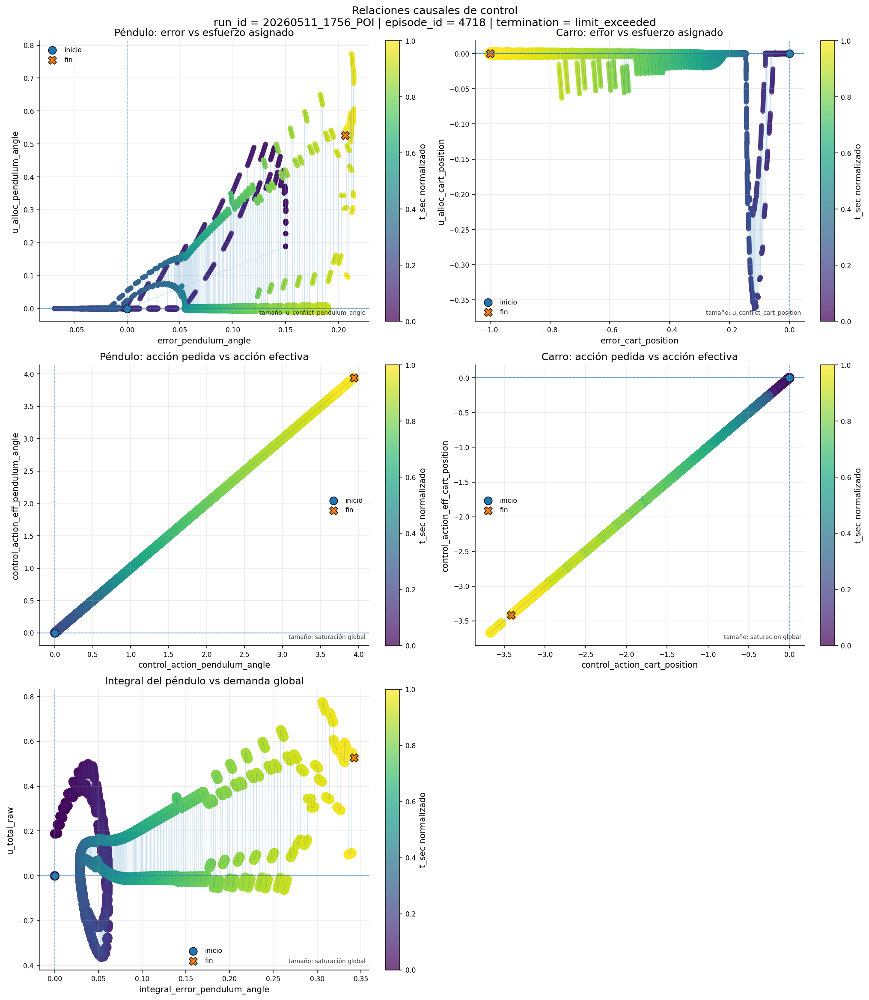

### Relaciones efectivamente graficadas

,source,x_col,y_col,size_col,title,n_points
0,step,error_pendulum_angle,u_alloc_pendulum_angle,u_conflict_pendulum_angle,Péndulo: error vs esfuerzo asignado,4553
1,step,error_cart_position,u_alloc_cart_position,u_conflict_cart_position,Carro: error vs esfuerzo asignado,4553
2,step,control_action_pendulum_angle,control_action_eff_pendulum_angle,is_saturated_global,Péndulo: acción pedida vs acción efectiva,4553
3,step,control_action_cart_position,control_action_eff_cart_position,is_saturated_global,Carro: acción pedida vs acción efectiva,4553
4,step,integral_error_pendulum_angle,u_total_raw,is_saturated_global,Integral del péndulo vs demanda global,4553


In [128]:
# ---------------------------------------------------------------------
# 6.4 — Figura 2: relaciones causales de control
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar qué relaciones se observan.
#
# Cada dict genera un panel.
# ---------------------------------------------------------------------

CONTROL_RELATION_EPISODE_ID = FOCUS_EPISODE_ID

CONTROL_RELATION_SPECS = [
    {
        "source": "step",
        "x_col": "u_total_raw",
        "y_col": "u_total_saturated",
        "size_col": "is_saturated_global",
        "title": "Demanda cruda vs acción saturada",
        "xlabel": "u_total_raw",
        "ylabel": "u_total_saturated",
        "size_label": "saturación global",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "source": "step",
        "x_col": "error_pendulum_angle",
        "y_col": "u_alloc_pendulum_angle",
        "size_col": "u_conflict_pendulum_angle",
        "title": "Péndulo: error vs esfuerzo asignado",
        "xlabel": "error_pendulum_angle",
        "ylabel": "u_alloc_pendulum_angle",
        "size_label": "u_conflict_pendulum_angle",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "source": "step",
        "x_col": "error_cart_position",
        "y_col": "u_alloc_cart_position",
        "size_col": "u_conflict_cart_position",
        "title": "Carro: error vs esfuerzo asignado",
        "xlabel": "error_cart_position",
        "ylabel": "u_alloc_cart_position",
        "size_label": "u_conflict_cart_position",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "source": "step",
        "x_col": "control_action_pendulum_angle",
        "y_col": "control_action_eff_pendulum_angle",
        "size_col": "is_saturated_global",
        "title": "Péndulo: acción pedida vs acción efectiva",
        "xlabel": "control_action_pendulum_angle",
        "ylabel": "control_action_eff_pendulum_angle",
        "size_label": "saturación global",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "source": "step",
        "x_col": "control_action_cart_position",
        "y_col": "control_action_eff_cart_position",
        "size_col": "is_saturated_global",
        "title": "Carro: acción pedida vs acción efectiva",
        "xlabel": "control_action_cart_position",
        "ylabel": "control_action_eff_cart_position",
        "size_label": "saturación global",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "source": "step",
        "x_col": "integral_error_pendulum_angle",
        "y_col": "u_total_raw",
        "size_col": "is_saturated_global",
        "title": "Integral del péndulo vs demanda global",
        "xlabel": "integral_error_pendulum_angle",
        "ylabel": "u_total_raw",
        "size_label": "saturación global",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },

    # Activar o reemplazar según hipótesis:
    # {
    #     "source": "step",
    #     "x_col": "u_conflict_pendulum_angle",
    #     "y_col": "u_conflict_cart_position",
    #     "title": "Conflicto entre lazos",
    #     "xlabel": "u_conflict_pendulum_angle",
    #     "ylabel": "u_conflict_cart_position",
    #     "x_ref": 0.0,
    #     "y_ref": 0.0,
    #     "zero_line": True,
    # },
]


section6_control_relationships_df = s6_plot_control_relationships(
    episode_id=CONTROL_RELATION_EPISODE_ID,
    episode_frames_by_id=episode_frames_by_id,
    relationship_specs=CONTROL_RELATION_SPECS,
    title="Relaciones causales de control",
    save_as=None,
)

display(Markdown("### Relaciones efectivamente graficadas"))
display(section6_control_relationships_df)

### 6.5 Figura 3: mapa multiepisodio de estrés de control

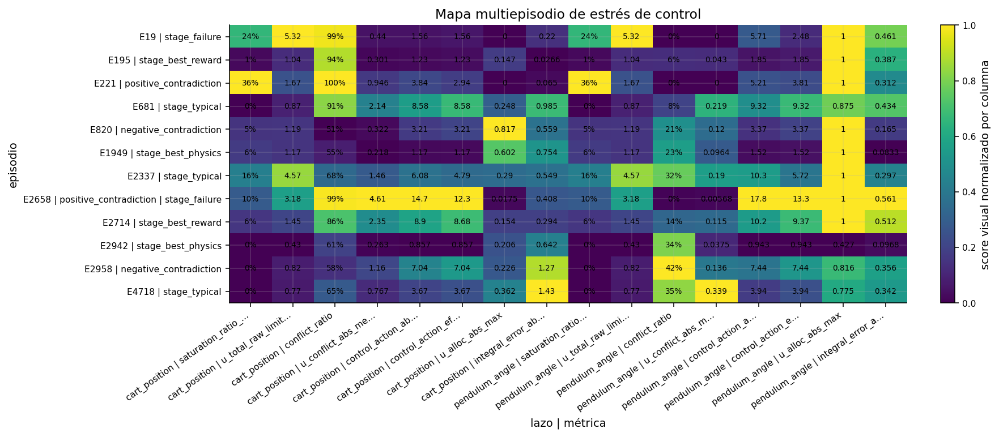

### Auditoría multiepisodio de control

,episode_id,n_step,end_termination_reason,total_reward,total_agent_decisions,global_actuator_limits,saturation_ratio_global,u_total_raw_abs_mean,u_total_raw_abs_max,u_total_raw_limit_usage_max,u_total_abs_mean,u_total_abs_max,var_obj,error_abs_mean,error_abs_max,error_final,derivative_error_abs_mean,derivative_error_abs_max,derivative_error_final,integral_error_abs_mean,integral_error_abs_max,integral_error_final,control_action_abs_mean,control_action_abs_max,control_action_final,control_action_eff_abs_mean,control_action_eff_abs_max,control_action_eff_final,u_alloc_abs_mean,u_alloc_abs_max,u_alloc_final,u_conflict_abs_mean,u_conflict_abs_max,u_conflict_final,delta_control_action_abs_mean,delta_control_action_abs_max,delta_control_action_final,delta_control_action_eff_abs_mean,delta_control_action_eff_abs_max,delta_control_action_eff_final,delta_u_alloc_abs_mean,delta_u_alloc_abs_max,delta_u_alloc_final,is_saturated_local_ratio,kp_abs_mean,kp_abs_max,kp_final,ki_abs_mean,ki_abs_max,ki_final,kd_abs_mean,kd_abs_max,kd_final,conflict_ratio,action_eff_to_raw_ratio_median,u_alloc_to_action_ratio_median,kp_first,kp_last,kp_delta,kp_delta_abs,ki_first,ki_last,ki_delta,ki_delta_abs,kd_first,kd_last,kd_delta,kd_delta_abs
0,19,1974,limit_exceeded,-89.87046638126749,99,"[-1.0, 1.0]",0.239615,0.978178,5.317843,5.317843,0.567730,1.000000,cart_position,0.260817,0.999716,-0.999716,0.506442,1.464466,-1.464466,0.075552,0.219572,-0.219572,0.439531,1.557493,-0.616045,0.383699,1.557493,-0.135242,0.000000,0.000000,0.000000,0.439531,1.557493,0.616045,0.005481,0.607726,-0.000696,0.004746,0.498789,0.000180,0.000000,0.000000,0.000000,0.239615,0.247847,1.25,0.25,0.965552,2.25,0.00,0.946935,2.00,0.25,0.988855,1.0,0.000000,1.0,0.25,-0.75,0.75,1.0,0.00,-1.00,1.00,1.0,0.25,-0.75,0.75
1,19,1974,limit_exceeded,-89.87046638126749,99,"[-1.0, 1.0]",0.239615,0.978178,5.317843,5.317843,0.567730,1.000000,pendulum_angle,0.403265,0.969010,0.969010,0.414937,1.507262,1.507262,0.234291,0.460881,0.460881,1.417708,5.710164,5.171173,0.951429,2.478588,1.135242,0.567730,1.000000,1.000000,0.000000,0.000000,0.000000,0.008382,0.532515,0.011874,0.005818,0.498789,-0.000180,0.005254,0.479126,0.000000,0.239615,0.733916,2.00,1.75,0.503546,1.50,1.00,2.002026,3.00,2.00,0.000000,1.0,0.507776,1.0,1.75,0.75,0.75,1.0,1.00,0.00,0.00,1.0,2.00,1.00,1.00
2,195,1027,limit_exceeded,-33.01731641549218,52,"[-1.0, 1.0]",0.008763,0.214727,1.041479,1.041479,0.214523,1.000000,cart_position,0.026286,0.096134,-0.096134,0.093607,0.235640,-0.235640,0.005967,0.026566,-0.026566,0.348374,1.227668,-1.179463,0.348216,1.227668,-1.179463,0.004402,0.146804,0.000000,0.300973,1.227668,1.179463,0.001986,0.084629,-0.001729,0.001986,0.084629,-0.001729,0.000544,0.146804,0.000000,0.008763,2.028724,4.00,3.75,2.101266,3.00,2.00,1.938169,3.75,3.25,0.942551,1.0,0.000000,1.0,3.75,2.75,2.75,1.0,2.00,1.00,1.00,1.0,3.25,2.25,2.25
3,195,1027,limit_exceeded,-33.01731641549218,52,"[-1.0, 1.0]",0.008763,0.214727,1.041479,1.041479,0.214523,1.000000,pendulum_angle,0.381511,0.997733,0.997733,0.825521,2.611579,2.611579,0.129107,0.386560,0.386560,0.554297,1.852133,1.271987,0.553934,1.852133,1.271987,0.210121,1.000000,0.092524,0.042999,1.103363,0.000000,0.008988,0.604618,0.003301,0.008988,0.604618,0.003301,0.007369,0.565335,0.001572,0.008763,0.310613,1.00,0.50,1.439143,2.50,2.00,0.288218,1.00,0.00,0.055501,1.0,0.543793,1.0,0.50,-0.50,0.50,1.0,2.00,1.00,1.00,1.0,0.00,-1.00,1.00
4,221,1417,limit_exceeded,-57.63340908832907,71,"[-1.0, 1.0]",0.362738,0.696660,1.668991,1.668991,0.579458,1.000000,cart_position,0.119302,0.512335,-0.512335,0.361563,1.062238,-1.062238,0.013080,0.064987,-0.064987,0.945828,3.840842,-3.840842,0.824045,2.935345,-2.802751,0.000000,0.000000,0.000000,0.945828,3.840842,3.840842,0.005885,0.381773,-0.005749,0.007945,1.050817,0.000804,0.000000,0.000000,0.000000,0.362738,1.973888,2.75,2.25,0.997883,1.50,0.50,1.962597,2.75,2.50,0.998589,1.0,0.000000,1.0,2.25,1.25,1.25,1.0,0.50,-0.50,0.50,1.0,2.50,1.50,1.50
5,221,1417,limit_

### Matriz usada en el mapa

,episode_id,cart_position | saturation_ratio_global,cart_position | u_total_raw_limit_usage_max,cart_position | conflict_ratio,cart_position | u_conflict_abs_mean,cart_position | control_action_abs_max,cart_position | control_action_eff_abs_max,cart_position | u_alloc_abs_max,cart_position | integral_error_abs_max,pendulum_angle | saturation_ratio_global,pendulum_angle | u_total_raw_limit_usage_max,pendulum_angle | conflict_ratio,pendulum_angle | u_conflict_abs_mean,pendulum_angle | control_action_abs_max,pendulum_angle | control_action_eff_abs_max,pendulum_angle | u_alloc_abs_max,pendulum_angle | integral_error_abs_max
0,19,0.239615,5.317843,0.988855,0.439531,1.557493,1.557493,0.000000,0.219572,0.239615,5.317843,0.000000,0.000000,5.710164,2.478588,1.000000,0.460881
1,195,0.008763,1.041479,0.942551,0.300973,1.227668,1.227668,0.146804,0.026566,0.008763,1.041479,0.055501,0.042999,1.852133,1.852133,1.000000,0.386560
2,221,0.362738,1.668991,0.998589,0.945828,3.840842,2.935345,0.000000,0.064987,0.362738,1.668991,0.000000,0.000000,5.211225,3.811261,1.000000,0.312339
3,681,0.000000,0.874948,0.914759,2.144869,8.579479,8.579479,0.248361,0.984554,0.000000,0.874948,0.084537,0.218837,9.316011,9.316011,0.874948,0.433622
4,820,0.053989,1.186768,0.513097,0.322459,3.210062,3.210062,0.817401,0.559122,0.053989,1.186768,0.209358,0.119578,3.374634,3.374634,1.000000,0.165467
5,1949,0.062587,1.167102,0.553089,0.218202,1.169481,1.169481,0.601506,0.754133,0.062587,1.167102,0.234553,0.096437,1.516223,1.516223,1.000000,0.083291
6,2337,0.156813,4.572327,0.678209,1.455548,6.080354,4.793723,0.289508,0.548915,0.156813,4.572327,0.321227,0.190014,10.278828,5.723794,1.000000,0.297149
7,2658,0.104328,3.182047,0.994533,4.607665,14.696163,12.292617,0.017511,0.408243,0.104328,3.182047,0.004556,0.005683,17.842274,13.274797,1.000000,0.561177
8,2714,0.056987,1.454718,0.861249,2.349583,8.903412,8.682899,0.154174,0.293865,0.056987,1.454718,0.137760,0.115295,10.187991,9.365804,1.000000,0.512344
9,2942,0.000000,0.427401,0.609478,0.263454,0.857155,0.857155,0.206048,0.642091,0.000000,0.427401,0.337932,0.037462,0.943052,0.943052,0.427401,0.096827


In [129]:
# ---------------------------------------------------------------------
# 6.5 — Figura 3: mapa multiepisodio de estrés de control
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar episodios, lazos y métricas.
# ---------------------------------------------------------------------

CONTROL_MULTI_EPISODE_IDS = EPISODES_TO_LOAD_IDS[:12]

CONTROL_MULTI_VAR_OBJS = [
    "pendulum_angle",
    "cart_position",
]

CONTROL_MULTI_METRICS = [
    "saturation_ratio_global",
    "u_total_raw_limit_usage_max",
    "conflict_ratio",
    "u_conflict_abs_mean",
    "control_action_abs_max",
    "control_action_eff_abs_max",
    "u_alloc_abs_max",
    "integral_error_abs_max",

    # Activar si interesa:
    # "action_eff_to_raw_ratio_median",
    # "u_alloc_to_action_ratio_median",
    # "kp_delta_abs",
    # "ki_delta_abs",
    # "kd_delta_abs",
]

CONTROL_MULTI_NORMALIZE_PER_COLUMN = True


section6_multi_control_audit_df = s6_compute_control_audit_for_episodes(
    episode_ids=CONTROL_MULTI_EPISODE_IDS,
    episode_frames_by_id=episode_frames_by_id,
    config_main=selected_config_main,
    var_objs=CONTROL_MULTI_VAR_OBJS,
    conflict_threshold=CONTROL_CONFLICT_THRESHOLD,
)

section6_multi_control_matrix_df = s6_plot_multiepisode_control_heatmap(
    audit_df=section6_multi_control_audit_df,
    metrics=CONTROL_MULTI_METRICS,
    representative_episodes_df=representative_episodes_df,
    normalize_per_column=CONTROL_MULTI_NORMALIZE_PER_COLUMN,
    title="Mapa multiepisodio de estrés de control",
    save_as=None,
)

display(Markdown("### Auditoría multiepisodio de control"))
display(section6_multi_control_audit_df)

display(Markdown("### Matriz usada en el mapa"))
display(section6_multi_control_matrix_df)

### 6.6 Cierre de sección

In [130]:
# ---------------------------------------------------------------------
# 6.6 — Cierre de Sección 6
# ---------------------------------------------------------------------

SECTION6_OUTPUTS = {
    "section6_controller_catalog_df": "catálogo de controladores, setpoints, anti-windup y columnas disponibles",
    "section6_control_audit_df": "auditoría tabular de control para episodios indicados",
    "section6_control_findings_df": "alertas interpretativas de saturación, conflicto, asignación e integral",
    "section6_control_time_panels_df": "paneles activos de anatomía temporal del control",
    "section6_control_relationships_df": "relaciones causales graficadas",
    "section6_multi_control_audit_df": "auditoría multiepisodio de estrés de control",
    "section6_multi_control_matrix_df": "matriz usada en el mapa multiepisodio",
}

display(Markdown("### Salidas listas de la Sección 6"))
display(
    pd.DataFrame([
        {"object": key, "description": value}
        for key, value in SECTION6_OUTPUTS.items()
    ])
)

display(Markdown("### Lectura recomendada antes de pasar a reward"))
display(section6_control_findings_df)

### Salidas listas de la Sección 6

,object,description
0,section6_controller_catalog_df,"catálogo de controladores, setpoints, anti-windup y columnas disponibles"
1,section6_control_audit_df,auditoría tabular de control para episodios indicados
2,section6_control_findings_df,"alertas interpretativas de saturación, conflicto, asignación e integral"
3,section6_control_time_panels_df,paneles activos de anatomía temporal del control
4,section6_control_relationships_df,relaciones causales graficadas
5,section6_multi_control_audit_df,auditoría multiepisodio de estrés de control
6,section6_multi_control_matrix_df,matriz usada en el mapa multiepisodio


### Lectura recomendada antes de pasar a reward

,episode_id,var_obj,finding,saturation_ratio_global,u_total_raw_limit_usage_max,conflict_ratio,action_eff_to_raw_ratio_median,u_alloc_to_action_ratio_median,integral_error_abs_max,kp_delta,ki_delta,kd_delta
0,4718,cart_position,conflicto relevante entre lazos | poca asignación efectiva respecto a la acción pedida | integral acumulada alta | ganancias modificadas durante el episodio,0.0,0.774585,0.650560,1.0,0.000000,1.433532,0.25,0.0,0.0
1,4718,pendulum_angle,conflicto relevante entre lazos | poca asignación efectiva respecto a la acción pedida | ganancias modificadas durante el episodio,0.0,0.774585,0.349001,1.0,0.113466,0.342206,4.25,7.5,-0.5


## Sección 7 — Recompensa, métricas L\_* y señal de aprendizaje

**Pregunta analítica:**  
¿La recompensa está alineada con el comportamiento físico y de control observado, o está siendo dominada por shaping, extras, coordinación, gates o asignación per-agent?

**Objetivo específico:**  
A partir de los episodios ya cargados, esta sección permite:

1. auditar la composición de `global_interval_reward`;
2. observar qué métricas `L_*` dominan la recompensa principal;
3. revisar contribuciones, gates y sensibilidad del reward principal;
4. verificar si extras, bonus, penalties o coordinación están distorsionando la señal;
5. comparar reward global contra reward asignado a agentes;
6. cerrar hipótesis sobre recompensa antes de pasar a aprendizaje RL.

**Criterio de uso:**  
Cada celda de figura contiene su propia caja editable de variables.  
El usuario no modifica helpers para cambiar qué se grafica.

### 7.1 Helpers generales de recompensa

In [131]:
# ---------------------------------------------------------------------
# 7.1 — Helpers generales de recompensa
# ---------------------------------------------------------------------
# No editar para cambiar variables.
# Las variables se seleccionan directamente en cada celda de figura.
# ---------------------------------------------------------------------

import re
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, Markdown


# ---------------------------------------------------------------------
# Fallbacks mínimos
# ---------------------------------------------------------------------

if "shorten_label" not in globals():
    def shorten_label(value, max_len=40):
        text = str(value)
        return text if len(text) <= max_len else text[:max_len - 1] + "…"


if "format_axis" not in globals():
    def format_axis(ax, title=None, xlabel=None, ylabel=None, grid=True, zero_line=False):
        if title is not None:
            ax.set_title(title)
        if xlabel is not None:
            ax.set_xlabel(xlabel)
        if ylabel is not None:
            ax.set_ylabel(ylabel)
        ax.grid(grid, alpha=0.25)
        if zero_line:
            ax.axhline(0.0, linewidth=0.8, alpha=0.6)
        return ax


if "save_current_figure" not in globals():
    def save_current_figure(filename=None, output_dir=None):
        if filename is None:
            return
        output_dir = Path(output_dir or ".")
        output_dir.mkdir(parents=True, exist_ok=True)
        path = output_dir / filename
        plt.savefig(path, bbox_inches="tight")
        print(f"Figura guardada en: {path}")


# ---------------------------------------------------------------------
# Utilidades base
# ---------------------------------------------------------------------

def s7_safe_numeric(values):
    return pd.to_numeric(pd.Series(values), errors="coerce").astype(float)


def s7_get_interval_df(episode_id, episode_frames_by_id):
    return episode_frames_by_id[int(episode_id)]["interval_df"]


def s7_get_step_df(episode_id, episode_frames_by_id):
    return episode_frames_by_id[int(episode_id)]["step_df"]


def s7_get_end_data(episode_id, episode_frames_by_id):
    return episode_frames_by_id[int(episode_id)].get("end_data", {})


def s7_get_time_axis(frame):
    preferred_cols = ["interval_t_start_sec", "interval_id", "decision_id"]

    for col in preferred_cols:
        if col in frame.columns:
            values = s7_safe_numeric(frame[col])

            if values.notna().sum() > 1:
                return values.to_numpy(dtype=float), col

    return np.arange(len(frame), dtype=float), "index"


def s7_normalized_time(x):
    x = np.asarray(x, dtype=float)

    if len(x) == 0:
        return x

    valid = np.isfinite(x)

    if valid.sum() < 2:
        return np.linspace(0.0, 1.0, len(x))

    x_min = np.nanmin(x[valid])
    x_max = np.nanmax(x[valid])

    if x_max == x_min:
        return np.linspace(0.0, 1.0, len(x))

    return (x - x_min) / (x_max - x_min)


def s7_unique_preserve_order(values):
    out = []
    seen = set()

    for value in values:
        if value in seen:
            continue
        seen.add(value)
        out.append(value)

    return out


def s7_minmax(values):
    values = s7_safe_numeric(values)
    span = values.max() - values.min()

    if not np.isfinite(span) or span == 0:
        return pd.Series(0.5, index=values.index)

    return (values - values.min()) / span


def s7_transform_series(values, transform="raw"):
    series = s7_safe_numeric(values)

    if transform is None or transform == "raw":
        return series

    if transform == "abs":
        return series.abs()

    if transform == "minmax":
        return s7_minmax(series)

    if transform == "zscore":
        std = series.std()

        if not np.isfinite(std) or std == 0:
            return pd.Series(0.0, index=series.index)

        return (series - series.mean()) / std

    raise ValueError(f"transform no soportado: {transform}")


def s7_resolve_columns(frame, columns=None, columns_regex=None, max_columns=None, exclude_regex=None):
    resolved = []

    columns = columns or []
    columns_regex = columns_regex or []

    if isinstance(columns, str):
        columns = [columns]

    if isinstance(columns_regex, str):
        columns_regex = [columns_regex]

    for col in columns:
        if col in frame.columns:
            resolved.append(col)

    for pattern in columns_regex:
        matched = [
            col for col in frame.columns
            if re.search(pattern, str(col), flags=re.IGNORECASE)
        ]
        resolved.extend(matched)

    if exclude_regex is not None:
        resolved = [
            col for col in resolved
            if not re.search(exclude_regex, str(col), flags=re.IGNORECASE)
        ]

    resolved = s7_unique_preserve_order(resolved)

    if max_columns is not None:
        resolved = resolved[:int(max_columns)]

    return resolved


# ---------------------------------------------------------------------
# Clasificación de columnas reward interval-level
# ---------------------------------------------------------------------

def s7_classify_interval_reward_column(column):
    c = str(column)

    if c in ["interval_id", "interval_t_start_sec", "interval_n_steps", "terminated", "termination_reason"]:
        return "interval_metadata"

    if c.startswith("L_"):
        return "metric_L"

    if c.endswith("_mean_squared") or c.endswith("_rms") or c.endswith("_abs") or c.endswith("_mean"):
        return "metric_aggregate"

    if c == "global_interval_reward":
        return "reward_global"

    if c == "principal_reward" or c.startswith("principal_feature") or c.startswith("principal_contribution") or c.startswith("principal_gate"):
        return "reward_principal"

    if c.startswith("extra_total_"):
        return "reward_extra_total"

    if c.startswith("extra_bonus_") or c.startswith("extra_penalty_") or c.startswith("extra_conditional_"):
        return "reward_extra_detail"

    if c.startswith("coordination_") or c.startswith("extra_conditional_coordination"):
        return "reward_coordination"

    if c.startswith("reward_"):
        return "reward_assigned_agent"

    if c.startswith("action_"):
        return "agent_action"

    if c.startswith("td_error_") or c.startswith("q_value_") or c.startswith("q_mean_") or c.startswith("q_std_") or c.startswith("q_max_") or c.startswith("q_min_") or c.startswith("visits_"):
        return "learning"

    return "other"


def s7_build_reward_column_catalog(interval_df):
    rows = []

    for col in interval_df.columns:
        rows.append({
            "column": col,
            "reward_family": s7_classify_interval_reward_column(col),
            "dtype": str(interval_df[col].dtype),
            "non_null": int(interval_df[col].notna().sum()),
            "n_unique": int(interval_df[col].nunique(dropna=False)),
        })

    return (
        pd.DataFrame(rows)
        .sort_values(["reward_family", "column"])
        .reset_index(drop=True)
    )


def s7_show_reward_columns(interval_df, family=None, contains=None, max_rows=250):
    catalog_df = s7_build_reward_column_catalog(interval_df)
    frame = catalog_df.copy()

    if family is not None:
        frame = frame.loc[frame["reward_family"].isin(np.atleast_1d(family))]

    if contains is not None:
        frame = frame.loc[
            frame["column"].astype(str).str.contains(
                str(contains),
                case=False,
                regex=True,
            )
        ]

    display(
        frame[
            ["reward_family", "column", "dtype", "non_null", "n_unique"]
        ]
        .head(max_rows)
        .reset_index(drop=True)
    )

    return frame


# ---------------------------------------------------------------------
# Config reward desde metadata
# ---------------------------------------------------------------------

def s7_get_reward_calculation_config(config_main):
    return (
        config_main
        .get("reward_base", {})
        .get("reward_calculation", {})
    )


def s7_get_reward_assignment_config(config_main):
    return (
        config_main
        .get("reward_base", {})
        .get("reward_config", {})
    )


def s7_get_principal_reward_config(config_main):
    return (
        s7_get_reward_calculation_config(config_main)
        .get("principal_reward", {})
    )


def s7_get_principal_method(config_main):
    return s7_get_principal_reward_config(config_main).get("method", None)


def s7_get_principal_feature_config(config_main):
    """
    Devuelve features de principal_reward según método.
    """
    cfg = s7_get_principal_reward_config(config_main)
    method = cfg.get("method", None)

    if method == "lineal_combination":
        return (
            cfg
            .get("lineal_combination_params", {})
            .get("features", {})
        )

    if method == "weighted_exponential":
        return (
            cfg
            .get("weighted_exponential_params", {})
            .get("features", {})
        )

    return {}


def s7_get_feature_params(config_main, feature_name):
    """
    Parámetros de una feature principal.
    Retorna weight, scaled, setpoint.
    """
    features = s7_get_principal_feature_config(config_main)
    feature_cfg = features.get(feature_name, {})

    if isinstance(feature_cfg, dict):
        return {
            "weight": feature_cfg.get("weight", 0.0),
            "scaled": feature_cfg.get("scaled", 1.0),
            "setpoint": feature_cfg.get("setpoint", 0.0),
        }

    return {
        "weight": feature_cfg,
        "scaled": 1.0,
        "setpoint": 0.0,
    }


def s7_theoretical_principal_contribution(x, method, weight, scaled=1.0, setpoint=0.0):
    """
    Perfil teórico sin gate.
    La contribución real puede estar multiplicada por principal_gate_*.
    """
    x = np.asarray(x, dtype=float)

    if method == "lineal_combination":
        return -weight * x

    if method == "weighted_exponential":
        return -weight * (1.0 - np.exp(-scaled * (x - setpoint) ** 2))

    return np.zeros_like(x, dtype=float)


# ---------------------------------------------------------------------
# Derivados y auditoría de recompensa
# ---------------------------------------------------------------------

def s7_add_reward_derived_columns(interval_df):
    frame = interval_df.copy()

    extra_total_cols = [
        col for col in frame.columns
        if str(col).startswith("extra_total_")
    ]

    if extra_total_cols and "component_extra_total" not in frame.columns:
        frame["component_extra_total"] = (
            frame[extra_total_cols]
            .apply(pd.to_numeric, errors="coerce")
            .fillna(0.0)
            .sum(axis=1)
        )

    assigned_cols = [
        col for col in frame.columns
        if str(col).startswith("reward_")
    ]

    if assigned_cols and "component_assigned_agent_reward_total" not in frame.columns:
        frame["component_assigned_agent_reward_total"] = (
            frame[assigned_cols]
            .apply(pd.to_numeric, errors="coerce")
            .fillna(0.0)
            .sum(axis=1)
        )

    principal_cols = ["principal_reward"]
    if "principal_reward" in frame.columns:
        frame["component_principal_total"] = s7_safe_numeric(frame["principal_reward"])

    if "coordination_reward_total" in frame.columns:
        frame["component_coordination_total"] = s7_safe_numeric(frame["coordination_reward_total"])

    if "global_interval_reward" in frame.columns:
        parts = []
        for col in ["principal_reward", "component_extra_total", "coordination_reward_total"]:
            if col in frame.columns:
                parts.append(s7_safe_numeric(frame[col]))

        if parts:
            reconstructed = sum(parts)
            frame["global_reward_reconstructed"] = reconstructed
            frame["global_reward_reconstruction_error"] = (
                s7_safe_numeric(frame["global_interval_reward"]) - reconstructed
            )

    return frame


def s7_sum_if_exists(frame, col):
    if col not in frame.columns:
        return np.nan
    return float(s7_safe_numeric(frame[col]).fillna(0.0).sum())


def s7_abs_sum_if_exists(frame, col):
    if col not in frame.columns:
        return np.nan
    return float(s7_safe_numeric(frame[col]).abs().fillna(0.0).sum())


def s7_negative_ratio_if_exists(frame, col):
    if col not in frame.columns:
        return np.nan
    values = s7_safe_numeric(frame[col])
    if values.empty:
        return np.nan
    return float((values < 0).mean())


def s7_nonzero_ratio_if_exists(frame, col, threshold=1e-12):
    if col not in frame.columns:
        return np.nan
    values = s7_safe_numeric(frame[col])
    if values.empty:
        return np.nan
    return float((values.abs() > threshold).mean())


def s7_compute_reward_audit_for_episode(
    episode_id,
    episode_frames_by_id,
    component_cols=None,
    assigned_reward_regex=r"^reward_",
):
    episode_id = int(episode_id)
    bundle = episode_frames_by_id[episode_id]
    interval_df = s7_add_reward_derived_columns(bundle["interval_df"])
    end_data = bundle.get("end_data", {})

    component_cols = component_cols or [
        "principal_reward",
        "component_extra_total",
        "coordination_reward_total",
        "global_interval_reward",
    ]

    row = {
        "episode_id": episode_id,
        "n_interval": int(interval_df.shape[0]),
        "end_termination_reason": end_data.get("end_termination_reason", np.nan),
        "total_reward_end": end_data.get("total_reward", np.nan),
        "total_agent_decisions_end": end_data.get("total_agent_decisions", np.nan),
    }

    if "global_interval_reward" in interval_df.columns:
        row["global_interval_reward_sum"] = s7_sum_if_exists(interval_df, "global_interval_reward")
        row["global_interval_reward_abs_sum"] = s7_abs_sum_if_exists(interval_df, "global_interval_reward")
        row["global_negative_ratio"] = s7_negative_ratio_if_exists(interval_df, "global_interval_reward")

        if pd.notna(row["total_reward_end"]):
            row["reward_gap_end_vs_intervals"] = (
                float(row["total_reward_end"]) - float(row["global_interval_reward_sum"])
            )

    for col in component_cols:
        if col in interval_df.columns:
            row[f"{col}_sum"] = s7_sum_if_exists(interval_df, col)
            row[f"{col}_abs_sum"] = s7_abs_sum_if_exists(interval_df, col)
            row[f"{col}_negative_ratio"] = s7_negative_ratio_if_exists(interval_df, col)
            row[f"{col}_active_ratio"] = s7_nonzero_ratio_if_exists(interval_df, col)

    if "global_reward_reconstruction_error" in interval_df.columns:
        row["global_reward_reconstruction_mae"] = float(
            s7_safe_numeric(interval_df["global_reward_reconstruction_error"]).abs().mean()
        )
        row["global_reward_reconstruction_max_abs"] = float(
            s7_safe_numeric(interval_df["global_reward_reconstruction_error"]).abs().max()
        )

    assigned_cols = [
        col for col in interval_df.columns
        if re.search(assigned_reward_regex, str(col))
    ]

    for col in assigned_cols:
        row[f"{col}_sum"] = s7_sum_if_exists(interval_df, col)
        row[f"{col}_abs_sum"] = s7_abs_sum_if_exists(interval_df, col)
        row[f"{col}_negative_ratio"] = s7_negative_ratio_if_exists(interval_df, col)

    # Shares absolutos para detectar dominancia.
    abs_components = {}
    for col in ["principal_reward", "component_extra_total", "coordination_reward_total"]:
        if col in interval_df.columns:
            abs_components[col] = s7_abs_sum_if_exists(interval_df, col)

    total_abs_components = sum(v for v in abs_components.values() if pd.notna(v))

    if total_abs_components > 0:
        for col, value in abs_components.items():
            row[f"{col}_abs_share"] = value / total_abs_components

    return row


def s7_compute_reward_audit_for_episodes(
    episode_ids,
    episode_frames_by_id,
    component_cols=None,
):
    rows = []

    for episode_id in episode_ids:
        if int(episode_id) not in episode_frames_by_id:
            continue

        rows.append(
            s7_compute_reward_audit_for_episode(
                episode_id=episode_id,
                episode_frames_by_id=episode_frames_by_id,
                component_cols=component_cols,
            )
        )

    return (
        pd.DataFrame(rows)
        .sort_values("episode_id")
        .reset_index(drop=True)
        if rows
        else pd.DataFrame()
    )


def s7_build_reward_findings(audit_df, thresholds):
    rows = []

    for _, row in audit_df.iterrows():
        findings = []

        gap = row.get("reward_gap_end_vs_intervals", np.nan)
        rec_mae = row.get("global_reward_reconstruction_mae", np.nan)
        extra_share = row.get("component_extra_total_abs_share", np.nan)
        coord_share = row.get("coordination_reward_total_abs_share", np.nan)
        global_neg = row.get("global_negative_ratio", np.nan)

        if pd.notna(gap) and abs(gap) > thresholds["reward_gap_abs"]:
            findings.append("total_reward_end no coincide con suma de intervalos")

        if pd.notna(rec_mae) and rec_mae > thresholds["reconstruction_mae"]:
            findings.append("global_interval_reward no reconstruye bien desde componentes visibles")

        if pd.notna(extra_share) and extra_share >= thresholds["high_extra_abs_share"]:
            findings.append("extras dominan la magnitud de la señal")

        if pd.notna(coord_share) and coord_share >= thresholds["high_coordination_abs_share"]:
            findings.append("coordinación domina la magnitud de la señal")

        if pd.notna(global_neg) and global_neg >= thresholds["high_global_negative_ratio"]:
            findings.append("reward global mayormente negativo")

        if not findings:
            findings.append("sin alerta fuerte en esta lectura")

        rows.append({
            "episode_id": row["episode_id"],
            "finding": " | ".join(findings),
            "reward_gap_end_vs_intervals": gap,
            "global_reward_reconstruction_mae": rec_mae,
            "component_extra_total_abs_share": extra_share,
            "coordination_reward_total_abs_share": coord_share,
            "global_negative_ratio": global_neg,
        })

    return pd.DataFrame(rows)


# ---------------------------------------------------------------------
# Figura 1: paneles temporales de recompensa
# ---------------------------------------------------------------------

def s7_should_step_plot(column_name, spec):
    if spec.get("plot_kind", None) == "step":
        return True

    c = str(column_name).lower()

    if c.startswith("action_"):
        return True

    if c in ["terminated"]:
        return True

    return False


def s7_plot_series(ax, x, y, label, column_name, spec, linewidth=1.2, alpha=0.88):
    if s7_should_step_plot(column_name, spec):
        ax.step(
            x,
            y,
            where="post",
            linewidth=linewidth,
            alpha=alpha,
            label=label,
        )
    else:
        marker = "o" if len(y) <= 350 else None
        markersize = 3 if marker else None

        ax.plot(
            x,
            y,
            linewidth=linewidth,
            alpha=alpha,
            marker=marker,
            markersize=markersize,
            label=label,
        )

    return ax


def s7_add_interval_termination_marker(ax, interval_df, x):
    if "terminated" not in interval_df.columns:
        return ax

    terminated = (
        pd.to_numeric(interval_df["terminated"], errors="coerce")
        .fillna(0.0)
    )

    if terminated.max() <= 0:
        return ax

    term_idx = int(terminated.idxmax())

    if term_idx >= len(x):
        return ax

    ax.axvline(
        x[term_idx],
        linestyle=":",
        linewidth=1.0,
        alpha=0.75,
    )

    return ax


def s7_build_active_reward_panels(interval_df, panel_specs):
    active = []

    for spec in panel_specs:
        primary_cols = s7_resolve_columns(
            frame=interval_df,
            columns=spec.get("columns", []),
            columns_regex=spec.get("columns_regex", []),
            max_columns=spec.get("max_columns", None),
            exclude_regex=spec.get("exclude_regex", None),
        )

        secondary_cols = s7_resolve_columns(
            frame=interval_df,
            columns=spec.get("secondary_columns", []),
            columns_regex=spec.get("secondary_columns_regex", []),
            max_columns=spec.get("secondary_max_columns", None),
            exclude_regex=spec.get("secondary_exclude_regex", None),
        )

        if not primary_cols and not secondary_cols:
            continue

        panel_copy = dict(spec)
        panel_copy["_primary_columns"] = primary_cols
        panel_copy["_secondary_columns"] = secondary_cols
        panel_copy["_resolved_title"] = spec.get("title", spec.get("panel_id", "panel"))
        active.append(panel_copy)

    return active


def s7_summarize_reward_panels(active_panel_specs):
    return pd.DataFrame([
        {
            "panel_id": spec.get("panel_id"),
            "title": spec.get("_resolved_title", spec.get("title")),
            "primary_columns": spec.get("_primary_columns", []),
            "secondary_columns": spec.get("_secondary_columns", []),
            "transform": spec.get("transform", "raw"),
        }
        for spec in active_panel_specs
    ])


def s7_plot_reward_time_panels(
    episode_id,
    episode_frames_by_id,
    panel_specs,
    title="Anatomía temporal de recompensa",
    save_as=None,
):
    episode_id = int(episode_id)

    if episode_id not in episode_frames_by_id:
        raise KeyError(
            f"episode_id={episode_id} no está cargado. "
            f"Episodios disponibles: {sorted(map(int, episode_frames_by_id.keys()))}"
        )

    bundle = episode_frames_by_id[episode_id]
    interval_df = s7_add_reward_derived_columns(bundle["interval_df"])

    active_panels = s7_build_active_reward_panels(interval_df, panel_specs)

    if not active_panels:
        display(Markdown("No hay paneles activos con las columnas seleccionadas."))
        return pd.DataFrame()

    x, x_label = s7_get_time_axis(interval_df)

    n_panels = len(active_panels)

    fig, axes = plt.subplots(
        n_panels,
        1,
        figsize=(14.0, max(3.0 * n_panels, 5.5)),
        sharex=False,
    )

    if n_panels == 1:
        axes = [axes]

    for ax, spec in zip(axes, active_panels):
        transform = spec.get("transform", "raw")

        for col in spec["_primary_columns"]:
            y = s7_transform_series(interval_df[col], transform=transform)
            label = col if transform in [None, "raw"] else f"{col} [{transform}]"

            s7_plot_series(
                ax=ax,
                x=x,
                y=y,
                label=label,
                column_name=col,
                spec=spec,
                linewidth=1.22,
                alpha=0.90,
            )

        if spec.get("mark_termination", True):
            s7_add_interval_termination_marker(ax, interval_df, x)

        ax2 = None

        if spec["_secondary_columns"]:
            ax2 = ax.twinx()
            secondary_transform = spec.get("secondary_transform", "raw")

            for col in spec["_secondary_columns"]:
                y2 = s7_transform_series(interval_df[col], transform=secondary_transform)
                label2 = col if secondary_transform in [None, "raw"] else f"{col} [{secondary_transform}]"

                s7_plot_series(
                    ax=ax2,
                    x=x,
                    y=y2,
                    label=label2,
                    column_name=col,
                    spec={**spec, "plot_kind": spec.get("secondary_plot_kind", "step")},
                    linewidth=1.05,
                    alpha=0.42,
                )

            ax2.set_ylabel(spec.get("secondary_ylabel", "secondary"))
            ax2.grid(False)

        format_axis(
            ax,
            title=spec.get("_resolved_title", spec.get("title", spec.get("panel_id"))),
            xlabel=x_label,
            ylabel=spec.get("ylabel", "reward"),
            zero_line=spec.get("zero_line", True),
        )

        handles, labels = ax.get_legend_handles_labels()

        if ax2 is not None:
            handles2, labels2 = ax2.get_legend_handles_labels()
            handles = handles + handles2
            labels = labels + labels2

        if handles:
            ax.legend(
                handles,
                labels,
                loc="upper left",
                bbox_to_anchor=(1.01, 1.0),
                frameon=False,
                ncol=spec.get("legend_ncols", 1),
            )

    end_data = bundle.get("end_data", {})

    fig.suptitle(
        (
            f"{title}\n"
            f"run_id = {SELECTED_RUN_ID} | episode_id = {episode_id} | "
            f"termination = {end_data.get('end_termination_reason', 'unknown')} | "
            f"total_reward = {end_data.get('total_reward', np.nan)}"
        ),
        y=1.01,
        fontsize=13,
    )

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return s7_summarize_reward_panels(active_panels)


# ---------------------------------------------------------------------
# Figura 2: relaciones de recompensa
# ---------------------------------------------------------------------

def s7_plot_reward_relationships(
    episode_id,
    episode_frames_by_id,
    relationship_specs,
    title="Relaciones de recompensa",
    save_as=None,
):
    episode_id = int(episode_id)

    if episode_id not in episode_frames_by_id:
        raise KeyError(
            f"episode_id={episode_id} no está cargado. "
            f"Episodios disponibles: {sorted(map(int, episode_frames_by_id.keys()))}"
        )

    bundle = episode_frames_by_id[episode_id]
    interval_df = s7_add_reward_derived_columns(bundle["interval_df"])
    end_data = bundle.get("end_data", {})

    active_specs = []

    for spec in relationship_specs:
        x_col = spec["x_col"]
        y_col = spec["y_col"]
        required = [x_col, y_col]

        if spec.get("size_col", None) is not None:
            required.append(spec["size_col"])

        if all(col in interval_df.columns for col in required):
            active_specs.append(spec)

    if not active_specs:
        display(Markdown("No hay relaciones activas con las columnas seleccionadas."))
        return pd.DataFrame()

    x_time, time_label = s7_get_time_axis(interval_df)
    time_norm = s7_normalized_time(x_time)

    n_plots = len(active_specs)
    n_cols = min(2, n_plots)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(7.2 * n_cols, 5.4 * n_rows),
        squeeze=False,
    )

    active_rows = []

    for idx, spec in enumerate(active_specs):
        ax = axes[idx // n_cols][idx % n_cols]

        x_col = spec["x_col"]
        y_col = spec["y_col"]

        x = s7_safe_numeric(interval_df[x_col])
        y = s7_safe_numeric(interval_df[y_col])

        valid = x.notna() & y.notna()

        if spec.get("size_col", None) is not None:
            size = 25 + 180 * s7_minmax(interval_df[spec["size_col"]])
            size_values = size.loc[valid].to_numpy(dtype=float)
        else:
            size_values = 24

        x_valid = x.loc[valid].to_numpy(dtype=float)
        y_valid = y.loc[valid].to_numpy(dtype=float)
        time_valid = time_norm[valid.to_numpy()]

        if spec.get("draw_path", True):
            ax.plot(
                x_valid,
                y_valid,
                linewidth=0.75,
                alpha=0.22,
            )

        sc = ax.scatter(
            x_valid,
            y_valid,
            c=time_valid,
            s=size_values,
            alpha=0.72,
        )

        if len(x_valid) > 0:
            ax.scatter(
                x_valid[0],
                y_valid[0],
                marker="o",
                s=90,
                edgecolors="black",
                linewidth=0.8,
                label="inicio",
            )
            ax.scatter(
                x_valid[-1],
                y_valid[-1],
                marker="X",
                s=95,
                edgecolors="black",
                linewidth=0.8,
                label="fin",
            )

        if spec.get("x_ref", None) is not None:
            ax.axvline(float(spec["x_ref"]), linestyle="--", linewidth=0.85, alpha=0.55)

        if spec.get("y_ref", None) is not None:
            ax.axhline(float(spec["y_ref"]), linestyle="--", linewidth=0.85, alpha=0.55)

        format_axis(
            ax,
            title=spec.get("title", f"{y_col} vs {x_col}"),
            xlabel=spec.get("xlabel", x_col),
            ylabel=spec.get("ylabel", y_col),
            zero_line=spec.get("zero_line", True),
        )

        if spec.get("size_col", None) is not None:
            ax.text(
                0.99,
                0.02,
                f"tamaño: {spec.get('size_label', spec['size_col'])}",
                transform=ax.transAxes,
                ha="right",
                va="bottom",
                fontsize=7,
                alpha=0.75,
            )

        ax.legend(loc="best", frameon=False)
        fig.colorbar(sc, ax=ax, label=f"{time_label} normalizado")

        active_rows.append({
            "x_col": x_col,
            "y_col": y_col,
            "size_col": spec.get("size_col", None),
            "title": spec.get("title", f"{y_col} vs {x_col}"),
            "n_points": int(valid.sum()),
        })

    for empty_idx in range(n_plots, n_rows * n_cols):
        axes[empty_idx // n_cols][empty_idx % n_cols].axis("off")

    fig.suptitle(
        (
            f"{title}\n"
            f"run_id = {SELECTED_RUN_ID} | episode_id = {episode_id} | "
            f"termination = {end_data.get('end_termination_reason', 'unknown')}"
        ),
        y=1.02,
        fontsize=13,
    )

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return pd.DataFrame(active_rows)


# ---------------------------------------------------------------------
# Figura 3: perfiles teóricos del reward principal
# ---------------------------------------------------------------------

def s7_plot_principal_reward_profiles(
    episode_id,
    episode_frames_by_id,
    config_main,
    profile_specs,
    title="Perfil teórico vs observado de recompensa principal",
    save_as=None,
):
    episode_id = int(episode_id)

    if episode_id not in episode_frames_by_id:
        raise KeyError(
            f"episode_id={episode_id} no está cargado. "
            f"Episodios disponibles: {sorted(map(int, episode_frames_by_id.keys()))}"
        )

    bundle = episode_frames_by_id[episode_id]
    interval_df = s7_add_reward_derived_columns(bundle["interval_df"])
    end_data = bundle.get("end_data", {})

    method = s7_get_principal_method(config_main)

    active_specs = []

    for spec in profile_specs:
        feature = spec["feature"]
        var_obj = spec["var_obj"]

        x_col = spec.get("x_col", f"{feature}_{var_obj}")
        contribution_col = spec.get("contribution_col", f"principal_contribution_{feature}_{var_obj}")
        gate_col = spec.get("gate_col", f"principal_gate_{feature}_{var_obj}")

        if x_col in interval_df.columns:
            active = dict(spec)
            active["_x_col"] = x_col
            active["_contribution_col"] = contribution_col if contribution_col in interval_df.columns else None
            active["_gate_col"] = gate_col if gate_col in interval_df.columns else None
            active_specs.append(active)

    if not active_specs:
        display(Markdown("No hay perfiles activos con las columnas seleccionadas."))
        return pd.DataFrame()

    n_plots = len(active_specs)
    n_cols = min(2, n_plots)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(7.3 * n_cols, 5.4 * n_rows),
        squeeze=False,
    )

    active_rows = []

    x_time, time_label = s7_get_time_axis(interval_df)
    time_norm = s7_normalized_time(x_time)

    for idx, spec in enumerate(active_specs):
        ax = axes[idx // n_cols][idx % n_cols]

        feature = spec["feature"]
        var_obj = spec["var_obj"]
        x_col = spec["_x_col"]
        contribution_col = spec["_contribution_col"]
        gate_col = spec["_gate_col"]

        params = s7_get_feature_params(config_main, feature)

        x_values = s7_safe_numeric(interval_df[x_col])
        valid_x = x_values.notna()

        if valid_x.sum() == 0:
            continue

        x_min = float(x_values.loc[valid_x].min())
        x_max = float(x_values.loc[valid_x].max())

        if x_min == x_max:
            x_min = x_min - 1.0
            x_max = x_max + 1.0

        x_curve = np.linspace(x_min, x_max, 240)

        y_curve = s7_theoretical_principal_contribution(
            x=x_curve,
            method=method,
            weight=params["weight"],
            scaled=params["scaled"],
            setpoint=params["setpoint"],
        )

        ax.plot(
            x_curve,
            y_curve,
            linewidth=1.4,
            label="perfil teórico sin gate",
        )

        if contribution_col is not None:
            y_obs = s7_safe_numeric(interval_df[contribution_col])
        else:
            y_obs = pd.Series(
                s7_theoretical_principal_contribution(
                    x=x_values,
                    method=method,
                    weight=params["weight"],
                    scaled=params["scaled"],
                    setpoint=params["setpoint"],
                ),
                index=interval_df.index,
            )

        valid = x_values.notna() & y_obs.notna()

        if gate_col is not None:
            gate_values = s7_safe_numeric(interval_df[gate_col]).fillna(1.0)
            point_size = 28 + 160 * s7_minmax(gate_values)
            size_values = point_size.loc[valid].to_numpy(dtype=float)
        else:
            size_values = 38

        sc = ax.scatter(
            x_values.loc[valid],
            y_obs.loc[valid],
            c=time_norm[valid.to_numpy()],
            s=size_values,
            alpha=0.72,
            label="observado",
        )

        ax.axvline(params["setpoint"], linestyle="--", linewidth=0.85, alpha=0.55)
        ax.axhline(0.0, linewidth=0.8, alpha=0.55)

        title_text = spec.get(
            "title",
            f"{feature}_{var_obj} | weight={params['weight']} | scaled={params['scaled']}",
        )

        format_axis(
            ax,
            title=title_text,
            xlabel=x_col,
            ylabel=contribution_col or "contribución teórica",
            zero_line=True,
        )

        if gate_col is not None:
            ax.text(
                0.99,
                0.02,
                f"tamaño: {gate_col}",
                transform=ax.transAxes,
                ha="right",
                va="bottom",
                fontsize=7,
                alpha=0.75,
            )

        ax.legend(loc="best", frameon=False)
        fig.colorbar(sc, ax=ax, label=f"{time_label} normalizado")

        active_rows.append({
            "feature": feature,
            "var_obj": var_obj,
            "method": method,
            "x_col": x_col,
            "contribution_col": contribution_col,
            "gate_col": gate_col,
            "weight": params["weight"],
            "scaled": params["scaled"],
            "setpoint": params["setpoint"],
            "n_points": int(valid.sum()),
        })

    for empty_idx in range(n_plots, n_rows * n_cols):
        axes[empty_idx // n_cols][empty_idx % n_cols].axis("off")

    fig.suptitle(
        (
            f"{title}\n"
            f"run_id = {SELECTED_RUN_ID} | episode_id = {episode_id} | "
            f"principal_method = {method} | "
            f"termination = {end_data.get('end_termination_reason', 'unknown')}"
        ),
        y=1.02,
        fontsize=13,
    )

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return pd.DataFrame(active_rows)


# ---------------------------------------------------------------------
# Figura 4: heatmap multiepisodio reward
# ---------------------------------------------------------------------

def s7_episode_label_map(representative_episodes_df):
    if representative_episodes_df is None or representative_episodes_df.empty:
        return {}

    return {
        int(row.episode_id): f"E{int(row.episode_id)} | {row.criterion_id}"
        for row in representative_episodes_df.itertuples(index=False)
    }


def s7_format_metric_value(value, metric_name):
    if pd.isna(value):
        return ""

    if "ratio" in metric_name or "share" in metric_name:
        return f"{100 * value:.0f}%"

    if "mae" in metric_name or "gap" in metric_name:
        return f"{value:.2g}"

    return f"{value:.3g}"


def s7_build_reward_matrix(audit_df, metrics):
    rows = []

    for _, row in audit_df.iterrows():
        out = {"episode_id": int(row["episode_id"])}

        for metric in metrics:
            out[metric] = row.get(metric, np.nan)

        rows.append(out)

    return pd.DataFrame(rows)


def s7_normalize_matrix_by_column(matrix_df, value_cols):
    norm_df = matrix_df.copy()

    for col in value_cols:
        values = pd.to_numeric(norm_df[col], errors="coerce")
        span = values.max() - values.min()

        if not np.isfinite(span) or span == 0:
            norm_df[col] = 0.5
        else:
            norm_df[col] = (values - values.min()) / span

    return norm_df


def s7_plot_multiepisode_reward_heatmap(
    audit_df,
    metrics,
    representative_episodes_df=None,
    normalize_per_column=True,
    title="Mapa multiepisodio de recompensa",
    save_as=None,
):
    if audit_df.empty:
        display(Markdown("audit_df está vacío."))
        return pd.DataFrame()

    matrix_df = s7_build_reward_matrix(
        audit_df=audit_df,
        metrics=metrics,
    )

    value_cols = [col for col in matrix_df.columns if col != "episode_id"]

    if not value_cols:
        display(Markdown("No hay métricas disponibles para graficar."))
        return matrix_df

    if normalize_per_column:
        color_df = s7_normalize_matrix_by_column(matrix_df, value_cols)
    else:
        color_df = matrix_df.copy()

    color_matrix = (
        color_df[value_cols]
        .apply(pd.to_numeric, errors="coerce")
        .to_numpy(dtype=float)
    )

    raw_matrix = (
        matrix_df[value_cols]
        .apply(pd.to_numeric, errors="coerce")
        .to_numpy(dtype=float)
    )

    episode_labels = s7_episode_label_map(representative_episodes_df)

    y_labels = [
        shorten_label(
            episode_labels.get(int(ep), f"E{int(ep)}"),
            max_len=52,
        )
        for ep in matrix_df["episode_id"]
    ]

    fig, ax = plt.subplots(
        figsize=(max(12.5, 0.45 * len(value_cols)), max(4.5, 0.45 * len(matrix_df)))
    )

    image = ax.imshow(
        np.ma.masked_invalid(color_matrix),
        aspect="auto",
        interpolation="nearest",
    )

    ax.set_title(title)
    ax.set_xlabel("métrica de recompensa")
    ax.set_ylabel("episodio")

    ax.set_xticks(np.arange(len(value_cols)))
    ax.set_xticklabels(
        [shorten_label(col, max_len=36) for col in value_cols],
        rotation=35,
        ha="right",
    )

    ax.set_yticks(np.arange(len(y_labels)))
    ax.set_yticklabels(y_labels)

    for i in range(raw_matrix.shape[0]):
        for j in range(raw_matrix.shape[1]):
            metric_name = value_cols[j]
            value = raw_matrix[i, j]

            ax.text(
                j,
                i,
                s7_format_metric_value(value, metric_name),
                ha="center",
                va="center",
                fontsize=7,
            )

    colorbar_label = (
        "score visual normalizado por columna"
        if normalize_per_column
        else "valor métrico"
    )

    fig.colorbar(image, ax=ax, label=colorbar_label)

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return matrix_df

### 7.2 Catálogo de columnas reward y auditoría tabular

In [132]:
# ---------------------------------------------------------------------
# 7.2 — Catálogo y auditoría tabular de recompensa
# ---------------------------------------------------------------------
# Editar SOLO esta caja para decidir episodios y componentes a auditar.
# ---------------------------------------------------------------------

REWARD_AUDIT_EPISODE_IDS = [
    FOCUS_EPISODE_ID,
]

# Para comparar todos los episodios cargados:
# REWARD_AUDIT_EPISODE_IDS = EPISODES_TO_LOAD_IDS

REWARD_AUDIT_COMPONENT_COLS = [
    "principal_reward",
    "component_extra_total",
    "coordination_reward_total",
    "global_interval_reward",
]

REWARD_FINDING_THRESHOLDS = {
    "reward_gap_abs": 1e-6,
    "reconstruction_mae": 1e-6,
    "high_extra_abs_share": 0.35,
    "high_coordination_abs_share": 0.35,
    "high_global_negative_ratio": 0.80,
}


focus_interval_reward_catalog_df = s7_build_reward_column_catalog(
    s7_add_reward_derived_columns(focus_interval_df)
)

section7_reward_audit_df = s7_compute_reward_audit_for_episodes(
    episode_ids=REWARD_AUDIT_EPISODE_IDS,
    episode_frames_by_id=episode_frames_by_id,
    component_cols=REWARD_AUDIT_COMPONENT_COLS,
)

section7_reward_findings_df = s7_build_reward_findings(
    audit_df=section7_reward_audit_df,
    thresholds=REWARD_FINDING_THRESHOLDS,
)


display(Markdown("### Columnas interval-level disponibles para recompensa"))
display(focus_interval_reward_catalog_df)

display(Markdown("### Auditoría de recompensa"))
display(section7_reward_audit_df)

display(Markdown("### Lectura automática de alertas de recompensa"))
display(section7_reward_findings_df)

### Columnas interval-level disponibles para recompensa

,column,reward_family,dtype,non_null,n_unique
0,action_kd_cart_position,agent_action,int64,228,3
1,action_kd_pendulum_angle,agent_action,int64,228,2
2,action_ki_cart_position,agent_action,int64,228,3
3,action_ki_pendulum_angle,agent_action,int64,228,2
4,action_kp_cart_position,agent_action,int64,228,3
5,action_kp_pendulum_angle,agent_action,int64,228,3
6,interval_id,interval_metadata,int64,228,228
7,interval_n_steps,interval_metadata,int64,228,2
8,interval_t_start_sec,interval_metadata,object,228,228
9,q_value_kd_cart_position,learning,object,228,228


### Auditoría de recompensa

,episode_id,n_interval,end_termination_reason,total_reward_end,total_agent_decisions_end,global_interval_reward_sum,global_interval_reward_abs_sum,global_negative_ratio,reward_gap_end_vs_intervals,principal_reward_sum,principal_reward_abs_sum,principal_reward_negative_ratio,principal_reward_active_ratio,component_extra_total_sum,component_extra_total_abs_sum,component_extra_total_negative_ratio,component_extra_total_active_ratio,coordination_reward_total_sum,coordination_reward_total_abs_sum,coordination_reward_total_negative_ratio,coordination_reward_total_active_ratio,global_interval_reward_negative_ratio,global_interval_reward_active_ratio,global_reward_reconstruction_mae,global_reward_reconstruction_max_abs,reward_kp_pendulum_angle_sum,reward_kp_pendulum_angle_abs_sum,reward_kp_pendulum_angle_negative_ratio,reward_ki_pendulum_angle_sum,reward_ki_pendulum_angle_abs_sum,reward_ki_pendulum_angle_negative_ratio,reward_kd_pendulum_angle_sum,reward_kd_pendulum_angle_abs_sum,reward_kd_pendulum_angle_negative_ratio,reward_kp_cart_position_sum,reward_kp_cart_position_abs_sum,reward_kp_cart_position_negative_ratio,reward_ki_cart_position_sum,reward_ki_cart_position_abs_sum,reward_ki_cart_position_negative_ratio,reward_kd_cart_position_sum,reward_kd_cart_position_abs_sum,reward_kd_cart_position_negative_ratio,principal_reward_abs_share,component_extra_total_abs_share,coordination_reward_total_abs_share
0,4718,228,limit_exceeded,-146.12800665697935,228,-146.128007,146.128007,1.0,0.0,-151.36223,151.36223,1.0,1.0,0.0,0.0,0.0,0.0,5.234224,5.234224,0.0,0.20614,1.0,1.0,0.0,0.0,-41.576477,41.808445,0.991228,-41.576477,41.808445,0.991228,-41.576477,41.808445,0.991228,-104.55153,104.55153,1.0,-104.55153,104.55153,1.0,-104.55153,104.55153,1.0,0.966575,0.0,0.033425


### Lectura automática de alertas de recompensa

,episode_id,finding,reward_gap_end_vs_intervals,global_reward_reconstruction_mae,component_extra_total_abs_share,coordination_reward_total_abs_share,global_negative_ratio
0,4718,reward global mayormente negativo,0.0,0.0,0.0,0.033425,1.0


### 7.3 Figura 1: anatomía temporal de reward

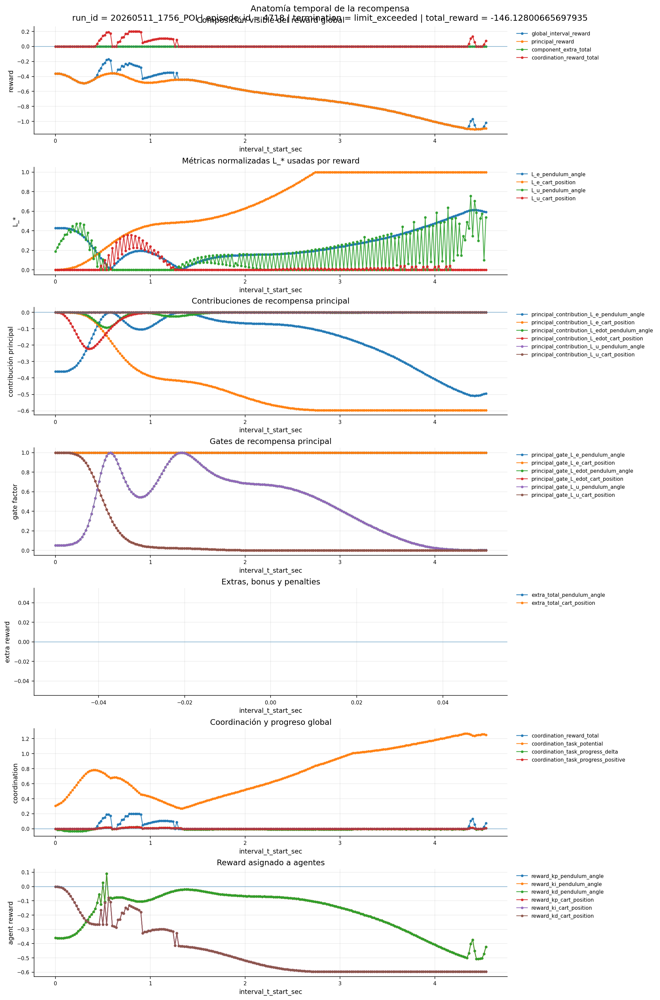

### Paneles efectivamente graficados

,panel_id,title,primary_columns,secondary_columns,transform
0,reward_global,Composición visible del reward global,"[global_interval_reward, principal_reward, component_extra_total, coordination_reward_total]",[],raw
1,metrics_L,Métricas normalizadas L_* usadas por reward,"[L_e_pendulum_angle, L_e_cart_position, L_u_pendulum_angle, L_u_cart_position]",[],raw
2,principal_contributions,Contribuciones de recompensa principal,"[principal_contribution_L_e_pendulum_angle, principal_contribution_L_e_cart_position, principal_contribution_L_edot_pendulum_angle, principal_contribution_L_edot_cart_position,...",[],raw
3,principal_gates,Gates de recompensa principal,"[principal_gate_L_e_pendulum_angle, principal_gate_L_e_cart_position, principal_gate_L_edot_pendulum_angle, principal_gate_L_edot_cart_position, principal_gate_L_u_pendulum_ang...",[],raw
4,extra_rewards,"Extras, bonus y penalties","[extra_total_pendulum_angle, extra_total_cart_position]",[],raw
5,coordination,Coordinación y progreso global,"[coordination_reward_total, coordination_task_potential, coordination_task_progress_delta, coordination_task_progress_positive]",[],raw
6,assigned_rewards,Reward asignado a agentes,"[reward_kp_pendulum_angle, reward_ki_pendulum_angle, reward_kd_pendulum_angle, reward_kp_cart_position, reward_ki_cart_position, reward_kd_cart_position]",[],raw


In [133]:
# ---------------------------------------------------------------------
# 7.3 — Figura 1: anatomía temporal de recompensa
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar qué se observa.
#
# columns:
#   columnas exactas.
#
# columns_regex:
#   patrones para abrir familias de columnas.
#
# transform:
#   "raw", "abs", "minmax", "zscore".
# ---------------------------------------------------------------------

REWARD_TIME_EPISODE_ID = FOCUS_EPISODE_ID

# Panel 1 — composición global
PLOT_REWARD_GLOBAL_COLS = [
    "global_interval_reward",
    "principal_reward",
    "component_extra_total",
    "coordination_reward_total",
]

# Panel 2 — métricas L_* principales
PLOT_REWARD_L_COLS = [
    "L_e_pendulum_angle",
    "L_e_cart_position",
    "L_u_pendulum_angle",
    "L_u_cart_position",
]

PLOT_REWARD_L_REGEX = [
    # Activar si quieres todo L_*:
    # r"^L_(e|edot|I|u|delta_u)_(pendulum_angle|cart_position)$",
]

PLOT_REWARD_L_MAX_COLUMNS = 12

# Panel 3 — contribuciones principales
PLOT_PRINCIPAL_CONTRIBUTION_COLS = [
    # Exactas opcionales:
    # "principal_contribution_L_e_pendulum_angle",
    # "principal_contribution_L_e_cart_position",
]

PLOT_PRINCIPAL_CONTRIBUTION_REGEX = [
    r"^principal_contribution_(L_e|L_edot|L_I|L_u|L_delta_u)_(pendulum_angle|cart_position)$",
]

PLOT_PRINCIPAL_CONTRIBUTION_MAX_COLUMNS = 12

# Panel 4 — gates principales
PLOT_PRINCIPAL_GATE_COLS = [
    # "principal_gate_L_e_pendulum_angle",
]

PLOT_PRINCIPAL_GATE_REGEX = [
    r"^principal_gate_",
]

PLOT_PRINCIPAL_GATE_MAX_COLUMNS = 12

# Panel 5 — extras
PLOT_EXTRA_COLS = [
    "extra_total_pendulum_angle",
    "extra_total_cart_position",
]

PLOT_EXTRA_REGEX = [
    # Activar si quieres más detalle:
    # r"^extra_bonus_",
    # r"^extra_penalty_",
    # r"^extra_conditional_",
]

PLOT_EXTRA_MAX_COLUMNS = 12

# Panel 6 — coordinación
PLOT_COORDINATION_COLS = [
    "coordination_reward_total",
    "coordination_task_potential",
    "coordination_task_progress_delta",
    "coordination_task_progress_positive",
]

PLOT_COORDINATION_REGEX = [
    # r"^coordination_credit_",
]

PLOT_COORDINATION_MAX_COLUMNS = 12

# Panel 7 — reward asignado a agentes
PLOT_ASSIGNED_REWARD_COLS = []

PLOT_ASSIGNED_REWARD_REGEX = [
    r"^reward_",
]

PLOT_ASSIGNED_REWARD_MAX_COLUMNS = 12


reward_time_panel_specs = [
    {
        "panel_id": "reward_global",
        "title": "Composición visible del reward global",
        "columns": PLOT_REWARD_GLOBAL_COLS,
        "columns_regex": [],
        "transform": "raw",
        "ylabel": "reward",
        "zero_line": True,
        "mark_termination": True,
    },
    {
        "panel_id": "metrics_L",
        "title": "Métricas normalizadas L_* usadas por reward",
        "columns": PLOT_REWARD_L_COLS,
        "columns_regex": PLOT_REWARD_L_REGEX,
        "max_columns": PLOT_REWARD_L_MAX_COLUMNS,
        "transform": "raw",
        "ylabel": "L_*",
        "zero_line": False,
        "mark_termination": True,
    },
    {
        "panel_id": "principal_contributions",
        "title": "Contribuciones de recompensa principal",
        "columns": PLOT_PRINCIPAL_CONTRIBUTION_COLS,
        "columns_regex": PLOT_PRINCIPAL_CONTRIBUTION_REGEX,
        "max_columns": PLOT_PRINCIPAL_CONTRIBUTION_MAX_COLUMNS,
        "transform": "raw",
        "ylabel": "contribución principal",
        "zero_line": True,
        "mark_termination": True,
    },
    {
        "panel_id": "principal_gates",
        "title": "Gates de recompensa principal",
        "columns": PLOT_PRINCIPAL_GATE_COLS,
        "columns_regex": PLOT_PRINCIPAL_GATE_REGEX,
        "max_columns": PLOT_PRINCIPAL_GATE_MAX_COLUMNS,
        "transform": "raw",
        "ylabel": "gate factor",
        "zero_line": False,
        "mark_termination": True,
    },
    {
        "panel_id": "extra_rewards",
        "title": "Extras, bonus y penalties",
        "columns": PLOT_EXTRA_COLS,
        "columns_regex": PLOT_EXTRA_REGEX,
        "max_columns": PLOT_EXTRA_MAX_COLUMNS,
        "transform": "raw",
        "ylabel": "extra reward",
        "zero_line": True,
        "mark_termination": True,
    },
    {
        "panel_id": "coordination",
        "title": "Coordinación y progreso global",
        "columns": PLOT_COORDINATION_COLS,
        "columns_regex": PLOT_COORDINATION_REGEX,
        "max_columns": PLOT_COORDINATION_MAX_COLUMNS,
        "transform": "raw",
        "ylabel": "coordination",
        "zero_line": True,
        "mark_termination": True,
    },
    {
        "panel_id": "assigned_rewards",
        "title": "Reward asignado a agentes",
        "columns": PLOT_ASSIGNED_REWARD_COLS,
        "columns_regex": PLOT_ASSIGNED_REWARD_REGEX,
        "max_columns": PLOT_ASSIGNED_REWARD_MAX_COLUMNS,
        "transform": "raw",
        "ylabel": "agent reward",
        "zero_line": True,
        "mark_termination": True,
    },
]


section7_reward_time_panels_df = s7_plot_reward_time_panels(
    episode_id=REWARD_TIME_EPISODE_ID,
    episode_frames_by_id=episode_frames_by_id,
    panel_specs=reward_time_panel_specs,
    title="Anatomía temporal de la recompensa",
    save_as=None,
)

display(Markdown("### Paneles efectivamente graficados"))
display(section7_reward_time_panels_df)

### 7.4 Figura 2: relaciones críticas de reward

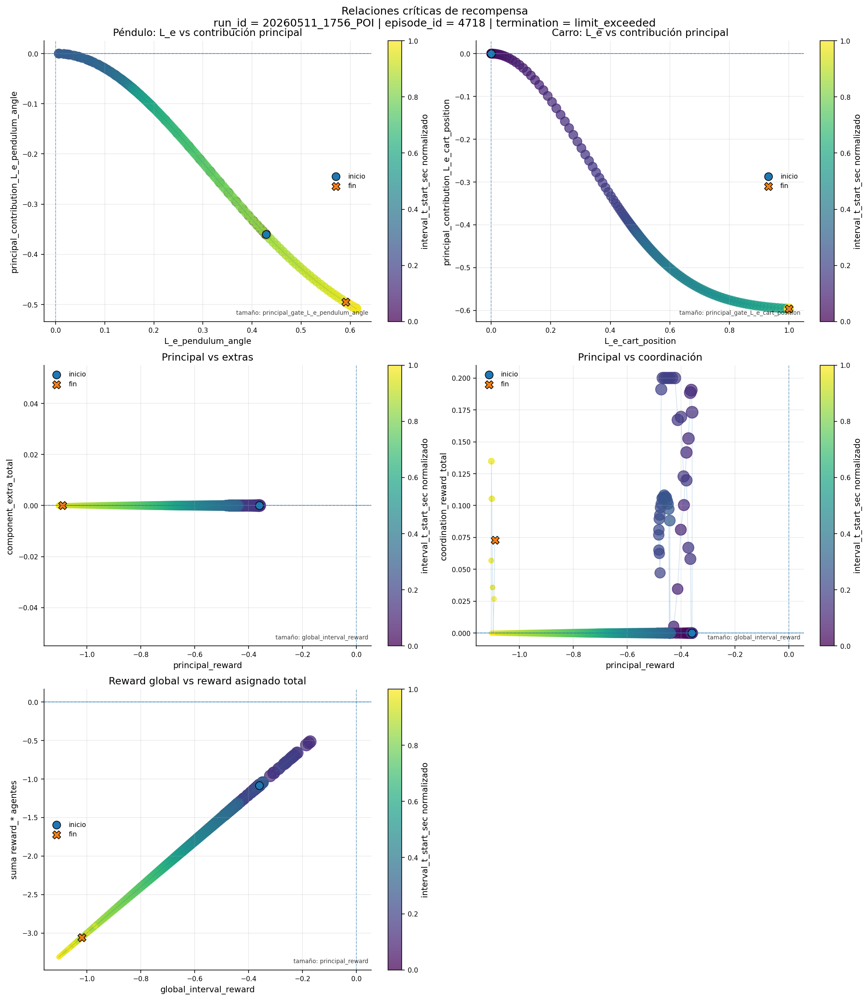

### Relaciones efectivamente graficadas

,x_col,y_col,size_col,title,n_points
0,L_e_pendulum_angle,principal_contribution_L_e_pendulum_angle,principal_gate_L_e_pendulum_angle,Péndulo: L_e vs contribución principal,228
1,L_e_cart_position,principal_contribution_L_e_cart_position,principal_gate_L_e_cart_position,Carro: L_e vs contribución principal,228
2,principal_reward,component_extra_total,global_interval_reward,Principal vs extras,228
3,principal_reward,coordination_reward_total,global_interval_reward,Principal vs coordinación,228
4,global_interval_reward,component_assigned_agent_reward_total,principal_reward,Reward global vs reward asignado total,228


In [134]:
# ---------------------------------------------------------------------
# 7.4 — Figura 2: relaciones críticas de recompensa
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar qué relaciones se observan.
#
# Cada dict genera un panel.
# ---------------------------------------------------------------------

REWARD_RELATION_EPISODE_ID = FOCUS_EPISODE_ID

REWARD_RELATION_SPECS = [
    {
        "x_col": "L_e_pendulum_angle",
        "y_col": "principal_contribution_L_e_pendulum_angle",
        "size_col": "principal_gate_L_e_pendulum_angle",
        "title": "Péndulo: L_e vs contribución principal",
        "xlabel": "L_e_pendulum_angle",
        "ylabel": "principal_contribution_L_e_pendulum_angle",
        "size_label": "principal_gate_L_e_pendulum_angle",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "x_col": "L_e_cart_position",
        "y_col": "principal_contribution_L_e_cart_position",
        "size_col": "principal_gate_L_e_cart_position",
        "title": "Carro: L_e vs contribución principal",
        "xlabel": "L_e_cart_position",
        "ylabel": "principal_contribution_L_e_cart_position",
        "size_label": "principal_gate_L_e_cart_position",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "x_col": "principal_reward",
        "y_col": "component_extra_total",
        "size_col": "global_interval_reward",
        "title": "Principal vs extras",
        "xlabel": "principal_reward",
        "ylabel": "component_extra_total",
        "size_label": "global_interval_reward",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "x_col": "principal_reward",
        "y_col": "coordination_reward_total",
        "size_col": "global_interval_reward",
        "title": "Principal vs coordinación",
        "xlabel": "principal_reward",
        "ylabel": "coordination_reward_total",
        "size_label": "global_interval_reward",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "x_col": "global_interval_reward",
        "y_col": "component_assigned_agent_reward_total",
        "size_col": "principal_reward",
        "title": "Reward global vs reward asignado total",
        "xlabel": "global_interval_reward",
        "ylabel": "suma reward_* agentes",
        "size_label": "principal_reward",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },

    # Activar o reemplazar según hipótesis:
    # {
    #     "x_col": "L_u_pendulum_angle",
    #     "y_col": "principal_contribution_L_u_pendulum_angle",
    #     "size_col": "global_interval_reward",
    #     "title": "Penalización de esfuerzo del péndulo",
    #     "xlabel": "L_u_pendulum_angle",
    #     "ylabel": "principal_contribution_L_u_pendulum_angle",
    #     "x_ref": 0.0,
    #     "y_ref": 0.0,
    #     "zero_line": True,
    # },
]


section7_reward_relationships_df = s7_plot_reward_relationships(
    episode_id=REWARD_RELATION_EPISODE_ID,
    episode_frames_by_id=episode_frames_by_id,
    relationship_specs=REWARD_RELATION_SPECS,
    title="Relaciones críticas de recompensa",
    save_as=None,
)

display(Markdown("### Relaciones efectivamente graficadas"))
display(section7_reward_relationships_df)

### 7.5 Figura 3: perfil teórico vs observado del reward principal

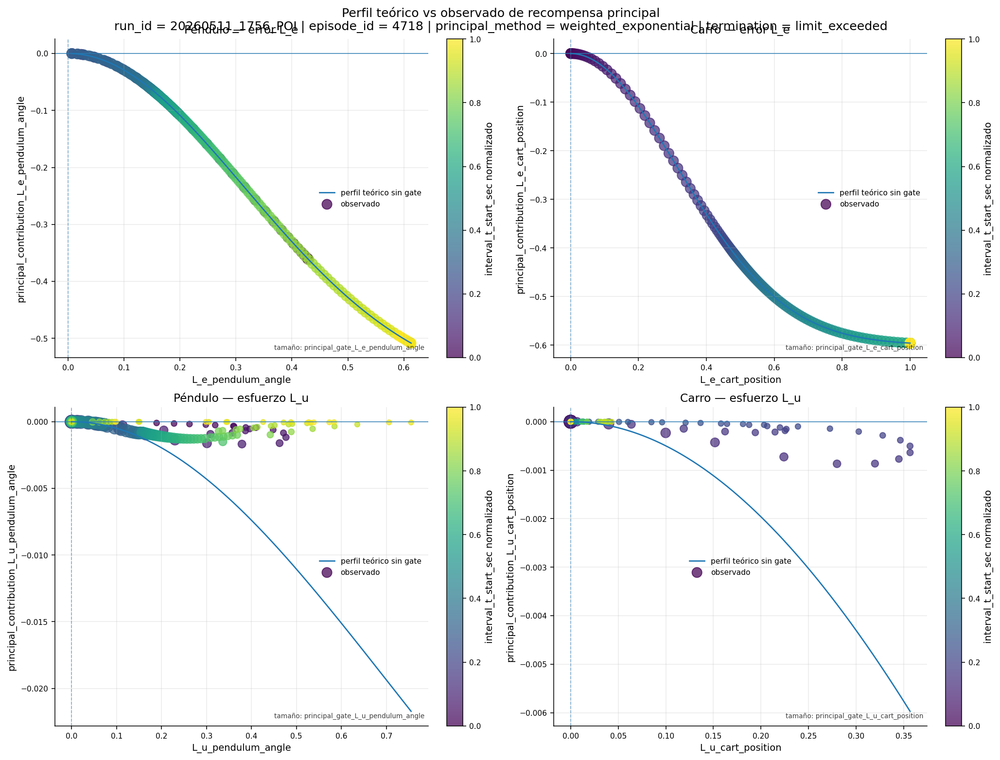

### Perfiles efectivamente graficados

,feature,var_obj,method,x_col,contribution_col,gate_col,weight,scaled,setpoint,n_points
0,L_e,pendulum_angle,weighted_exponential,L_e_pendulum_angle,principal_contribution_L_e_pendulum_angle,principal_gate_L_e_pendulum_angle,0.60,5.0,0.0,228
1,L_e,cart_position,weighted_exponential,L_e_cart_position,principal_contribution_L_e_cart_position,principal_gate_L_e_cart_position,0.60,5.0,0.0,228
2,L_u,pendulum_angle,weighted_exponential,L_u_pendulum_angle,principal_contribution_L_u_pendulum_angle,principal_gate_L_u_pendulum_angle,0.05,1.0,0.0,228
3,L_u,cart_position,weighted_exponential,L_u_cart_position,principal_contribution_L_u_cart_position,principal_gate_L_u_cart_position,0.05,1.0,0.0,228


In [135]:
# ---------------------------------------------------------------------
# 7.5 — Figura 3: perfil teórico vs observado del reward principal
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar qué perfiles se observan.
#
# feature:
#   L_e, L_edot, L_I, L_u, L_delta_u
#
# var_obj:
#   pendulum_angle, cart_position, etc.
#
# Por defecto:
#   x_col = {feature}_{var_obj}
#   contribution_col = principal_contribution_{feature}_{var_obj}
#   gate_col = principal_gate_{feature}_{var_obj}
# ---------------------------------------------------------------------

PRINCIPAL_PROFILE_EPISODE_ID = FOCUS_EPISODE_ID

PRINCIPAL_PROFILE_SPECS = [
    {
        "feature": "L_e",
        "var_obj": "pendulum_angle",
        "title": "Péndulo — error L_e",
    },
    {
        "feature": "L_e",
        "var_obj": "cart_position",
        "title": "Carro — error L_e",
    },
    {
        "feature": "L_u",
        "var_obj": "pendulum_angle",
        "title": "Péndulo — esfuerzo L_u",
    },
    {
        "feature": "L_u",
        "var_obj": "cart_position",
        "title": "Carro — esfuerzo L_u",
    },

    # Activar si interesa:
    # {
    #     "feature": "L_delta_u",
    #     "var_obj": "pendulum_angle",
    #     "title": "Péndulo — suavidad L_delta_u",
    # },
]


section7_principal_profiles_df = s7_plot_principal_reward_profiles(
    episode_id=PRINCIPAL_PROFILE_EPISODE_ID,
    episode_frames_by_id=episode_frames_by_id,
    config_main=selected_config_main,
    profile_specs=PRINCIPAL_PROFILE_SPECS,
    title="Perfil teórico vs observado de recompensa principal",
    save_as=None,
)

display(Markdown("### Perfiles efectivamente graficados"))
display(section7_principal_profiles_df)

### 7.6 Figura 4: mapa multiepisodio de recompensa

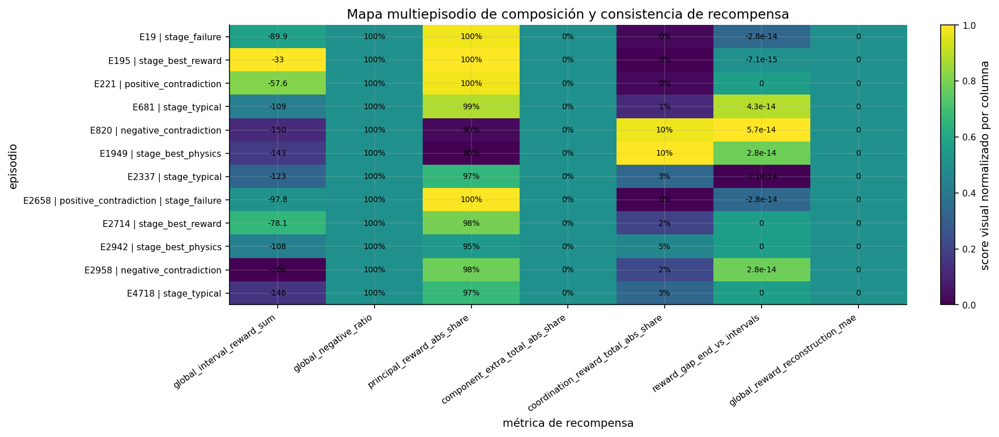

### Auditoría multiepisodio de recompensa

,episode_id,n_interval,end_termination_reason,total_reward_end,total_agent_decisions_end,global_interval_reward_sum,global_interval_reward_abs_sum,global_negative_ratio,reward_gap_end_vs_intervals,principal_reward_sum,principal_reward_abs_sum,principal_reward_negative_ratio,principal_reward_active_ratio,component_extra_total_sum,component_extra_total_abs_sum,component_extra_total_negative_ratio,component_extra_total_active_ratio,coordination_reward_total_sum,coordination_reward_total_abs_sum,coordination_reward_total_negative_ratio,coordination_reward_total_active_ratio,global_interval_reward_negative_ratio,global_interval_reward_active_ratio,global_reward_reconstruction_mae,global_reward_reconstruction_max_abs,reward_kp_pendulum_angle_sum,reward_kp_pendulum_angle_abs_sum,reward_kp_pendulum_angle_negative_ratio,reward_ki_pendulum_angle_sum,reward_ki_pendulum_angle_abs_sum,reward_ki_pendulum_angle_negative_ratio,reward_kd_pendulum_angle_sum,reward_kd_pendulum_angle_abs_sum,reward_kd_pendulum_angle_negative_ratio,reward_kp_cart_position_sum,reward_kp_cart_position_abs_sum,reward_kp_cart_position_negative_ratio,reward_ki_cart_position_sum,reward_ki_cart_position_abs_sum,reward_ki_cart_position_negative_ratio,reward_kd_cart_position_sum,reward_kd_cart_position_abs_sum,reward_kd_cart_position_negative_ratio,principal_reward_abs_share,component_extra_total_abs_share,coordination_reward_total_abs_share
0,19,99,limit_exceeded,-89.87046638126749,99,-89.870466,89.870466,1.0,-2.842171e-14,-90.063007,90.063007,1.0,1.0,0.0,0.0,0.0,0.0,0.192540,0.192540,0.0,0.070707,1.0,1.0,0.0,0.0,-53.044343,53.044343,1.000000,-53.044343,53.044343,1.000000,-53.044343,53.044343,1.000000,-36.826123,36.826123,1.0,-36.826123,36.826123,1.0,-36.826123,36.826123,1.0,0.997867,0.0,0.002133
1,195,52,limit_exceeded,-33.01731641549218,52,-33.017316,33.017316,1.0,-7.105427e-15,-33.017316,33.017316,1.0,1.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,1.0,1.0,0.0,0.0,-27.282471,27.282471,1.000000,-27.282471,27.282471,1.000000,-27.282471,27.282471,1.000000,-5.734846,5.734846,1.0,-5.734846,5.734846,1.0,-5.734846,5.734846,1.0,1.000000,0.0,0.000000
2,221,71,limit_exceeded,-57.63340908832907,71,-57.633409,57.633409,1.0,0.000000e+00,-57.763552,57.763552,1.0,1.0,0.0,0.0,0.0,0.0,0.130143,0.130143,0.0,0.056338,1.0,1.0,0.0,0.0,-38.666569,38.666569,1.000000,-38.666569,38.666569,1.000000,-38.666569,38.666569,1.000000,-18.966840,18.966840,1.0,-18.966840,18.966840,1.0,-18.966840,18.966840,1.0,0.997752,0.0,0.002248
3,681,142,limit_exceeded,-108.93205325973864,142,-108.932053,108.932053,1.0,4.263256e-14,-110.281146,110.281146,1.0,1.0,0.0,0.0,0.0,0.0,1.349093,1.349093,0.0,0.161972,1.0,1.0,0.0,0.0,-45.274903,45.274903,1.000000,-45.274903,45.274903,1.000000,-45.274903,45.274903,1.000000,-63.657150,63.657150,1.0,-63.657150,63.657150,1.0,-63.657150,63.657150,1.0,0.987915,0.0,0.012085
4,820,250,time_limit,-149.6954651832601,250,-149.695465,149.695465,1.0,5.684342e-14,-168.021943,168.021943,1.0,1.0,0.0,0.0,0.0,0.0,18.326477,18.326477,0.0,0.428000,1.0,1.0,0.0,0.0,-67.091514,67.091514,1.000000,-67.091514,67.091514,1.000000,-67.091514,67.091514,1.000000,-82.603951,82.603951,1.0,-82.603951,82.603951,1.0,-82.603951,82.603951,1.0,0.901655,0.0,0.098345
5,1949,250,time_limit,-142.9926659778502,250,-142.992666,142.992666,1.0,2.842171e-14,-161.039301,161.039301,1.0,1.0,0.0,0.0,0.0,0.0,18.046635,18.046635,0.0,0.456000,1.0,1.0,0.0,0.0,-42.403271,42.899542,0.976000,-42.403271,42.899542,0.976000,-42.403271,42.899542,0.976000,-100.589395,100.589395,1.0,-100.589395,100.589395,1.0,-100.589395,100.589395,1.0,0.899229,0.0,0.100771
6,2337,178,limit_exceeded,-123.41244735402655,178,-123.412447,123.412447,1.0,-7.105427e-14,-127.907994,127.907994,1.0,1.0,0.0,0.0,0.0,0.0,4.495547,4.495547,0.0,0.280899,1.0,1.0,0.0,0.0,-44.136363,44.457168,0.988764,-44.136363,44.457168,0.988764,-44.136363,44.457168,0.988764,-79.276084,79.276084,1.0,-79.276084,79.276084,1.0,-79.276084,79.276084,1.0,0.966047,0.0,0.033953
7,2658,110,lim

### Matriz usada en el mapa

,episode_id,global_interval_reward_sum,global_negative_ratio,principal_reward_abs_share,component_extra_total_abs_share,coordination_reward_total_abs_share,reward_gap_end_vs_intervals,global_reward_reconstruction_mae
0,19,-89.870466,1.0,0.997867,0.0,0.002133,-2.842171e-14,0.0
1,195,-33.017316,1.0,1.000000,0.0,0.000000,-7.105427e-15,0.0
2,221,-57.633409,1.0,0.997752,0.0,0.002248,0.000000e+00,0.0
3,681,-108.932053,1.0,0.987915,0.0,0.012085,4.263256e-14,0.0
4,820,-149.695465,1.0,0.901655,0.0,0.098345,5.684342e-14,0.0
5,1949,-142.992666,1.0,0.899229,0.0,0.100771,2.842171e-14,0.0
6,2337,-123.412447,1.0,0.966047,0.0,0.033953,-7.105427e-14,0.0
7,2658,-97.847963,1.0,0.999464,0.0,0.000536,-2.842171e-14,0.0
8,2714,-78.087040,1.0,0.979402,0.0,0.020598,0.000000e+00,0.0
9,2942,-108.410349,1.0,0.953580,0.0,0.046420,0.000000e+00,0.0


In [136]:
# ---------------------------------------------------------------------
# 7.6 — Figura 4: mapa multiepisodio de recompensa
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar episodios y métricas.
# ---------------------------------------------------------------------

REWARD_MULTI_EPISODE_IDS = EPISODES_TO_LOAD_IDS[:12]

REWARD_MULTI_COMPONENT_COLS = [
    "principal_reward",
    "component_extra_total",
    "coordination_reward_total",
    "global_interval_reward",
]

REWARD_MULTI_METRICS = [
    "global_interval_reward_sum",
    "global_negative_ratio",
    "principal_reward_abs_share",
    "component_extra_total_abs_share",
    "coordination_reward_total_abs_share",
    "reward_gap_end_vs_intervals",
    "global_reward_reconstruction_mae",

    # Activar si interesa:
    # "principal_reward_negative_ratio",
    # "component_extra_total_negative_ratio",
    # "coordination_reward_total_negative_ratio",
]

REWARD_MULTI_NORMALIZE_PER_COLUMN = True


section7_multi_reward_audit_df = s7_compute_reward_audit_for_episodes(
    episode_ids=REWARD_MULTI_EPISODE_IDS,
    episode_frames_by_id=episode_frames_by_id,
    component_cols=REWARD_MULTI_COMPONENT_COLS,
)

section7_multi_reward_matrix_df = s7_plot_multiepisode_reward_heatmap(
    audit_df=section7_multi_reward_audit_df,
    metrics=REWARD_MULTI_METRICS,
    representative_episodes_df=representative_episodes_df,
    normalize_per_column=REWARD_MULTI_NORMALIZE_PER_COLUMN,
    title="Mapa multiepisodio de composición y consistencia de recompensa",
    save_as=None,
)

display(Markdown("### Auditoría multiepisodio de recompensa"))
display(section7_multi_reward_audit_df)

display(Markdown("### Matriz usada en el mapa"))
display(section7_multi_reward_matrix_df)

### 7.7 Cierre de sección

In [137]:
# ---------------------------------------------------------------------
# 7.7 — Cierre de Sección 7
# ---------------------------------------------------------------------

SECTION7_OUTPUTS = {
    "focus_interval_reward_catalog_df": "catálogo de columnas interval-level relacionadas con recompensa",
    "section7_reward_audit_df": "auditoría tabular de recompensa para episodios indicados",
    "section7_reward_findings_df": "alertas interpretativas sobre composición y consistencia de recompensa",
    "section7_reward_time_panels_df": "paneles activos de anatomía temporal de recompensa",
    "section7_reward_relationships_df": "relaciones críticas reward ↔ métricas/componentes",
    "section7_principal_profiles_df": "perfiles teóricos vs observados de reward principal",
    "section7_multi_reward_audit_df": "auditoría multiepisodio de recompensa",
    "section7_multi_reward_matrix_df": "matriz usada en el heatmap multiepisodio",
}

display(Markdown("### Salidas listas de la Sección 7"))
display(
    pd.DataFrame([
        {"object": key, "description": value}
        for key, value in SECTION7_OUTPUTS.items()
    ])
)

display(Markdown("### Lectura recomendada antes de pasar a aprendizaje RL"))
display(section7_reward_findings_df)

### Salidas listas de la Sección 7

,object,description
0,focus_interval_reward_catalog_df,catálogo de columnas interval-level relacionadas con recompensa
1,section7_reward_audit_df,auditoría tabular de recompensa para episodios indicados
2,section7_reward_findings_df,alertas interpretativas sobre composición y consistencia de recompensa
3,section7_reward_time_panels_df,paneles activos de anatomía temporal de recompensa
4,section7_reward_relationships_df,relaciones críticas reward ↔ métricas/componentes
5,section7_principal_profiles_df,perfiles teóricos vs observados de reward principal
6,section7_multi_reward_audit_df,auditoría multiepisodio de recompensa
7,section7_multi_reward_matrix_df,matriz usada en el heatmap multiepisodio


### Lectura recomendada antes de pasar a aprendizaje RL

,episode_id,finding,reward_gap_end_vs_intervals,global_reward_reconstruction_mae,component_extra_total_abs_share,coordination_reward_total_abs_share,global_negative_ratio
0,4718,reward global mayormente negativo,0.0,0.0,0.0,0.033425,1.0


## Sección 8 — Aprendizaje RL, acciones, TD error y Q-values

**Pregunta analítica:**  
¿El agente está aprendiendo una señal útil o está explorando/actualizando Q-values sobre una recompensa inestable, contradictoria o poco informativa?

**Objetivo específico:**  
A partir de `summary.xlsx` y de los episodios ya cargados desde JSON, esta sección permite:

1. observar la evolución de exploración y learning rate a nivel episodio;
2. auditar acciones, reward asignado, TD error y Q-values por agente;
3. revisar cobertura de visitas y estabilidad de Q-table;
4. relacionar reward, acciones y TD error dentro del episodio foco;
5. comparar episodios representativos según estrés de aprendizaje;
6. cerrar hipótesis sobre si el problema está en RL, reward, control o física.

**Criterio de uso:**  
Cada celda de figura contiene su propia caja editable de variables.  
El usuario no modifica helpers para cambiar qué se grafica.

### 8.1 Helpers generales de aprendizaje RL

In [138]:
# ---------------------------------------------------------------------
# 8.1 — Helpers generales de aprendizaje RL
# ---------------------------------------------------------------------
# No editar para cambiar variables.
# Las variables se seleccionan directamente en cada celda de figura.
# ---------------------------------------------------------------------

import re
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, Markdown


# ---------------------------------------------------------------------
# Fallbacks mínimos
# ---------------------------------------------------------------------

if "shorten_label" not in globals():
    def shorten_label(value, max_len=40):
        text = str(value)
        return text if len(text) <= max_len else text[:max_len - 1] + "…"


if "format_axis" not in globals():
    def format_axis(ax, title=None, xlabel=None, ylabel=None, grid=True, zero_line=False):
        if title is not None:
            ax.set_title(title)
        if xlabel is not None:
            ax.set_xlabel(xlabel)
        if ylabel is not None:
            ax.set_ylabel(ylabel)
        ax.grid(grid, alpha=0.25)
        if zero_line:
            ax.axhline(0.0, linewidth=0.8, alpha=0.6)
        return ax


if "save_current_figure" not in globals():
    def save_current_figure(filename=None, output_dir=None):
        if filename is None:
            return
        output_dir = Path(output_dir or ".")
        output_dir.mkdir(parents=True, exist_ok=True)
        path = output_dir / filename
        plt.savefig(path, bbox_inches="tight")
        print(f"Figura guardada en: {path}")


# ---------------------------------------------------------------------
# Utilidades base
# ---------------------------------------------------------------------

def s8_safe_numeric(values):
    return pd.to_numeric(pd.Series(values), errors="coerce").astype(float)


def s8_unique_preserve_order(values):
    out = []
    seen = set()

    for value in values:
        if value in seen:
            continue
        seen.add(value)
        out.append(value)

    return out


def s8_minmax(values):
    values = s8_safe_numeric(values)
    span = values.max() - values.min()

    if not np.isfinite(span) or span == 0:
        return pd.Series(0.5, index=values.index)

    return (values - values.min()) / span


def s8_transform_series(values, transform="raw"):
    series = s8_safe_numeric(values)

    if transform is None or transform == "raw":
        return series

    if transform == "abs":
        return series.abs()

    if transform == "minmax":
        return s8_minmax(series)

    if transform == "zscore":
        std = series.std()

        if not np.isfinite(std) or std == 0:
            return pd.Series(0.0, index=series.index)

        return (series - series.mean()) / std

    raise ValueError(f"transform no soportado: {transform}")


def s8_get_interval_df(episode_id, episode_frames_by_id):
    return episode_frames_by_id[int(episode_id)]["interval_df"]


def s8_get_end_data(episode_id, episode_frames_by_id):
    return episode_frames_by_id[int(episode_id)].get("end_data", {})


def s8_get_interval_time_axis(interval_df):
    preferred_cols = ["interval_t_start_sec", "interval_id", "decision_id"]

    for col in preferred_cols:
        if col in interval_df.columns:
            values = s8_safe_numeric(interval_df[col])

            if values.notna().sum() > 1:
                return values.to_numpy(dtype=float), col

    return np.arange(len(interval_df), dtype=float), "index"


def s8_normalized_time(x):
    x = np.asarray(x, dtype=float)

    if len(x) == 0:
        return x

    valid = np.isfinite(x)

    if valid.sum() < 2:
        return np.linspace(0.0, 1.0, len(x))

    x_min = np.nanmin(x[valid])
    x_max = np.nanmax(x[valid])

    if x_max == x_min:
        return np.linspace(0.0, 1.0, len(x))

    return (x - x_min) / (x_max - x_min)


def s8_resolve_columns(frame, columns=None, columns_regex=None, max_columns=None, exclude_regex=None):
    resolved = []

    columns = columns or []
    columns_regex = columns_regex or []

    if isinstance(columns, str):
        columns = [columns]

    if isinstance(columns_regex, str):
        columns_regex = [columns_regex]

    for col in columns:
        if col in frame.columns:
            resolved.append(col)

    for pattern in columns_regex:
        matched = [
            col for col in frame.columns
            if re.search(pattern, str(col), flags=re.IGNORECASE)
        ]
        resolved.extend(matched)

    if exclude_regex is not None:
        resolved = [
            col for col in resolved
            if not re.search(exclude_regex, str(col), flags=re.IGNORECASE)
        ]

    resolved = s8_unique_preserve_order(resolved)

    if max_columns is not None:
        resolved = resolved[:int(max_columns)]

    return resolved


# ---------------------------------------------------------------------
# Agentes, acciones y columnas learning
# ---------------------------------------------------------------------

def s8_get_action_label_map(config_main):
    actions_space = (
        config_main
        .get("agent_base", {})
        .get("agent_config", {})
        .get("actions", {})
        .get("actions_space", [])
    )

    return {
        idx: str(label)
        for idx, label in enumerate(actions_space)
    }


def s8_get_agent_names_from_config(config_main):
    agents_cfg = (
        config_main
        .get("agent_base", {})
        .get("agent_config", {})
        .get("agents", {})
    )

    return [
        agent_name
        for agent_name, cfg in agents_cfg.items()
        if cfg.get("enabled_agent", False)
    ]


def s8_get_agent_names_from_interval(interval_df):
    prefixes = [
        "action_",
        "reward_",
        "td_error_",
        "q_value_",
        "q_mean_",
        "q_std_",
        "q_max_",
        "q_min_",
        "visits_total_",
        "visits_coverage_",
    ]

    names = []

    for col in interval_df.columns:
        for prefix in prefixes:
            if str(col).startswith(prefix):
                names.append(str(col).replace(prefix, "", 1))

    return sorted(set(names))


def s8_get_agent_names(config_main, interval_df):
    from_config = s8_get_agent_names_from_config(config_main)

    if from_config:
        return from_config

    return s8_get_agent_names_from_interval(interval_df)


def s8_get_agent_gain_delta(config_main, agent_name):
    actions_values_cfg = (
        config_main
        .get("agent_base", {})
        .get("agent_config", {})
        .get("actions", {})
        .get("actions_values", {})
    )

    mode = actions_values_cfg.get("mode", None)

    if mode == "universal":
        return (
            actions_values_cfg
            .get("universal_params", {})
            .get("delta_gain", np.nan)
        )

    if mode == "per_agent":
        return (
            actions_values_cfg
            .get("per_agent_params", {})
            .get("delta_gain", {})
            .get(agent_name, np.nan)
        )

    return np.nan


def s8_build_agent_catalog(config_main, interval_df):
    agents_cfg = (
        config_main
        .get("agent_base", {})
        .get("agent_config", {})
        .get("agents", {})
    )

    action_label_map = s8_get_action_label_map(config_main)
    agent_names = s8_get_agent_names(config_main, interval_df)

    rows = []

    for agent_name in agent_names:
        cfg = agents_cfg.get(agent_name, {})

        expected_cols = [
            f"action_{agent_name}",
            f"reward_{agent_name}",
            f"td_error_{agent_name}",
            f"q_value_{agent_name}",
            f"q_mean_{agent_name}",
            f"q_std_{agent_name}",
            f"q_max_{agent_name}",
            f"q_min_{agent_name}",
            f"visits_total_{agent_name}",
            f"visits_coverage_{agent_name}",
        ]

        rows.append({
            "agent_name": agent_name,
            "enabled_agent": cfg.get("enabled_agent", np.nan),
            "min": cfg.get("min", np.nan),
            "max": cfg.get("max", np.nan),
            "bins": cfg.get("bins", np.nan),
            "state_vars": cfg.get("state_vars", []),
            "delta_gain": s8_get_agent_gain_delta(config_main, agent_name),
            "action_space": action_label_map,
            "available_interval_cols": [
                col for col in expected_cols
                if col in interval_df.columns
            ],
            "missing_interval_cols": [
                col for col in expected_cols
                if col not in interval_df.columns
            ],
        })

    return pd.DataFrame(rows)


def s8_classify_learning_column(column):
    c = str(column)

    if c in ["interval_id", "interval_t_start_sec", "interval_n_steps", "terminated", "termination_reason"]:
        return "interval_metadata"

    if c.startswith("action_"):
        return "action"

    if c.startswith("reward_"):
        return "assigned_reward"

    if c.startswith("td_error_"):
        return "td_error"

    if c.startswith("q_value_"):
        return "q_value_update"

    if c.startswith(("q_mean_", "q_std_", "q_max_", "q_min_")):
        return "q_table_stat"

    if c.startswith(("visits_total_", "visits_coverage_")):
        return "visits"

    if c in ["global_interval_reward", "principal_reward", "component_extra_total", "coordination_reward_total"]:
        return "reward_context"

    return "other"


def s8_build_learning_column_catalog(interval_df):
    rows = []

    for col in interval_df.columns:
        rows.append({
            "column": col,
            "learning_family": s8_classify_learning_column(col),
            "dtype": str(interval_df[col].dtype),
            "non_null": int(interval_df[col].notna().sum()),
            "n_unique": int(interval_df[col].nunique(dropna=False)),
        })

    return (
        pd.DataFrame(rows)
        .sort_values(["learning_family", "column"])
        .reset_index(drop=True)
    )


def s8_show_learning_columns(interval_df, family=None, contains=None, max_rows=250):
    catalog_df = s8_build_learning_column_catalog(interval_df)
    frame = catalog_df.copy()

    if family is not None:
        frame = frame.loc[frame["learning_family"].isin(np.atleast_1d(family))]

    if contains is not None:
        frame = frame.loc[
            frame["column"].astype(str).str.contains(
                str(contains),
                case=False,
                regex=True,
            )
        ]

    display(
        frame[
            ["learning_family", "column", "dtype", "non_null", "n_unique"]
        ]
        .head(max_rows)
        .reset_index(drop=True)
    )

    return frame


# ---------------------------------------------------------------------
# Métricas de auditoría learning
# ---------------------------------------------------------------------

def s8_action_entropy(action_values):
    values = pd.Series(action_values).dropna()

    if values.empty:
        return np.nan

    counts = values.value_counts(normalize=True)

    if len(counts) <= 1:
        return 0.0

    entropy = -float((counts * np.log(counts)).sum())
    max_entropy = math.log(len(counts))

    if max_entropy <= 0:
        return 0.0

    return entropy / max_entropy


def s8_action_switch_ratio(action_values):
    values = pd.Series(action_values).dropna()

    if len(values) <= 1:
        return np.nan

    return float(values.diff().fillna(0).ne(0).iloc[1:].mean())


def s8_action_ratios(action_values, action_label_map):
    values = pd.Series(action_values).dropna()

    out = {}

    if values.empty:
        return out

    for action_idx, action_label in action_label_map.items():
        ratio = float((values.astype(int) == int(action_idx)).mean())
        out[f"action_ratio_{action_label}"] = ratio

    return out


def s8_nonzero_ratio(values, threshold=1e-12):
    values = s8_safe_numeric(values)

    if values.empty:
        return np.nan

    return float((values.abs() > threshold).mean())


def s8_negative_ratio(values):
    values = s8_safe_numeric(values)

    if values.empty:
        return np.nan

    return float((values < 0).mean())


def s8_last_if_exists(frame, col):
    if col not in frame.columns or frame.empty:
        return np.nan

    values = s8_safe_numeric(frame[col]).dropna()

    if values.empty:
        return np.nan

    return float(values.iloc[-1])


def s8_first_last_delta_if_exists(frame, col):
    if col not in frame.columns or frame.empty:
        return np.nan, np.nan, np.nan

    values = s8_safe_numeric(frame[col]).dropna()

    if values.empty:
        return np.nan, np.nan, np.nan

    first = float(values.iloc[0])
    last = float(values.iloc[-1])

    return first, last, last - first


def s8_compute_learning_audit_for_episode(
    episode_id,
    episode_frames_by_id,
    config_main,
    agent_names,
):
    episode_id = int(episode_id)

    bundle = episode_frames_by_id[episode_id]
    interval_df = bundle["interval_df"]
    end_data = bundle.get("end_data", {})
    action_label_map = s8_get_action_label_map(config_main)

    rows = []

    for agent_name in agent_names:
        row = {
            "episode_id": episode_id,
            "agent_name": agent_name,
            "n_interval": int(interval_df.shape[0]),
            "end_termination_reason": end_data.get("end_termination_reason", np.nan),
            "total_reward_end": end_data.get("total_reward", np.nan),
            "total_agent_decisions_end": end_data.get("total_agent_decisions", np.nan),
        }

        action_col = f"action_{agent_name}"
        reward_col = f"reward_{agent_name}"
        td_col = f"td_error_{agent_name}"
        q_value_col = f"q_value_{agent_name}"

        if action_col in interval_df.columns:
            actions = s8_safe_numeric(interval_df[action_col])
            action_mode = actions.mode(dropna=True)

            row["action_n_unique"] = int(actions.nunique(dropna=True))
            row["action_mode"] = float(action_mode.iloc[0]) if not action_mode.empty else np.nan
            row["action_entropy"] = s8_action_entropy(actions)
            row["action_switch_ratio"] = s8_action_switch_ratio(actions)
            row.update(s8_action_ratios(actions, action_label_map))

        if reward_col in interval_df.columns:
            rewards = s8_safe_numeric(interval_df[reward_col])
            row["assigned_reward_sum"] = float(rewards.fillna(0.0).sum())
            row["assigned_reward_abs_sum"] = float(rewards.abs().fillna(0.0).sum())
            row["assigned_reward_mean"] = float(rewards.mean())
            row["assigned_reward_negative_ratio"] = s8_negative_ratio(rewards)

        if td_col in interval_df.columns:
            td = s8_safe_numeric(interval_df[td_col])
            row["td_error_mean"] = float(td.mean())
            row["td_error_abs_mean"] = float(td.abs().mean())
            row["td_error_abs_max"] = float(td.abs().max())
            row["td_error_nonzero_ratio"] = s8_nonzero_ratio(td)

        if q_value_col in interval_df.columns:
            qv = s8_safe_numeric(interval_df[q_value_col])
            row["q_value_mean"] = float(qv.mean())
            row["q_value_abs_mean"] = float(qv.abs().mean())
            row["q_value_final"] = float(qv.iloc[-1]) if len(qv) else np.nan
            first, last, delta = s8_first_last_delta_if_exists(interval_df, q_value_col)
            row["q_value_first"] = first
            row["q_value_last"] = last
            row["q_value_delta"] = delta

        for stat in ["q_mean", "q_std", "q_max", "q_min", "visits_total", "visits_coverage"]:
            col = f"{stat}_{agent_name}"

            if col in interval_df.columns:
                values = s8_safe_numeric(interval_df[col])
                row[f"{stat}_first"] = float(values.iloc[0]) if len(values) else np.nan
                row[f"{stat}_last"] = float(values.iloc[-1]) if len(values) else np.nan
                row[f"{stat}_delta"] = (
                    row[f"{stat}_last"] - row[f"{stat}_first"]
                    if pd.notna(row[f"{stat}_last"]) and pd.notna(row[f"{stat}_first"])
                    else np.nan
                )

        rows.append(row)

    return pd.DataFrame(rows)


def s8_compute_learning_audit_for_episodes(
    episode_ids,
    episode_frames_by_id,
    config_main,
    agent_names,
):
    frames = []

    for episode_id in episode_ids:
        if int(episode_id) not in episode_frames_by_id:
            continue

        frames.append(
            s8_compute_learning_audit_for_episode(
                episode_id=episode_id,
                episode_frames_by_id=episode_frames_by_id,
                config_main=config_main,
                agent_names=agent_names,
            )
        )

    if not frames:
        return pd.DataFrame()

    return (
        pd.concat(frames, ignore_index=True, sort=False)
        .sort_values(["episode_id", "agent_name"])
        .reset_index(drop=True)
    )


def s8_build_learning_findings(audit_df, thresholds):
    rows = []

    for _, row in audit_df.iterrows():
        findings = []

        action_entropy = row.get("action_entropy", np.nan)
        action_switch_ratio = row.get("action_switch_ratio", np.nan)
        maintain_ratio = row.get("action_ratio_maintain", np.nan)
        td_abs_mean = row.get("td_error_abs_mean", np.nan)
        td_abs_max = row.get("td_error_abs_max", np.nan)
        negative_reward_ratio = row.get("assigned_reward_negative_ratio", np.nan)
        visits_coverage_last = row.get("visits_coverage_last", np.nan)
        q_std_last = row.get("q_std_last", np.nan)
        q_value_delta = row.get("q_value_delta", np.nan)

        if pd.notna(action_entropy) and action_entropy <= thresholds["low_action_entropy"]:
            findings.append("acciones poco diversas")

        if pd.notna(action_switch_ratio) and action_switch_ratio <= thresholds["low_action_switch_ratio"]:
            findings.append("bajo cambio de acción")

        if pd.notna(maintain_ratio) and maintain_ratio >= thresholds["high_maintain_ratio"]:
            findings.append("predomina mantener ganancias")

        if pd.notna(td_abs_mean) and td_abs_mean >= thresholds["high_td_abs_mean"]:
            findings.append("TD error medio alto")

        if pd.notna(td_abs_max) and td_abs_max >= thresholds["high_td_abs_max"]:
            findings.append("picos altos de TD error")

        if pd.notna(negative_reward_ratio) and negative_reward_ratio >= thresholds["high_negative_reward_ratio"]:
            findings.append("reward asignado mayormente negativo")

        if pd.notna(visits_coverage_last) and visits_coverage_last <= thresholds["low_visits_coverage"]:
            findings.append("baja cobertura de visitas")

        if pd.notna(q_std_last) and q_std_last <= thresholds["low_q_std"]:
            findings.append("Q-table casi sin dispersión")

        if pd.notna(q_value_delta) and abs(q_value_delta) <= thresholds["low_q_value_delta_abs"]:
            findings.append("q_value casi no cambia en el episodio")

        if not findings:
            findings.append("sin alerta fuerte en esta lectura")

        rows.append({
            "episode_id": row["episode_id"],
            "agent_name": row["agent_name"],
            "finding": " | ".join(findings),
            "action_entropy": action_entropy,
            "action_switch_ratio": action_switch_ratio,
            "action_ratio_maintain": maintain_ratio,
            "td_error_abs_mean": td_abs_mean,
            "td_error_abs_max": td_abs_max,
            "assigned_reward_negative_ratio": negative_reward_ratio,
            "visits_coverage_last": visits_coverage_last,
            "q_std_last": q_std_last,
            "q_value_delta": q_value_delta,
        })

    return pd.DataFrame(rows)

### 8.2 Catálogo y auditoría tabular de aprendizaje

In [139]:
# ---------------------------------------------------------------------
# 8.2 — Catálogo y auditoría tabular de aprendizaje
# ---------------------------------------------------------------------
# Editar SOLO esta caja para decidir episodios y agentes a auditar.
# ---------------------------------------------------------------------

LEARNING_AUDIT_EPISODE_IDS = [
    FOCUS_EPISODE_ID,
]

# Para comparar todos los episodios cargados:
# LEARNING_AUDIT_EPISODE_IDS = EPISODES_TO_LOAD_IDS

AVAILABLE_LEARNING_AGENTS = s8_get_agent_names(
    config_main=selected_config_main,
    interval_df=focus_interval_df,
)

LEARNING_AUDIT_AGENTS = AVAILABLE_LEARNING_AGENTS
# Ejemplo para auditar menos:
# LEARNING_AUDIT_AGENTS = [
#     "kp_pendulum_angle",
#     "ki_pendulum_angle",
#     "kd_pendulum_angle",
# ]

LEARNING_FINDING_THRESHOLDS = {
    "low_action_entropy": 0.05,
    "low_action_switch_ratio": 0.05,
    "high_maintain_ratio": 0.90,
    "high_td_abs_mean": 1.0,
    "high_td_abs_max": 5.0,
    "high_negative_reward_ratio": 0.80,
    "low_visits_coverage": 0.01,
    "low_q_std": 1e-9,
    "low_q_value_delta_abs": 1e-12,
}


focus_learning_column_catalog_df = s8_build_learning_column_catalog(
    focus_interval_df
)

section8_agent_catalog_df = s8_build_agent_catalog(
    config_main=selected_config_main,
    interval_df=focus_interval_df,
)

section8_learning_audit_df = s8_compute_learning_audit_for_episodes(
    episode_ids=LEARNING_AUDIT_EPISODE_IDS,
    episode_frames_by_id=episode_frames_by_id,
    config_main=selected_config_main,
    agent_names=LEARNING_AUDIT_AGENTS,
)

section8_learning_findings_df = s8_build_learning_findings(
    audit_df=section8_learning_audit_df,
    thresholds=LEARNING_FINDING_THRESHOLDS,
)


display(Markdown("### Agentes disponibles"))
display(pd.DataFrame({"available_learning_agents": AVAILABLE_LEARNING_AGENTS}))

display(Markdown("### Catálogo de agentes desde metadata + columnas interval-level"))
display(section8_agent_catalog_df)

display(Markdown("### Columnas interval-level disponibles para aprendizaje"))
display(focus_learning_column_catalog_df)

display(Markdown("### Auditoría de aprendizaje"))
display(section8_learning_audit_df)

display(Markdown("### Lectura automática de alertas de aprendizaje"))
display(section8_learning_findings_df)

### Agentes disponibles

,available_learning_agents
0,kp_pendulum_angle
1,ki_pendulum_angle
2,kd_pendulum_angle
3,kp_cart_position
4,ki_cart_position
5,kd_cart_position


### Catálogo de agentes desde metadata + columnas interval-level

,agent_name,enabled_agent,min,max,bins,state_vars,delta_gain,action_space,available_interval_cols,missing_interval_cols
0,kp_pendulum_angle,True,0.0,10.0,NaN,[],0.25,"{0: '0', 1: '1', 2: '2'}","[action_kp_pendulum_angle, reward_kp_pendulum_angle, td_error_kp_pendulum_angle, q_value_kp_pendulum_angle]","[q_mean_kp_pendulum_angle, q_std_kp_pendulum_angle, q_max_kp_pendulum_angle, q_min_kp_pendulum_angle, visits_total_kp_pendulum_angle, visits_coverage_kp_pendulum_angle]"
1,ki_pendulum_angle,True,0.0,10.0,NaN,[],0.25,"{0: '0', 1: '1', 2: '2'}","[action_ki_pendulum_angle, reward_ki_pendulum_angle, td_error_ki_pendulum_angle, q_value_ki_pendulum_angle]","[q_mean_ki_pendulum_angle, q_std_ki_pendulum_angle, q_max_ki_pendulum_angle, q_min_ki_pendulum_angle, visits_total_ki_pendulum_angle, visits_coverage_ki_pendulum_angle]"
2,kd_pendulum_angle,True,0.0,10.0,NaN,[],0.25,"{0: '0', 1: '1', 2: '2'}","[action_kd_pendulum_angle, reward_kd_pendulum_angle, td_error_kd_pendulum_angle, q_value_kd_pendulum_angle]","[q_mean_kd_pendulum_angle, q_std_kd_pendulum_angle, q_max_kd_pendulum_angle, q_min_kd_pendulum_angle, visits_total_kd_pendulum_angle, visits_coverage_kd_pendulum_angle]"
3,kp_cart_position,True,0.0,10.0,NaN,[],0.25,"{0: '0', 1: '1', 2: '2'}","[action_kp_cart_position, reward_kp_cart_position, td_error_kp_cart_position, q_value_kp_cart_position]","[q_mean_kp_cart_position, q_std_kp_cart_position, q_max_kp_cart_position, q_min_kp_cart_position, visits_total_kp_cart_position, visits_coverage_kp_cart_position]"
4,ki_cart_position,True,0.0,10.0,NaN,[],0.25,"{0: '0', 1: '1', 2: '2'}","[action_ki_cart_position, reward_ki_cart_position, td_error_ki_cart_position, q_value_ki_cart_position]","[q_mean_ki_cart_position, q_std_ki_cart_position, q_max_ki_cart_position, q_min_ki_cart_position, visits_total_ki_cart_position, visits_coverage_ki_cart_position]"
5,kd_cart_position,True,0.0,10.0,NaN,[],0.25,"{0: '0', 1: '1', 2: '2'}","[action_kd_cart_position, reward_kd_cart_position, td_error_kd_cart_position, q_value_kd_cart_position]","[q_mean_kd_cart_position, q_std_kd_cart_position, q_max_kd_cart_position, q_min_kd_cart_position, visits_total_kd_cart_position, visits_coverage_kd_cart_position]"


### Columnas interval-level disponibles para aprendizaje

,column,learning_family,dtype,non_null,n_unique
0,action_kd_cart_position,action,int64,228,3
1,action_kd_pendulum_angle,action,int64,228,2
2,action_ki_cart_position,action,int64,228,3
3,action_ki_pendulum_angle,action,int64,228,2
4,action_kp_cart_position,action,int64,228,3
5,action_kp_pendulum_angle,action,int64,228,3
6,reward_kd_cart_position,assigned_reward,object,228,179
7,reward_kd_pendulum_angle,assigned_reward,object,228,228
8,reward_ki_cart_position,assigned_reward,object,228,179
9,reward_ki_pendulum_angle,assigned_reward,object,228,228


### Auditoría de aprendizaje

,episode_id,agent_name,n_interval,end_termination_reason,total_reward_end,total_agent_decisions_end,action_n_unique,action_mode,action_entropy,action_switch_ratio,action_ratio_0,action_ratio_1,action_ratio_2,assigned_reward_sum,assigned_reward_abs_sum,assigned_reward_mean,assigned_reward_negative_ratio,td_error_mean,td_error_abs_mean,td_error_abs_max,td_error_nonzero_ratio,q_value_mean,q_value_abs_mean,q_value_final,q_value_first,q_value_last,q_value_delta
0,4718,kd_cart_position,228,limit_exceeded,-146.12800665697935,228,3,0.0,0.802283,0.986784,0.469298,0.061404,0.469298,-104.551530,104.551530,-0.458559,1.000000,-0.001742,0.190036,7.580628,1.0,-8.413345,8.413345,-8.100779,-8.288863,-8.100779,0.188084
1,4718,kd_pendulum_angle,228,limit_exceeded,-146.12800665697935,228,2,0.0,0.999944,0.986784,0.504386,0.000000,0.495614,-41.576477,41.808445,-0.182353,0.991228,0.007955,0.142313,2.970070,1.0,-3.367919,3.367919,-3.362552,-4.040168,-3.362552,0.677616
2,4718,ki_cart_position,228,limit_exceeded,-146.12800665697935,228,3,0.0,0.671161,1.000000,0.495614,0.008772,0.495614,-104.551530,104.551530,-0.458559,1.000000,-0.001639,0.196313,7.912731,1.0,-8.434761,8.434761,-8.429561,-8.422081,-8.429561,-0.007479
3,4718,ki_pendulum_angle,228,limit_exceeded,-146.12800665697935,228,2,2.0,0.987475,0.872247,0.434211,0.000000,0.565789,-41.576477,41.808445,-0.182353,0.991228,0.004068,0.127650,2.775664,1.0,-3.259317,3.259317,-3.170090,-5.628607,-3.170090,2.458518
4,4718,kp_cart_position,228,limit_exceeded,-146.12800665697935,228,3,2.0,0.653813,0.991189,0.495614,0.004386,0.500000,-104.551530,104.551530,-0.458559,1.000000,-0.005842,0.196677,7.799570,1.0,-8.329538,8.329538,-8.317531,-8.315747,-8.317531,-0.001785
5,4718,kp_pendulum_angle,228,limit_exceeded,-146.12800665697935,228,3,2.0,0.651278,0.929515,0.460526,0.004386,0.535088,-41.576477,41.808445,-0.182353,0.991228,0.005486,0.131275,2.739274,1.0,-3.217252,3.217252,-3.134064,-5.085276,-3.134064,1.951213


### Lectura automática de alertas de aprendizaje

,episode_id,agent_name,finding,action_entropy,action_switch_ratio,action_ratio_maintain,td_error_abs_mean,td_error_abs_max,assigned_reward_negative_ratio,visits_coverage_last,q_std_last,q_value_delta
0,4718,kd_cart_position,picos altos de TD error | reward asignado mayormente negativo,0.802283,0.986784,NaN,0.190036,7.580628,1.000000,NaN,NaN,0.188084
1,4718,kd_pendulum_angle,reward asignado mayormente negativo,0.999944,0.986784,NaN,0.142313,2.970070,0.991228,NaN,NaN,0.677616
2,4718,ki_cart_position,picos altos de TD error | reward asignado mayormente negativo,0.671161,1.000000,NaN,0.196313,7.912731,1.000000,NaN,NaN,-0.007479
3,4718,ki_pendulum_angle,reward asignado mayormente negativo,0.987475,0.872247,NaN,0.127650,2.775664,0.991228,NaN,NaN,2.458518
4,4718,kp_cart_position,picos altos de TD error | reward asignado mayormente negativo,0.653813,0.991189,NaN,0.196677,7.799570,1.000000,NaN,NaN,-0.001785
5,4718,kp_pendulum_angle,reward asignado mayormente negativo,0.651278,0.929515,NaN,0.131275,2.739274,0.991228,NaN,NaN,1.951213


### Celda 8.3 Helpers de figuras RL

In [140]:
# ---------------------------------------------------------------------
# 8.3 — Helpers de figuras RL
# ---------------------------------------------------------------------
# No editar para cambiar variables.
# Las variables se seleccionan en las celdas de figura.
# ---------------------------------------------------------------------

def s8_add_training_stage_context(ax, stage_df, episode_min, episode_max, label_stages=False):
    for _, row in stage_df.sort_values("stage_order").iterrows():
        lo = max(float(row["episode_min"]), float(episode_min))
        hi = min(float(row["episode_max"]), float(episode_max))

        if hi < lo:
            continue

        ax.axvspan(lo, hi, alpha=0.045)

        if label_stages:
            mid = lo + 0.5 * (hi - lo)
            ax.text(
                mid,
                1.02,
                str(row["stage_label"]),
                transform=ax.get_xaxis_transform(),
                ha="center",
                va="bottom",
                fontsize=8,
                alpha=0.75,
            )

    return ax


def s8_rolling_series(series, window, stat="median"):
    series = s8_safe_numeric(series)
    roller = series.rolling(window, min_periods=max(3, window // 5), center=True)

    if stat == "median":
        return roller.median()

    if stat == "q25":
        return roller.quantile(0.25)

    if stat == "q75":
        return roller.quantile(0.75)

    if stat == "mean":
        return roller.mean()

    raise ValueError(f"stat no soportado: {stat}")


def s8_build_active_episode_story_panels(frame, panel_specs):
    active = []

    for spec in panel_specs:
        series_active = []

        for serie in spec.get("series", []):
            col = serie["col"]

            if col in frame.columns:
                series_active.append(serie)

        if series_active:
            spec_copy = dict(spec)
            spec_copy["series"] = series_active
            active.append(spec_copy)

    return active


def s8_plot_episode_level_learning_story(
    episode_df,
    stage_df,
    panel_specs,
    representative_episodes_df=None,
    rolling_window=25,
    title="Historia episode-level de aprendizaje",
    save_as=None,
):
    frame = episode_df.sort_values(EPISODE_COL).copy()
    active_panels = s8_build_active_episode_story_panels(frame, panel_specs)

    if not active_panels:
        display(Markdown("No hay paneles activos con las columnas seleccionadas."))
        return pd.DataFrame()

    x = frame[EPISODE_COL].to_numpy(dtype=float)
    ep_min = float(frame[EPISODE_COL].min())
    ep_max = float(frame[EPISODE_COL].max())

    selected_episode_ids = set()

    if representative_episodes_df is not None and not representative_episodes_df.empty:
        selected_episode_ids = set(representative_episodes_df["episode_id"].astype(int))

    n_panels = len(active_panels)

    fig, axes = plt.subplots(
        n_panels,
        1,
        figsize=(14.0, max(2.9 * n_panels, 5.0)),
        sharex=True,
    )

    if n_panels == 1:
        axes = [axes]

    active_rows = []

    for panel_idx, (ax, panel) in enumerate(zip(axes, active_panels)):
        s8_add_training_stage_context(
            ax,
            stage_df=stage_df,
            episode_min=ep_min,
            episode_max=ep_max,
            label_stages=(panel_idx == 0),
        )

        for serie in panel["series"]:
            col = serie["col"]
            y = s8_transform_series(frame[col], transform=serie.get("transform", "raw"))

            if serie.get("show_raw", True):
                ax.scatter(
                    x,
                    y,
                    s=8,
                    alpha=0.20,
                    label=f"{serie.get('label', col)} raw",
                )

            if serie.get("show_iqr", False):
                y_low = s8_rolling_series(y, rolling_window, stat="q25")
                y_high = s8_rolling_series(y, rolling_window, stat="q75")

                ax.fill_between(
                    x,
                    y_low,
                    y_high,
                    alpha=0.12,
                    linewidth=0,
                )

            if serie.get("show_rolling", True):
                y_roll = s8_rolling_series(
                    y,
                    rolling_window,
                    stat=serie.get("rolling_stat", "median"),
                )

                ax.plot(
                    x,
                    y_roll,
                    linewidth=1.55,
                    label=f"{serie.get('label', col)} rolling",
                )

            active_rows.append({
                "panel_id": panel.get("panel_id"),
                "column": col,
                "label": serie.get("label", col),
                "transform": serie.get("transform", "raw"),
            })

        for ep_id in selected_episode_ids:
            if ep_min <= ep_id <= ep_max:
                ax.axvline(
                    ep_id,
                    linestyle=":",
                    linewidth=0.85,
                    alpha=0.35,
                )

        if panel_idx == 0 and selected_episode_ids:
            y_top = ax.get_ylim()[1]

            for ep_id in sorted(selected_episode_ids):
                if ep_min <= ep_id <= ep_max:
                    ax.text(
                        ep_id,
                        y_top,
                        f"E{ep_id}",
                        rotation=90,
                        va="top",
                        ha="center",
                        fontsize=7,
                        alpha=0.8,
                    )

        format_axis(
            ax,
            title=panel.get("title", panel.get("panel_id", "panel")),
            ylabel=panel.get("ylabel", "value"),
            zero_line=panel.get("zero_line", False),
        )

        ax.legend(loc="upper left", bbox_to_anchor=(1.01, 1.0), frameon=False)

    axes[-1].set_xlabel("episode_id")

    fig.suptitle(
        f"{title}\nrun_id = {SELECTED_RUN_ID} | rolling window = {rolling_window}",
        y=1.01,
        fontsize=13,
    )

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return pd.DataFrame(active_rows)


def s8_should_step_plot(column_name, spec):
    if spec.get("plot_kind", None) == "step":
        return True

    c = str(column_name).lower()

    if c.startswith("action_"):
        return True

    if c.startswith("visits_total_"):
        return True

    return False


def s8_plot_series(ax, x, y, label, column_name, spec, linewidth=1.2, alpha=0.88):
    if s8_should_step_plot(column_name, spec):
        ax.step(
            x,
            y,
            where="post",
            linewidth=linewidth,
            alpha=alpha,
            label=label,
        )
    else:
        marker = "o" if len(y) <= 350 else None
        markersize = 3 if marker else None

        ax.plot(
            x,
            y,
            linewidth=linewidth,
            alpha=alpha,
            marker=marker,
            markersize=markersize,
            label=label,
        )

    return ax


def s8_build_active_interval_panels(interval_df, panel_specs):
    active = []

    for spec in panel_specs:
        primary_cols = s8_resolve_columns(
            frame=interval_df,
            columns=spec.get("columns", []),
            columns_regex=spec.get("columns_regex", []),
            max_columns=spec.get("max_columns", None),
            exclude_regex=spec.get("exclude_regex", None),
        )

        secondary_cols = s8_resolve_columns(
            frame=interval_df,
            columns=spec.get("secondary_columns", []),
            columns_regex=spec.get("secondary_columns_regex", []),
            max_columns=spec.get("secondary_max_columns", None),
            exclude_regex=spec.get("secondary_exclude_regex", None),
        )

        if not primary_cols and not secondary_cols:
            continue

        spec_copy = dict(spec)
        spec_copy["_primary_columns"] = primary_cols
        spec_copy["_secondary_columns"] = secondary_cols
        spec_copy["_resolved_title"] = spec.get("title", spec.get("panel_id", "panel"))

        active.append(spec_copy)

    return active


def s8_summarize_interval_panels(active_panel_specs):
    return pd.DataFrame([
        {
            "panel_id": spec.get("panel_id"),
            "title": spec.get("_resolved_title", spec.get("title")),
            "primary_columns": spec.get("_primary_columns", []),
            "secondary_columns": spec.get("_secondary_columns", []),
            "transform": spec.get("transform", "raw"),
        }
        for spec in active_panel_specs
    ])


def s8_plot_learning_interval_panels(
    episode_id,
    episode_frames_by_id,
    panel_specs,
    title="Anatomía interval-level de aprendizaje",
    save_as=None,
):
    episode_id = int(episode_id)

    if episode_id not in episode_frames_by_id:
        raise KeyError(
            f"episode_id={episode_id} no está cargado. "
            f"Episodios disponibles: {sorted(map(int, episode_frames_by_id.keys()))}"
        )

    bundle = episode_frames_by_id[episode_id]
    interval_df = bundle["interval_df"]
    end_data = bundle.get("end_data", {})

    active_panels = s8_build_active_interval_panels(interval_df, panel_specs)

    if not active_panels:
        display(Markdown("No hay paneles activos con las columnas seleccionadas."))
        return pd.DataFrame()

    x, x_label = s8_get_interval_time_axis(interval_df)

    n_panels = len(active_panels)

    fig, axes = plt.subplots(
        n_panels,
        1,
        figsize=(14.0, max(3.0 * n_panels, 5.5)),
        sharex=False,
    )

    if n_panels == 1:
        axes = [axes]

    for ax, spec in zip(axes, active_panels):
        transform = spec.get("transform", "raw")

        for col in spec["_primary_columns"]:
            y = s8_transform_series(interval_df[col], transform=transform)
            label = col if transform in [None, "raw"] else f"{col} [{transform}]"

            s8_plot_series(
                ax=ax,
                x=x,
                y=y,
                label=label,
                column_name=col,
                spec=spec,
                linewidth=1.22,
                alpha=0.90,
            )

        ax2 = None

        if spec["_secondary_columns"]:
            ax2 = ax.twinx()
            secondary_transform = spec.get("secondary_transform", "raw")

            for col in spec["_secondary_columns"]:
                y2 = s8_transform_series(interval_df[col], transform=secondary_transform)
                label2 = col if secondary_transform in [None, "raw"] else f"{col} [{secondary_transform}]"

                s8_plot_series(
                    ax=ax2,
                    x=x,
                    y=y2,
                    label=label2,
                    column_name=col,
                    spec={**spec, "plot_kind": spec.get("secondary_plot_kind", "step")},
                    linewidth=1.05,
                    alpha=0.42,
                )

            ax2.set_ylabel(spec.get("secondary_ylabel", "secondary"))
            ax2.grid(False)

        format_axis(
            ax,
            title=spec.get("_resolved_title", spec.get("title", spec.get("panel_id"))),
            xlabel=x_label,
            ylabel=spec.get("ylabel", "learning signal"),
            zero_line=spec.get("zero_line", False),
        )

        handles, labels = ax.get_legend_handles_labels()

        if ax2 is not None:
            handles2, labels2 = ax2.get_legend_handles_labels()
            handles = handles + handles2
            labels = labels + labels2

        if handles:
            ax.legend(
                handles,
                labels,
                loc="upper left",
                bbox_to_anchor=(1.01, 1.0),
                frameon=False,
                ncol=spec.get("legend_ncols", 1),
            )

    fig.suptitle(
        (
            f"{title}\n"
            f"run_id = {SELECTED_RUN_ID} | episode_id = {episode_id} | "
            f"termination = {end_data.get('end_termination_reason', 'unknown')} | "
            f"total_reward = {end_data.get('total_reward', np.nan)}"
        ),
        y=1.01,
        fontsize=13,
    )

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return s8_summarize_interval_panels(active_panels)


def s8_plot_learning_relationships(
    episode_id,
    episode_frames_by_id,
    relationship_specs,
    title="Relaciones de aprendizaje RL",
    save_as=None,
):
    episode_id = int(episode_id)

    if episode_id not in episode_frames_by_id:
        raise KeyError(
            f"episode_id={episode_id} no está cargado. "
            f"Episodios disponibles: {sorted(map(int, episode_frames_by_id.keys()))}"
        )

    bundle = episode_frames_by_id[episode_id]
    interval_df = bundle["interval_df"]
    end_data = bundle.get("end_data", {})

    active_specs = []

    for spec in relationship_specs:
        x_col = spec["x_col"]
        y_col = spec["y_col"]

        required = [x_col, y_col]

        if spec.get("size_col", None) is not None:
            required.append(spec["size_col"])

        if all(col in interval_df.columns for col in required):
            active_specs.append(spec)

    if not active_specs:
        display(Markdown("No hay relaciones activas con las columnas seleccionadas."))
        return pd.DataFrame()

    x_time, time_label = s8_get_interval_time_axis(interval_df)
    time_norm = s8_normalized_time(x_time)

    n_plots = len(active_specs)
    n_cols = min(2, n_plots)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(7.2 * n_cols, 5.4 * n_rows),
        squeeze=False,
    )

    active_rows = []

    for idx, spec in enumerate(active_specs):
        ax = axes[idx // n_cols][idx % n_cols]

        x_col = spec["x_col"]
        y_col = spec["y_col"]

        x = s8_safe_numeric(interval_df[x_col])
        y = s8_safe_numeric(interval_df[y_col])

        valid = x.notna() & y.notna()

        if spec.get("size_col", None) is not None:
            size = 25 + 180 * s8_minmax(interval_df[spec["size_col"]])
            size_values = size.loc[valid].to_numpy(dtype=float)
        else:
            size_values = 24

        x_valid = x.loc[valid].to_numpy(dtype=float)
        y_valid = y.loc[valid].to_numpy(dtype=float)
        time_valid = time_norm[valid.to_numpy()]

        if spec.get("draw_path", True):
            ax.plot(
                x_valid,
                y_valid,
                linewidth=0.75,
                alpha=0.22,
            )

        sc = ax.scatter(
            x_valid,
            y_valid,
            c=time_valid,
            s=size_values,
            alpha=0.72,
        )

        if len(x_valid) > 0:
            ax.scatter(
                x_valid[0],
                y_valid[0],
                marker="o",
                s=90,
                edgecolors="black",
                linewidth=0.8,
                label="inicio",
            )
            ax.scatter(
                x_valid[-1],
                y_valid[-1],
                marker="X",
                s=95,
                edgecolors="black",
                linewidth=0.8,
                label="fin",
            )

        if spec.get("x_ref", None) is not None:
            ax.axvline(float(spec["x_ref"]), linestyle="--", linewidth=0.85, alpha=0.55)

        if spec.get("y_ref", None) is not None:
            ax.axhline(float(spec["y_ref"]), linestyle="--", linewidth=0.85, alpha=0.55)

        format_axis(
            ax,
            title=spec.get("title", f"{y_col} vs {x_col}"),
            xlabel=spec.get("xlabel", x_col),
            ylabel=spec.get("ylabel", y_col),
            zero_line=spec.get("zero_line", True),
        )

        if spec.get("size_col", None) is not None:
            ax.text(
                0.99,
                0.02,
                f"tamaño: {spec.get('size_label', spec['size_col'])}",
                transform=ax.transAxes,
                ha="right",
                va="bottom",
                fontsize=7,
                alpha=0.75,
            )

        ax.legend(loc="best", frameon=False)
        fig.colorbar(sc, ax=ax, label=f"{time_label} normalizado")

        active_rows.append({
            "x_col": x_col,
            "y_col": y_col,
            "size_col": spec.get("size_col", None),
            "title": spec.get("title", f"{y_col} vs {x_col}"),
            "n_points": int(valid.sum()),
        })

    for empty_idx in range(n_plots, n_rows * n_cols):
        axes[empty_idx // n_cols][empty_idx % n_cols].axis("off")

    fig.suptitle(
        (
            f"{title}\n"
            f"run_id = {SELECTED_RUN_ID} | episode_id = {episode_id} | "
            f"termination = {end_data.get('end_termination_reason', 'unknown')}"
        ),
        y=1.02,
        fontsize=13,
    )

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return pd.DataFrame(active_rows)


def s8_episode_label_map(representative_episodes_df):
    if representative_episodes_df is None or representative_episodes_df.empty:
        return {}

    return {
        int(row.episode_id): f"E{int(row.episode_id)} | {row.criterion_id}"
        for row in representative_episodes_df.itertuples(index=False)
    }


def s8_format_metric_value(value, metric_name):
    if pd.isna(value):
        return ""

    if "ratio" in metric_name or "coverage" in metric_name or "entropy" in metric_name:
        return f"{100 * value:.0f}%"

    if "td_error" in metric_name:
        return f"{value:.2g}"

    if "q_" in metric_name:
        return f"{value:.2g}"

    return f"{value:.3g}"


def s8_build_learning_matrix(audit_df, metrics):
    rows = []

    for episode_id in sorted(audit_df["episode_id"].unique()):
        ep_df = audit_df.loc[audit_df["episode_id"].eq(episode_id)]
        row = {"episode_id": int(episode_id)}

        for _, item in ep_df.iterrows():
            agent_name = item["agent_name"]

            for metric in metrics:
                col_name = f"{agent_name} | {metric}"
                row[col_name] = item.get(metric, np.nan)

        rows.append(row)

    return pd.DataFrame(rows)


def s8_normalize_matrix_by_column(matrix_df, value_cols):
    norm_df = matrix_df.copy()

    for col in value_cols:
        values = pd.to_numeric(norm_df[col], errors="coerce")
        span = values.max() - values.min()

        if not np.isfinite(span) or span == 0:
            norm_df[col] = 0.5
        else:
            norm_df[col] = (values - values.min()) / span

    return norm_df


def s8_plot_multiepisode_learning_heatmap(
    audit_df,
    metrics,
    representative_episodes_df=None,
    normalize_per_column=True,
    title="Mapa multiepisodio de aprendizaje RL",
    save_as=None,
):
    if audit_df.empty:
        display(Markdown("audit_df está vacío."))
        return pd.DataFrame()

    matrix_df = s8_build_learning_matrix(
        audit_df=audit_df,
        metrics=metrics,
    )

    value_cols = [col for col in matrix_df.columns if col != "episode_id"]

    if not value_cols:
        display(Markdown("No hay métricas disponibles para graficar."))
        return matrix_df

    if normalize_per_column:
        color_df = s8_normalize_matrix_by_column(matrix_df, value_cols)
    else:
        color_df = matrix_df.copy()

    color_matrix = (
        color_df[value_cols]
        .apply(pd.to_numeric, errors="coerce")
        .to_numpy(dtype=float)
    )

    raw_matrix = (
        matrix_df[value_cols]
        .apply(pd.to_numeric, errors="coerce")
        .to_numpy(dtype=float)
    )

    episode_labels = s8_episode_label_map(representative_episodes_df)

    y_labels = [
        shorten_label(
            episode_labels.get(int(ep), f"E{int(ep)}"),
            max_len=52,
        )
        for ep in matrix_df["episode_id"]
    ]

    fig, ax = plt.subplots(
        figsize=(max(12.5, 0.42 * len(value_cols)), max(4.5, 0.45 * len(matrix_df)))
    )

    image = ax.imshow(
        np.ma.masked_invalid(color_matrix),
        aspect="auto",
        interpolation="nearest",
    )

    ax.set_title(title)
    ax.set_xlabel("agente | métrica")
    ax.set_ylabel("episodio")

    ax.set_xticks(np.arange(len(value_cols)))
    ax.set_xticklabels(
        [shorten_label(col, max_len=34) for col in value_cols],
        rotation=35,
        ha="right",
    )

    ax.set_yticks(np.arange(len(y_labels)))
    ax.set_yticklabels(y_labels)

    for i in range(raw_matrix.shape[0]):
        for j in range(raw_matrix.shape[1]):
            metric_name = value_cols[j].split(" | ")[-1]
            value = raw_matrix[i, j]

            ax.text(
                j,
                i,
                s8_format_metric_value(value, metric_name),
                ha="center",
                va="center",
                fontsize=7,
            )

    colorbar_label = (
        "score visual normalizado por columna"
        if normalize_per_column
        else "valor métrico"
    )

    fig.colorbar(image, ax=ax, label=colorbar_label)

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return matrix_df

### 8.4 Figura 1: historia episode-level de exploración y desempeño

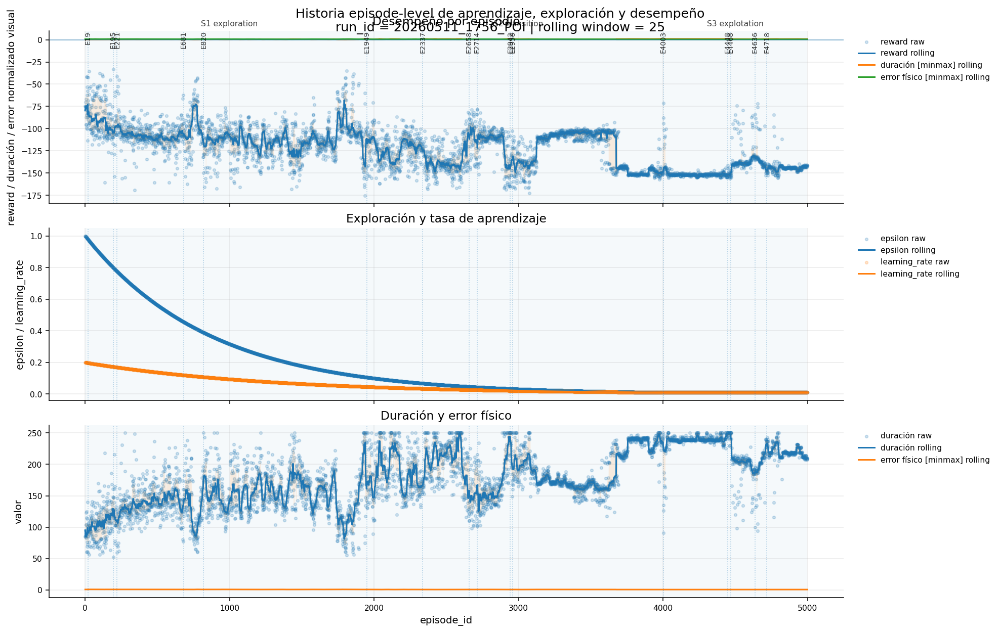

### Series efectivamente graficadas

,panel_id,column,label,transform
0,performance,total_reward,reward,raw
1,performance,total_agent_decisions,duración [minmax],minmax
2,performance,physical_error_score,error físico [minmax],minmax
3,exploration_schedule,epsilon,epsilon,raw
4,exploration_schedule,learning_rate,learning_rate,raw
5,termination_context,total_agent_decisions,duración,raw
6,termination_context,physical_error_score,error físico [minmax],minmax


In [141]:
# ---------------------------------------------------------------------
# 8.4 — Figura 1: historia episode-level de exploración y desempeño
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar qué se observa.
#
# Esta figura usa selected_episode_df, no JSON.
# Sirve para ver si epsilon / learning_rate cambian junto con desempeño.
# ---------------------------------------------------------------------

EPISODE_LEARNING_ROLLING_WINDOW = 25

EPISODE_LEARNING_PANEL_SPECS = [
    {
        "panel_id": "performance",
        "title": "Desempeño por episodio",
        "ylabel": "reward / duración / error normalizado visual",
        "zero_line": True,
        "series": [
            {
                "col": REWARD_COL,
                "label": "reward",
                "transform": "raw",
                "show_raw": True,
                "show_rolling": True,
                "show_iqr": True,
            },
            {
                "col": DURATION_COL,
                "label": "duración [minmax]",
                "transform": "minmax",
                "show_raw": False,
                "show_rolling": True,
                "show_iqr": False,
            },
            {
                "col": "physical_error_score",
                "label": "error físico [minmax]",
                "transform": "minmax",
                "show_raw": False,
                "show_rolling": True,
                "show_iqr": False,
            },
        ],
    },
    {
        "panel_id": "exploration_schedule",
        "title": "Exploración y tasa de aprendizaje",
        "ylabel": "epsilon / learning_rate",
        "zero_line": False,
        "series": [
            {
                "col": "epsilon",
                "label": "epsilon",
                "transform": "raw",
                "show_raw": True,
                "show_rolling": True,
                "show_iqr": False,
            },
            {
                "col": "learning_rate",
                "label": "learning_rate",
                "transform": "raw",
                "show_raw": True,
                "show_rolling": True,
                "show_iqr": False,
            },
        ],
    },
    {
        "panel_id": "termination_context",
        "title": "Duración y error físico",
        "ylabel": "valor",
        "zero_line": False,
        "series": [
            {
                "col": DURATION_COL,
                "label": "duración",
                "transform": "raw",
                "show_raw": True,
                "show_rolling": True,
                "show_iqr": True,
            },
            {
                "col": "physical_error_score",
                "label": "error físico [minmax]",
                "transform": "minmax",
                "show_raw": False,
                "show_rolling": True,
                "show_iqr": False,
            },
        ],
    },
]


section8_episode_learning_story_df = s8_plot_episode_level_learning_story(
    episode_df=selected_episode_df,
    stage_df=training_stage_df,
    panel_specs=EPISODE_LEARNING_PANEL_SPECS,
    representative_episodes_df=representative_episodes_df,
    rolling_window=EPISODE_LEARNING_ROLLING_WINDOW,
    title="Historia episode-level de aprendizaje, exploración y desempeño",
    save_as=None,
)

display(Markdown("### Series efectivamente graficadas"))
display(section8_episode_learning_story_df)

### 8.5 Figura 2: anatomía interval-level del aprendizaje

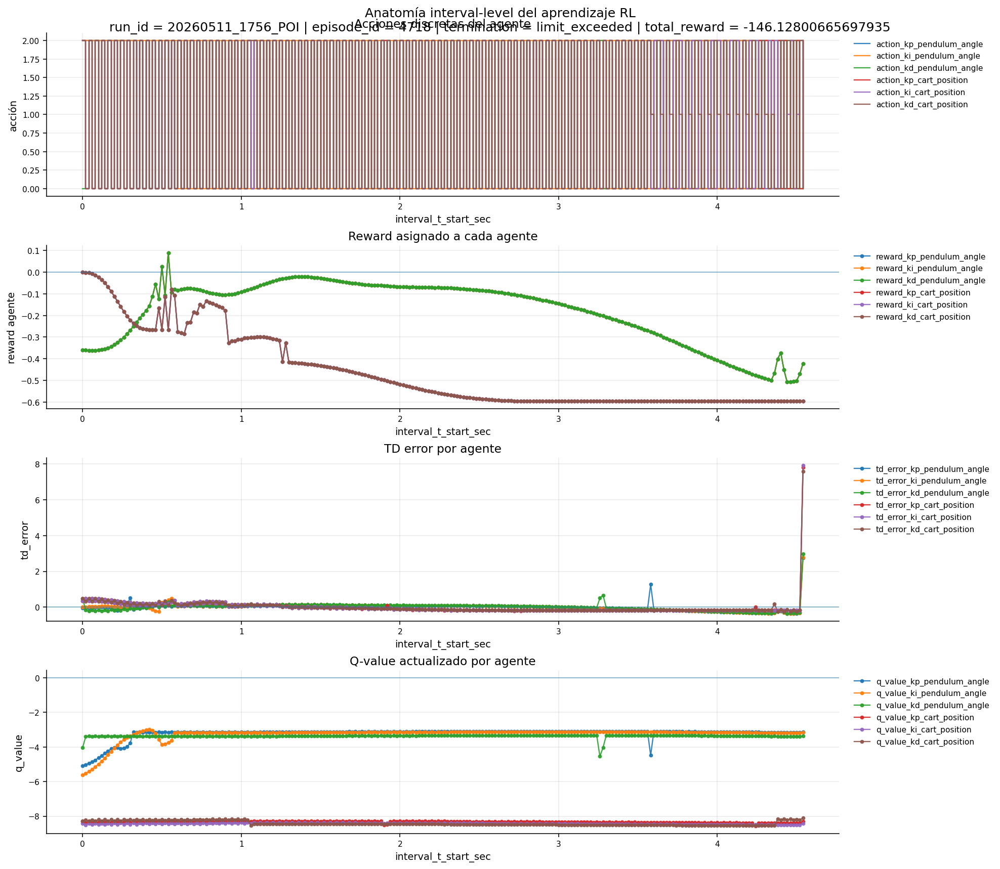

### Paneles efectivamente graficados

,panel_id,title,primary_columns,secondary_columns,transform
0,actions,Acciones discretas del agente,"[action_kp_pendulum_angle, action_ki_pendulum_angle, action_kd_pendulum_angle, action_kp_cart_position, action_ki_cart_position, action_kd_cart_position]",[],raw
1,assigned_rewards,Reward asignado a cada agente,"[reward_kp_pendulum_angle, reward_ki_pendulum_angle, reward_kd_pendulum_angle, reward_kp_cart_position, reward_ki_cart_position, reward_kd_cart_position]",[],raw
2,td_error,TD error por agente,"[td_error_kp_pendulum_angle, td_error_ki_pendulum_angle, td_error_kd_pendulum_angle, td_error_kp_cart_position, td_error_ki_cart_position, td_error_kd_cart_position]",[],raw
3,q_value,Q-value actualizado por agente,"[q_value_kp_pendulum_angle, q_value_ki_pendulum_angle, q_value_kd_pendulum_angle, q_value_kp_cart_position, q_value_ki_cart_position, q_value_kd_cart_position]",[],raw


In [142]:
# ---------------------------------------------------------------------
# 8.5 — Figura 2: anatomía interval-level del aprendizaje
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar qué se observa.
#
# Las columnas viven en interval_data.
# ---------------------------------------------------------------------

LEARNING_TIME_EPISODE_ID = FOCUS_EPISODE_ID

# Agentes que se quieren observar en esta figura.
PLOT_LEARNING_AGENTS = [
    # Ejemplo:
    # "kp_pendulum_angle",
    # "ki_pendulum_angle",
    # "kd_pendulum_angle",
]

# Si queda vacío, usa todos los agentes disponibles.
if not PLOT_LEARNING_AGENTS:
    PLOT_LEARNING_AGENTS = AVAILABLE_LEARNING_AGENTS


# Panel 1 — acciones
PLOT_ACTION_COLS = [
    f"action_{agent_name}"
    for agent_name in PLOT_LEARNING_AGENTS
]

# Panel 2 — reward asignado
PLOT_ASSIGNED_REWARD_COLS = [
    f"reward_{agent_name}"
    for agent_name in PLOT_LEARNING_AGENTS
]

# Panel 3 — TD error
PLOT_TD_ERROR_COLS = [
    f"td_error_{agent_name}"
    for agent_name in PLOT_LEARNING_AGENTS
]

# Panel 4 — Q-value actualizado
PLOT_Q_VALUE_COLS = [
    f"q_value_{agent_name}"
    for agent_name in PLOT_LEARNING_AGENTS
]

# Panel 5 — estadísticas Q-table
PLOT_Q_STATS_REGEX = [
    rf"^(q_mean|q_std|q_max|q_min)_({'|'.join(PLOT_LEARNING_AGENTS)})$",
]

PLOT_Q_STATS_MAX_COLUMNS = 16

# Panel 6 — visitas
PLOT_VISITS_REGEX = [
    rf"^(visits_total|visits_coverage)_({'|'.join(PLOT_LEARNING_AGENTS)})$",
]

PLOT_VISITS_MAX_COLUMNS = 16


learning_time_panel_specs = [
    {
        "panel_id": "actions",
        "title": "Acciones discretas del agente",
        "columns": PLOT_ACTION_COLS,
        "columns_regex": [],
        "transform": "raw",
        "ylabel": "acción",
        "zero_line": False,
        "plot_kind": "step",
    },
    {
        "panel_id": "assigned_rewards",
        "title": "Reward asignado a cada agente",
        "columns": PLOT_ASSIGNED_REWARD_COLS,
        "columns_regex": [],
        "transform": "raw",
        "ylabel": "reward agente",
        "zero_line": True,
    },
    {
        "panel_id": "td_error",
        "title": "TD error por agente",
        "columns": PLOT_TD_ERROR_COLS,
        "columns_regex": [],
        "transform": "raw",
        "ylabel": "td_error",
        "zero_line": True,
    },
    {
        "panel_id": "q_value",
        "title": "Q-value actualizado por agente",
        "columns": PLOT_Q_VALUE_COLS,
        "columns_regex": [],
        "transform": "raw",
        "ylabel": "q_value",
        "zero_line": True,
    },
    {
        "panel_id": "q_stats",
        "title": "Estadísticas agregadas Q-table",
        "columns": [],
        "columns_regex": PLOT_Q_STATS_REGEX,
        "max_columns": PLOT_Q_STATS_MAX_COLUMNS,
        "transform": "raw",
        "ylabel": "Q stats",
        "zero_line": True,
    },
    {
        "panel_id": "visits",
        "title": "Visitas y cobertura de estados",
        "columns": [],
        "columns_regex": PLOT_VISITS_REGEX,
        "max_columns": PLOT_VISITS_MAX_COLUMNS,
        "transform": "raw",
        "ylabel": "visits",
        "zero_line": False,
    },
]


section8_learning_time_panels_df = s8_plot_learning_interval_panels(
    episode_id=LEARNING_TIME_EPISODE_ID,
    episode_frames_by_id=episode_frames_by_id,
    panel_specs=learning_time_panel_specs,
    title="Anatomía interval-level del aprendizaje RL",
    save_as=None,
)

display(Markdown("### Paneles efectivamente graficados"))
display(section8_learning_time_panels_df)

### 8.6 Figura 3: relaciones críticas de aprendizaje

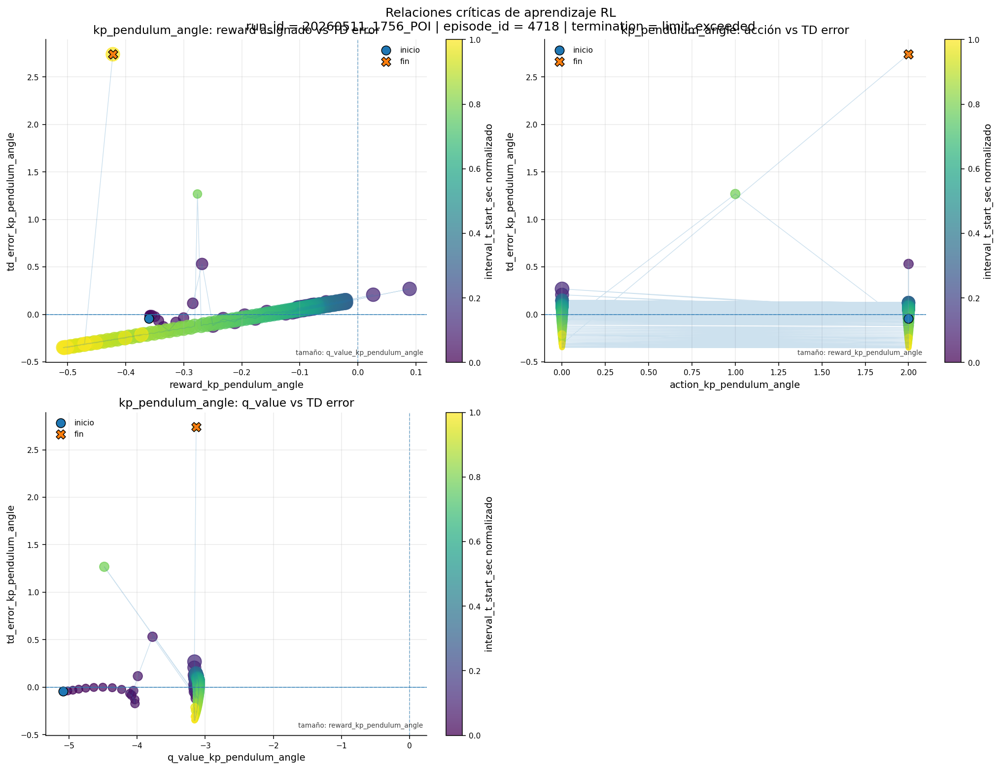

### Relaciones efectivamente graficadas

,x_col,y_col,size_col,title,n_points
0,reward_kp_pendulum_angle,td_error_kp_pendulum_angle,q_value_kp_pendulum_angle,kp_pendulum_angle: reward asignado vs TD error,228
1,action_kp_pendulum_angle,td_error_kp_pendulum_angle,reward_kp_pendulum_angle,kp_pendulum_angle: acción vs TD error,228
2,q_value_kp_pendulum_angle,td_error_kp_pendulum_angle,reward_kp_pendulum_angle,kp_pendulum_angle: q_value vs TD error,228


In [143]:
# ---------------------------------------------------------------------
# 8.6 — Figura 3: relaciones críticas de aprendizaje
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar qué relaciones se observan.
#
# Cada dict genera un panel.
# ---------------------------------------------------------------------

LEARNING_RELATION_EPISODE_ID = FOCUS_EPISODE_ID

LEARNING_RELATION_AGENT = (
    PLOT_LEARNING_AGENTS[0]
    if len(PLOT_LEARNING_AGENTS) > 0
    else AVAILABLE_LEARNING_AGENTS[0]
)

LEARNING_RELATION_SPECS = [
    {
        "x_col": f"reward_{LEARNING_RELATION_AGENT}",
        "y_col": f"td_error_{LEARNING_RELATION_AGENT}",
        "size_col": f"q_value_{LEARNING_RELATION_AGENT}",
        "title": f"{LEARNING_RELATION_AGENT}: reward asignado vs TD error",
        "xlabel": f"reward_{LEARNING_RELATION_AGENT}",
        "ylabel": f"td_error_{LEARNING_RELATION_AGENT}",
        "size_label": f"q_value_{LEARNING_RELATION_AGENT}",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "x_col": f"action_{LEARNING_RELATION_AGENT}",
        "y_col": f"td_error_{LEARNING_RELATION_AGENT}",
        "size_col": f"reward_{LEARNING_RELATION_AGENT}",
        "title": f"{LEARNING_RELATION_AGENT}: acción vs TD error",
        "xlabel": f"action_{LEARNING_RELATION_AGENT}",
        "ylabel": f"td_error_{LEARNING_RELATION_AGENT}",
        "size_label": f"reward_{LEARNING_RELATION_AGENT}",
        "x_ref": None,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "x_col": f"q_value_{LEARNING_RELATION_AGENT}",
        "y_col": f"td_error_{LEARNING_RELATION_AGENT}",
        "size_col": f"reward_{LEARNING_RELATION_AGENT}",
        "title": f"{LEARNING_RELATION_AGENT}: q_value vs TD error",
        "xlabel": f"q_value_{LEARNING_RELATION_AGENT}",
        "ylabel": f"td_error_{LEARNING_RELATION_AGENT}",
        "size_label": f"reward_{LEARNING_RELATION_AGENT}",
        "x_ref": 0.0,
        "y_ref": 0.0,
        "zero_line": True,
    },
    {
        "x_col": f"visits_coverage_{LEARNING_RELATION_AGENT}",
        "y_col": f"q_std_{LEARNING_RELATION_AGENT}",
        "size_col": f"td_error_{LEARNING_RELATION_AGENT}",
        "title": f"{LEARNING_RELATION_AGENT}: cobertura vs dispersión Q",
        "xlabel": f"visits_coverage_{LEARNING_RELATION_AGENT}",
        "ylabel": f"q_std_{LEARNING_RELATION_AGENT}",
        "size_label": f"td_error_{LEARNING_RELATION_AGENT}",
        "x_ref": None,
        "y_ref": 0.0,
        "zero_line": True,
    },

    # Activar para comparar otro agente:
    # {
    #     "x_col": "reward_kp_cart_position",
    #     "y_col": "td_error_kp_cart_position",
    #     "size_col": "q_value_kp_cart_position",
    #     "title": "kp_cart_position: reward vs TD error",
    #     "xlabel": "reward_kp_cart_position",
    #     "ylabel": "td_error_kp_cart_position",
    #     "size_label": "q_value_kp_cart_position",
    #     "x_ref": 0.0,
    #     "y_ref": 0.0,
    #     "zero_line": True,
    # },
]


section8_learning_relationships_df = s8_plot_learning_relationships(
    episode_id=LEARNING_RELATION_EPISODE_ID,
    episode_frames_by_id=episode_frames_by_id,
    relationship_specs=LEARNING_RELATION_SPECS,
    title="Relaciones críticas de aprendizaje RL",
    save_as=None,
)

display(Markdown("### Relaciones efectivamente graficadas"))
display(section8_learning_relationships_df)

### 8.7 Figura 4: mapa multiepisodio de aprendizaje

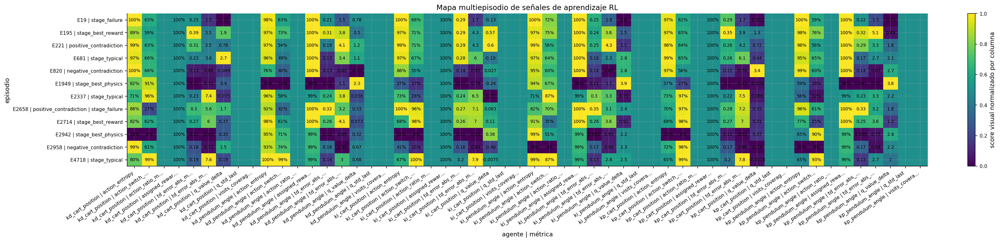

### Auditoría multiepisodio de aprendizaje

,episode_id,agent_name,n_interval,end_termination_reason,total_reward_end,total_agent_decisions_end,action_n_unique,action_mode,action_entropy,action_switch_ratio,action_ratio_0,action_ratio_1,action_ratio_2,assigned_reward_sum,assigned_reward_abs_sum,assigned_reward_mean,assigned_reward_negative_ratio,td_error_mean,td_error_abs_mean,td_error_abs_max,td_error_nonzero_ratio,q_value_mean,q_value_abs_mean,q_value_final,q_value_first,q_value_last,q_value_delta
0,19,kd_cart_position,99,limit_exceeded,-89.87046638126749,99,3,0.0,0.998073,0.632653,0.363636,0.313131,0.323232,-36.826123,36.826123,-0.371981,1.000000,-0.180202,0.252485,1.466139,1.0,-1.409596,1.409596,-1.773019,-1.218517,-1.773019,-0.554502
1,19,kd_pendulum_angle,99,limit_exceeded,-89.87046638126749,99,3,2.0,0.984979,0.632653,0.353535,0.252525,0.393939,-53.044343,53.044343,-0.535801,1.000000,-0.180440,0.211611,1.527100,1.0,-1.908128,1.908128,-1.821960,-2.605858,-1.821960,0.783898
2,19,ki_cart_position,99,limit_exceeded,-89.87046638126749,99,3,0.0,0.997489,0.683673,0.363636,0.333333,0.303030,-36.826123,36.826123,-0.371981,1.000000,-0.101812,0.290141,1.690820,1.0,-1.834805,1.834805,-1.953400,-1.822801,-1.953400,-0.130598
3,19,ki_pendulum_angle,99,limit_exceeded,-89.87046638126749,99,3,1.0,0.995531,0.724490,0.333333,0.373737,0.292929,-53.044343,53.044343,-0.535801,1.000000,-0.192205,0.252729,1.832068,1.0,-2.635460,2.635460,-2.066798,-2.666782,-2.066798,0.599984
4,19,kp_cart_position,99,limit_exceeded,-89.87046638126749,99,3,0.0,0.969015,0.622449,0.444444,0.323232,0.232323,-36.826123,36.826123,-0.371981,1.000000,-0.155278,0.286487,1.730305,1.0,-2.122625,2.122625,-1.985100,-1.922930,-1.985100,-0.062170
5,19,kp_pendulum_angle,99,limit_exceeded,-89.87046638126749,99,3,0.0,0.998073,0.591837,0.363636,0.323232,0.313131,-53.044343,53.044343,-0.535801,1.000000,-0.175940,0.216283,1.533951,1.0,-2.691150,2.691150,-1.827460,-2.580563,-1.827460,0.753103
6,195,kd_cart_position,52,limit_exceeded,-33.01731641549218,52,3,2.0,0.889742,0.588235,0.346154,0.134615,0.519231,-5.734846,5.734846,-0.110285,1.000000,0.336529,0.385553,3.462803,1.0,-4.485131,4.485131,-3.164685,-5.059982,-3.164685,1.895297
7,195,kd_pendulum_angle,52,limit_exceeded,-33.01731641549218,52,3,0.0,0.974001,0.725490,0.442308,0.307692,0.250000,-27.282471,27.282471,-0.524663,1.000000,-0.156225,0.306245,3.781127,1.0,-4.241955,4.241955,-3.723785,-4.224181,-3.723785,0.500396
8,195,ki_cart_position,52,limit_exceeded,-33.01731641549218,52,3,2.0,0.973539,0.705882,0.346154,0.230769,0.423077,-5.734846,5.734846,-0.110285,1.000000,0.280516,0.290964,4.270777,1.0,-4.476026,4.476026,-3.833057,-4.402400,-3.833057,0.569343
9,195,ki_pendulum_angle,52,limit_exceeded,-33.01731641549218,52,3,2.0,0.973539,0.745098,0.346154,0.230769,0.423077,-27.282471,27.282471,-0.524663,1.000000,-0.075921,0.242784,3.840354,1.0,-4.841660,4.841660,-3.772779,-5.304696,-3.772779,1.531916


### Matriz usada en el mapa

,episode_id,kd_cart_position | action_entropy,kd_cart_position | action_switch_ratio,kd_cart_position | action_ratio_maintain,kd_cart_position | assigned_reward_negative_ratio,kd_cart_position | td_error_abs_mean,kd_cart_position | td_error_abs_max,kd_cart_position | q_value_delta,kd_cart_position | q_std_last,kd_cart_position | visits_coverage_last,kd_pendulum_angle | action_entropy,kd_pendulum_angle | action_switch_ratio,kd_pendulum_angle | action_ratio_maintain,kd_pendulum_angle | assigned_reward_negative_ratio,kd_pendulum_angle | td_error_abs_mean,kd_pendulum_angle | td_error_abs_max,kd_pendulum_angle | q_value_delta,kd_pendulum_angle | q_std_last,kd_pendulum_angle | visits_coverage_last,ki_cart_position | action_entropy,ki_cart_position | action_switch_ratio,ki_cart_position | action_ratio_maintain,ki_cart_position | assigned_reward_negative_ratio,ki_cart_position | td_error_abs_mean,ki_cart_position | td_error_abs_max,ki_cart_position | q_value_delta,ki_cart_position | q_std_last,ki_cart_position | visits_coverage_last,ki_pendulum_angle | action_entropy,ki_pendulum_angle | action_switch_ratio,ki_pendulum_angle | action_ratio_maintain,ki_pendulum_angle | assigned_reward_negative_ratio,ki_pendulum_angle | td_error_abs_mean,ki_pendulum_angle | td_error_abs_max,ki_pendulum_angle | q_value_delta,ki_pendulum_angle | q_std_last,ki_pendulum_angle | visits_coverage_last,kp_cart_position | action_entropy,kp_cart_position | action_switch_ratio,kp_cart_position | action_ratio_maintain,kp_cart_position | assigned_reward_negative_ratio,kp_cart_position | td_error_abs_mean,kp_cart_position | td_error_abs_max,kp_cart_position | q_value_delta,kp_cart_position | q_std_last,kp_cart_position | visits_coverage_last,kp_pendulum_angle | action_entropy,kp_pendulum_angle | action_switch_ratio,kp_pendulum_angle | action_ratio_maintain,kp_pendulum_angle | assigned_reward_negative_ratio,kp_pendulum_angle | td_error_abs_mean,kp_pendulum_angle | td_error_abs_max,kp_pendulum_angle | q_value_delta,kp_pendulum_angle | q_std_last,kp_pendulum_angle | visits_coverage_last
0,19,0.998073,0.632653,NaN,1.0,0.252485,1.466139,-0.554502,NaN,NaN,0.984979,0.632653,NaN,1.000000,0.211611,1.527100,0.783898,NaN,NaN,0.997489,0.683673,NaN,1.0,0.290141,1.690820,-0.130598,NaN,NaN,0.995531,0.724490,NaN,1.000000,0.252729,1.832068,0.599984,NaN,NaN,0.969015,0.622449,NaN,1.0,0.286487,1.730305,-0.062170,NaN,NaN,0.998073,0.591837,NaN,1.000000,0.216283,1.533951,0.753103,NaN,NaN
1,195,0.889742,0.588235,NaN,1.0,0.385553,3.462803,1.895297,NaN,NaN,0.974001,0.725490,NaN,1.000000,0.306245,3.781127,0.500396,NaN,NaN,0.973539,0.705882,NaN,1.0,0.290964,4.270777,0.569343,NaN,NaN,0.973539,0.745098,NaN,1.000000,0.242784,3.840354,1.531916,NaN,NaN,0.965213,0.647059,NaN,1.0,0.350620,3.939089,1.337997,NaN,NaN,0.984832,0.764706,NaN,1.000000,0.318929,5.065624,0.888632,NaN,NaN
2,221,0.986366,0.628571,NaN,1.0,0.307024,3.487516,0.776406,NaN,NaN,0.972901,0.542857,NaN,1.000000,0.194893,4.070319,1.234556,NaN,NaN,0.990320,0.714286,NaN,1.0,0.286531,4.274339,0.604876,NaN,NaN,0.992425,0.557143,NaN,1.000000,0.252274,4.345410,1.079049,NaN,NaN,0.980383,0.642857,NaN,1.0,0.258058,4.165798,0.717918,NaN,NaN,0.983298,0.557143,NaN,1.000000,0.286750,3.344000,1.821214,NaN,NaN
3,681,0.969425,0.659574,NaN,1.0,0.234014,3.579959,2.745634,NaN,NaN,0.962471,0.489362,NaN,1.000000,0.134418,3.373458,1.097368,NaN,NaN,0.970589,0.673759,NaN,1.0,0.283807,6.024090,-0.190282,NaN,NaN,0.966352,0.638298,NaN,1.000000,0.164304,2.299106,2.792278,NaN,NaN,0.991232,0.652482,NaN,1.0,0.263944,6.132177,0.443030,NaN,NaN,0.954525,0.652482,NaN,1.000000,0.173768,2.734938,2.117792,NaN,NaN
4,820,0.999293,0.662651,NaN,1.0,0.132319,0.859867,-0.049234,NaN,NaN,0.756178,0.401606,NaN,1.000000,0.128631,0.823185,-0.632515,NaN,NaN,0.860653,0.550201,NaN,1.0,0.142843,0.946434,0.027147,NaN,NaN,0.948889,0.602410,NaN,1.000000,0.138257,0.645217,2.775317,NaN,NaN,0.971653,0.558233,NaN,1.0,0.145053,0.757656,3.410340,NaN,NaN,0.987218,0.598394,NaN,1.000000,0.136256,0.67284

In [144]:
# ---------------------------------------------------------------------
# 8.7 — Figura 4: mapa multiepisodio de aprendizaje
# ---------------------------------------------------------------------
# Editar SOLO esta caja para cambiar episodios, agentes y métricas.
# ---------------------------------------------------------------------

LEARNING_MULTI_EPISODE_IDS = EPISODES_TO_LOAD_IDS[:12]

LEARNING_MULTI_AGENTS = AVAILABLE_LEARNING_AGENTS
# Ejemplo para reducir:
# LEARNING_MULTI_AGENTS = [
#     "kp_pendulum_angle",
#     "ki_pendulum_angle",
#     "kd_pendulum_angle",
# ]

LEARNING_MULTI_METRICS = [
    "action_entropy",
    "action_switch_ratio",
    "action_ratio_maintain",
    "assigned_reward_negative_ratio",
    "td_error_abs_mean",
    "td_error_abs_max",
    "q_value_delta",
    "q_std_last",
    "visits_coverage_last",

    # Activar si interesa:
    # "assigned_reward_sum",
    # "q_mean_last",
    # "q_max_last",
    # "q_min_last",
    # "visits_total_last",
]

LEARNING_MULTI_NORMALIZE_PER_COLUMN = True


section8_multi_learning_audit_df = s8_compute_learning_audit_for_episodes(
    episode_ids=LEARNING_MULTI_EPISODE_IDS,
    episode_frames_by_id=episode_frames_by_id,
    config_main=selected_config_main,
    agent_names=LEARNING_MULTI_AGENTS,
)

section8_multi_learning_matrix_df = s8_plot_multiepisode_learning_heatmap(
    audit_df=section8_multi_learning_audit_df,
    metrics=LEARNING_MULTI_METRICS,
    representative_episodes_df=representative_episodes_df,
    normalize_per_column=LEARNING_MULTI_NORMALIZE_PER_COLUMN,
    title="Mapa multiepisodio de señales de aprendizaje RL",
    save_as=None,
)

display(Markdown("### Auditoría multiepisodio de aprendizaje"))
display(section8_multi_learning_audit_df)

display(Markdown("### Matriz usada en el mapa"))
display(section8_multi_learning_matrix_df)

### 8.8 Cierre de sección

In [145]:
# ---------------------------------------------------------------------
# 8.8 — Cierre de Sección 8
# ---------------------------------------------------------------------

SECTION8_OUTPUTS = {
    "focus_learning_column_catalog_df": "catálogo de columnas interval-level relacionadas con aprendizaje",
    "section8_agent_catalog_df": "catálogo de agentes desde metadata + columnas disponibles",
    "section8_learning_audit_df": "auditoría tabular de aprendizaje para episodios indicados",
    "section8_learning_findings_df": "alertas interpretativas sobre acciones, TD error, Q-values y visitas",
    "section8_episode_learning_story_df": "series episode-level graficadas",
    "section8_learning_time_panels_df": "paneles interval-level de aprendizaje",
    "section8_learning_relationships_df": "relaciones críticas de aprendizaje graficadas",
    "section8_multi_learning_audit_df": "auditoría multiepisodio de aprendizaje",
    "section8_multi_learning_matrix_df": "matriz usada en el heatmap multiepisodio",
}

display(Markdown("### Salidas listas de la Sección 8"))
display(
    pd.DataFrame([
        {"object": key, "description": value}
        for key, value in SECTION8_OUTPUTS.items()
    ])
)

display(Markdown("### Lectura recomendada para cerrar hipótesis del notebook"))
display(section8_learning_findings_df)

### Salidas listas de la Sección 8

,object,description
0,focus_learning_column_catalog_df,catálogo de columnas interval-level relacionadas con aprendizaje
1,section8_agent_catalog_df,catálogo de agentes desde metadata + columnas disponibles
2,section8_learning_audit_df,auditoría tabular de aprendizaje para episodios indicados
3,section8_learning_findings_df,"alertas interpretativas sobre acciones, TD error, Q-values y visitas"
4,section8_episode_learning_story_df,series episode-level graficadas
5,section8_learning_time_panels_df,paneles interval-level de aprendizaje
6,section8_learning_relationships_df,relaciones críticas de aprendizaje graficadas
7,section8_multi_learning_audit_df,auditoría multiepisodio de aprendizaje
8,section8_multi_learning_matrix_df,matriz usada en el heatmap multiepisodio


### Lectura recomendada para cerrar hipótesis del notebook

,episode_id,agent_name,finding,action_entropy,action_switch_ratio,action_ratio_maintain,td_error_abs_mean,td_error_abs_max,assigned_reward_negative_ratio,visits_coverage_last,q_std_last,q_value_delta
0,4718,kd_cart_position,picos altos de TD error | reward asignado mayormente negativo,0.802283,0.986784,NaN,0.190036,7.580628,1.000000,NaN,NaN,0.188084
1,4718,kd_pendulum_angle,reward asignado mayormente negativo,0.999944,0.986784,NaN,0.142313,2.970070,0.991228,NaN,NaN,0.677616
2,4718,ki_cart_position,picos altos de TD error | reward asignado mayormente negativo,0.671161,1.000000,NaN,0.196313,7.912731,1.000000,NaN,NaN,-0.007479
3,4718,ki_pendulum_angle,reward asignado mayormente negativo,0.987475,0.872247,NaN,0.127650,2.775664,0.991228,NaN,NaN,2.458518
4,4718,kp_cart_position,picos altos de TD error | reward asignado mayormente negativo,0.653813,0.991189,NaN,0.196677,7.799570,1.000000,NaN,NaN,-0.001785
5,4718,kp_pendulum_angle,reward asignado mayormente negativo,0.651278,0.929515,NaN,0.131275,2.739274,0.991228,NaN,NaN,1.951213


## Sección 9 — Síntesis integrada de hipótesis y decisiones de ajuste

**Pregunta analítica:**  
¿Qué hipótesis técnicas quedan mejor sustentadas por la evidencia observada en física, normalización, control, reward y aprendizaje?

**Objetivo específico:**  
Consolidar las alertas y métricas de las secciones anteriores para producir:

1. un registro único de evidencia;
2. un mapa de severidad por subsistema y episodio;
3. un mapa de hipótesis accionables;
4. una tabla final de recomendaciones de ajuste.

**Criterio de uso:**  
Cada celda de figura contiene su propia caja editable.  
El usuario no modifica helpers para cambiar qué hipótesis, episodios o subsistemas se observan.

### 9.1 Helpers generales de síntesis

In [147]:
# ---------------------------------------------------------------------
# 9.1 — Helpers generales de síntesis
# ---------------------------------------------------------------------
# No editar para cambiar hipótesis o episodios.
# Las selecciones se hacen directamente en las celdas siguientes.
# ---------------------------------------------------------------------

import re
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, Markdown


# ---------------------------------------------------------------------
# Fallbacks mínimos
# ---------------------------------------------------------------------

if "shorten_label" not in globals():
    def shorten_label(value, max_len=40):
        text = str(value)
        return text if len(text) <= max_len else text[:max_len - 1] + "…"


if "format_axis" not in globals():
    def format_axis(ax, title=None, xlabel=None, ylabel=None, grid=True, zero_line=False):
        if title is not None:
            ax.set_title(title)
        if xlabel is not None:
            ax.set_xlabel(xlabel)
        if ylabel is not None:
            ax.set_ylabel(ylabel)
        ax.grid(grid, alpha=0.25)
        if zero_line:
            ax.axhline(0.0, linewidth=0.8, alpha=0.6)
        return ax


if "save_current_figure" not in globals():
    def save_current_figure(filename=None, output_dir=None):
        if filename is None:
            return
        output_dir = Path(output_dir or ".")
        output_dir.mkdir(parents=True, exist_ok=True)
        path = output_dir / filename
        plt.savefig(path, bbox_inches="tight")
        print(f"Figura guardada en: {path}")


# ---------------------------------------------------------------------
# Utilidades base
# ---------------------------------------------------------------------

def s9_safe_numeric(value):
    try:
        return float(value)
    except Exception:
        return np.nan


def s9_unique_preserve_order(values):
    out = []
    seen = set()

    for value in values:
        if value in seen:
            continue
        seen.add(value)
        out.append(value)

    return out


def s9_get_global_frame(frame_name):
    """
    Obtiene un DataFrame por nombre desde globals().
    """
    obj = globals().get(frame_name, None)

    if isinstance(obj, pd.DataFrame):
        return obj.copy()

    return pd.DataFrame()


def s9_choose_first_available_frame(frame_names):
    """
    Retorna el primer DataFrame existente y no vacío.
    """
    for frame_name in frame_names:
        frame = s9_get_global_frame(frame_name)

        if not frame.empty:
            return frame_name, frame

    return None, pd.DataFrame()


# ---------------------------------------------------------------------
# Severidad de métricas
# ---------------------------------------------------------------------

def s9_metric_severity(value, rule):
    """
    Convierte una métrica en severidad 0..3.

    direction:
        higher_bad      -> más alto es peor.
        lower_bad       -> más bajo es peor.
        abs_higher_bad  -> mayor magnitud absoluta es peor.
        abs_lower_bad   -> menor magnitud absoluta es peor.
    """
    value = s9_safe_numeric(value)

    if pd.isna(value):
        return np.nan

    direction = rule.get("direction", "higher_bad")
    warn = rule.get("warn", None)
    high = rule.get("high", None)
    critical = rule.get("critical", None)

    if warn is None or high is None or critical is None:
        return 0.0

    if direction == "higher_bad":
        score_value = value

        if score_value >= critical:
            return 3.0
        if score_value >= high:
            return 2.0
        if score_value >= warn:
            return 1.0
        return 0.0

    if direction == "lower_bad":
        score_value = value

        if score_value <= critical:
            return 3.0
        if score_value <= high:
            return 2.0
        if score_value <= warn:
            return 1.0
        return 0.0

    if direction == "abs_higher_bad":
        score_value = abs(value)

        if score_value >= critical:
            return 3.0
        if score_value >= high:
            return 2.0
        if score_value >= warn:
            return 1.0
        return 0.0

    if direction == "abs_lower_bad":
        score_value = abs(value)

        if score_value <= critical:
            return 3.0
        if score_value <= high:
            return 2.0
        if score_value <= warn:
            return 1.0
        return 0.0

    return 0.0


def s9_severity_label(score):
    if pd.isna(score):
        return "missing"
    if score >= 3:
        return "critical"
    if score >= 2:
        return "high"
    if score >= 1:
        return "warning"
    return "ok"


def s9_format_value(value, metric_name):
    if pd.isna(value):
        return ""

    metric_name = str(metric_name)

    if "ratio" in metric_name or "share" in metric_name or "coverage" in metric_name or "entropy" in metric_name:
        return f"{100 * value:.0f}%"

    if "mae" in metric_name or "gap" in metric_name or "td_error" in metric_name:
        return f"{value:.2g}"

    if "usage" in metric_name:
        return f"{value:.2f}"

    return f"{value:.3g}"


# ---------------------------------------------------------------------
# Construcción de evidencia integrada
# ---------------------------------------------------------------------

def s9_collect_evidence_from_source(
    source_spec,
    metric_rules,
    episode_filter=None,
):
    """
    Convierte una tabla de auditoría/finding en filas de evidencia homogéneas.

    Salida:
        episode_id, subsystem, entity_type, entity, metric, value,
        severity_score, severity_label, finding, source_table.
    """
    frame_name, frame = s9_choose_first_available_frame(source_spec["frame_names"])

    if frame.empty:
        return pd.DataFrame()

    if episode_filter is not None and "episode_id" in frame.columns:
        frame = frame.loc[
            frame["episode_id"].astype(int).isin(set(map(int, episode_filter)))
        ].copy()

    if frame.empty:
        return pd.DataFrame()

    entity_col = source_spec.get("entity_col", None)
    entity_type = source_spec.get("entity_type", "entity")
    finding_col = source_spec.get("finding_col", None)

    metric_cols = [
        col for col in source_spec.get("metric_cols", [])
        if col in frame.columns
    ]

    if not metric_cols:
        metric_patterns = source_spec.get("metric_regex", [])

        for pattern in metric_patterns:
            matched = [
                col for col in frame.columns
                if re.search(pattern, str(col), flags=re.IGNORECASE)
            ]
            metric_cols.extend(matched)

    metric_cols = s9_unique_preserve_order(metric_cols)

    rows = []

    for _, record in frame.iterrows():
        episode_id = int(record["episode_id"]) if "episode_id" in frame.columns and pd.notna(record["episode_id"]) else -1

        if entity_col is not None and entity_col in frame.columns:
            entity = record[entity_col]
        else:
            entity = source_spec.get("default_entity", source_spec["subsystem"])

        finding = ""

        if finding_col is not None and finding_col in frame.columns:
            finding = str(record[finding_col])

        for metric in metric_cols:
            value = s9_safe_numeric(record.get(metric, np.nan))
            rule = metric_rules.get(metric, source_spec.get("default_metric_rule", {"direction": "higher_bad", "warn": np.inf, "high": np.inf, "critical": np.inf}))
            severity = s9_metric_severity(value, rule)

            rows.append({
                "episode_id": episode_id,
                "subsystem": source_spec["subsystem"],
                "subsystem_label": source_spec.get("subsystem_label", source_spec["subsystem"]),
                "entity_type": entity_type,
                "entity": entity,
                "metric": metric,
                "value": value,
                "value_text": s9_format_value(value, metric),
                "severity_score": severity,
                "severity_label": s9_severity_label(severity),
                "finding": finding,
                "source_table": frame_name,
            })

    return pd.DataFrame(rows)


def s9_collect_integrated_evidence(
    source_specs,
    metric_rules,
    episode_filter=None,
):
    frames = []

    for source_spec in source_specs:
        part = s9_collect_evidence_from_source(
            source_spec=source_spec,
            metric_rules=metric_rules,
            episode_filter=episode_filter,
        )

        if not part.empty:
            frames.append(part)

    if not frames:
        return pd.DataFrame()

    evidence_df = (
        pd.concat(frames, ignore_index=True, sort=False)
        .sort_values(["episode_id", "subsystem", "entity", "metric"])
        .reset_index(drop=True)
    )

    return evidence_df


# ---------------------------------------------------------------------
# Hipótesis
# ---------------------------------------------------------------------

def s9_text_matches_any(text, patterns):
    if not patterns:
        return False

    text = str(text)

    return any(
        re.search(pattern, text, flags=re.IGNORECASE)
        for pattern in patterns
    )


def s9_evidence_matches_hypothesis(row, hypothesis_rule):
    subsystem_patterns = hypothesis_rule.get("subsystem_patterns", [])
    metric_patterns = hypothesis_rule.get("metric_patterns", [])
    entity_patterns = hypothesis_rule.get("entity_patterns", [])
    finding_patterns = hypothesis_rule.get("finding_patterns", [])

    subsystem_match = (
        not subsystem_patterns
        or s9_text_matches_any(row["subsystem"], subsystem_patterns)
        or s9_text_matches_any(row["subsystem_label"], subsystem_patterns)
    )

    metric_match = (
        not metric_patterns
        or s9_text_matches_any(row["metric"], metric_patterns)
    )

    entity_match = (
        not entity_patterns
        or s9_text_matches_any(row["entity"], entity_patterns)
    )

    finding_match = (
        not finding_patterns
        or s9_text_matches_any(row["finding"], finding_patterns)
    )

    return subsystem_match and metric_match and entity_match and finding_match


def s9_build_hypothesis_evidence(evidence_df, hypothesis_rules, min_severity=1.0):
    rows = []

    if evidence_df.empty:
        return pd.DataFrame()

    candidate_df = evidence_df.loc[
        evidence_df["severity_score"].fillna(0.0) >= float(min_severity)
    ].copy()

    for _, evidence_row in candidate_df.iterrows():
        for rule in hypothesis_rules:
            if s9_evidence_matches_hypothesis(evidence_row, rule):
                rows.append({
                    "episode_id": int(evidence_row["episode_id"]),
                    "hypothesis_id": rule["hypothesis_id"],
                    "hypothesis_label": rule["hypothesis_label"],
                    "adjustment_group": rule["adjustment_group"],
                    "recommended_adjustment": rule["recommended_adjustment"],
                    "next_probe": rule.get("next_probe", ""),
                    "subsystem": evidence_row["subsystem"],
                    "entity": evidence_row["entity"],
                    "metric": evidence_row["metric"],
                    "value": evidence_row["value"],
                    "value_text": evidence_row["value_text"],
                    "severity_score": evidence_row["severity_score"],
                    "severity_label": evidence_row["severity_label"],
                    "finding": evidence_row["finding"],
                    "source_table": evidence_row["source_table"],
                })

    if not rows:
        return pd.DataFrame()

    return (
        pd.DataFrame(rows)
        .sort_values(["episode_id", "hypothesis_id", "severity_score"], ascending=[True, True, False])
        .reset_index(drop=True)
    )


def s9_join_top_evidence(group_df, max_items=3):
    items = []

    for _, row in group_df.sort_values("severity_score", ascending=False).head(max_items).iterrows():
        items.append(
            f"{row['subsystem']}:{row['entity']}:{row['metric']}={row['value_text']} ({row['severity_label']})"
        )

    return " | ".join(items)


def s9_build_hypothesis_summary(hypothesis_evidence_df):
    if hypothesis_evidence_df.empty:
        return pd.DataFrame()

    summary_df = (
        hypothesis_evidence_df
        .groupby(
            [
                "hypothesis_id",
                "hypothesis_label",
                "adjustment_group",
                "recommended_adjustment",
                "next_probe",
            ],
            as_index=False,
        )
        .agg(
            max_severity=("severity_score", "max"),
            mean_severity=("severity_score", "mean"),
            evidence_count=("metric", "count"),
            n_episodes=("episode_id", "nunique"),
            episodes=("episode_id", lambda s: ", ".join(map(str, sorted(set(map(int, s)))))),
            subsystems=("subsystem", lambda s: ", ".join(sorted(set(map(str, s))))),
            top_evidence=("metric", lambda s: ""),
        )
    )

    top_evidence_rows = []

    for _, key_row in summary_df.iterrows():
        part = hypothesis_evidence_df.loc[
            hypothesis_evidence_df["hypothesis_id"].eq(key_row["hypothesis_id"])
        ]

        top_evidence_rows.append(
            s9_join_top_evidence(part, max_items=3)
        )

    summary_df["top_evidence"] = top_evidence_rows
    summary_df["severity_label"] = summary_df["max_severity"].apply(s9_severity_label)

    return (
        summary_df
        .sort_values(["max_severity", "evidence_count"], ascending=[False, False])
        .reset_index(drop=True)
    )


def s9_build_recommendation_table(hypothesis_summary_df):
    if hypothesis_summary_df.empty:
        return pd.DataFrame()

    cols = [
        "severity_label",
        "hypothesis_id",
        "hypothesis_label",
        "adjustment_group",
        "recommended_adjustment",
        "next_probe",
        "episodes",
        "subsystems",
        "top_evidence",
        "evidence_count",
        "max_severity",
    ]

    return hypothesis_summary_df[cols].copy()


# ---------------------------------------------------------------------
# Plot helpers
# ---------------------------------------------------------------------

def s9_episode_label_map(representative_episodes_df):
    if representative_episodes_df is None or representative_episodes_df.empty:
        return {}

    return {
        int(row.episode_id): f"E{int(row.episode_id)} | {row.criterion_id}"
        for row in representative_episodes_df.itertuples(index=False)
    }


def s9_normalize_for_heatmap(matrix):
    matrix = np.asarray(matrix, dtype=float)
    return matrix


def s9_plot_subsystem_severity_map(
    evidence_df,
    episode_ids,
    subsystems=None,
    representative_episodes_df=None,
    title="Mapa integrado de severidad por subsistema",
    save_as=None,
):
    if evidence_df.empty:
        display(Markdown("section9_evidence_df está vacío."))
        return pd.DataFrame()

    plot_df = evidence_df.copy()
    plot_df = plot_df.loc[
        plot_df["episode_id"].astype(int).isin(set(map(int, episode_ids)))
    ].copy()

    if subsystems is not None:
        plot_df = plot_df.loc[plot_df["subsystem"].isin(subsystems)].copy()

    if plot_df.empty:
        display(Markdown("No hay evidencia para los episodios/subsistemas seleccionados."))
        return pd.DataFrame()

    pivot_df = (
        plot_df
        .groupby(["episode_id", "subsystem"], as_index=False)
        .agg(
            max_severity=("severity_score", "max"),
            top_metric=("metric", lambda s: ""),
        )
    )

    top_metric_values = []

    for _, row in pivot_df.iterrows():
        part = plot_df.loc[
            plot_df["episode_id"].astype(int).eq(int(row["episode_id"]))
            & plot_df["subsystem"].eq(row["subsystem"])
        ]

        top = part.sort_values("severity_score", ascending=False).iloc[0]
        top_metric_values.append(f"{top['metric']}\n{top['value_text']}")

    pivot_df["top_metric"] = top_metric_values

    episode_order = list(map(int, episode_ids))
    subsystem_order = subsystems or sorted(pivot_df["subsystem"].unique())

    matrix_df = (
        pivot_df
        .pivot_table(
            index="subsystem",
            columns="episode_id",
            values="max_severity",
            aggfunc="max",
            observed=True,
        )
        .reindex(index=subsystem_order, columns=episode_order)
    )

    annotation_df = (
        pivot_df
        .pivot_table(
            index="subsystem",
            columns="episode_id",
            values="top_metric",
            aggfunc="first",
            observed=True,
        )
        .reindex(index=subsystem_order, columns=episode_order)
    )

    matrix = matrix_df.to_numpy(dtype=float)

    episode_labels = s9_episode_label_map(representative_episodes_df)
    x_labels = [
        shorten_label(episode_labels.get(int(ep), f"E{int(ep)}"), max_len=42)
        for ep in episode_order
    ]

    fig, ax = plt.subplots(
        figsize=(max(9.5, 1.15 * len(episode_order)), max(4.8, 0.62 * len(subsystem_order)))
    )

    image = ax.imshow(
        np.ma.masked_invalid(matrix),
        aspect="auto",
        interpolation="nearest",
        vmin=0.0,
        vmax=3.0,
    )

    ax.set_title(title)
    ax.set_xlabel("episodio")
    ax.set_ylabel("subsistema")

    ax.set_xticks(np.arange(len(episode_order)))
    ax.set_xticklabels(x_labels, rotation=35, ha="right")

    ax.set_yticks(np.arange(len(subsystem_order)))
    ax.set_yticklabels(subsystem_order)

    for i in range(matrix.shape[0]):
        for j in range(matrix.shape[1]):
            value = matrix[i, j]

            if not np.isfinite(value):
                continue

            label = annotation_df.iloc[i, j]

            ax.text(
                j,
                i,
                shorten_label(label, max_len=28),
                ha="center",
                va="center",
                fontsize=7,
            )

    fig.colorbar(image, ax=ax, label="severidad: 0 ok, 1 warning, 2 high, 3 critical")

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return matrix_df


def s9_plot_hypothesis_map(
    hypothesis_evidence_df,
    hypothesis_ids=None,
    episode_ids=None,
    representative_episodes_df=None,
    title="Mapa integrado de hipótesis",
    save_as=None,
):
    if hypothesis_evidence_df.empty:
        display(Markdown("section9_hypothesis_evidence_df está vacío."))
        return pd.DataFrame()

    plot_df = hypothesis_evidence_df.copy()

    if hypothesis_ids is not None:
        plot_df = plot_df.loc[plot_df["hypothesis_id"].isin(hypothesis_ids)].copy()

    if episode_ids is not None:
        plot_df = plot_df.loc[
            plot_df["episode_id"].astype(int).isin(set(map(int, episode_ids)))
        ].copy()

    if plot_df.empty:
        display(Markdown("No hay hipótesis activas para la selección indicada."))
        return pd.DataFrame()

    pivot_df = (
        plot_df
        .groupby(["hypothesis_id", "hypothesis_label", "episode_id"], as_index=False)
        .agg(
            max_severity=("severity_score", "max"),
            evidence_count=("metric", "count"),
        )
    )

    annotation_rows = []

    for _, row in pivot_df.iterrows():
        part = plot_df.loc[
            plot_df["hypothesis_id"].eq(row["hypothesis_id"])
            & plot_df["episode_id"].astype(int).eq(int(row["episode_id"]))
        ]

        top = part.sort_values("severity_score", ascending=False).iloc[0]
        annotation_rows.append(f"{top['metric']}\n{top['value_text']}")

    pivot_df["annotation"] = annotation_rows

    hypothesis_order = (
        pivot_df
        .sort_values(["max_severity", "evidence_count"], ascending=[False, False])
        ["hypothesis_id"]
        .drop_duplicates()
        .tolist()
    )

    if hypothesis_ids is not None:
        hypothesis_order = [h for h in hypothesis_ids if h in hypothesis_order]

    episode_order = (
        list(map(int, episode_ids))
        if episode_ids is not None
        else sorted(pivot_df["episode_id"].astype(int).unique())
    )

    label_by_hypothesis = (
        pivot_df
        .drop_duplicates("hypothesis_id")
        .set_index("hypothesis_id")["hypothesis_label"]
        .to_dict()
    )

    matrix_df = (
        pivot_df
        .pivot_table(
            index="hypothesis_id",
            columns="episode_id",
            values="max_severity",
            aggfunc="max",
            observed=True,
        )
        .reindex(index=hypothesis_order, columns=episode_order)
    )

    annotation_df = (
        pivot_df
        .pivot_table(
            index="hypothesis_id",
            columns="episode_id",
            values="annotation",
            aggfunc="first",
            observed=True,
        )
        .reindex(index=hypothesis_order, columns=episode_order)
    )

    matrix = matrix_df.to_numpy(dtype=float)

    episode_labels = s9_episode_label_map(representative_episodes_df)
    x_labels = [
        shorten_label(episode_labels.get(int(ep), f"E{int(ep)}"), max_len=42)
        for ep in episode_order
    ]

    y_labels = [
        shorten_label(label_by_hypothesis.get(h, h), max_len=58)
        for h in hypothesis_order
    ]

    fig, ax = plt.subplots(
        figsize=(max(10.5, 1.15 * len(episode_order)), max(5.2, 0.58 * len(hypothesis_order)))
    )

    image = ax.imshow(
        np.ma.masked_invalid(matrix),
        aspect="auto",
        interpolation="nearest",
        vmin=0.0,
        vmax=3.0,
    )

    ax.set_title(title)
    ax.set_xlabel("episodio")
    ax.set_ylabel("hipótesis")

    ax.set_xticks(np.arange(len(episode_order)))
    ax.set_xticklabels(x_labels, rotation=35, ha="right")

    ax.set_yticks(np.arange(len(hypothesis_order)))
    ax.set_yticklabels(y_labels)

    for i in range(matrix.shape[0]):
        for j in range(matrix.shape[1]):
            value = matrix[i, j]

            if not np.isfinite(value):
                continue

            label = annotation_df.iloc[i, j]

            ax.text(
                j,
                i,
                shorten_label(label, max_len=28),
                ha="center",
                va="center",
                fontsize=7,
            )

    fig.colorbar(image, ax=ax, label="severidad: 0 ok, 1 warning, 2 high, 3 critical")

    save_current_figure(save_as, FIG_OUTPUT_DIR)
    plt.show()

    return matrix_df

### 9.2 Construcción de evidencia e hipótesis

In [148]:
# ---------------------------------------------------------------------
# 9.2 — Construcción de evidencia e hipótesis
# ---------------------------------------------------------------------
# Editar SOLO esta caja para controlar:
# - episodios incluidos;
# - tablas fuente;
# - umbrales de severidad;
# - hipótesis accionables.
# ---------------------------------------------------------------------

SECTION9_EPISODE_IDS = EPISODES_TO_LOAD_IDS[:12]

# ---------------------------------------------------------------------
# Tablas fuente.
# Se usa el primer DataFrame existente de cada lista.
# ---------------------------------------------------------------------

SECTION9_SOURCE_SPECS = [
    {
        "subsystem": "physics_normalization",
        "subsystem_label": "Física / normalización",
        "frame_names": [
            "section5_multi_episode_audit_df",
            "section5_focus_state_audit_df",
            "section5_focus_findings_df",
        ],
        "entity_type": "state_var",
        "entity_col": "state_var",
        "finding_col": "finding",
        "metric_cols": [
            "boundary_violation_ratio",
            "boundary_usage_max",
            "norm_clip_ratio",
            "stabilization_ratio",
            "norm_expected_mae",
        ],
    },
    {
        "subsystem": "control",
        "subsystem_label": "Control / saturación",
        "frame_names": [
            "section6_multi_control_audit_df",
            "section6_control_audit_df",
            "section6_control_findings_df",
        ],
        "entity_type": "var_obj",
        "entity_col": "var_obj",
        "finding_col": "finding",
        "metric_cols": [
            "saturation_ratio_global",
            "u_total_raw_limit_usage_max",
            "conflict_ratio",
            "u_conflict_abs_mean",
            "control_action_abs_max",
            "control_action_eff_abs_max",
            "u_alloc_abs_max",
            "integral_error_abs_max",
            "action_eff_to_raw_ratio_median",
            "u_alloc_to_action_ratio_median",
            "kp_delta_abs",
            "ki_delta_abs",
            "kd_delta_abs",
        ],
    },
    {
        "subsystem": "reward",
        "subsystem_label": "Reward / shaping",
        "frame_names": [
            "section7_multi_reward_audit_df",
            "section7_reward_audit_df",
            "section7_reward_findings_df",
        ],
        "entity_type": "reward",
        "entity_col": None,
        "default_entity": "global_reward",
        "finding_col": "finding",
        "metric_cols": [
            "global_interval_reward_sum",
            "global_negative_ratio",
            "principal_reward_abs_share",
            "component_extra_total_abs_share",
            "coordination_reward_total_abs_share",
            "reward_gap_end_vs_intervals",
            "global_reward_reconstruction_mae",
        ],
    },
    {
        "subsystem": "learning",
        "subsystem_label": "RL / aprendizaje",
        "frame_names": [
            "section8_multi_learning_audit_df",
            "section8_learning_audit_df",
            "section8_learning_findings_df",
        ],
        "entity_type": "agent_name",
        "entity_col": "agent_name",
        "finding_col": "finding",
        "metric_cols": [
            "action_entropy",
            "action_switch_ratio",
            "action_ratio_maintain",
            "assigned_reward_negative_ratio",
            "td_error_abs_mean",
            "td_error_abs_max",
            "q_value_delta",
            "q_std_last",
            "visits_coverage_last",
        ],
    },
]


# ---------------------------------------------------------------------
# Reglas de severidad.
# Ajustar umbrales según escala de reward/experimento.
# ---------------------------------------------------------------------

SECTION9_METRIC_RULES = {
    # Física / normalización
    "boundary_violation_ratio": {"direction": "higher_bad", "warn": 0.01, "high": 0.05, "critical": 0.20},
    "boundary_usage_max": {"direction": "higher_bad", "warn": 0.85, "high": 1.00, "critical": 1.20},
    "norm_clip_ratio": {"direction": "higher_bad", "warn": 0.02, "high": 0.10, "critical": 0.30},
    "stabilization_ratio": {"direction": "lower_bad", "warn": 0.25, "high": 0.10, "critical": 0.01},
    "norm_expected_mae": {"direction": "higher_bad", "warn": 1e-7, "high": 1e-5, "critical": 1e-3},

    # Control
    "saturation_ratio_global": {"direction": "higher_bad", "warn": 0.05, "high": 0.15, "critical": 0.40},
    "u_total_raw_limit_usage_max": {"direction": "higher_bad", "warn": 0.85, "high": 1.00, "critical": 1.25},
    "conflict_ratio": {"direction": "higher_bad", "warn": 0.05, "high": 0.15, "critical": 0.40},
    "u_conflict_abs_mean": {"direction": "higher_bad", "warn": 0.05, "high": 0.20, "critical": 0.50},
    "control_action_abs_max": {"direction": "higher_bad", "warn": 0.80, "high": 1.50, "critical": 3.00},
    "control_action_eff_abs_max": {"direction": "higher_bad", "warn": 0.80, "high": 1.00, "critical": 1.25},
    "u_alloc_abs_max": {"direction": "higher_bad", "warn": 0.80, "high": 1.00, "critical": 1.25},
    "integral_error_abs_max": {"direction": "higher_bad", "warn": 0.50, "high": 1.00, "critical": 2.00},
    "action_eff_to_raw_ratio_median": {"direction": "lower_bad", "warn": 0.80, "high": 0.50, "critical": 0.25},
    "u_alloc_to_action_ratio_median": {"direction": "lower_bad", "warn": 0.50, "high": 0.25, "critical": 0.10},
    "kp_delta_abs": {"direction": "higher_bad", "warn": 1e-9, "high": 0.05, "critical": 0.20},
    "ki_delta_abs": {"direction": "higher_bad", "warn": 1e-9, "high": 0.05, "critical": 0.20},
    "kd_delta_abs": {"direction": "higher_bad", "warn": 1e-9, "high": 0.05, "critical": 0.20},

    # Reward
    "global_negative_ratio": {"direction": "higher_bad", "warn": 0.70, "high": 0.85, "critical": 0.95},
    "principal_reward_abs_share": {"direction": "lower_bad", "warn": 0.50, "high": 0.30, "critical": 0.10},
    "component_extra_total_abs_share": {"direction": "higher_bad", "warn": 0.35, "high": 0.55, "critical": 0.75},
    "coordination_reward_total_abs_share": {"direction": "higher_bad", "warn": 0.35, "high": 0.55, "critical": 0.75},
    "reward_gap_end_vs_intervals": {"direction": "abs_higher_bad", "warn": 1e-6, "high": 1e-4, "critical": 1e-2},
    "global_reward_reconstruction_mae": {"direction": "higher_bad", "warn": 1e-6, "high": 1e-4, "critical": 1e-2},

    # Learning
    "action_entropy": {"direction": "lower_bad", "warn": 0.10, "high": 0.05, "critical": 0.01},
    "action_switch_ratio": {"direction": "lower_bad", "warn": 0.05, "high": 0.02, "critical": 0.005},
    "action_ratio_maintain": {"direction": "higher_bad", "warn": 0.80, "high": 0.90, "critical": 0.98},
    "assigned_reward_negative_ratio": {"direction": "higher_bad", "warn": 0.70, "high": 0.85, "critical": 0.95},
    "td_error_abs_mean": {"direction": "higher_bad", "warn": 1.00, "high": 5.00, "critical": 10.00},
    "td_error_abs_max": {"direction": "higher_bad", "warn": 5.00, "high": 20.00, "critical": 50.00},
    "q_value_delta": {"direction": "abs_lower_bad", "warn": 1e-8, "high": 1e-10, "critical": 1e-12},
    "q_std_last": {"direction": "lower_bad", "warn": 1e-6, "high": 1e-8, "critical": 1e-10},
    "visits_coverage_last": {"direction": "lower_bad", "warn": 0.05, "high": 0.01, "critical": 0.001},
}


# ---------------------------------------------------------------------
# Reglas de hipótesis accionables.
# ---------------------------------------------------------------------

SECTION9_HYPOTHESIS_RULES = [
    {
        "hypothesis_id": "H01_physical_limit_or_initial_condition",
        "hypothesis_label": "El episodio opera cerca o fuera de límites físicos",
        "adjustment_group": "sistema físico / condiciones de término",
        "subsystem_patterns": [r"physics"],
        "metric_patterns": [r"boundary_violation_ratio|boundary_usage_max|stabilization_ratio"],
        "finding_patterns": [],
        "recommended_adjustment": "Revisar condiciones iniciales, límites de término, objetivo de estabilización y pesos asociados a error físico.",
        "next_probe": "Abrir trayectorias raw del estado que domina la alerta y contrastar con límite/setpoint.",
    },
    {
        "hypothesis_id": "H02_state_normalization_misaligned",
        "hypothesis_label": "La normalización de estado está clippeando o desalineada",
        "adjustment_group": "normalización de estado",
        "subsystem_patterns": [r"physics"],
        "metric_patterns": [r"norm_clip_ratio|norm_expected_mae"],
        "finding_patterns": [],
        "recommended_adjustment": "Revisar dynamic_system.state_normalization.ranges_params y output_limits.",
        "next_probe": "Comparar raw→norm esperado contra observado y revisar si el controlador ve magnitudes saturadas.",
    },
    {
        "hypothesis_id": "H03_control_saturation",
        "hypothesis_label": "La demanda de control está saturando el actuador",
        "adjustment_group": "control / actuador",
        "subsystem_patterns": [r"control"],
        "metric_patterns": [r"saturation_ratio_global|u_total_raw_limit_usage_max|action_eff_to_raw_ratio_median"],
        "finding_patterns": [],
        "recommended_adjustment": "Reducir agresividad de ganancias/rangos de acción, revisar límites globales y penalización L_u.",
        "next_probe": "Mirar u_total_raw vs u_total_saturated y sombreado de saturación en Sección 6.",
    },
    {
        "hypothesis_id": "H04_loop_conflict",
        "hypothesis_label": "Los lazos compiten por el mismo actuador",
        "adjustment_group": "control / coordinación",
        "subsystem_patterns": [r"control"],
        "metric_patterns": [r"conflict_ratio|u_conflict"],
        "finding_patterns": [],
        "recommended_adjustment": "Revisar balance entre control de péndulo y carro; ajustar pesos por lazo o reward coordinativo.",
        "next_probe": "Comparar u_conflict_pendulum_angle vs u_conflict_cart_position y reward coordinativo.",
    },
    {
        "hypothesis_id": "H05_integral_or_gain_instability",
        "hypothesis_label": "Integral o cambios de ganancia pueden estar amplificando la respuesta",
        "adjustment_group": "PID / anti-windup / rangos de ganancia",
        "subsystem_patterns": [r"control"],
        "metric_patterns": [r"integral_error_abs_max|kp_delta_abs|ki_delta_abs|kd_delta_abs"],
        "finding_patterns": [],
        "recommended_adjustment": "Revisar Ki, anti-windup, delta_gain y límites min/max de agentes PID.",
        "next_probe": "Graficar integral_error_* junto con saturación y acciones RL.",
    },
    {
        "hypothesis_id": "H06_reward_shaping_dominates",
        "hypothesis_label": "Extras o coordinación dominan la señal de recompensa",
        "adjustment_group": "reward shaping",
        "subsystem_patterns": [r"reward"],
        "metric_patterns": [r"component_extra_total_abs_share|coordination_reward_total_abs_share|principal_reward_abs_share"],
        "finding_patterns": [],
        "recommended_adjustment": "Reducir bonus/penalties dominantes o reforzar principal_reward si la física no está siendo priorizada.",
        "next_probe": "Abrir contribuciones, extras y coordinación en Sección 7.",
    },
    {
        "hypothesis_id": "H07_reward_consistency_problem",
        "hypothesis_label": "La recompensa reconstruida no coincide con los componentes visibles",
        "adjustment_group": "logging / reward accounting",
        "subsystem_patterns": [r"reward"],
        "metric_patterns": [r"reward_gap_end_vs_intervals|global_reward_reconstruction_mae"],
        "finding_patterns": [],
        "recommended_adjustment": "Revisar columnas persistidas, componentes omitidos y consistencia de summary vs interval_data.",
        "next_probe": "Comparar total_reward_end, suma global_interval_reward y componentes visibles.",
    },
    {
        "hypothesis_id": "H08_reward_mostly_negative",
        "hypothesis_label": "La señal de recompensa es mayormente negativa",
        "adjustment_group": "escala de reward",
        "subsystem_patterns": [r"reward|learning"],
        "metric_patterns": [r"global_negative_ratio|assigned_reward_negative_ratio"],
        "finding_patterns": [],
        "recommended_adjustment": "Revisar escala, clipping, offset o balance entre castigos y bonus.",
        "next_probe": "Comparar reward asignado por agente con TD error.",
    },
    {
        "hypothesis_id": "H09_unstable_learning_signal",
        "hypothesis_label": "El TD error sugiere señal de aprendizaje inestable",
        "adjustment_group": "RL / reward scale",
        "subsystem_patterns": [r"learning"],
        "metric_patterns": [r"td_error_abs_mean|td_error_abs_max"],
        "finding_patterns": [],
        "recommended_adjustment": "Revisar escala de reward, learning_rate, discount_factor y estabilidad de transición.",
        "next_probe": "Mirar reward_* vs td_error_* por agente en Sección 8.",
    },
    {
        "hypothesis_id": "H10_low_exploration_or_low_state_coverage",
        "hypothesis_label": "La exploración o cobertura de estados es insuficiente",
        "adjustment_group": "RL / exploración / discretización",
        "subsystem_patterns": [r"learning"],
        "metric_patterns": [r"action_entropy|action_switch_ratio|action_ratio_maintain|visits_coverage_last"],
        "finding_patterns": [],
        "recommended_adjustment": "Revisar epsilon decay, bins, state_vars del agente y duración de entrenamiento.",
        "next_probe": "Contrastar epsilon/learning_rate con cobertura y diversidad de acciones.",
    },
    {
        "hypothesis_id": "H11_q_table_stagnation",
        "hypothesis_label": "La Q-table muestra baja dispersión o bajo cambio",
        "adjustment_group": "RL / Q-learning",
        "subsystem_patterns": [r"learning"],
        "metric_patterns": [r"q_std_last|q_value_delta"],
        "finding_patterns": [],
        "recommended_adjustment": "Revisar visitas, discretización, learning_rate y si la recompensa asignada produce diferencias útiles.",
        "next_probe": "Mirar q_mean/q_std/q_value y visitas por agente.",
    },
]


SECTION9_MIN_SEVERITY_FOR_HYPOTHESIS = 1.0


section9_evidence_df = s9_collect_integrated_evidence(
    source_specs=SECTION9_SOURCE_SPECS,
    metric_rules=SECTION9_METRIC_RULES,
    episode_filter=SECTION9_EPISODE_IDS,
)

section9_hypothesis_evidence_df = s9_build_hypothesis_evidence(
    evidence_df=section9_evidence_df,
    hypothesis_rules=SECTION9_HYPOTHESIS_RULES,
    min_severity=SECTION9_MIN_SEVERITY_FOR_HYPOTHESIS,
)

section9_hypothesis_summary_df = s9_build_hypothesis_summary(
    hypothesis_evidence_df=section9_hypothesis_evidence_df,
)

section9_recommendation_df = s9_build_recommendation_table(
    hypothesis_summary_df=section9_hypothesis_summary_df,
)


display(Markdown("### Evidencia integrada"))
display(section9_evidence_df)

display(Markdown("### Evidencia asociada a hipótesis"))
display(section9_hypothesis_evidence_df)

display(Markdown("### Resumen de hipótesis"))
display(section9_hypothesis_summary_df)

display(Markdown("### Recomendaciones accionables"))
display(section9_recommendation_df)

### Evidencia integrada

,episode_id,subsystem,subsystem_label,entity_type,entity,metric,value,value_text,severity_score,severity_label,finding,source_table
0,19,control,Control / saturación,var_obj,cart_position,action_eff_to_raw_ratio_median,1.000000,100%,0.0,ok,,section6_multi_control_audit_df
1,19,control,Control / saturación,var_obj,cart_position,conflict_ratio,0.988855,99%,3.0,critical,,section6_multi_control_audit_df
2,19,control,Control / saturación,var_obj,cart_position,control_action_abs_max,1.557493,1.56,2.0,high,,section6_multi_control_audit_df
3,19,control,Control / saturación,var_obj,cart_position,control_action_eff_abs_max,1.557493,1.56,3.0,critical,,section6_multi_control_audit_df
4,19,control,Control / saturación,var_obj,cart_position,integral_error_abs_max,0.219572,0.22,0.0,ok,,section6_multi_control_audit_df
...,...,...,...,...,...,...,...,...,...,...,...,...
943,4718,reward,Reward / shaping,reward,global_reward,global_interval_reward_sum,-146.128007,-146,0.0,ok,,section7_multi_reward_audit_df
944,4718,reward,Reward / shaping,reward,global_reward,global_negative_ratio,1.000000,100%,3.0,critical,,section7_multi_reward_audit_df
945,4718,reward,Reward / shaping,reward,global_reward,global_reward_reconstruction_mae,0.000000,0,0.0,ok,,section7_multi_reward_audit_df
946,4718,reward,Reward / shaping,reward,global_reward,principal_reward_abs_share,0.966575,97%,0.0,ok,,section7_multi_reward_audit_df


### Evidencia asociada a hipótesis

,episode_id,hypothesis_id,hypothesis_label,adjustment_group,recommended_adjustment,next_probe,subsystem,entity,metric,value,value_text,severity_score,severity_label,finding,source_table
0,19,H01_physical_limit_or_initial_condition,El episodio opera cerca o fuera de límites físicos,sistema físico / condiciones de término,"Revisar condiciones iniciales, límites de término, objetivo de estabilización y pesos asociados a error físico.",Abrir trayectorias raw del estado que domina la alerta y contrastar con límite/setpoint.,physics_normalization,pendulum_angle,stabilization_ratio,0.000000,0%,3.0,critical,,section5_multi_episode_audit_df
1,19,H01_physical_limit_or_initial_condition,El episodio opera cerca o fuera de límites físicos,sistema físico / condiciones de término,"Revisar condiciones iniciales, límites de término, objetivo de estabilización y pesos asociados a error físico.",Abrir trayectorias raw del estado que domina la alerta y contrastar con límite/setpoint.,physics_normalization,cart_position,boundary_usage_max,1.001181,1.00,2.0,high,,section5_multi_episode_audit_df
2,19,H01_physical_limit_or_initial_condition,El episodio opera cerca o fuera de límites físicos,sistema físico / condiciones de término,"Revisar condiciones iniciales, límites de término, objetivo de estabilización y pesos asociados a error físico.",Abrir trayectorias raw del estado que domina la alerta y contrastar con límite/setpoint.,physics_normalization,cart_position,stabilization_ratio,0.207700,21%,1.0,warning,,section5_multi_episode_audit_df
3,19,H01_physical_limit_or_initial_condition,El episodio opera cerca o fuera de límites físicos,sistema físico / condiciones de término,"Revisar condiciones iniciales, límites de término, objetivo de estabilización y pesos asociados a error físico.",Abrir trayectorias raw del estado que domina la alerta y contrastar con límite/setpoint.,physics_normalization,pendulum_angle,boundary_usage_max,0.970522,0.97,1.0,warning,,section5_multi_episode_audit_df
4,19,H03_control_saturation,La demanda de control está saturando el actuador,control / actuador,"Reducir agresividad de ganancias/rangos de acción, revisar límites globales y penalización L_u.",Mirar u_total_raw vs u_total_saturated y sombreado de saturación en Sección 6.,control,cart_position,u_total_raw_limit_usage_max,5.317843,5.32,3.0,critical,,section6_multi_control_audit_df
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
269,4718,H08_reward_mostly_negative,La señal de recompensa es mayormente negativa,escala de reward,"Revisar escala, clipping, offset o balance entre castigos y bonus.",Comparar reward asignado por agente con TD error.,learning,kp_pendulum_angle,assigned_reward_negative_ratio,0.991228,99%,3.0,critical,,section8_multi_learning_audit_df
270,4718,H08_reward_mostly_negative,La señal de recompensa es mayormente negativa,escala de reward,"Revisar escala, clipping, offset o balance entre castigos y bonus.",Comparar reward asignado por agente con TD error.,reward,global_reward,global_negative_ratio,1.000000,100%,3.0,critical,,section7_multi_reward_audit_df
271,4718,H09_unstable_learning_signal,El TD error sugiere señal de aprendizaje inestable,RL / reward scale,"Revisar escala de reward, learning_rate, discount_factor y estabilidad de transición.",Mirar reward_* vs td_error_* por agente en Sección 8.,learning,kd_cart_position,td_error_abs_max,7.580628,7.6,1.0,warning,,section8_multi_learning_audit_df
272,4718,H09_unstable_learning_signal,El TD error sugiere señal de aprendizaje inestable,RL / reward scale,"Revisar escala de reward, learning_rate, discount_factor y estabilidad de transición.",Mirar reward_* vs td_error_* por agente en Sección 8.,learning,ki_cart_position,td_error_abs_max,7.912731,7.9,1.0,warning,,section8_multi_learning_audit_df


### Resumen de hipótesis

,hypothesis_id,hypothesis_label,adjustment_group,recommended_adjustment,next_probe,max_severity,mean_severity,evidence_count,n_episodes,episodes,subsystems,top_evidence,severity_label
0,H08_reward_mostly_negative,La señal de recompensa es mayormente negativa,escala de reward,"Revisar escala, clipping, offset o balance entre castigos y bonus.",Comparar reward asignado por agente con TD error.,3.0,3.000000,84,12,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718","learning, reward",learning:kd_cart_position:assigned_reward_negative_ratio=100% (critical) | learning:kp_cart_position:assigned_reward_negative_ratio=100% (critical) | learning:kp_pendulum_angle...,critical
1,H05_integral_or_gain_instability,Integral o cambios de ganancia pueden estar amplificando la respuesta,PID / anti-windup / rangos de ganancia,"Revisar Ki, anti-windup, delta_gain y límites min/max de agentes PID.",Graficar integral_error_* junto con saturación y acciones RL.,3.0,2.768116,69,12,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718",control,control:cart_position:kd_delta_abs=0.75 (critical) | control:pendulum_angle:ki_delta_abs=5.75 (critical) | control:cart_position:ki_delta_abs=1 (critical),critical
2,H04_loop_conflict,Los lazos compiten por el mismo actuador,control / coordinación,Revisar balance entre control de péndulo y carro; ajustar pesos por lazo o reward coordinativo.,Comparar u_conflict_pendulum_angle vs u_conflict_cart_position y reward coordinativo.,3.0,2.300000,40,12,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718",control,control:cart_position:conflict_ratio=99% (critical) | control:cart_position:conflict_ratio=55% (critical) | control:cart_position:u_conflict_abs_mean=0.767 (critical),critical
3,H01_physical_limit_or_initial_condition,El episodio opera cerca o fuera de límites físicos,sistema físico / condiciones de término,"Revisar condiciones iniciales, límites de término, objetivo de estabilización y pesos asociados a error físico.",Abrir trayectorias raw del estado que domina la alerta y contrastar con límite/setpoint.,3.0,1.875000,32,12,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718",physics_normalization,physics_normalization:pendulum_angle:stabilization_ratio=0% (critical) | physics_normalization:pendulum_angle:stabilization_ratio=0% (critical) | physics_normalization:pendulum...,critical
4,H03_control_saturation,La demanda de control está saturando el actuador,control / actuador,"Reducir agresividad de ganancias/rangos de acción, revisar límites globales y penalización L_u.",Mirar u_total_raw vs u_total_saturated y sombreado de saturación en Sección 6.,3.0,2.000000,32,9,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714",control,control:cart_position:u_total_raw_limit_usage_max=5.32 (critical) | control:pendulum_angle:u_total_raw_limit_usage_max=5.32 (critical) | control:pendulum_angle:u_total_raw_limi...,critical
5,H09_unstable_learning_signal,El TD error sugiere señal de aprendizaje inestable,RL / reward scale,"Revisar escala de reward, learning_rate, discount_factor y estabilidad de transición.",Mirar reward_* vs td_error_* por agente en Sección 8.,1.0,1.000000,15,6,"195, 681, 2337, 2658, 2714, 4718",learning,learning:kp_pendulum_angle:td_error_abs_max=5.1 (warning) | learning:ki_cart_position:td_error_abs_max=6 (warning) | learning:kp_cart_position:td_error_abs_max=6.1 (warning),warning
6,H10_low_exploration_or_low_state_coverage,La exploración o cobertura de estados es insuficiente,RL / exploración / discretización,"Revisar epsilon decay, bins, state_vars del agente y duración de entrenamiento.",Contrastar epsilon/learning_rate con cobertura y diversidad de acciones.,1.0,1.000000,2,2,"2942, 2958",learning,learning:ki_cart_position:action_switch_ratio=4% (warning) | learning:ki_pendulum_angle:action_switch_ratio=4% (warning),warning


### Recomendaciones accionables

,severity_label,hypothesis_id,hypothesis_label,adjustment_group,recommended_adjustment,next_probe,episodes,subsystems,top_evidence,evidence_count,max_severity
0,critical,H08_reward_mostly_negative,La señal de recompensa es mayormente negativa,escala de reward,"Revisar escala, clipping, offset o balance entre castigos y bonus.",Comparar reward asignado por agente con TD error.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718","learning, reward",learning:kd_cart_position:assigned_reward_negative_ratio=100% (critical) | learning:kp_cart_position:assigned_reward_negative_ratio=100% (critical) | learning:kp_pendulum_angle...,84,3.0
1,critical,H05_integral_or_gain_instability,Integral o cambios de ganancia pueden estar amplificando la respuesta,PID / anti-windup / rangos de ganancia,"Revisar Ki, anti-windup, delta_gain y límites min/max de agentes PID.",Graficar integral_error_* junto con saturación y acciones RL.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718",control,control:cart_position:kd_delta_abs=0.75 (critical) | control:pendulum_angle:ki_delta_abs=5.75 (critical) | control:cart_position:ki_delta_abs=1 (critical),69,3.0
2,critical,H04_loop_conflict,Los lazos compiten por el mismo actuador,control / coordinación,Revisar balance entre control de péndulo y carro; ajustar pesos por lazo o reward coordinativo.,Comparar u_conflict_pendulum_angle vs u_conflict_cart_position y reward coordinativo.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718",control,control:cart_position:conflict_ratio=99% (critical) | control:cart_position:conflict_ratio=55% (critical) | control:cart_position:u_conflict_abs_mean=0.767 (critical),40,3.0
3,critical,H01_physical_limit_or_initial_condition,El episodio opera cerca o fuera de límites físicos,sistema físico / condiciones de término,"Revisar condiciones iniciales, límites de término, objetivo de estabilización y pesos asociados a error físico.",Abrir trayectorias raw del estado que domina la alerta y contrastar con límite/setpoint.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718",physics_normalization,physics_normalization:pendulum_angle:stabilization_ratio=0% (critical) | physics_normalization:pendulum_angle:stabilization_ratio=0% (critical) | physics_normalization:pendulum...,32,3.0
4,critical,H03_control_saturation,La demanda de control está saturando el actuador,control / actuador,"Reducir agresividad de ganancias/rangos de acción, revisar límites globales y penalización L_u.",Mirar u_total_raw vs u_total_saturated y sombreado de saturación en Sección 6.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714",control,control:cart_position:u_total_raw_limit_usage_max=5.32 (critical) | control:pendulum_angle:u_total_raw_limit_usage_max=5.32 (critical) | control:pendulum_angle:u_total_raw_limi...,32,3.0
5,warning,H09_unstable_learning_signal,El TD error sugiere señal de aprendizaje inestable,RL / reward scale,"Revisar escala de reward, learning_rate, discount_factor y estabilidad de transición.",Mirar reward_* vs td_error_* por agente en Sección 8.,"195, 681, 2337, 2658, 2714, 4718",learning,learning:kp_pendulum_angle:td_error_abs_max=5.1 (warning) | learning:ki_cart_position:td_error_abs_max=6 (warning) | learning:kp_cart_position:td_error_abs_max=6.1 (warning),15,1.0
6,warning,H10_low_exploration_or_low_state_coverage,La exploración o cobertura de estados es insuficiente,RL / exploración / discretización,"Revisar epsilon decay, bins, state_vars del agente y duración de entrenamiento.",Contrastar epsilon/learning_rate con cobertura y diversidad de acciones.,"2942, 2958",learning,learning:ki_cart_position:action_switch_ratio=4% (warning) | learning:ki_pendulum_angle:action_switch_ratio=4% (warning),2,1.0


### 9.3 Figura 1: mapa integrado de severidad por subsistema

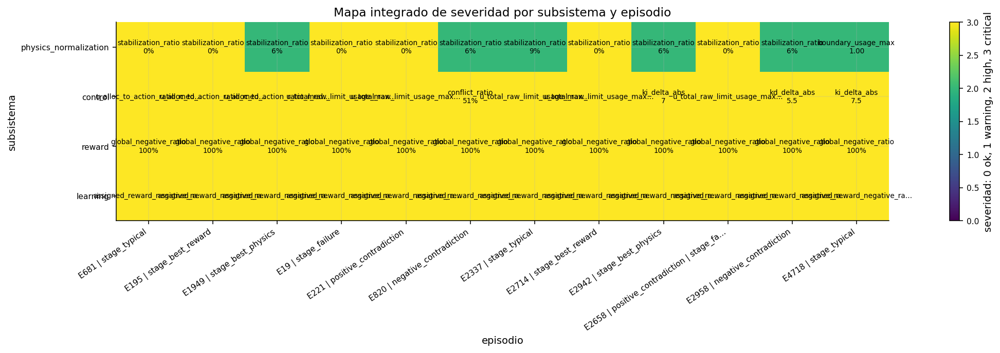

### Matriz de severidad por subsistema

episode_id,681,195,1949,19,221,820,2337,2714,2942,2658,2958,4718
subsystem,,,,,,,,,,,,
physics_normalization,3.0,3.0,2.0,3.0,3.0,2.0,2.0,3.0,2.0,3.0,2.0,2.0
control,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0
reward,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0
learning,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0


In [149]:
# ---------------------------------------------------------------------
# 9.3 — Figura 1: severidad por subsistema y episodio
# ---------------------------------------------------------------------
# Editar SOLO esta caja para controlar qué se ve.
# ---------------------------------------------------------------------

SYNTHESIS_SUBSYSTEM_EPISODE_IDS = SECTION9_EPISODE_IDS

SYNTHESIS_SUBSYSTEMS = [
    "physics_normalization",
    "control",
    "reward",
    "learning",
]

SYNTHESIS_SUBSYSTEM_TITLE = (
    "Mapa integrado de severidad por subsistema y episodio"
)


section9_subsystem_severity_matrix_df = s9_plot_subsystem_severity_map(
    evidence_df=section9_evidence_df,
    episode_ids=SYNTHESIS_SUBSYSTEM_EPISODE_IDS,
    subsystems=SYNTHESIS_SUBSYSTEMS,
    representative_episodes_df=representative_episodes_df,
    title=SYNTHESIS_SUBSYSTEM_TITLE,
    save_as=None,
)

display(Markdown("### Matriz de severidad por subsistema"))
display(section9_subsystem_severity_matrix_df)

### 9.4 Figura 2: mapa integrado de hipótesis

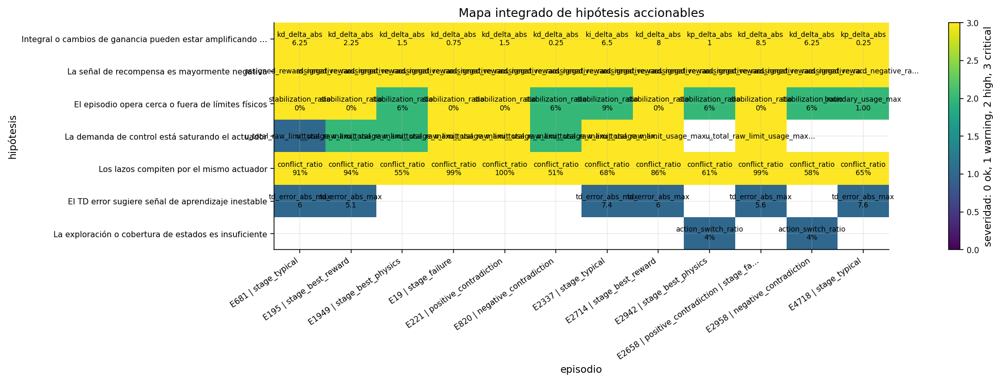

### Matriz de hipótesis

episode_id,681,195,1949,19,221,820,2337,2714,2942,2658,2958,4718
hypothesis_id,,,,,,,,,,,,
H05_integral_or_gain_instability,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0
H08_reward_mostly_negative,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0
H01_physical_limit_or_initial_condition,3.0,3.0,2.0,3.0,3.0,2.0,2.0,3.0,2.0,3.0,2.0,2.0
H03_control_saturation,1.0,2.0,2.0,3.0,3.0,2.0,3.0,3.0,NaN,3.0,NaN,NaN
H04_loop_conflict,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0
H09_unstable_learning_signal,1.0,1.0,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN,1.0
H10_low_exploration_or_low_state_coverage,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN


In [150]:
# ---------------------------------------------------------------------
# 9.4 — Figura 2: mapa de hipótesis accionables
# ---------------------------------------------------------------------
# Editar SOLO esta caja para controlar qué hipótesis y episodios se ven.
# ---------------------------------------------------------------------

SYNTHESIS_HYPOTHESIS_EPISODE_IDS = SECTION9_EPISODE_IDS

SYNTHESIS_HYPOTHESIS_IDS = [
    # Dejar vacío para graficar todas las hipótesis activas.
]

if not SYNTHESIS_HYPOTHESIS_IDS:
    SYNTHESIS_HYPOTHESIS_IDS = None

SYNTHESIS_HYPOTHESIS_TITLE = (
    "Mapa integrado de hipótesis accionables"
)


section9_hypothesis_matrix_df = s9_plot_hypothesis_map(
    hypothesis_evidence_df=section9_hypothesis_evidence_df,
    hypothesis_ids=SYNTHESIS_HYPOTHESIS_IDS,
    episode_ids=SYNTHESIS_HYPOTHESIS_EPISODE_IDS,
    representative_episodes_df=representative_episodes_df,
    title=SYNTHESIS_HYPOTHESIS_TITLE,
    save_as=None,
)

display(Markdown("### Matriz de hipótesis"))
display(section9_hypothesis_matrix_df)

### 9.5 Tabla final de decisión técnica

In [151]:
# ---------------------------------------------------------------------
# 9.5 — Tabla final de decisión técnica
# ---------------------------------------------------------------------
# Editar SOLO esta caja para filtrar recomendaciones.
# ---------------------------------------------------------------------

MIN_SEVERITY_LABEL_TO_SHOW = [
    "critical",
    "high",
    "warning",
]

ADJUSTMENT_GROUPS_TO_SHOW = [
    # Dejar vacío para mostrar todos.
    # "reward shaping",
    # "control / actuador",
    # "normalización de estado",
]

MAX_RECOMMENDATIONS_TO_SHOW = 25


section9_decision_table_df = section9_recommendation_df.copy()

section9_decision_table_df = section9_decision_table_df.loc[
    section9_decision_table_df["severity_label"].isin(MIN_SEVERITY_LABEL_TO_SHOW)
].copy()

if ADJUSTMENT_GROUPS_TO_SHOW:
    section9_decision_table_df = section9_decision_table_df.loc[
        section9_decision_table_df["adjustment_group"].isin(ADJUSTMENT_GROUPS_TO_SHOW)
    ].copy()

section9_decision_table_df = (
    section9_decision_table_df
    .sort_values(["max_severity", "evidence_count"], ascending=[False, False])
    .head(MAX_RECOMMENDATIONS_TO_SHOW)
    .reset_index(drop=True)
)


display(Markdown("### Tabla final de decisión técnica"))

display(
    section9_decision_table_df[
        [
            "severity_label",
            "hypothesis_id",
            "hypothesis_label",
            "adjustment_group",
            "recommended_adjustment",
            "next_probe",
            "episodes",
            "subsystems",
            "top_evidence",
            "evidence_count",
        ]
    ]
)

### Tabla final de decisión técnica

,severity_label,hypothesis_id,hypothesis_label,adjustment_group,recommended_adjustment,next_probe,episodes,subsystems,top_evidence,evidence_count
0,critical,H08_reward_mostly_negative,La señal de recompensa es mayormente negativa,escala de reward,"Revisar escala, clipping, offset o balance entre castigos y bonus.",Comparar reward asignado por agente con TD error.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718","learning, reward",learning:kd_cart_position:assigned_reward_negative_ratio=100% (critical) | learning:kp_cart_position:assigned_reward_negative_ratio=100% (critical) | learning:kp_pendulum_angle...,84
1,critical,H05_integral_or_gain_instability,Integral o cambios de ganancia pueden estar amplificando la respuesta,PID / anti-windup / rangos de ganancia,"Revisar Ki, anti-windup, delta_gain y límites min/max de agentes PID.",Graficar integral_error_* junto con saturación y acciones RL.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718",control,control:cart_position:kd_delta_abs=0.75 (critical) | control:pendulum_angle:ki_delta_abs=5.75 (critical) | control:cart_position:ki_delta_abs=1 (critical),69
2,critical,H04_loop_conflict,Los lazos compiten por el mismo actuador,control / coordinación,Revisar balance entre control de péndulo y carro; ajustar pesos por lazo o reward coordinativo.,Comparar u_conflict_pendulum_angle vs u_conflict_cart_position y reward coordinativo.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718",control,control:cart_position:conflict_ratio=99% (critical) | control:cart_position:conflict_ratio=55% (critical) | control:cart_position:u_conflict_abs_mean=0.767 (critical),40
3,critical,H01_physical_limit_or_initial_condition,El episodio opera cerca o fuera de límites físicos,sistema físico / condiciones de término,"Revisar condiciones iniciales, límites de término, objetivo de estabilización y pesos asociados a error físico.",Abrir trayectorias raw del estado que domina la alerta y contrastar con límite/setpoint.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718",physics_normalization,physics_normalization:pendulum_angle:stabilization_ratio=0% (critical) | physics_normalization:pendulum_angle:stabilization_ratio=0% (critical) | physics_normalization:pendulum...,32
4,critical,H03_control_saturation,La demanda de control está saturando el actuador,control / actuador,"Reducir agresividad de ganancias/rangos de acción, revisar límites globales y penalización L_u.",Mirar u_total_raw vs u_total_saturated y sombreado de saturación en Sección 6.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714",control,control:cart_position:u_total_raw_limit_usage_max=5.32 (critical) | control:pendulum_angle:u_total_raw_limit_usage_max=5.32 (critical) | control:pendulum_angle:u_total_raw_limi...,32
5,warning,H09_unstable_learning_signal,El TD error sugiere señal de aprendizaje inestable,RL / reward scale,"Revisar escala de reward, learning_rate, discount_factor y estabilidad de transición.",Mirar reward_* vs td_error_* por agente en Sección 8.,"195, 681, 2337, 2658, 2714, 4718",learning,learning:kp_pendulum_angle:td_error_abs_max=5.1 (warning) | learning:ki_cart_position:td_error_abs_max=6 (warning) | learning:kp_cart_position:td_error_abs_max=6.1 (warning),15
6,warning,H10_low_exploration_or_low_state_coverage,La exploración o cobertura de estados es insuficiente,RL / exploración / discretización,"Revisar epsilon decay, bins, state_vars del agente y duración de entrenamiento.",Contrastar epsilon/learning_rate con cobertura y diversidad de acciones.,"2942, 2958",learning,learning:ki_cart_position:action_switch_ratio=4% (warning) | learning:ki_pendulum_angle:action_switch_ratio=4% (warning),2


### 9.6 Cierre ejecutivo del notebook

In [152]:
# ---------------------------------------------------------------------
# 9.6 — Cierre ejecutivo del notebook
# ---------------------------------------------------------------------
# Esta celda deja listas las salidas finales del notebook.
# ---------------------------------------------------------------------

SECTION9_OUTPUTS = {
    "section9_evidence_df": "registro integrado de evidencia por episodio, subsistema, entidad y métrica",
    "section9_hypothesis_evidence_df": "evidencia mapeada a hipótesis accionables",
    "section9_hypothesis_summary_df": "resumen agregado de hipótesis por severidad y evidencia",
    "section9_recommendation_df": "recomendaciones accionables completas",
    "section9_subsystem_severity_matrix_df": "matriz de severidad por subsistema y episodio",
    "section9_hypothesis_matrix_df": "matriz de severidad por hipótesis y episodio",
    "section9_decision_table_df": "tabla final filtrada para decisión técnica",
}

display(Markdown("### Salidas finales de la Sección 9"))
display(
    pd.DataFrame([
        {"object": key, "description": value}
        for key, value in SECTION9_OUTPUTS.items()
    ])
)

display(Markdown("### Hipótesis priorizadas"))
display(section9_decision_table_df)

display(Markdown("### Lectura final recomendada"))
if section9_decision_table_df.empty:
    display(Markdown("No hay hipótesis con severidad suficiente bajo los filtros actuales. Revisar umbrales o episodios seleccionados."))
else:
    top = section9_decision_table_df.iloc[0]
    display(Markdown(
        f"**Hipótesis prioritaria:** `{top['hypothesis_id']}` — {top['hypothesis_label']}  \n"
        f"**Grupo de ajuste:** {top['adjustment_group']}  \n"
        f"**Ajuste candidato:** {top['recommended_adjustment']}  \n"
        f"**Siguiente prueba:** {top['next_probe']}"
    ))

### Salidas finales de la Sección 9

,object,description
0,section9_evidence_df,"registro integrado de evidencia por episodio, subsistema, entidad y métrica"
1,section9_hypothesis_evidence_df,evidencia mapeada a hipótesis accionables
2,section9_hypothesis_summary_df,resumen agregado de hipótesis por severidad y evidencia
3,section9_recommendation_df,recomendaciones accionables completas
4,section9_subsystem_severity_matrix_df,matriz de severidad por subsistema y episodio
5,section9_hypothesis_matrix_df,matriz de severidad por hipótesis y episodio
6,section9_decision_table_df,tabla final filtrada para decisión técnica


### Hipótesis priorizadas

,severity_label,hypothesis_id,hypothesis_label,adjustment_group,recommended_adjustment,next_probe,episodes,subsystems,top_evidence,evidence_count,max_severity
0,critical,H08_reward_mostly_negative,La señal de recompensa es mayormente negativa,escala de reward,"Revisar escala, clipping, offset o balance entre castigos y bonus.",Comparar reward asignado por agente con TD error.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718","learning, reward",learning:kd_cart_position:assigned_reward_negative_ratio=100% (critical) | learning:kp_cart_position:assigned_reward_negative_ratio=100% (critical) | learning:kp_pendulum_angle...,84,3.0
1,critical,H05_integral_or_gain_instability,Integral o cambios de ganancia pueden estar amplificando la respuesta,PID / anti-windup / rangos de ganancia,"Revisar Ki, anti-windup, delta_gain y límites min/max de agentes PID.",Graficar integral_error_* junto con saturación y acciones RL.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718",control,control:cart_position:kd_delta_abs=0.75 (critical) | control:pendulum_angle:ki_delta_abs=5.75 (critical) | control:cart_position:ki_delta_abs=1 (critical),69,3.0
2,critical,H04_loop_conflict,Los lazos compiten por el mismo actuador,control / coordinación,Revisar balance entre control de péndulo y carro; ajustar pesos por lazo o reward coordinativo.,Comparar u_conflict_pendulum_angle vs u_conflict_cart_position y reward coordinativo.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718",control,control:cart_position:conflict_ratio=99% (critical) | control:cart_position:conflict_ratio=55% (critical) | control:cart_position:u_conflict_abs_mean=0.767 (critical),40,3.0
3,critical,H01_physical_limit_or_initial_condition,El episodio opera cerca o fuera de límites físicos,sistema físico / condiciones de término,"Revisar condiciones iniciales, límites de término, objetivo de estabilización y pesos asociados a error físico.",Abrir trayectorias raw del estado que domina la alerta y contrastar con límite/setpoint.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714, 2942, 2958, 4718",physics_normalization,physics_normalization:pendulum_angle:stabilization_ratio=0% (critical) | physics_normalization:pendulum_angle:stabilization_ratio=0% (critical) | physics_normalization:pendulum...,32,3.0
4,critical,H03_control_saturation,La demanda de control está saturando el actuador,control / actuador,"Reducir agresividad de ganancias/rangos de acción, revisar límites globales y penalización L_u.",Mirar u_total_raw vs u_total_saturated y sombreado de saturación en Sección 6.,"19, 195, 221, 681, 820, 1949, 2337, 2658, 2714",control,control:cart_position:u_total_raw_limit_usage_max=5.32 (critical) | control:pendulum_angle:u_total_raw_limit_usage_max=5.32 (critical) | control:pendulum_angle:u_total_raw_limi...,32,3.0
5,warning,H09_unstable_learning_signal,El TD error sugiere señal de aprendizaje inestable,RL / reward scale,"Revisar escala de reward, learning_rate, discount_factor y estabilidad de transición.",Mirar reward_* vs td_error_* por agente en Sección 8.,"195, 681, 2337, 2658, 2714, 4718",learning,learning:kp_pendulum_angle:td_error_abs_max=5.1 (warning) | learning:ki_cart_position:td_error_abs_max=6 (warning) | learning:kp_cart_position:td_error_abs_max=6.1 (warning),15,1.0
6,warning,H10_low_exploration_or_low_state_coverage,La exploración o cobertura de estados es insuficiente,RL / exploración / discretización,"Revisar epsilon decay, bins, state_vars del agente y duración de entrenamiento.",Contrastar epsilon/learning_rate con cobertura y diversidad de acciones.,"2942, 2958",learning,learning:ki_cart_position:action_switch_ratio=4% (warning) | learning:ki_pendulum_angle:action_switch_ratio=4% (warning),2,1.0


### Lectura final recomendada

**Hipótesis prioritaria:** `H08_reward_mostly_negative` — La señal de recompensa es mayormente negativa  
**Grupo de ajuste:** escala de reward  
**Ajuste candidato:** Revisar escala, clipping, offset o balance entre castigos y bonus.  
**Siguiente prueba:** Comparar reward asignado por agente con TD error.